# Week 4 - Classification

This week, we shift from gathering human textual classifications through crowdsourcing, to using machine learning models and algorithms that train on those human classifications and extend them to documents far too numerous to read. If you recall, *clustering* allows us to stably partition text data (e.g., documents, turns of conversation) according to all patterns of covariation among available text features. *Classification*, by contrast, partitions text data according to only those features and their variation that enable us to mimic and extrapolate human annotations.

In this notebook, we will show how to use a variety of classification methods, including Naïve Bayes, Logistic regression, K-nearest neighbor, decision trees and random forests, support vector machines and even a simple neural network, the perceptron. We will also demonstrate ensemble techniques that can link several such methods into a single, more accurate, classification pipeline. We will finally learn to use conventions and metrics to evaluate classifier performance on out-of-sample data. 

For this notebook we will be using the following packages.

In [2]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud #pip install -U git+git://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git

#All these packages need to be installed from pip
#For ML
import sklearn
import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition

import numpy as np #arrays
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn #Makes plots look nice, also heatmaps
import scipy as sp #for interp

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas
import requests
import json
import math

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

# Simple Simulated Examples

Here we create a sandbox for you to explore different types of classified data and how different statistical classifiers perform on each type.

## Generating example data

We start by loading one of the "cartoon" or simplified data sets and then dividing it into training and testing sets. To maximize our ability to visualize, each dataset involves two classes, colored yellow and blue, arrayed along two dimensions (`x` and `y`). 

The four data patterns include: 
+ `random` in which the two classes are randomly distributed across both dimensions
+ `andSplit` in which the two classes are linearly split along one of two dimensions (e.g., men like Adidas)
+ `xorSplit` in which the two classes are split, oppositely, along each dimension (e.g., old ladies and young men like Nikes)
+ `targetSplit` in which one class is nested within the other in two dimensions (e.g., middle aged, middle income people like vintage Mustangs)
+ `multiBlobs` in which 5 classes are placed as bivariate Gaussians at random locations

`noise` is a variable [0-1] that ranges from no noise in the prescribed pattern [0] to complete noise/randomness [1].

Uncomment (remove the # in front of) each dataset, one at a time, and then run the cell and subsequent cells to examine how each machine learning approach captures each pattern.

In [2]:
noise = .2

# dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.random())
# dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise))
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise)) #Please try this one
# dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise))
# dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise))

We can easily visualize the rendered datasets because they are generated in two dimensions.

Let's see what dfTrain, a simulated data that we just made, looks like

In [3]:
dfTrain

,vect,category
720,"[0.5152525167076841, -1.3510907238003056]",0
522,"[0.6346658167371988, -0.9143704676166224]",0
806,"[0.6622646637394372, -0.869320011408967]",0
69,"[0.2938895297143925, 0.3471552535389481]",1
394,"[0.30686576117114495, -1.120449996418244]",0
...,...,...
384,"[0.08327302295967376, -0.19359137220851394]",0
837,"[-0.8024516377725623, -0.3255628457129298]",1
227,"[0.020169322020711172, 0.6946044429084548]",1
539,"[-1.09934655869808, -1.231617369478669]",1


So, dfTrain has two columns, vect and category. 

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


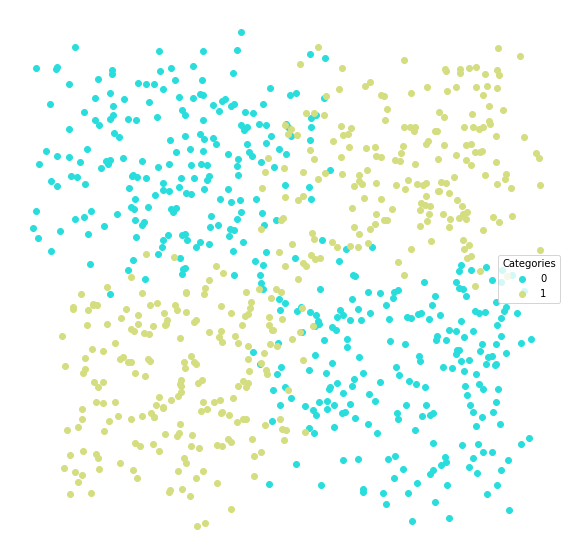

In [4]:
lucem_illud.plotter(dfTrain)

## Training a Machine Learning algorithm

We can now pick a model, there are many more options in `scikit-learn`. These are just a few examples, which array along the machine learning "tribes" described in Pedro Domingos _The Master Algorithm_.

Uncomment (remove the # in front of) each algorithm one at a time, then run the cell and subsequent cells to evaluate how it learns to understand the data.

In [34]:
#Bayes
#clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

In [38]:
# clf: classifier
type(clf)

sklearn.neighbors._classification.KNeighborsClassifier

We're using sklearn here. What is sklearn? It's an open source machine learning library for Python. We use sklearn because it features various machine learning algorithms and it works well with NumPy library. You don't need to understand the sklearn package in detail for the moment, but let's see what methods and attributes sklearn has, because we're going to use some of them:

In [33]:
dir(sklearn)

['__SKLEARN_SETUP__',
 '__all__',
 '__builtins__',
 '__cached__',
 '__check_build',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '_config',
 '_distributor_init',
 '_loss',
 'base',
 'clone',
 'config_context',
 'datasets',
 'decomposition',
 'dummy',
 'ensemble',
 'exceptions',
 'externals',
 'feature_extraction',
 'get_config',
 'linear_model',
 'logger',
 'logging',
 'metrics',
 'model_selection',
 'naive_bayes',
 'neighbors',
 'neural_network',
 'os',
 'preprocessing',
 'random',
 'set_config',
 'setup_module',
 'show_versions',
 'svm',
 'sys',
 'tree',
 'utils']

Now we fit the model by giving it our training data

In [35]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

KNeighborsClassifier(weights='distance')

Here, "stack" function is used. Why did we use stack function here? This is because dfTrain['vect'] is a sequence, while clf.fit() takes an array element. Let's see what dfTrain['vect'] looks like:

In [36]:
dfTrain['vect']

494     [0.28912503353965147, -0.9173889223610685]
718      [0.5269629954072643, -0.9418959692688323]
360       [0.6512233488458488, -1.176100932784576]
343     [-0.7082661216430453, -1.0357503206664578]
473        [0.51790242910544, 0.37485373976615083]
                          ...                     
183     [-0.6674769324758137, -0.7989508674367147]
867       [0.5652046250250726, 0.7047989361875546]
387    [-0.45766460881332083, -0.4622123774767673]
39     [0.37600479769982226, 0.037209134894180915]
774     [-0.5137469368572577, 0.10558873364303212]
Name: vect, Length: 800, dtype: object

And let's see what np.stack(dfTrain['vect']) does:

In [37]:
np.stack(dfTrain['vect'])

array([[ 0.28912503, -0.91738892],
       [ 0.526963  , -0.94189597],
       [ 0.65122335, -1.17610093],
       ...,
       [-0.45766461, -0.46221238],
       [ 0.3760048 ,  0.03720913],
       [-0.51374694,  0.10558873]])

As you can see, stack function takes a sequence of arrays (which have the same shape) and joins them along a new axis.

## Algorithm evaluation

We can look at few measurements of each classifier's performance by using the testing set

In [39]:
lucem_illud.evaluateClassifier(clf, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.095,0.90401,0.913043,0.862323,0.884211
1,0.095,0.90401,0.898148,0.869718,0.923810


This lets us look at which classes do better:

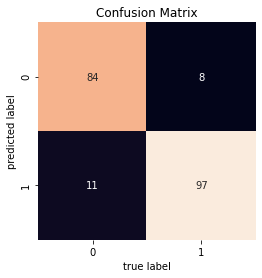

In [40]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

The greater the area under the curve the better.

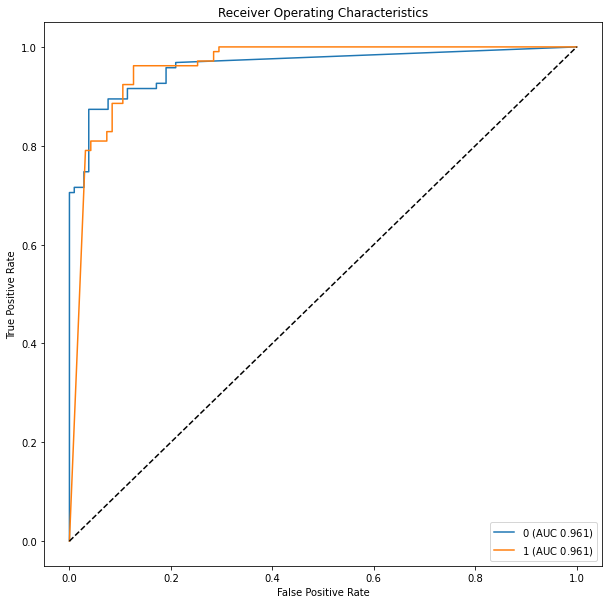

In [41]:
lucem_illud.plotMultiROC(clf, dfTest)

We can also look at the regions the classifer identifies as one class or the other:

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


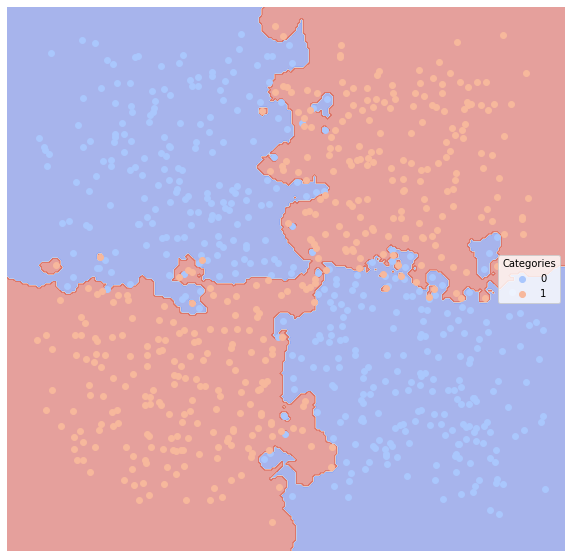

In [42]:
lucem_illud.plotregions(clf, dfTrain)

## Now we do the same for real data

Available data sets include:
+ Reddit threads "classified" by thread topic
+ 20 newsgroups "classified" by group topic
+ Senate press releases "classified" by Senator (2 senators)
+ Senate press releases "classified" by Senator (5 senators)
+ Emails classified as Spam or Ham

In [43]:
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadReddit())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadNewsGroups())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateLarge())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSpam())

Loading Reddit data
Converting to vectors


In [68]:
dfTrain.head(1)

,Unnamed: 0,author,over_18,score,subreddit,text,title,url,category,tokenized_text,normalized_text,vect
878,878,WtheMando,False,213,Weeaboo Tales: stories about the extreme fans ...,Here's the part 2 to this [Story.](https://www...,The weeaboo who claimed to be the best swordsm...,https://www.reddit.com/r/weeabootales/comments...,Weeaboo Tales,"[Here, 's, the, part, 2, to, this, Story.](htt...","[story.](https://www.reddit.com, r, weeabootal...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [71]:
len(dfTrain['tokenized_text'][1])

1054

In [70]:
len(dfTrain['vect'][1])

7519

In [52]:
#Bayes
clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up, but lose ROC
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
#clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

In [54]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

GaussianNB()

In [55]:
type(clf)

sklearn.naive_bayes.GaussianNB

In [56]:
lucem_illud.evaluateClassifier(clf, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Weeaboo Tales,0.172414,0.873761,0.573770,0.559595,0.958904
Relationships,0.166144,0.723683,0.788462,0.521142,0.493976
Bad Roommates,0.147335,0.783634,0.700000,0.538838,0.653333
Tales From Tech Support,0.059561,0.902597,0.960000,0.835611,0.818182


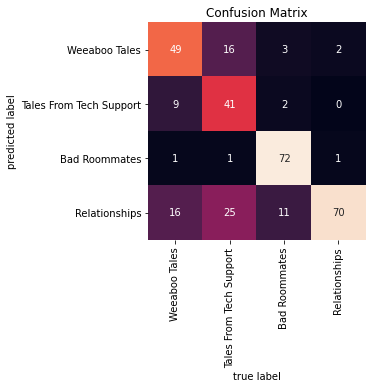

In [72]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

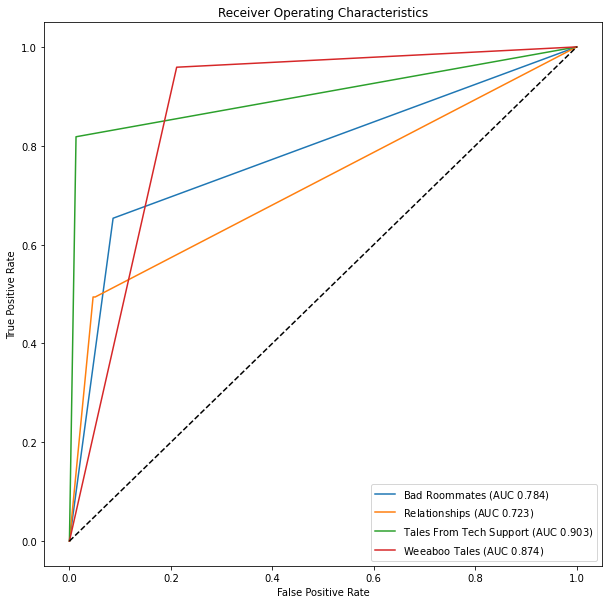

In [73]:
lucem_illud.plotMultiROC(clf, dfTest)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

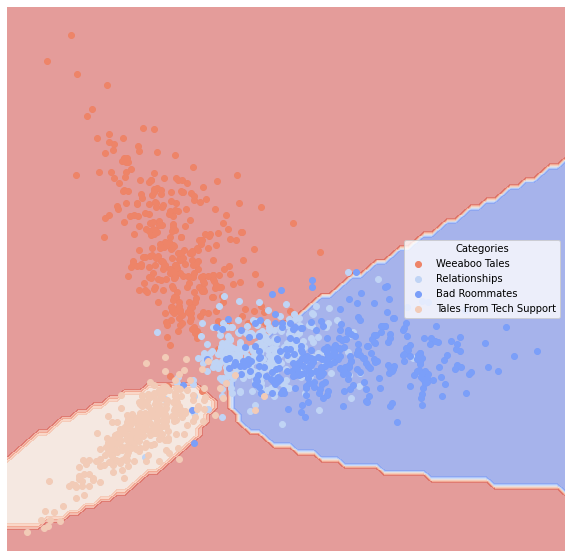

In [74]:
lucem_illud.plotregions(clf, dfTrain)

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Go back through all of the cells above and generate 10 distinct artificial datasets and classify them with all of the available methods. Add a cell immediately below and describe which classifier(s) worked best with which artificially constructed data source and why. Then go through all of the empirical datasets (i.e., Newsgroups, Senate Small, Senate Large, Email Spam) and classify them with all available methods. Add a second cell immediately below and describe which classifier(s) worked best with which data set and why.

<span style="color:red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

### Artificial Dataset

#### first dataset

Naive Bayes


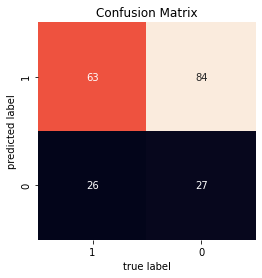

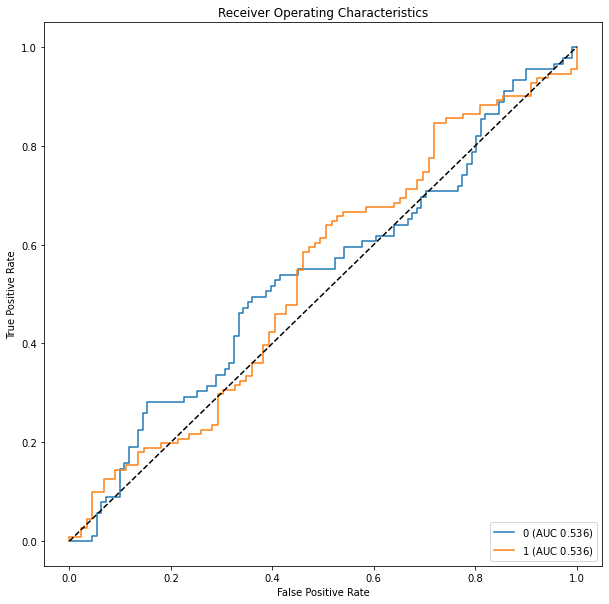

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


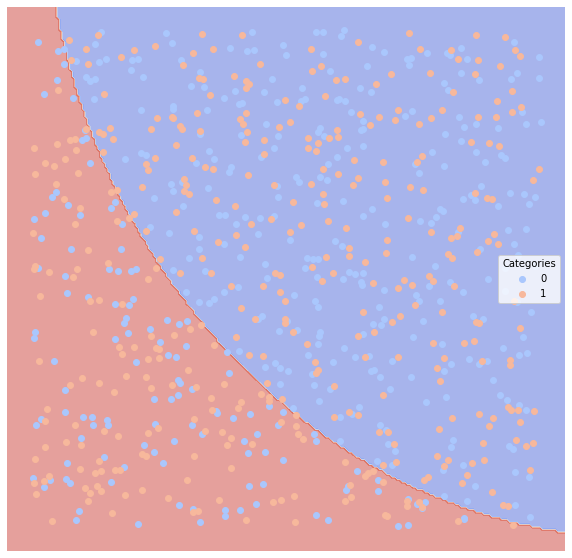

Support Vector Machine: linear


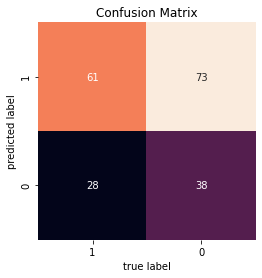

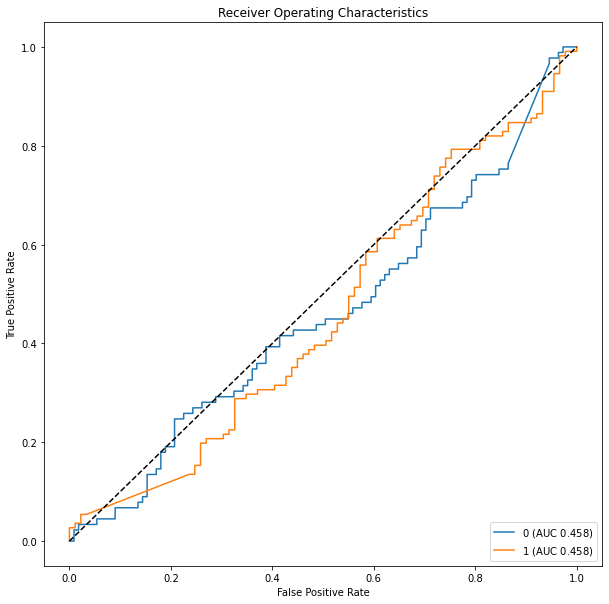

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


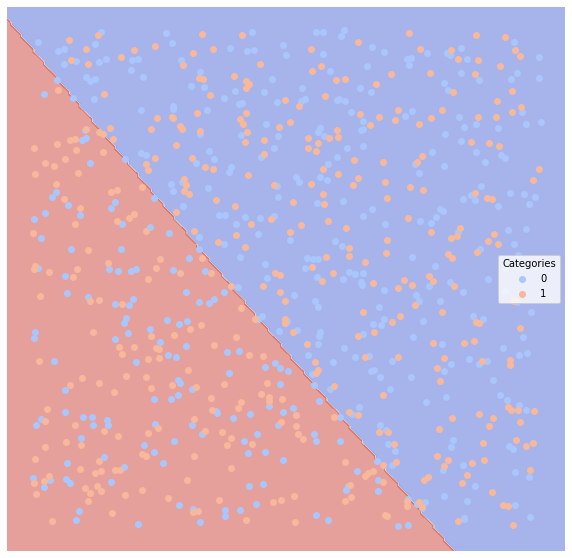

Support Vector Machine: poly


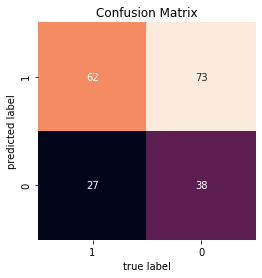

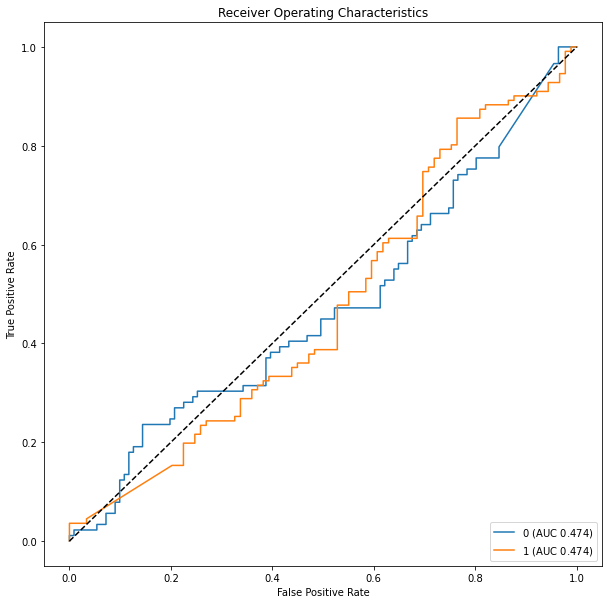

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


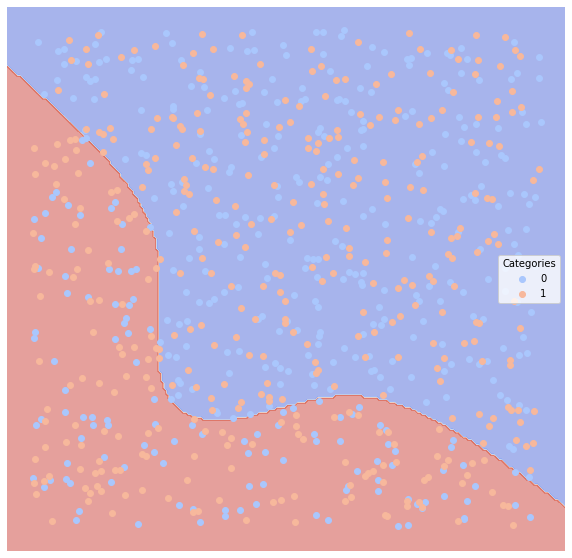

KNN


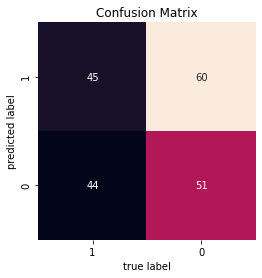

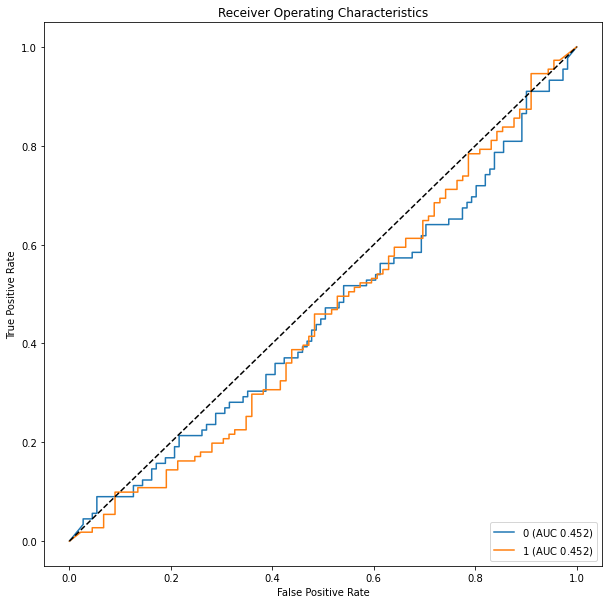

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


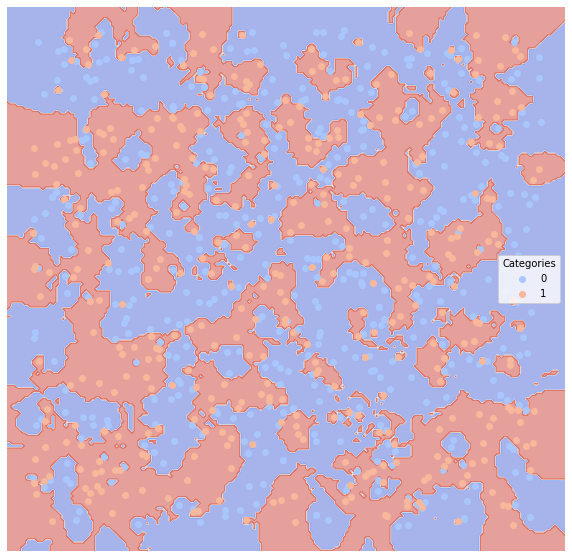

Classic Linear Regression


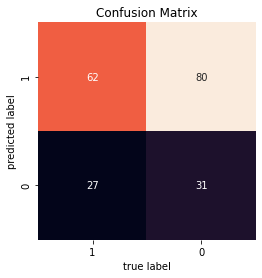

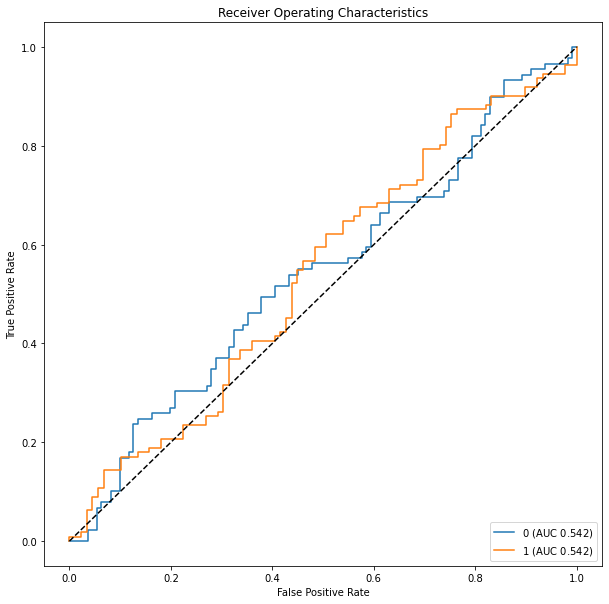

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


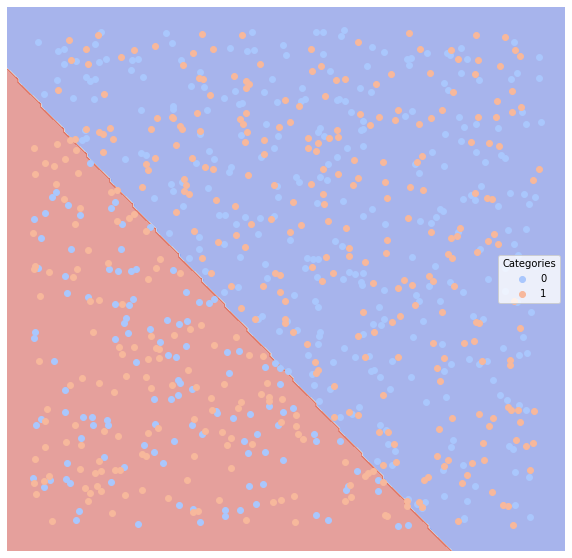

Decision Tree


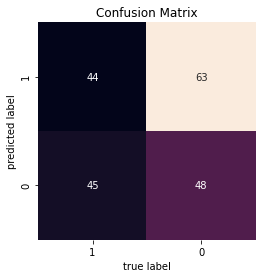

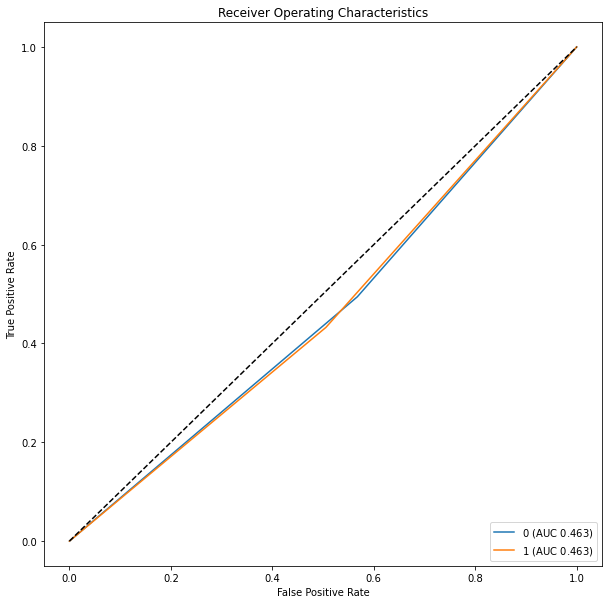

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


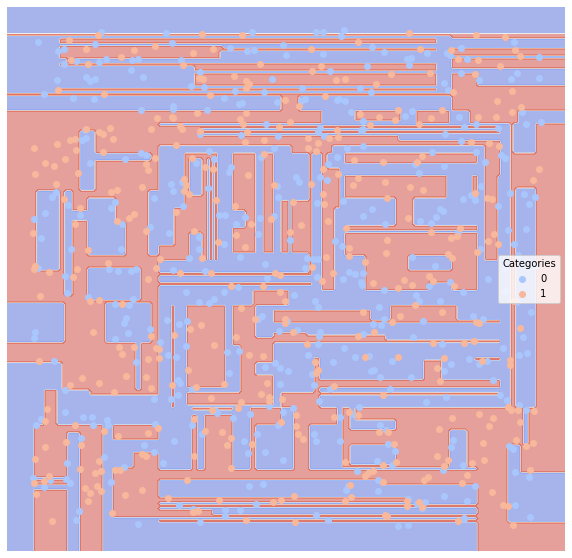

Random Forest


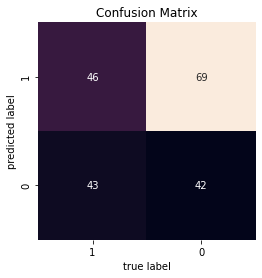

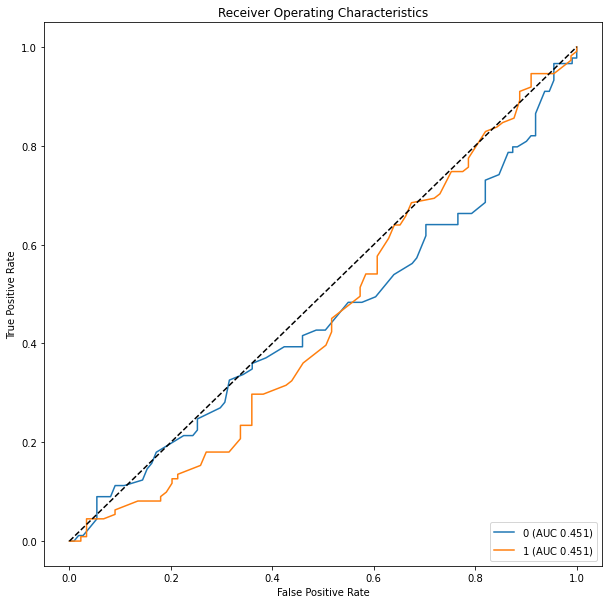

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


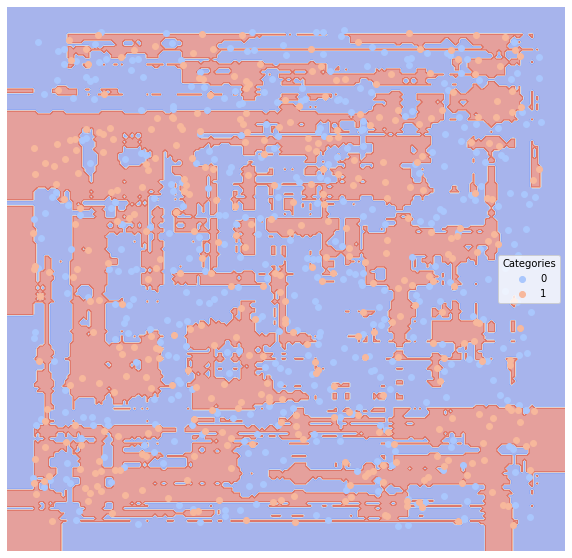

Neural Network


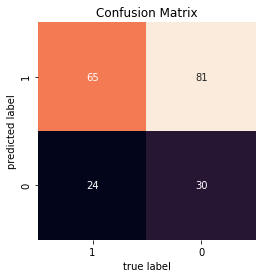

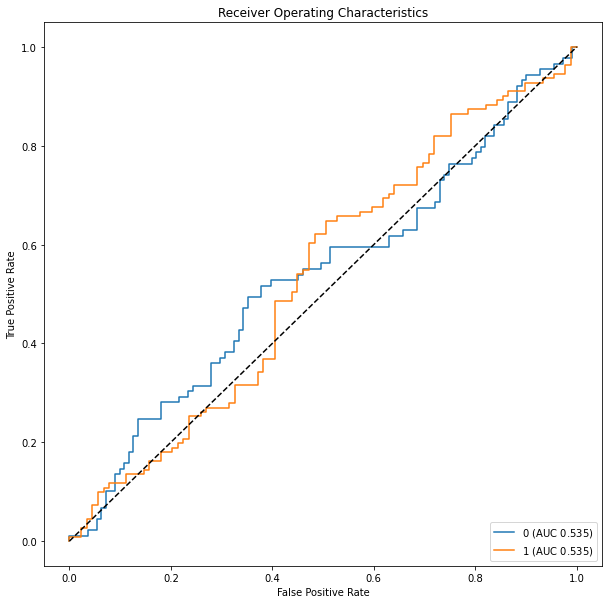

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


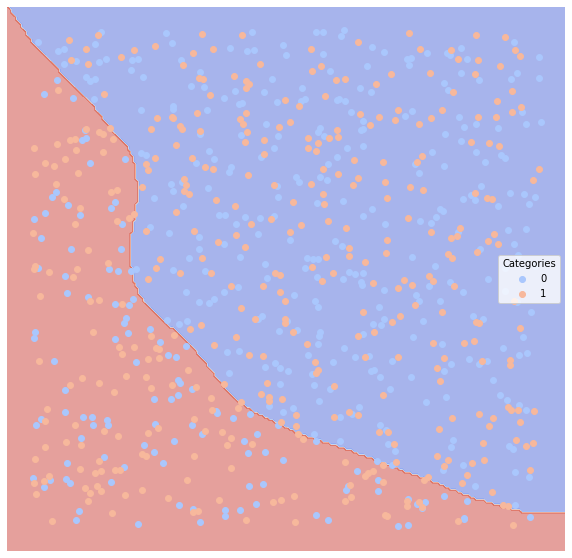

Gradient Boosting


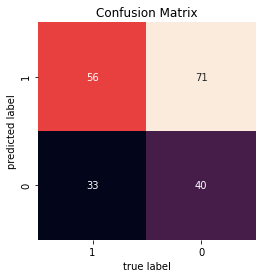

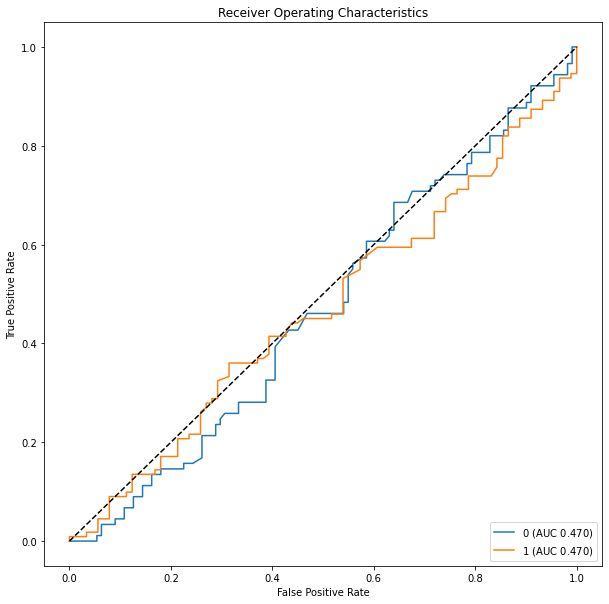

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


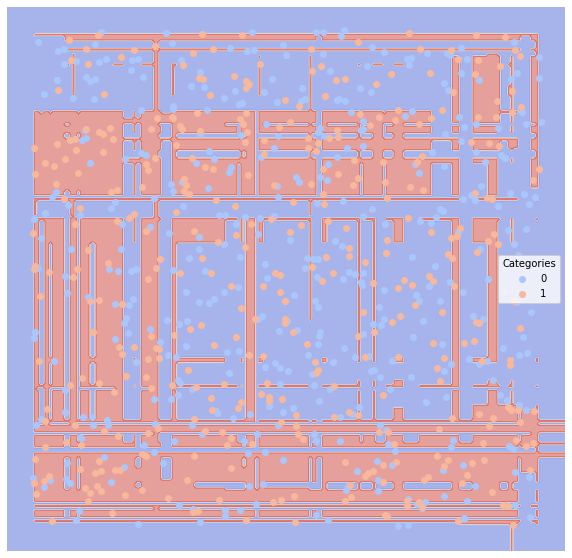

In [77]:
# 1st dataset: randomly generated data
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.random())
#lucem_illud.plotter(dfTrain)

#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

In [100]:
model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 


,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.550,0.475554
1,clf2,SVM-linear,0.505,0.513868
2,clf3,SVM-poly,0.500,0.519486
3,clf4,KNN,0.520,0.482539
4,clf5,Linear Regression,0.535,0.487954
5,clf6,Decision Tree,0.540,0.463407
6,clf7,Random Forest,0.560,0.447616
7,clf8,Neural Network,0.525,0.500304
8,clf9,Gradient Boosting,0.520,0.494787


From those graphs and tables above, we find that all classifiers perform badly, because the data is randomly generated so it's atually hard to distinguish category 1 from category 0. From them, polynomial SVM classifier performs best, but it's AUC is still only 0.5194, only slightly better than a random guess.

#### Second Dataset

Naive Bayes


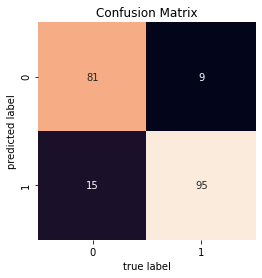

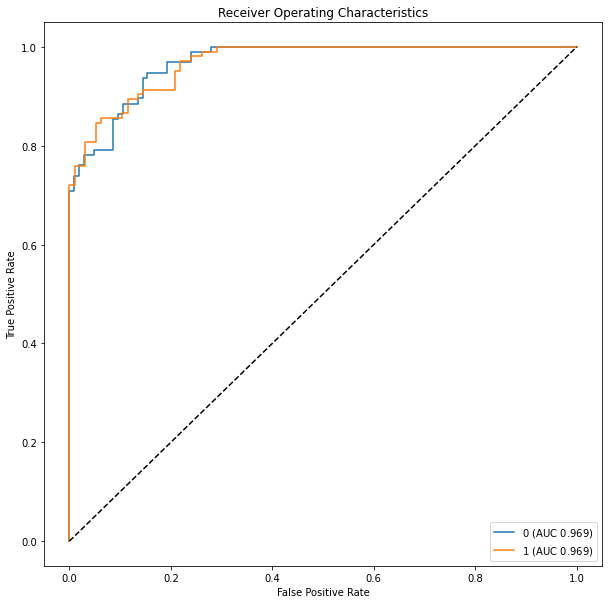

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


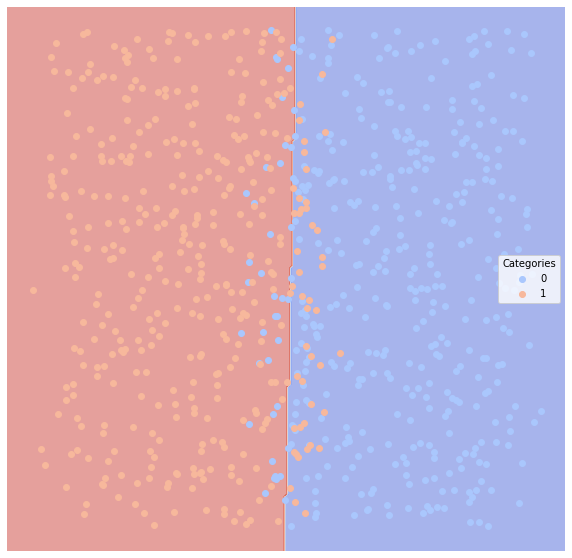

Support Vector Machine: linear


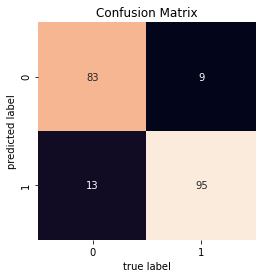

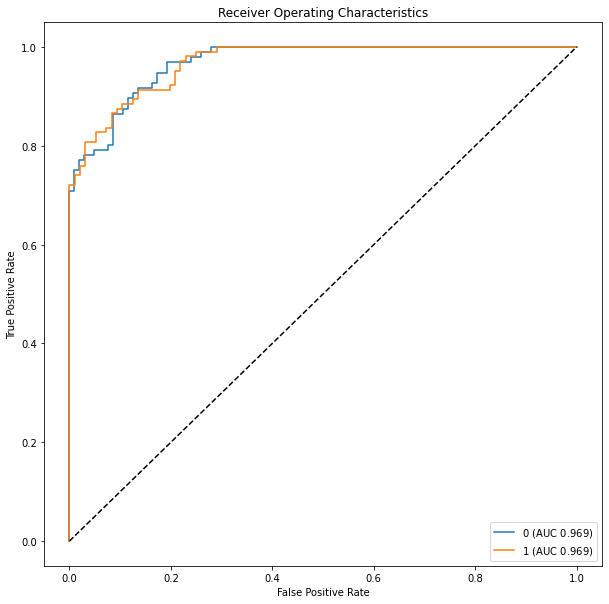

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


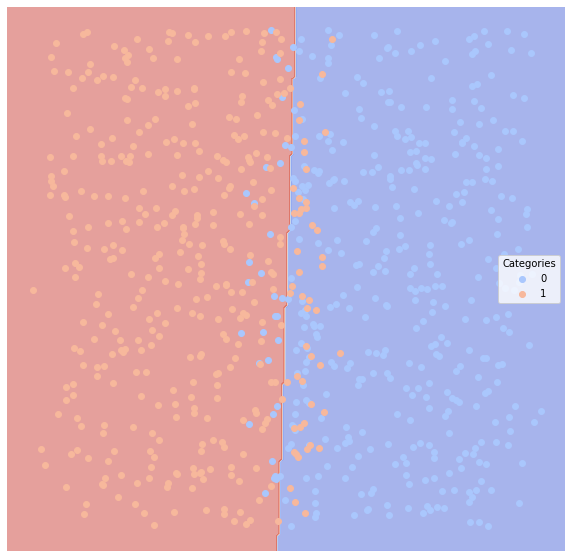

Support Vector Machine: poly


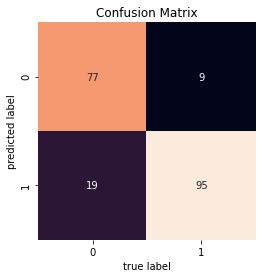

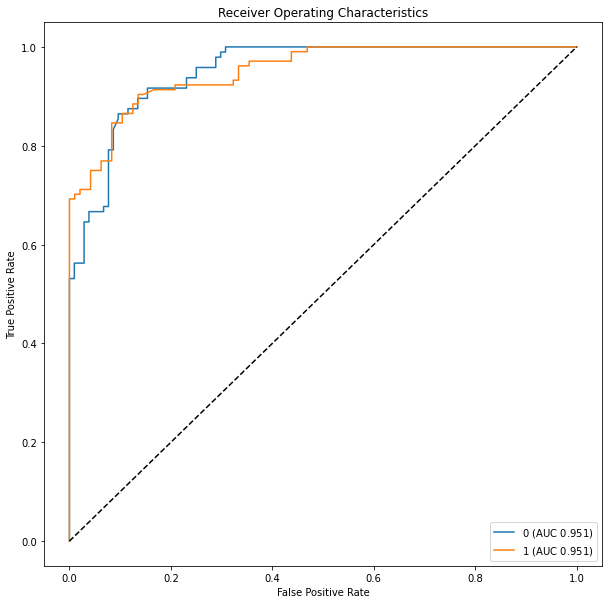

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


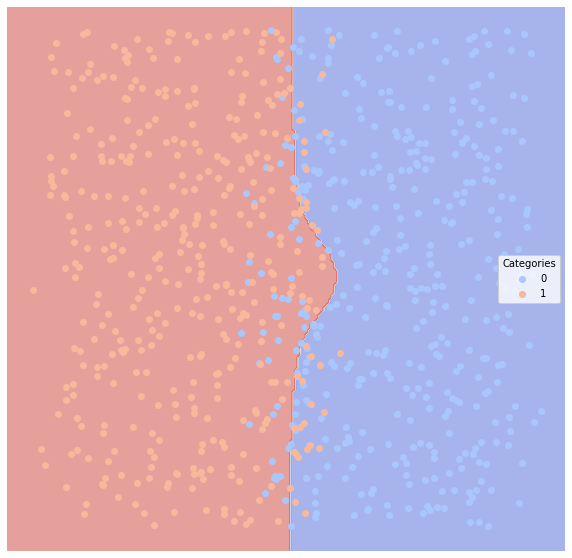

KNN


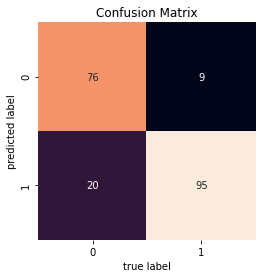

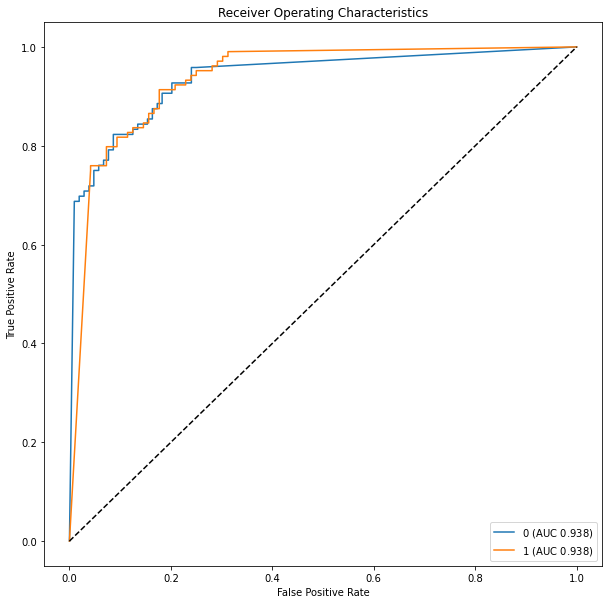

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


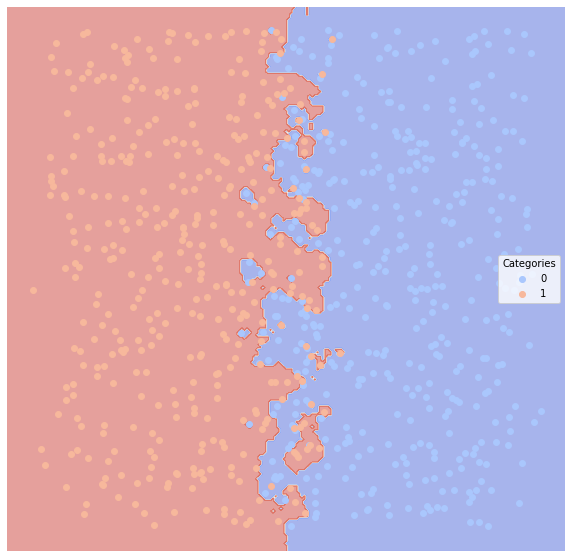

Classic Linear Regression


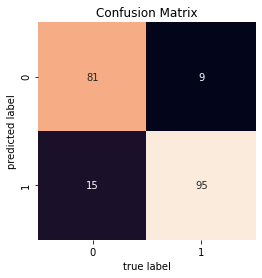

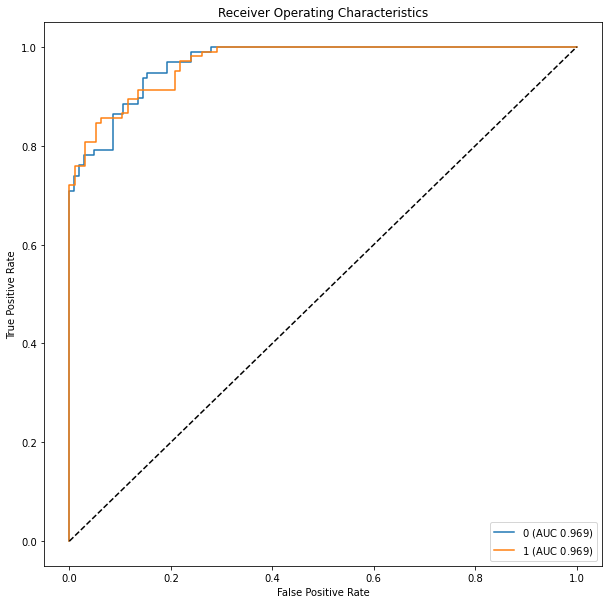

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


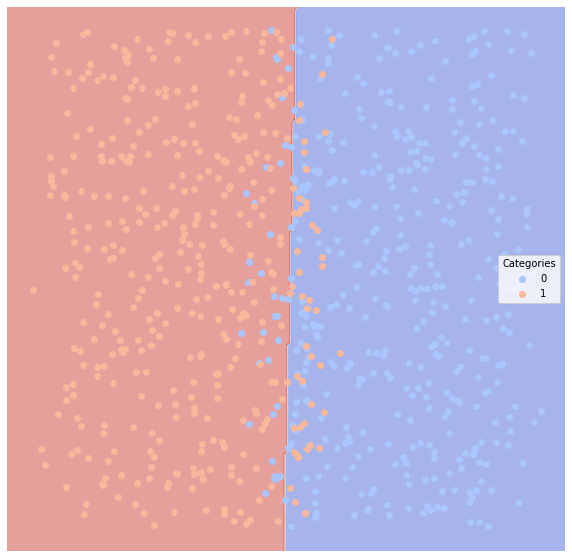

Decision Tree


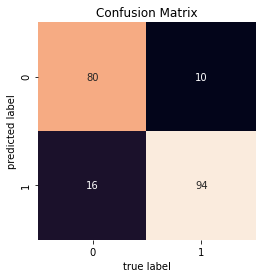

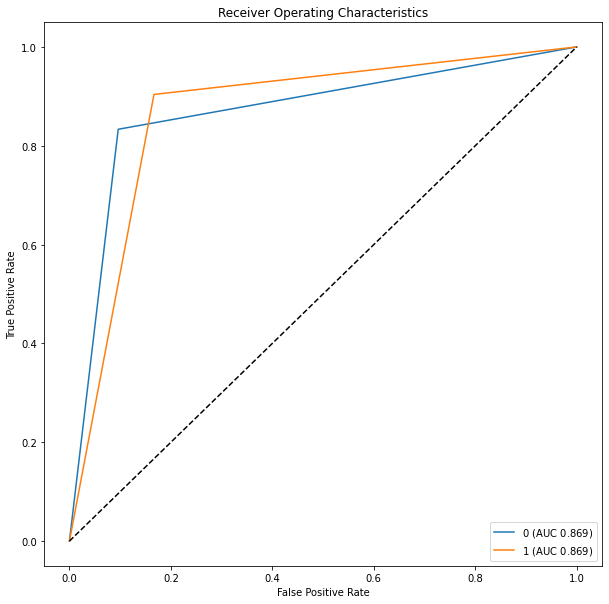

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


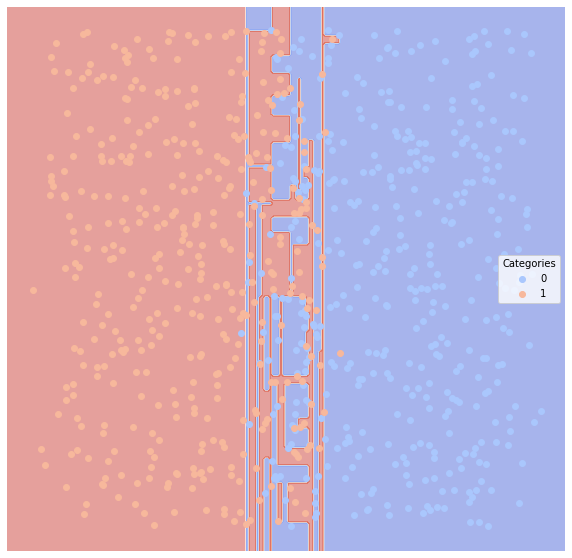

Random Forest


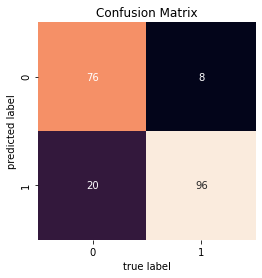

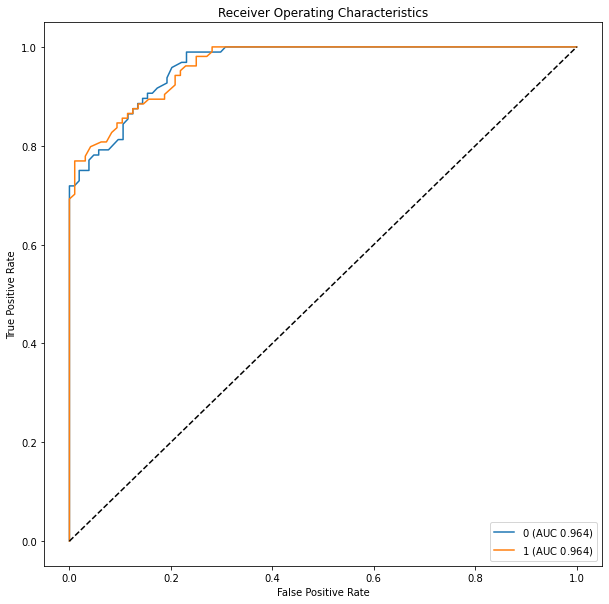

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


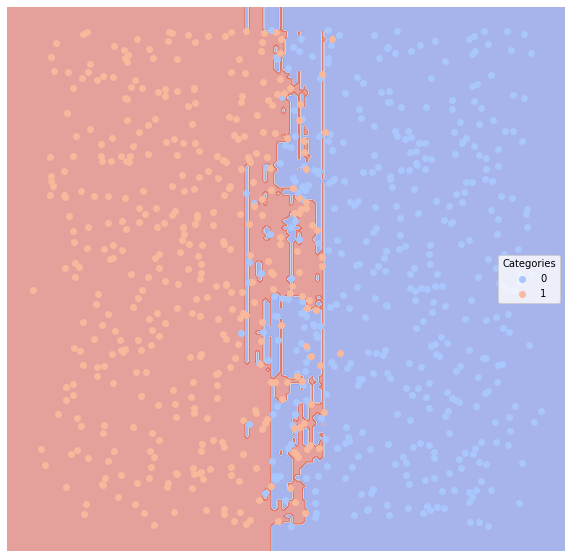

Neural Network


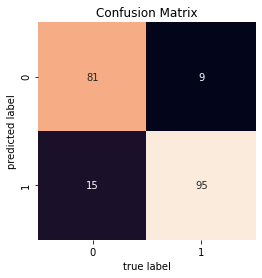

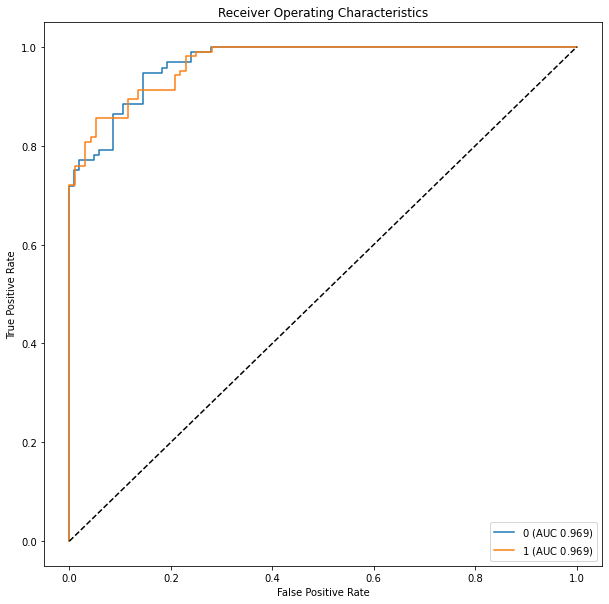

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


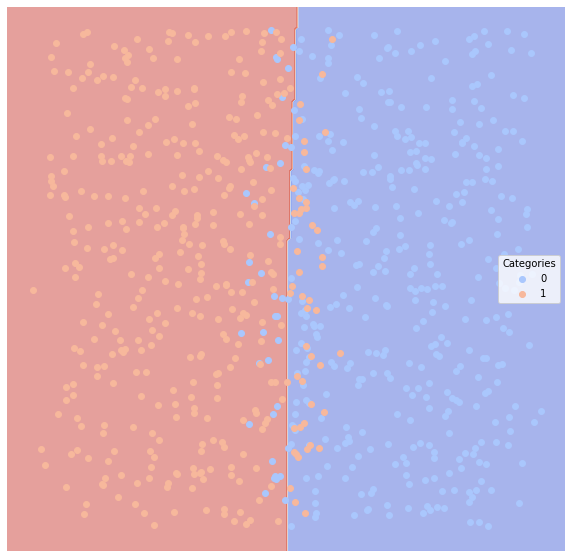

Gradient Boosting


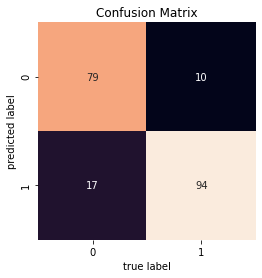

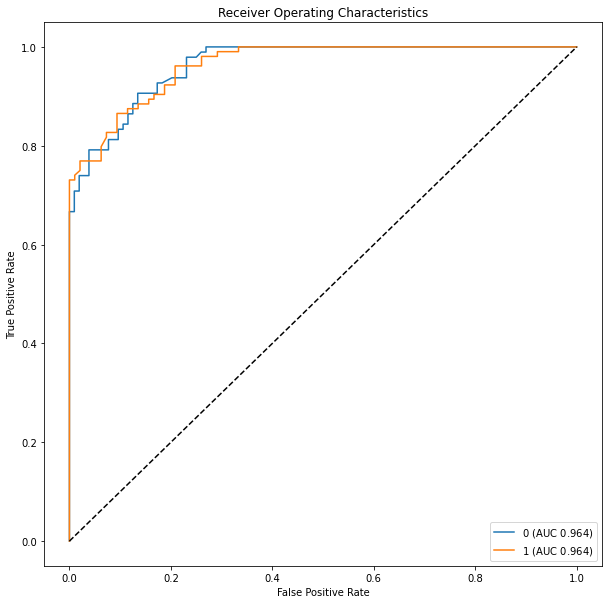

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


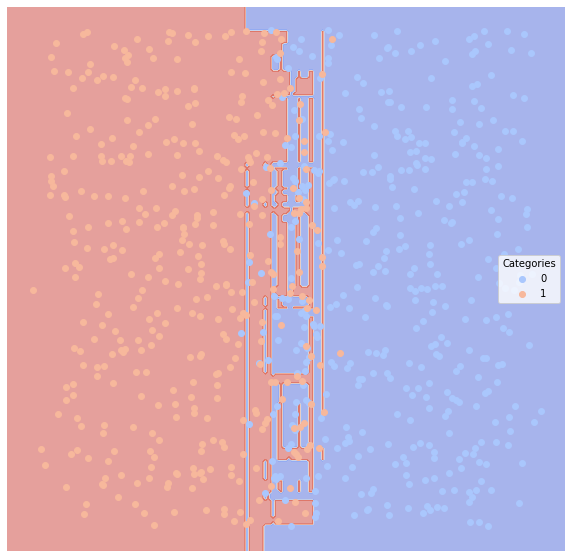

In [101]:
# 2nd dataset
noise = .2
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise))
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

In [102]:
model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.120,0.878606
1,clf2,SVM-linear,0.110,0.889022
2,clf3,SVM-poly,0.140,0.857772
3,clf4,KNN,0.145,0.852564
4,clf5,Linear Regression,0.120,0.878606
5,clf6,Decision Tree,0.130,0.868590
6,clf7,Random Forest,0.140,0.857372
7,clf8,Neural Network,0.120,0.878606
8,clf9,Gradient Boosting,0.135,0.863381


Because this data is generated with a linear boundary. So we find that linear models such as linear SVM or linear regression perform well. Bayes and neural network models also give good classification boundaries.

#### Third Dataset

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


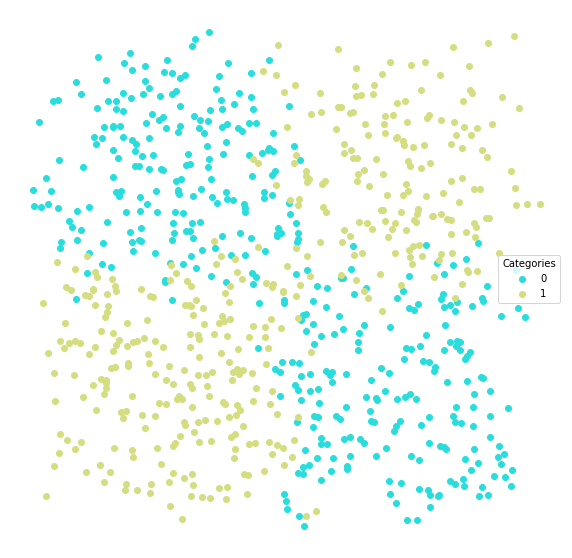

In [105]:
# 3rd dataset
noise = .2
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise)) 
lucem_illud.plotter(dfTrain)

Naive Bayes


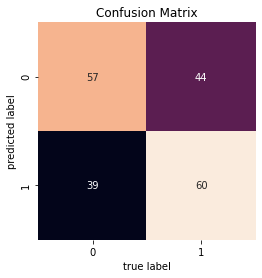

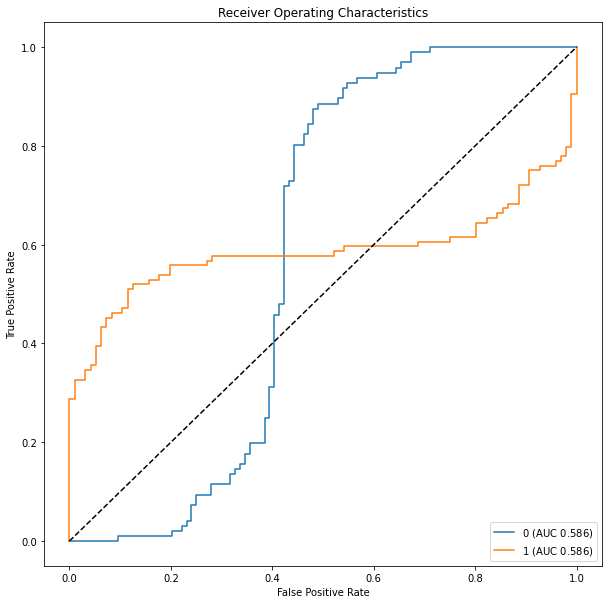

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


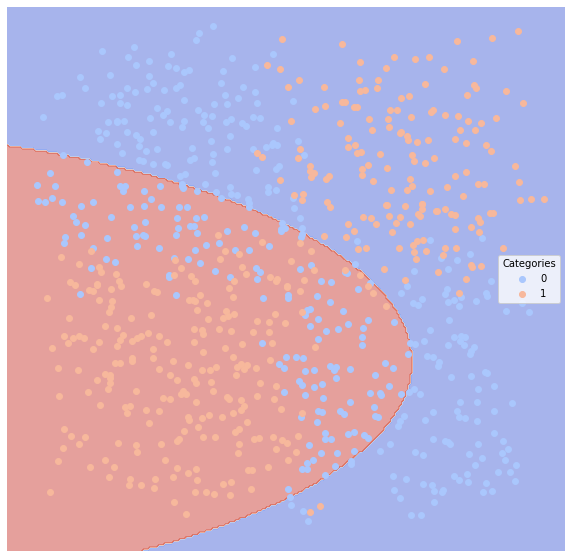

Support Vector Machine: linear


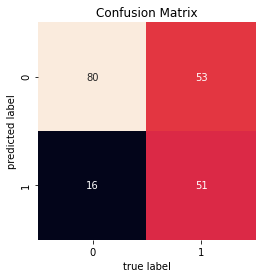

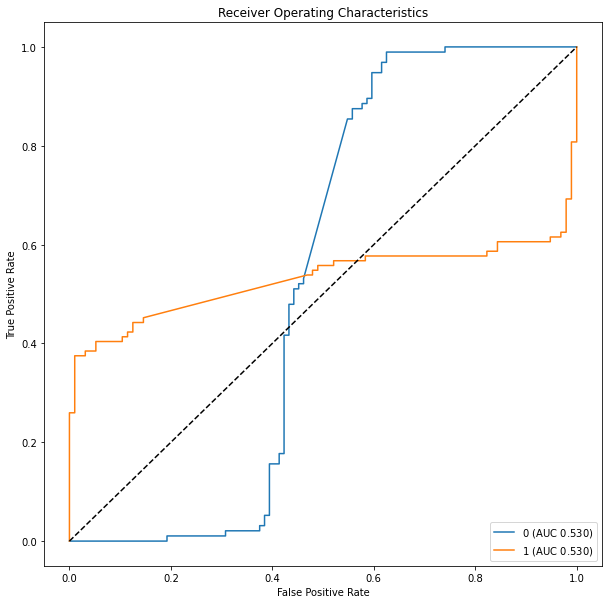

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


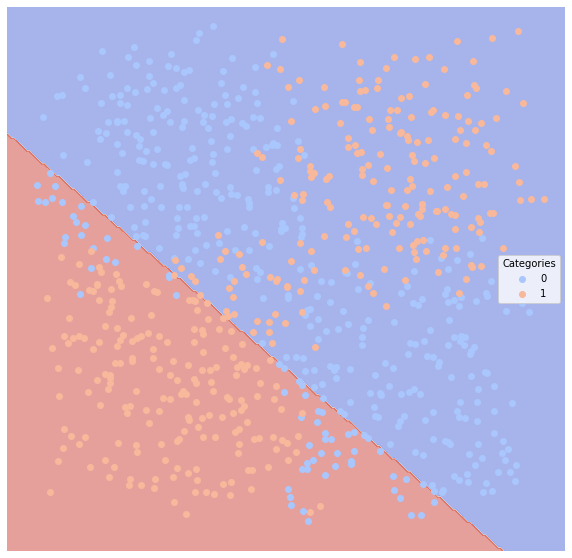

Support Vector Machine: poly


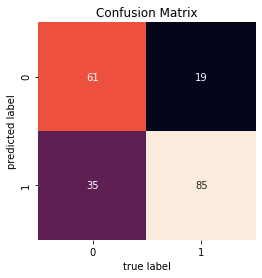

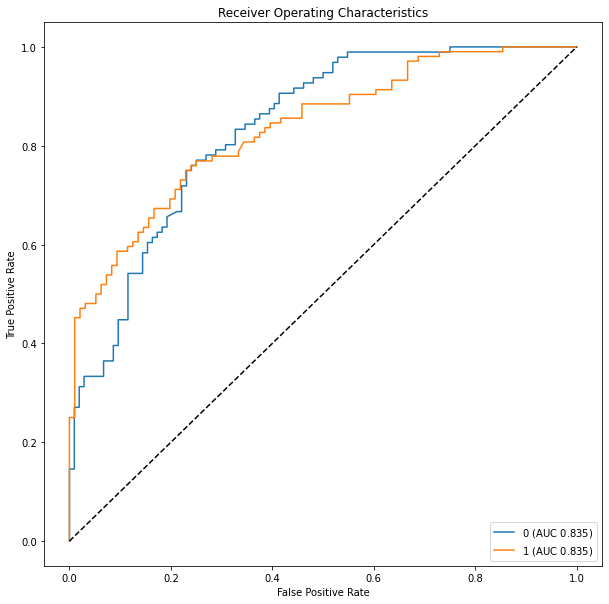

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


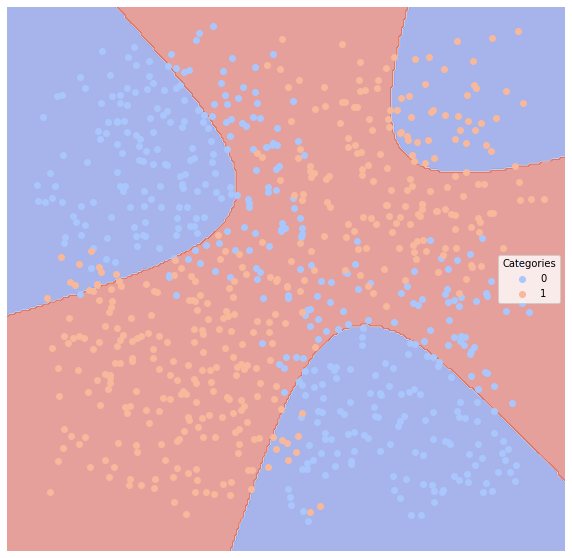

KNN


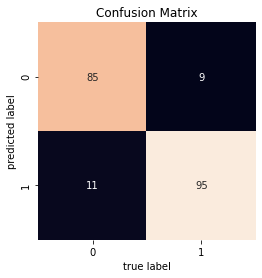

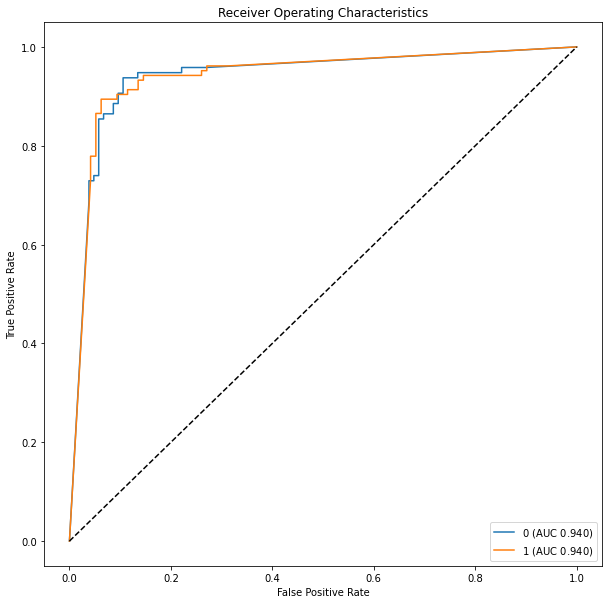

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


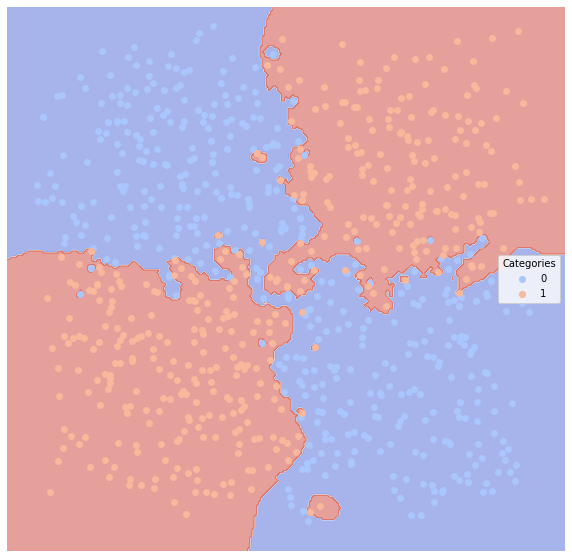

Classic Linear Regression


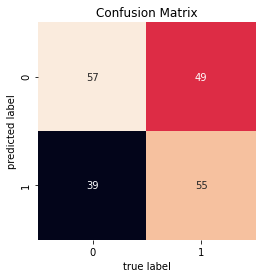

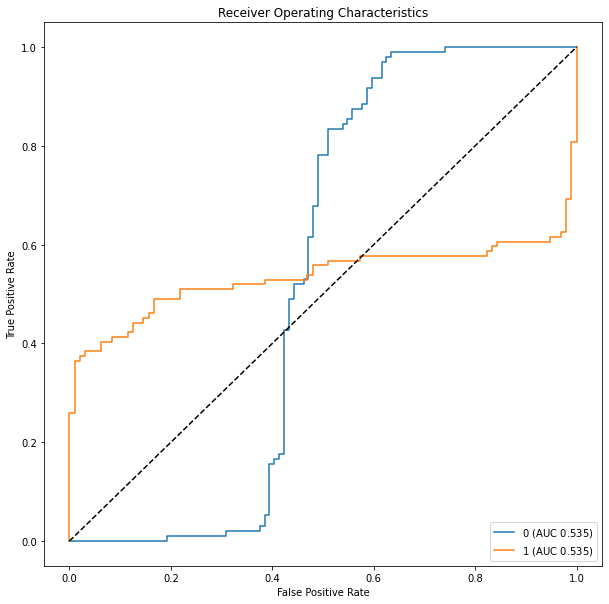

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


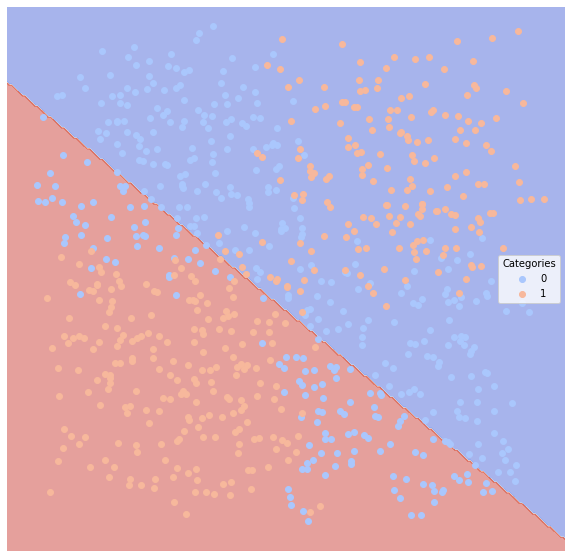

Decision Tree


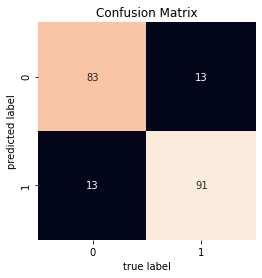

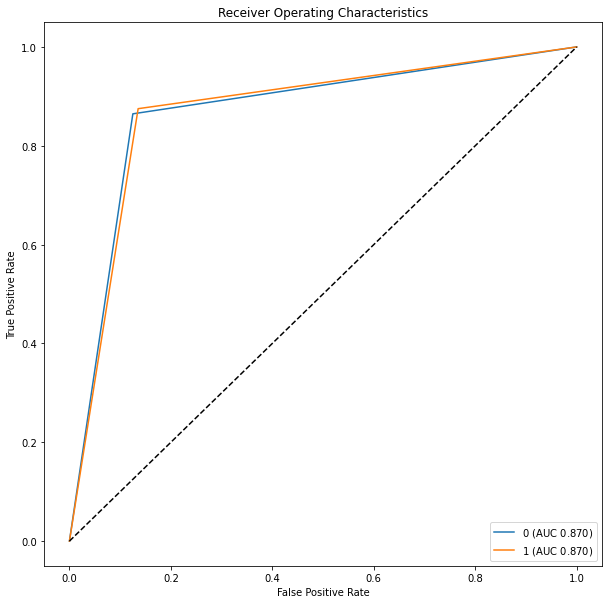

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


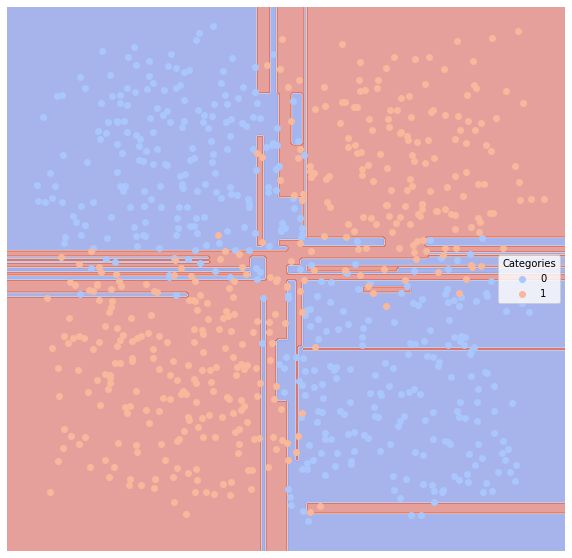

Random Forest


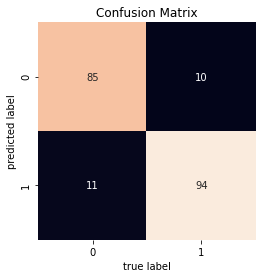

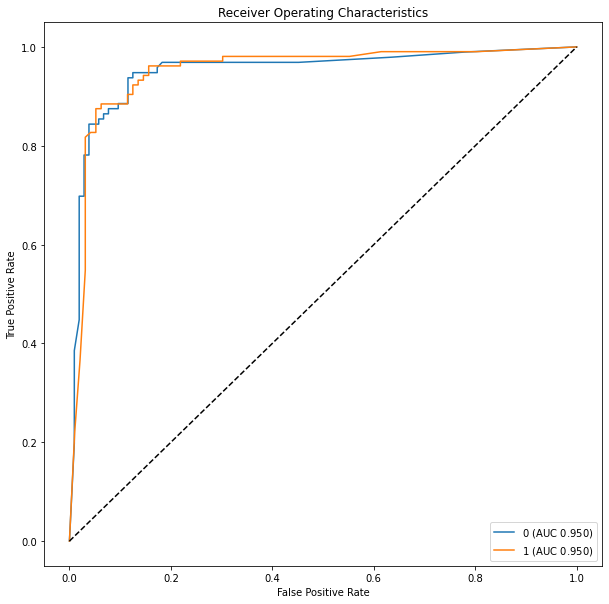

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


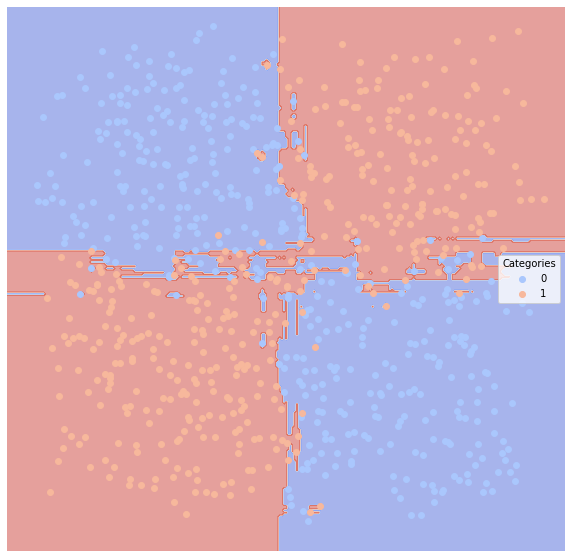

Neural Network


C:\Users\hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


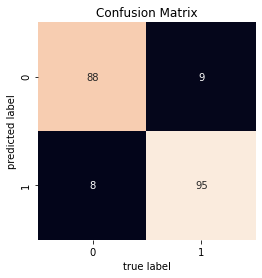

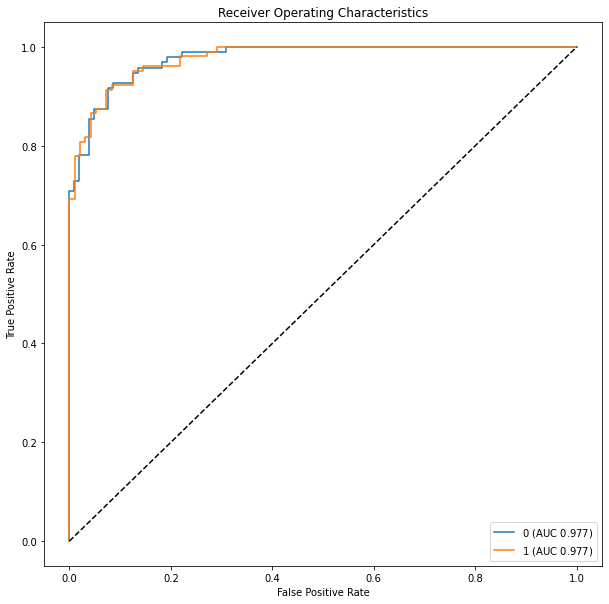

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


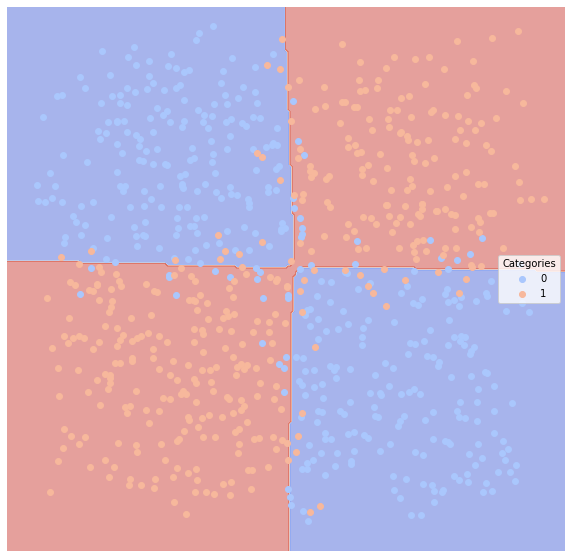

Gradient Boosting


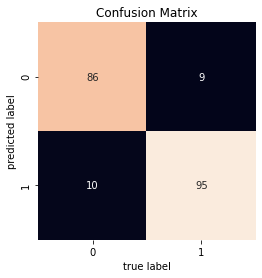

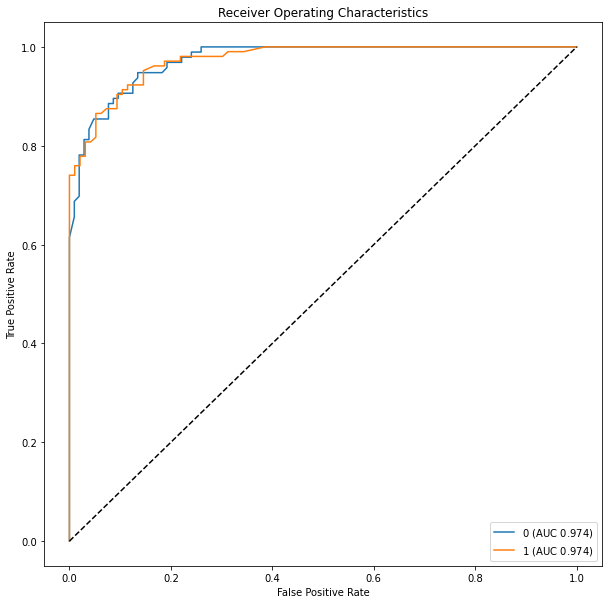

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


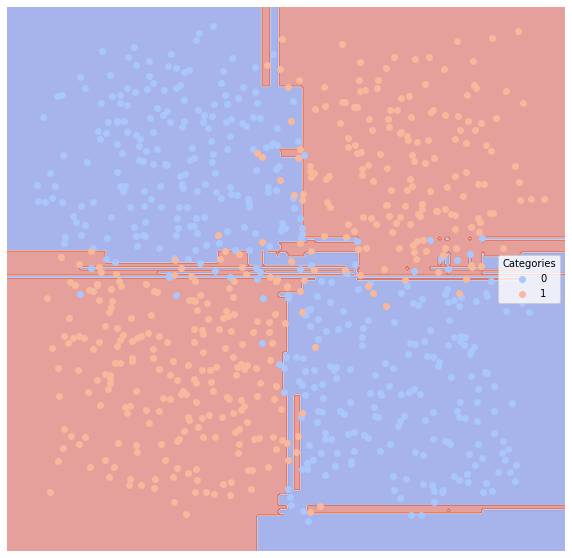

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.415,0.585337
1,clf2,SVM-linear,0.345,0.661859
2,clf3,SVM-poly,0.270,0.726362
3,clf4,KNN,0.100,0.899439
4,clf5,Linear Regression,0.440,0.561298
5,clf6,Decision Tree,0.130,0.869792
6,clf7,Random Forest,0.105,0.894631
7,clf8,Neural Network,0.085,0.915064
8,clf9,Gradient Boosting,0.095,0.904647


In [106]:
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

kNN, decision tree, random forest, neural network, and gradient boosting classifiers are more accurate. Because they are unlinear and more flexible and are able to deal with multiple lines of classification boundaries, while linear regression can only draw a single boundary.

#### Fourth Dataset

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


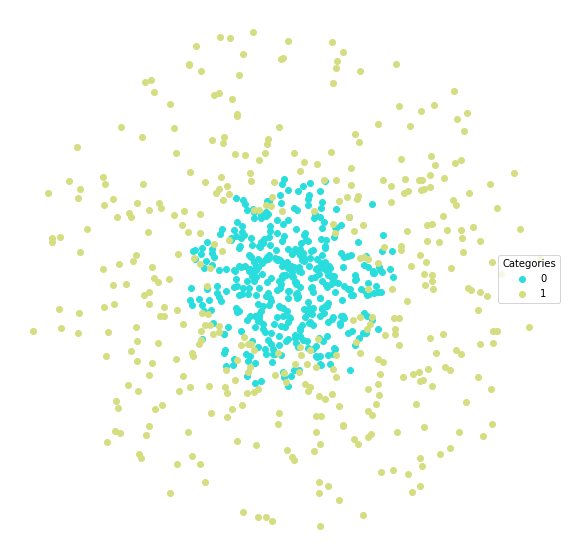

In [109]:
# 4th dataset
noise = .2
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise))
lucem_illud.plotter(dfTrain)

Naive Bayes


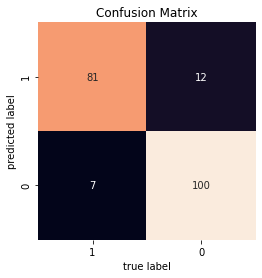

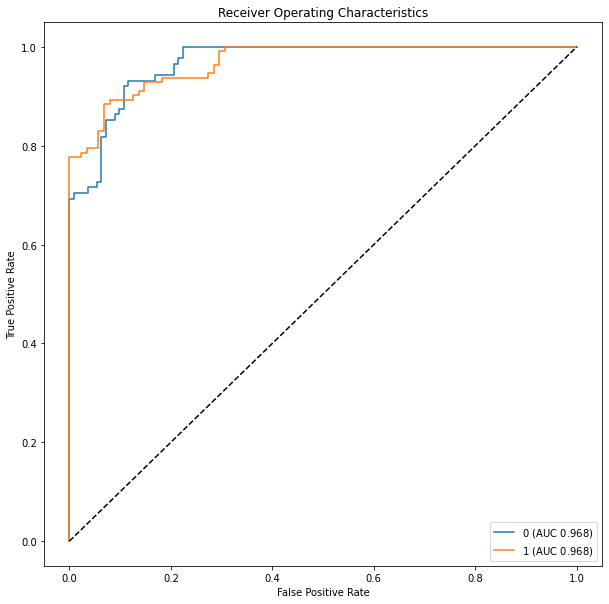

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


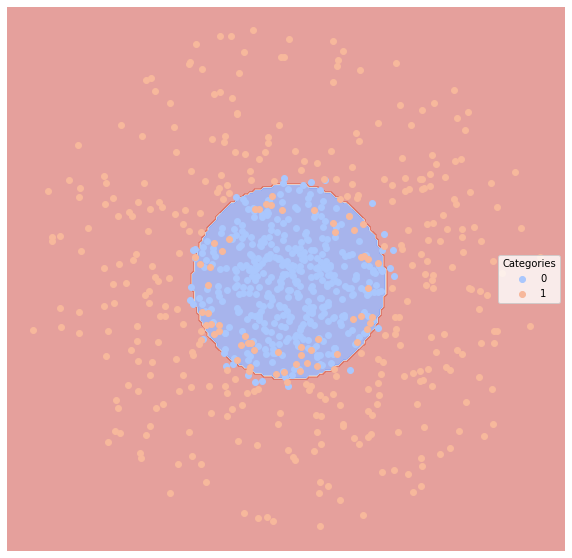

Support Vector Machine: linear


C:\Users\hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


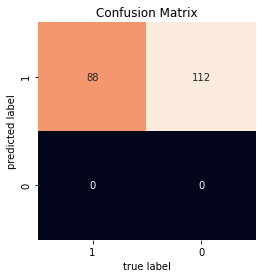

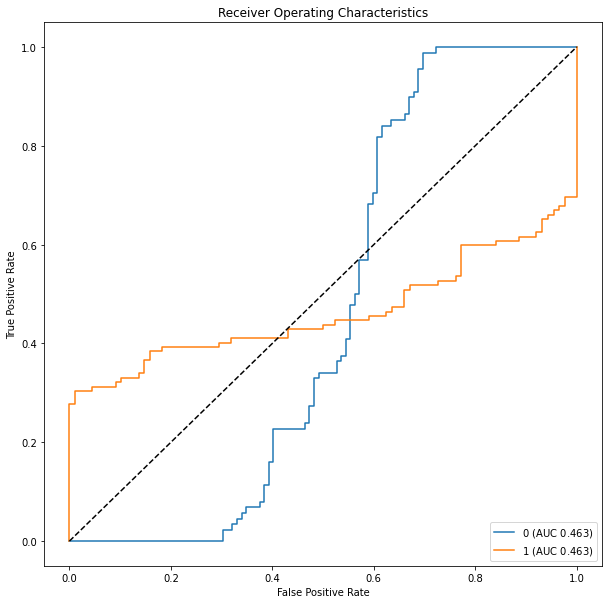

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


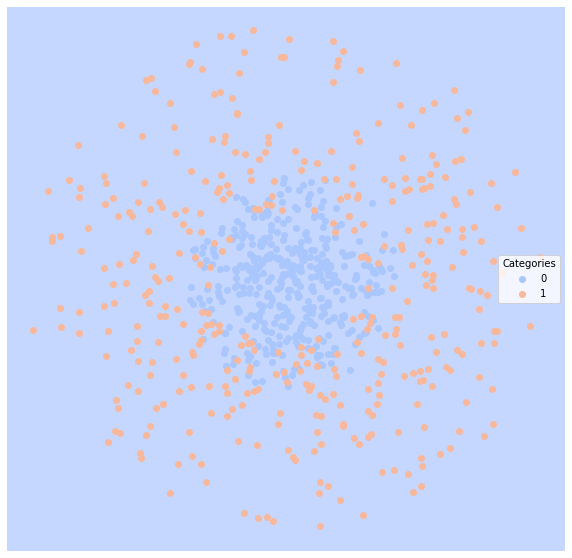

Support Vector Machine: poly


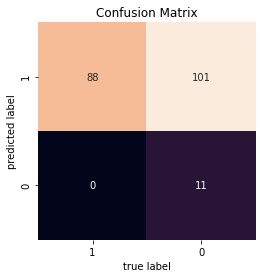

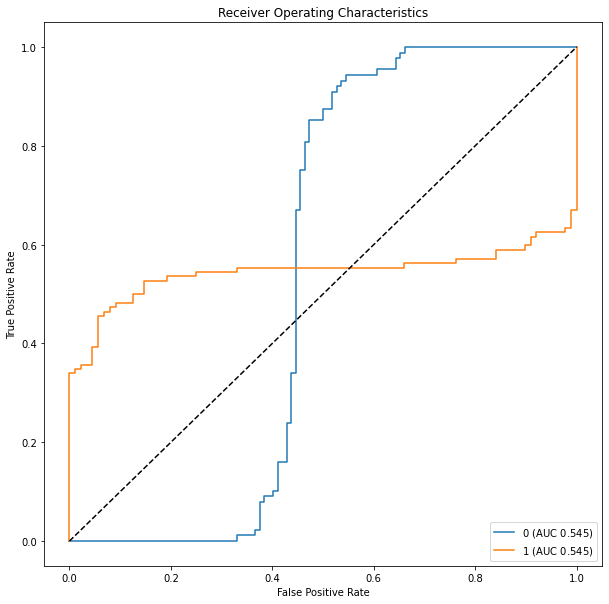

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


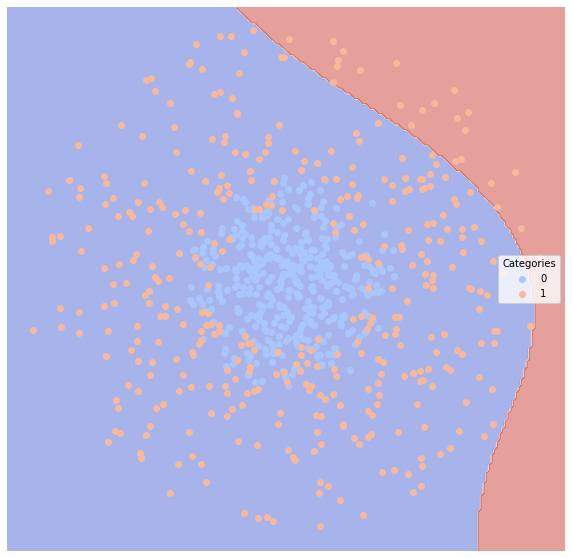

KNN


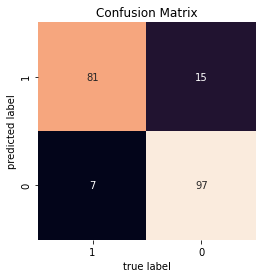

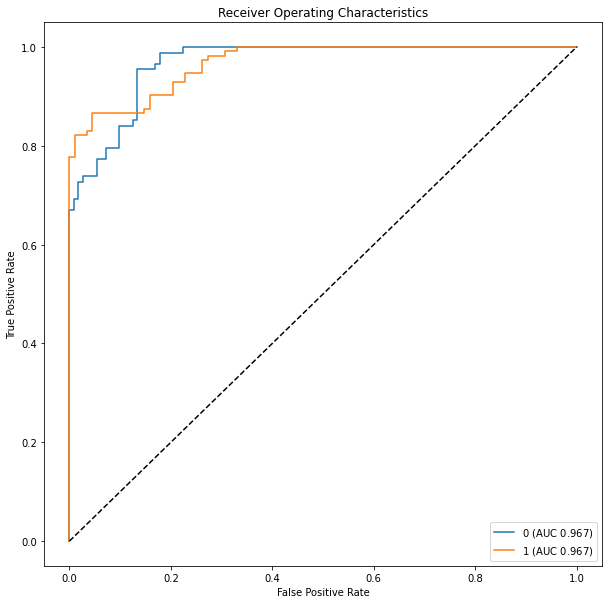

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


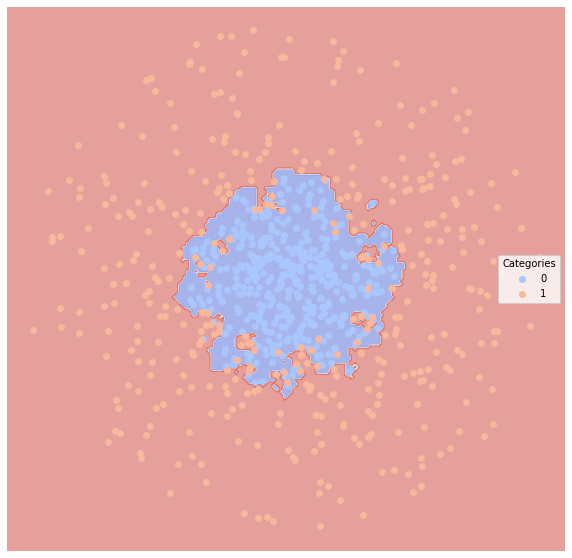

Classic Linear Regression


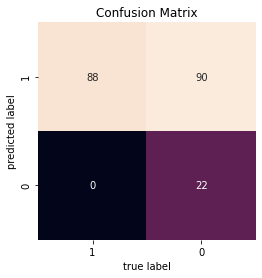

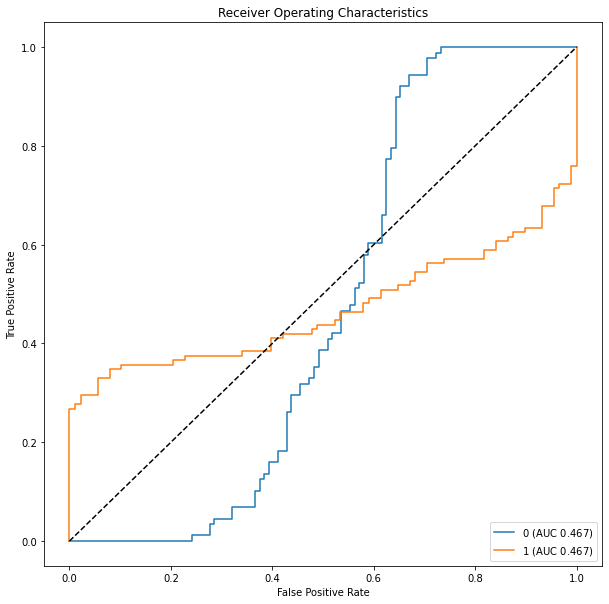

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


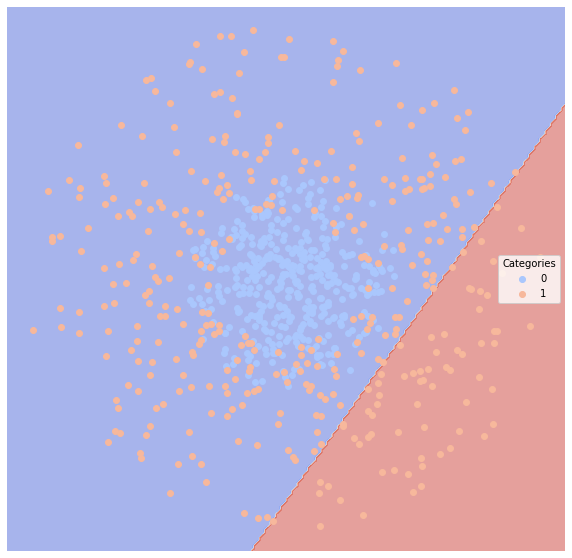

Decision Tree


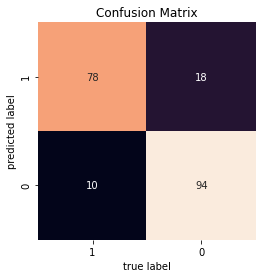

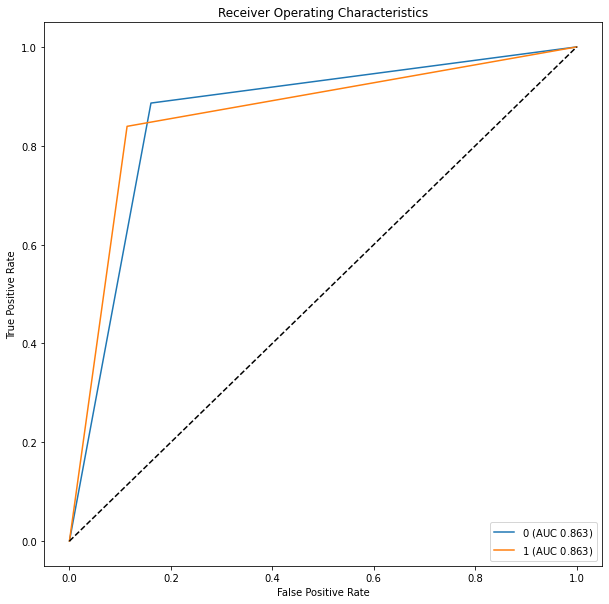

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


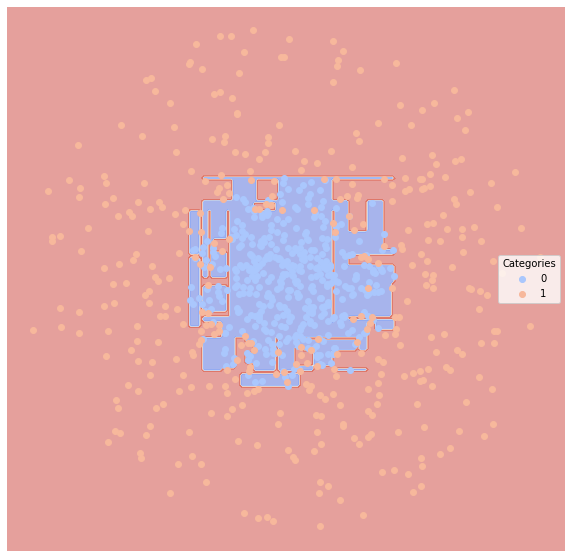

Random Forest


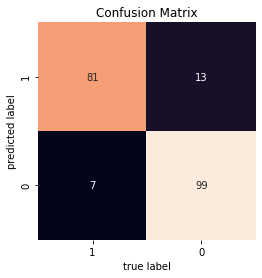

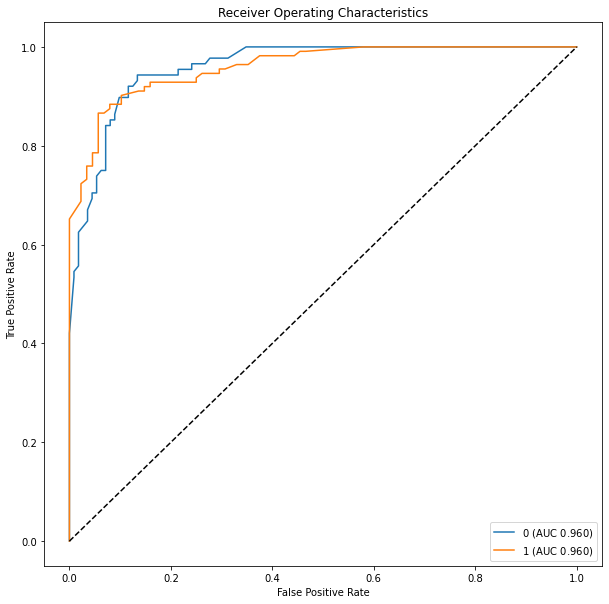

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


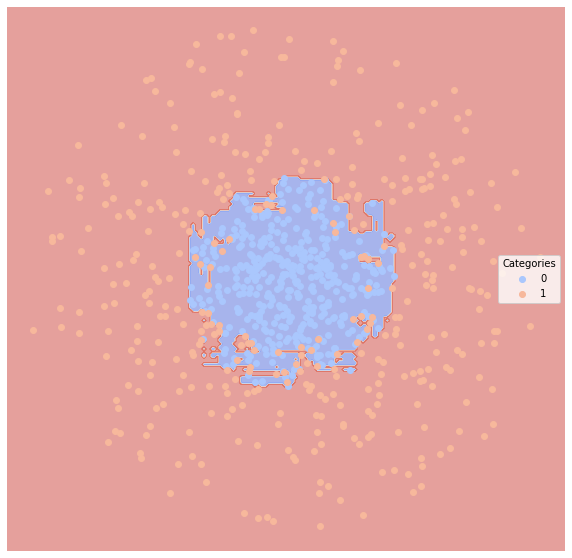

Neural Network


C:\Users\hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


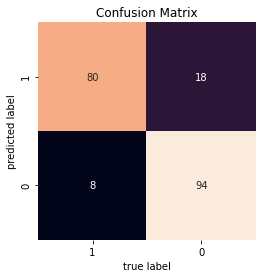

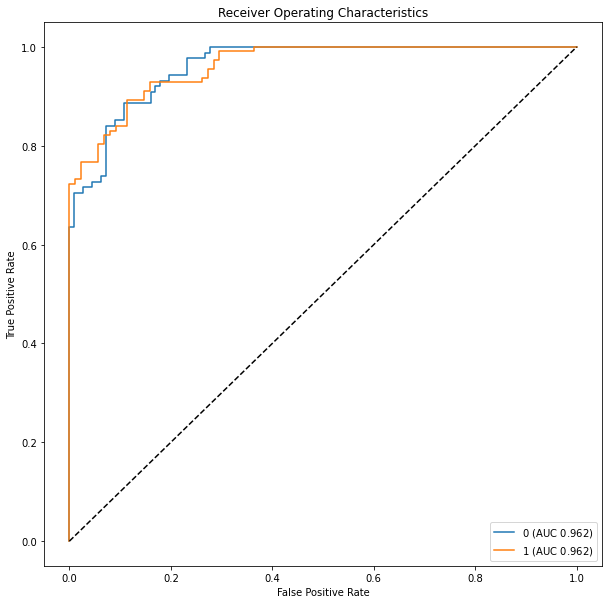

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


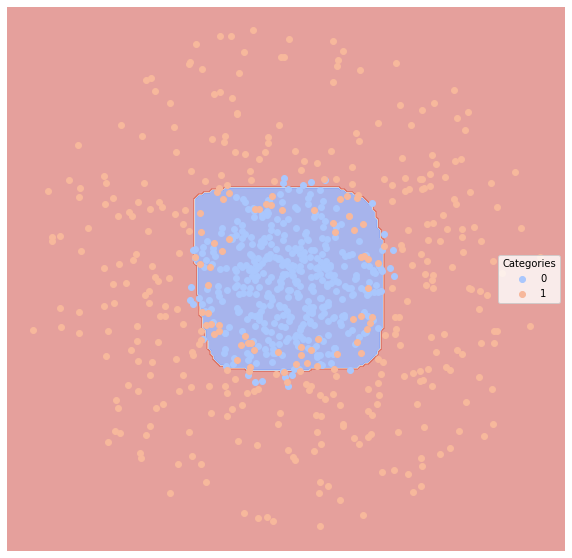

Gradient Boosting


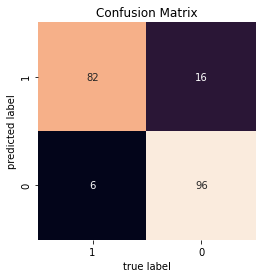

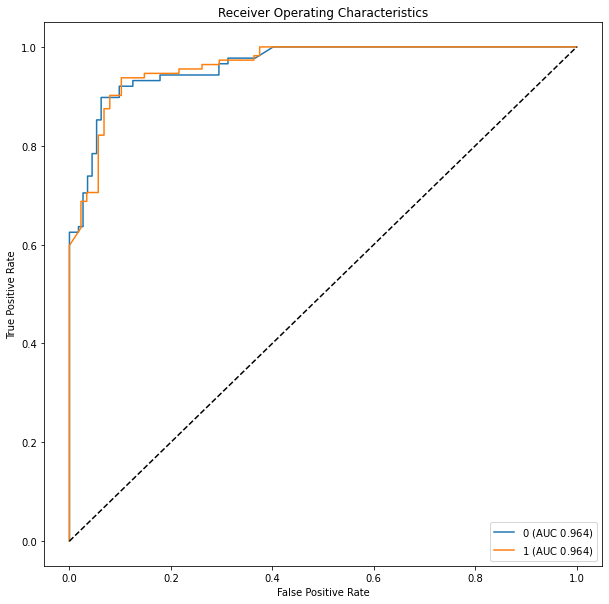

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


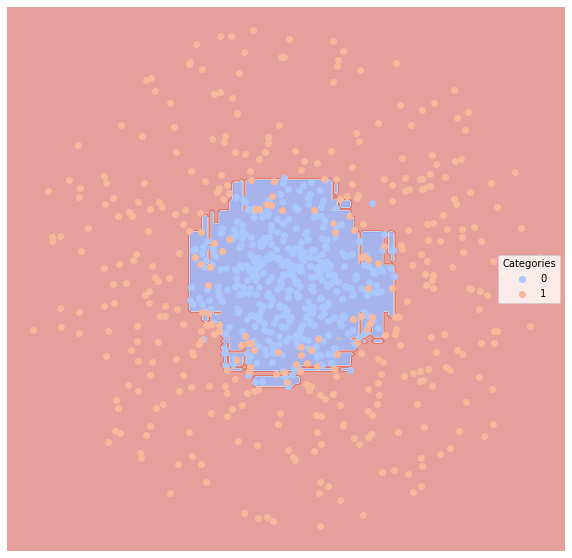

C:\Users\hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.095,0.906656
1,clf2,SVM-linear,0.560,0.500000
2,clf3,SVM-poly,0.505,0.549107
3,clf4,KNN,0.110,0.893263
4,clf5,Linear Regression,0.450,0.598214
5,clf6,Decision Tree,0.140,0.862825
6,clf7,Random Forest,0.100,0.902192
7,clf8,Neural Network,0.130,0.874188
8,clf9,Gradient Boosting,0.110,0.894481


In [110]:
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

In this condition, Naive Bayes and Random Forest performs best. Because the boundary is flexible and non-linear, linear models perform poorly.

#### Fifth Dataset

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

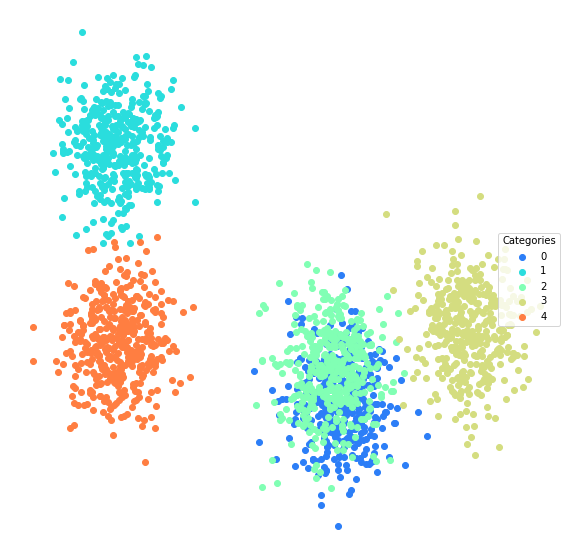

In [107]:
# 5th dataset
noise = .2
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise))
lucem_illud.plotter(dfTrain)

Naive Bayes


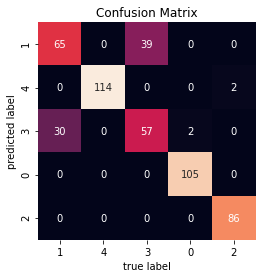

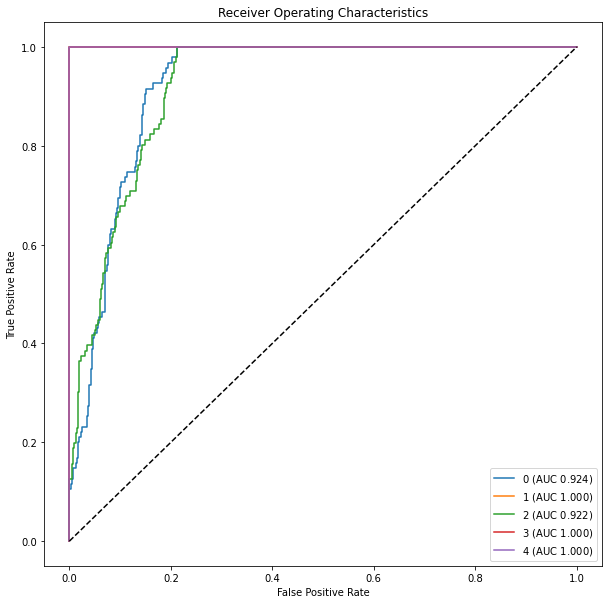

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

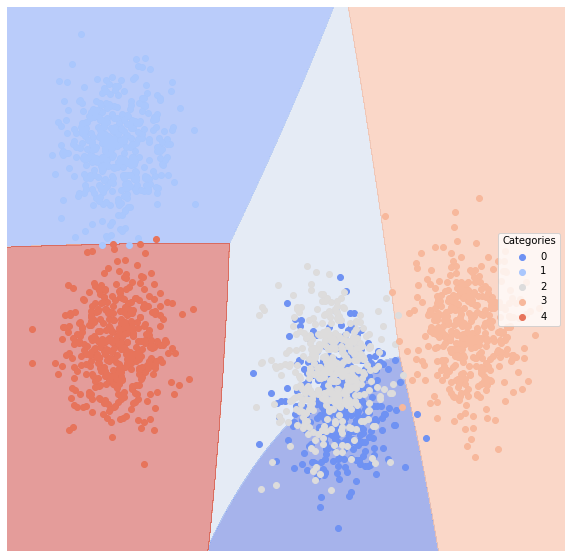

Support Vector Machine: linear


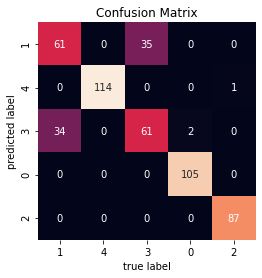

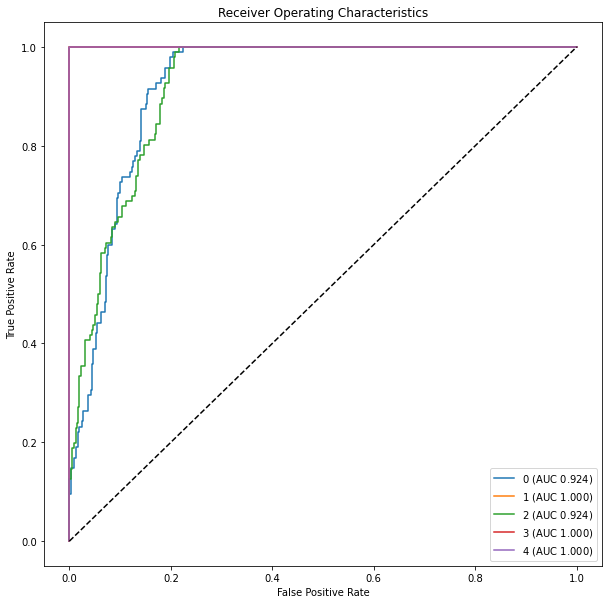

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

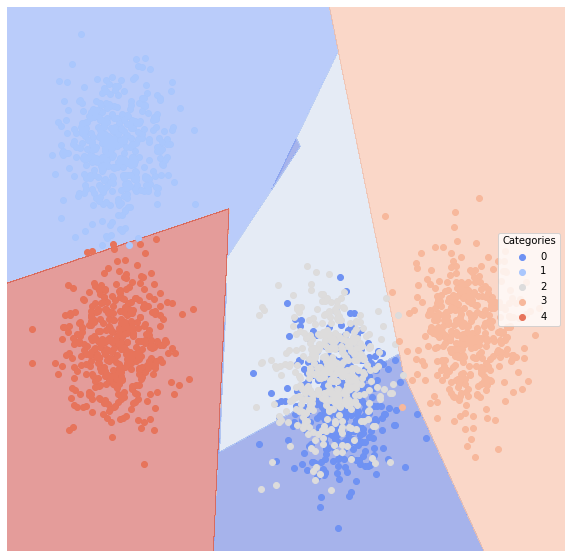

Support Vector Machine: poly


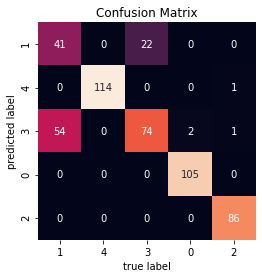

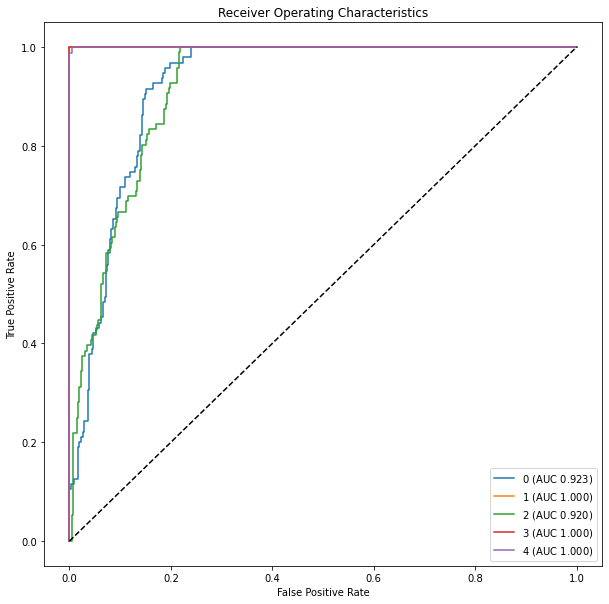

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

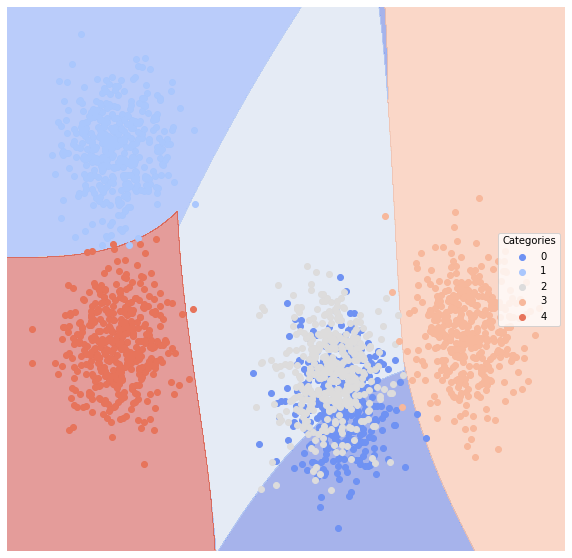

KNN


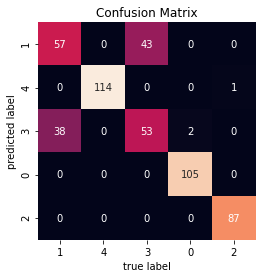

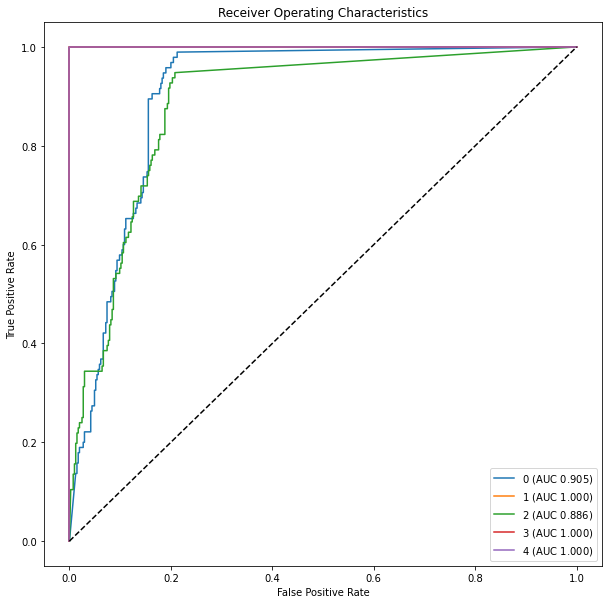

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

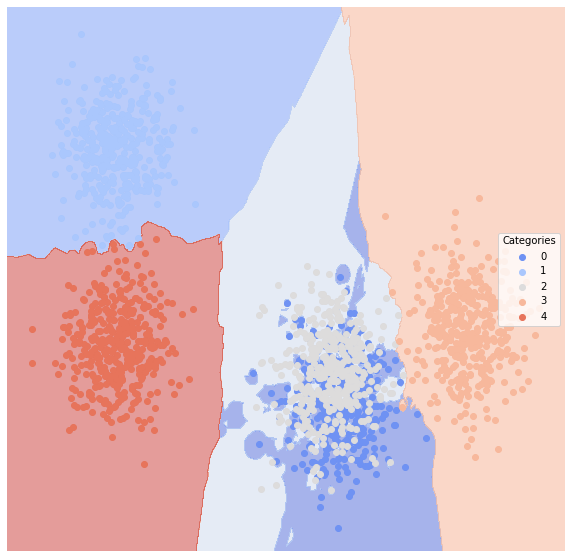

Classic Linear Regression


C:\Users\hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


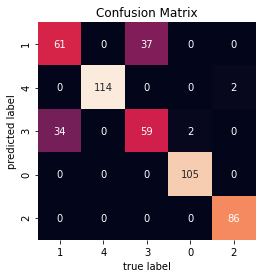

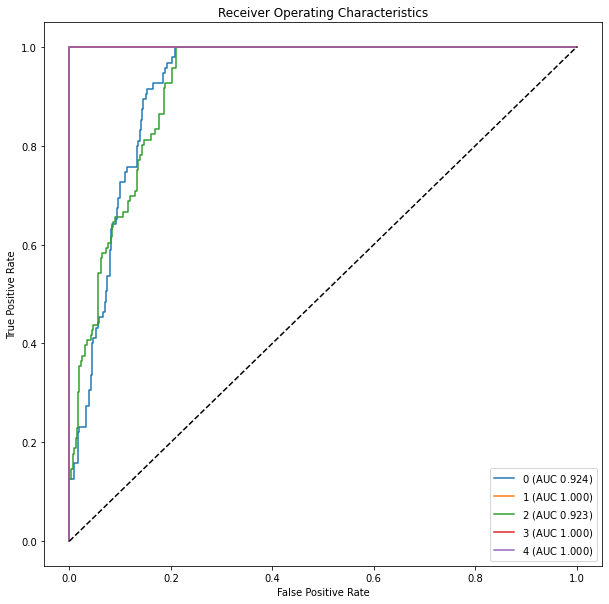

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

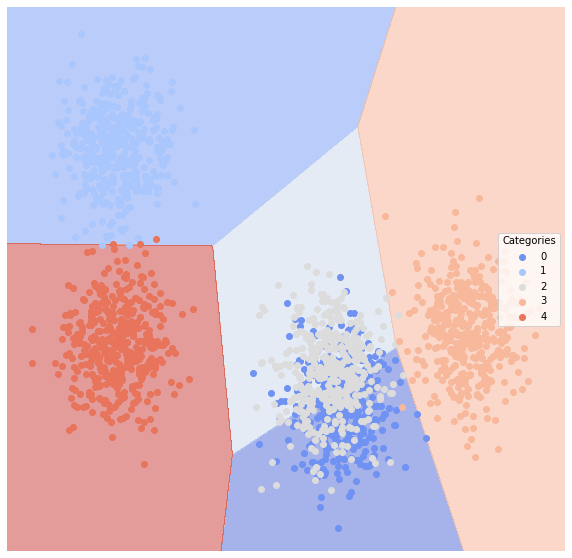

Decision Tree


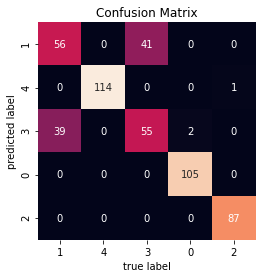

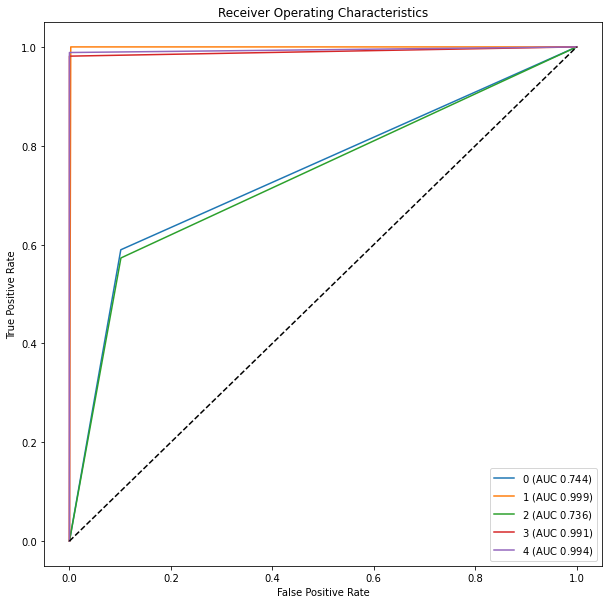

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

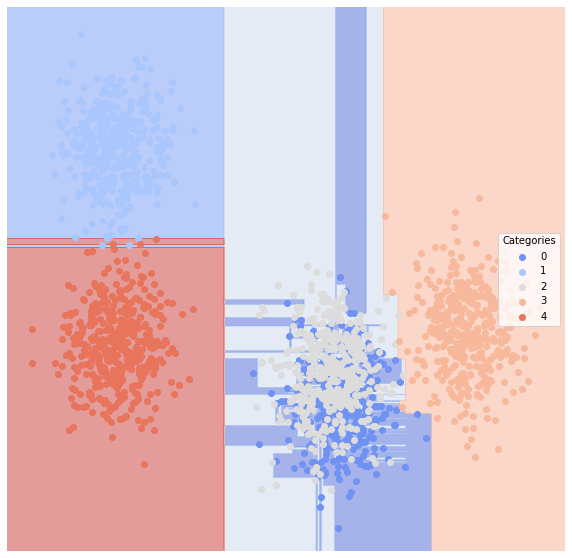

Random Forest


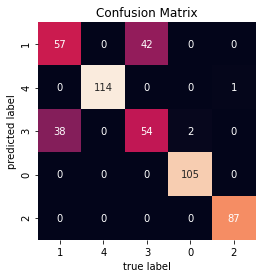

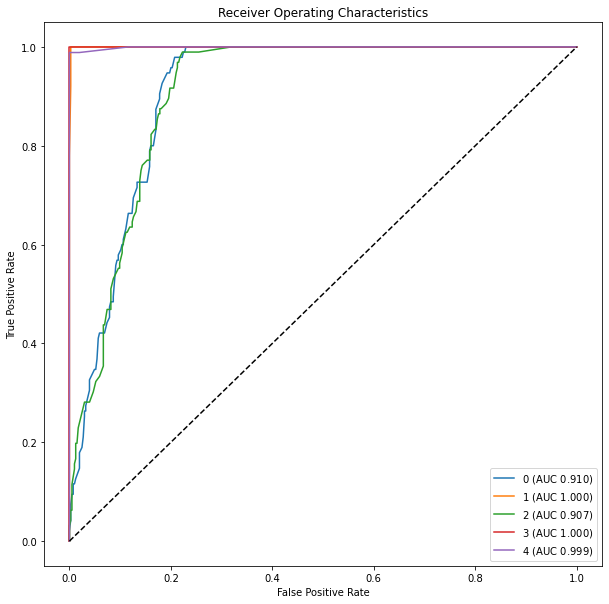

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

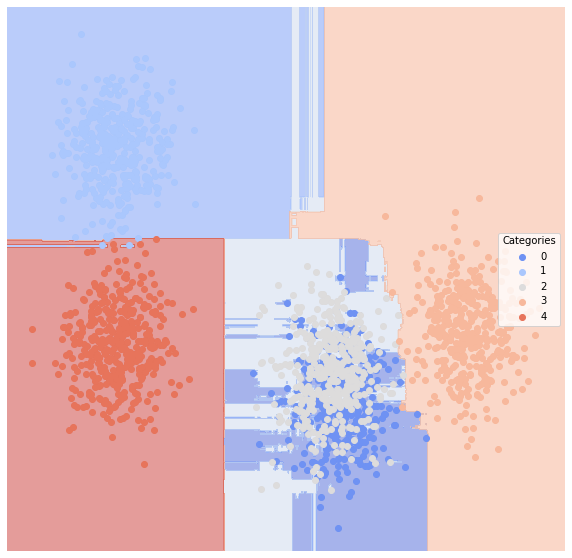

Neural Network


C:\Users\hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


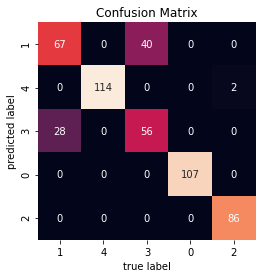

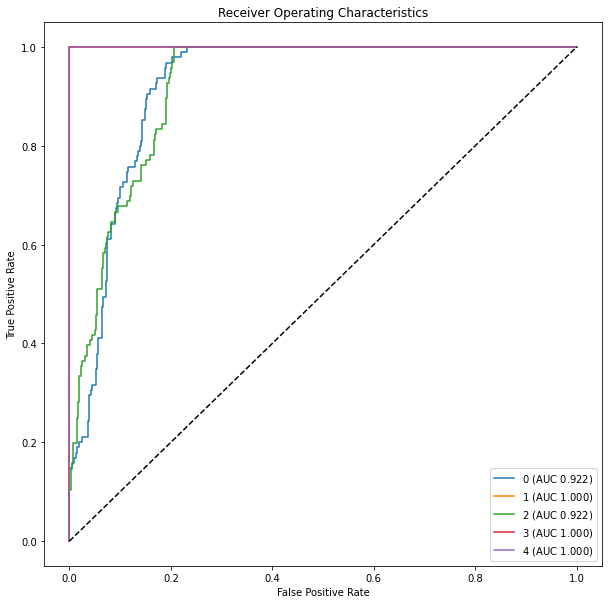

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

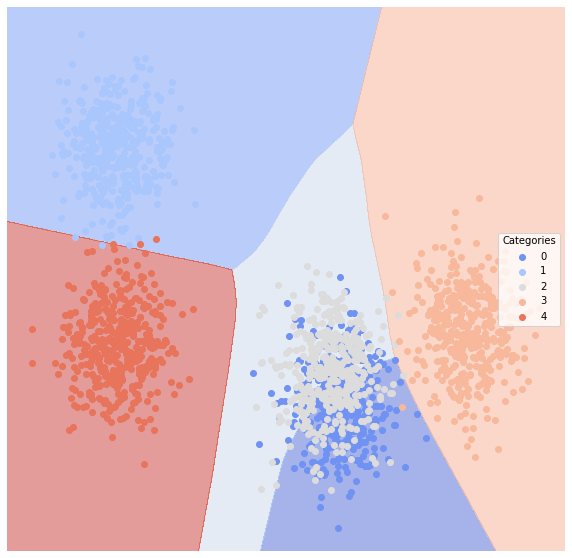

Gradient Boosting


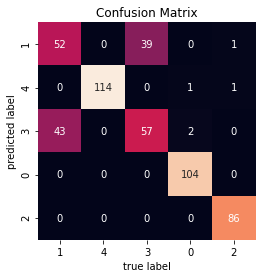

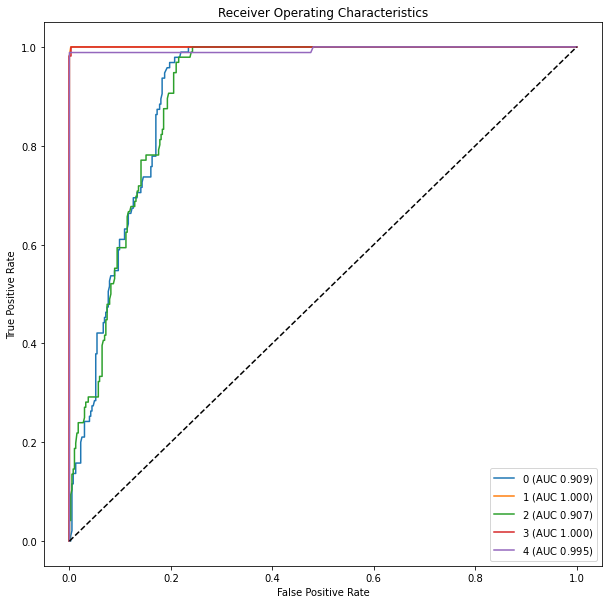

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

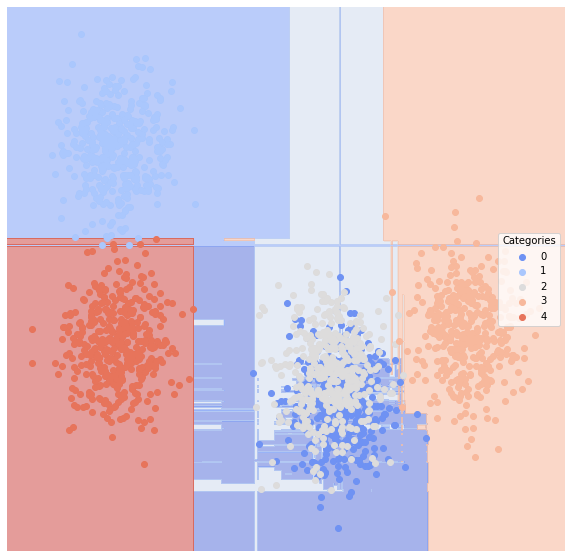

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.138,0.793957
1,clf2,SVM-linear,0.138,0.777843
2,clf3,SVM-poly,0.152,0.688629
3,clf4,KNN,0.162,0.746914
4,clf5,Linear Regression,0.142,0.775374
5,clf6,Decision Tree,0.160,0.744120
6,clf7,Random Forest,0.160,0.748148
7,clf8,Neural Network,0.136,0.803249
8,clf9,Gradient Boosting,0.166,0.724301


In [108]:
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

In this case, neural network has the most accurate results. Poly SVM's performance is the worst.

Now that we've tried all 5 types of data sets that lucem_illud created, we can work on the noise level.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


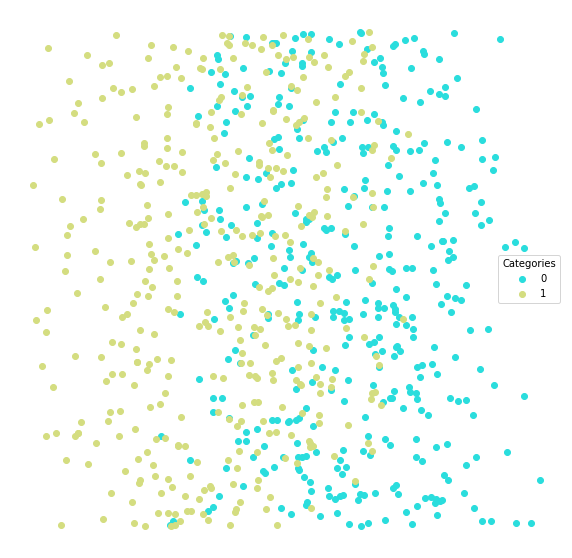

In [116]:
# 6th data set
noise = .5
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise)) 
lucem_illud.plotter(dfTrain)

Naive Bayes


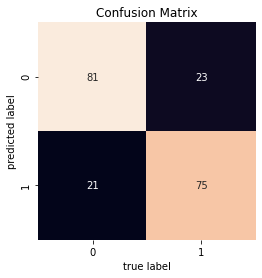

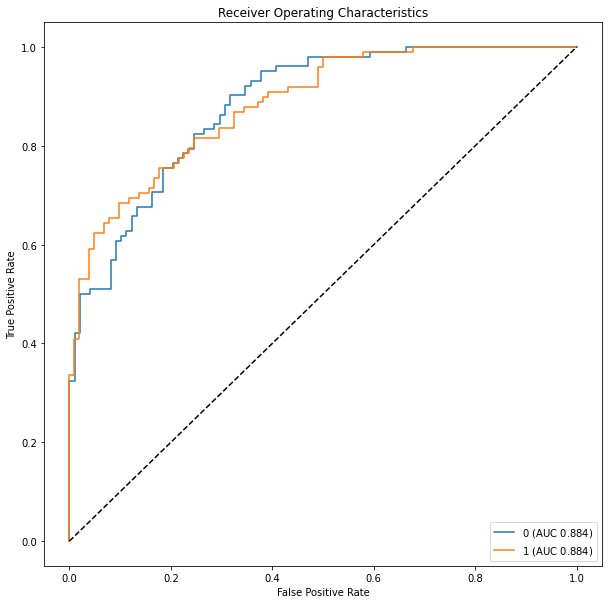

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


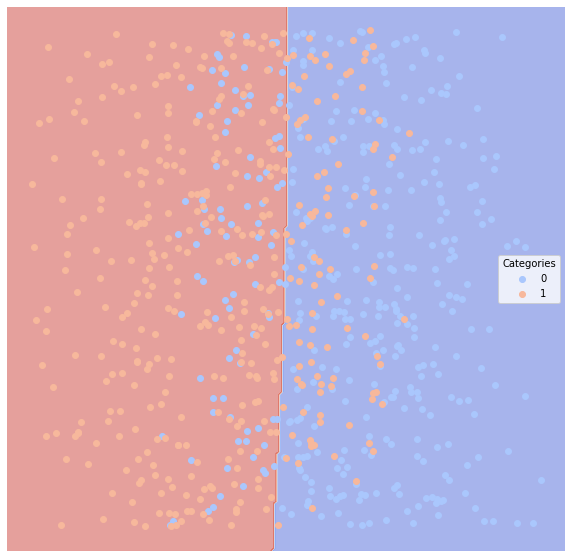

Support Vector Machine: linear


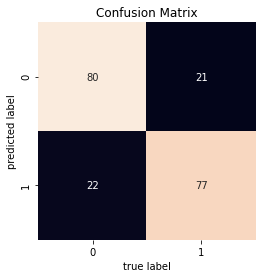

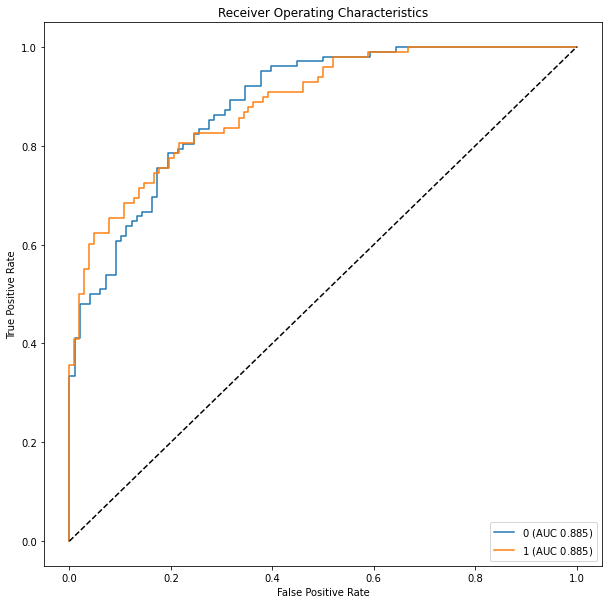

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


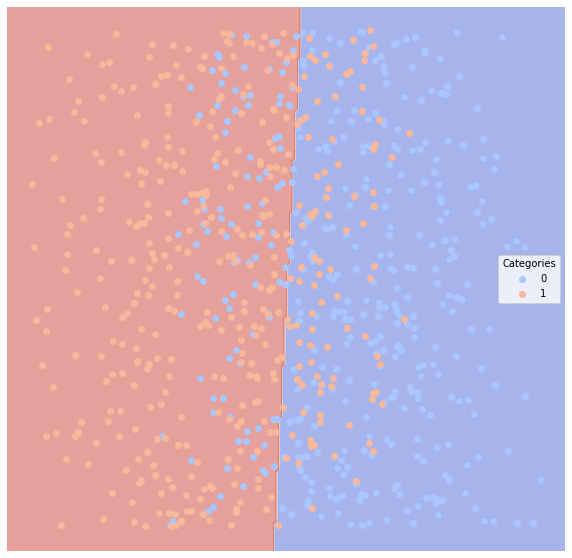

Support Vector Machine: poly


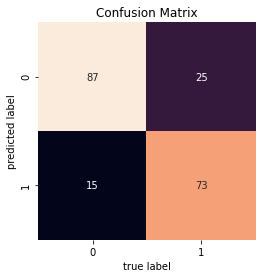

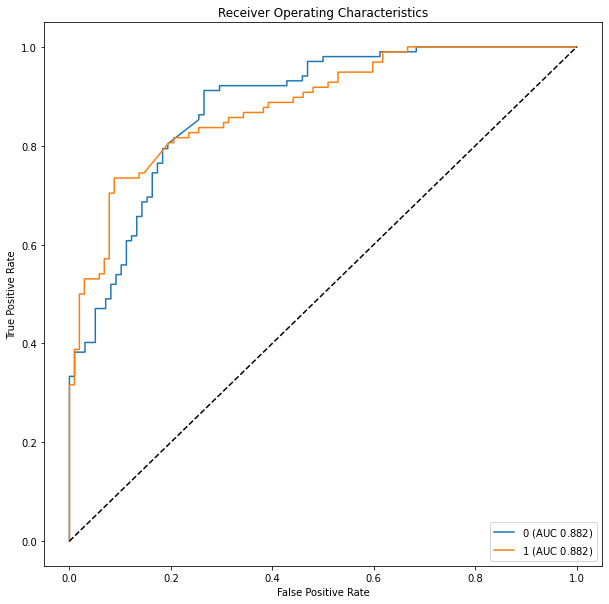

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


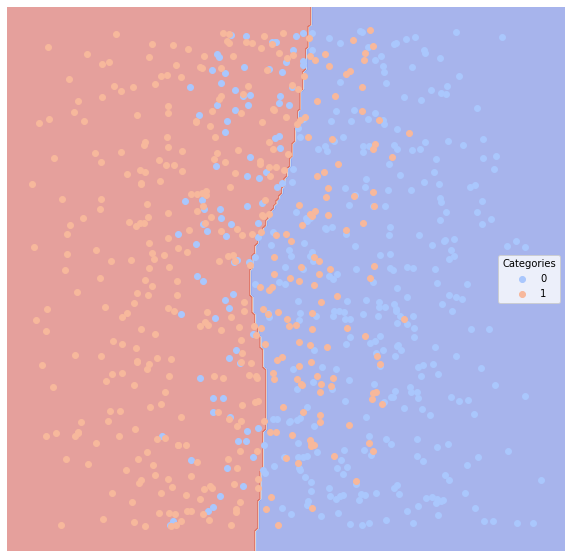

KNN


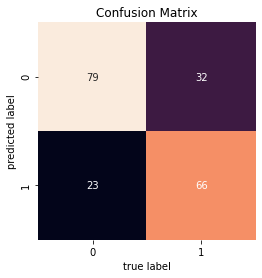

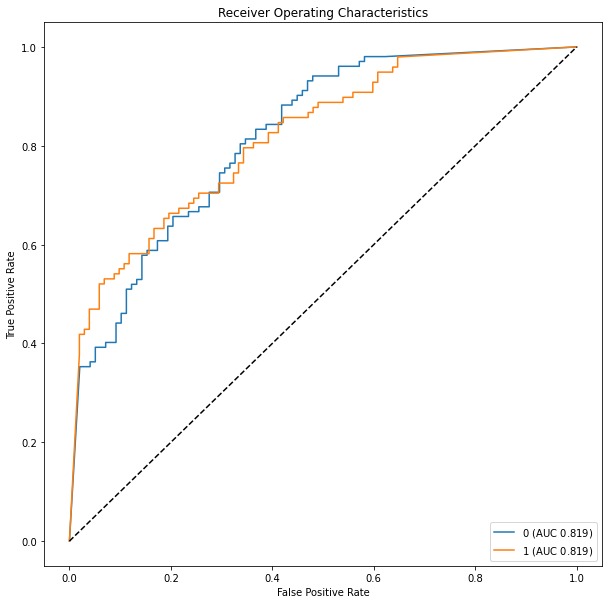

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


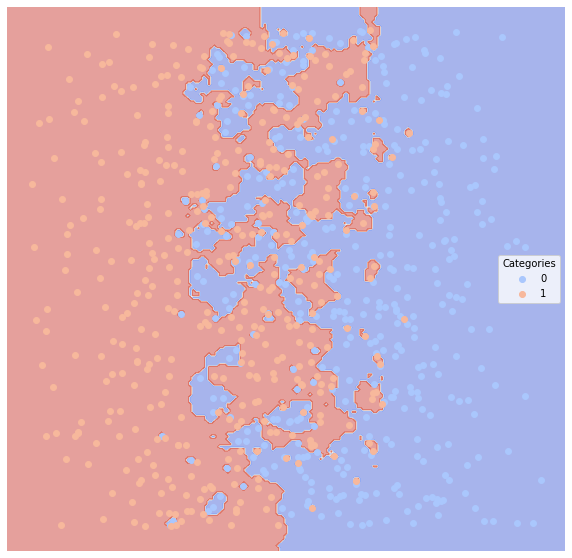

Classic Linear Regression


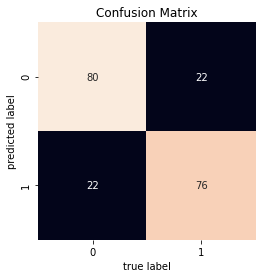

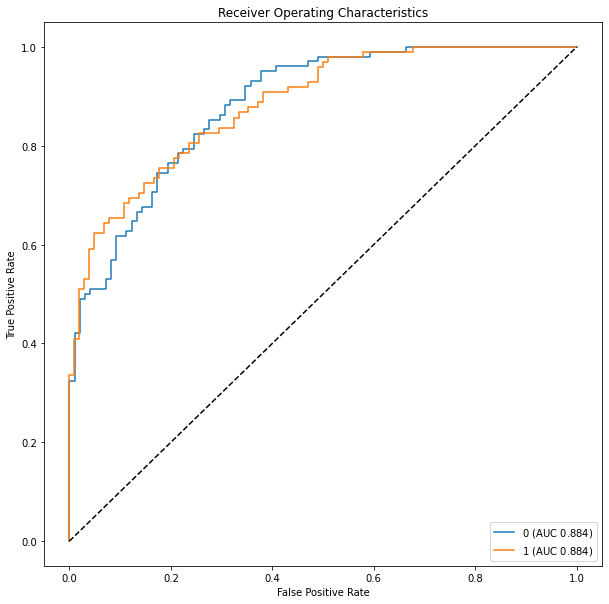

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


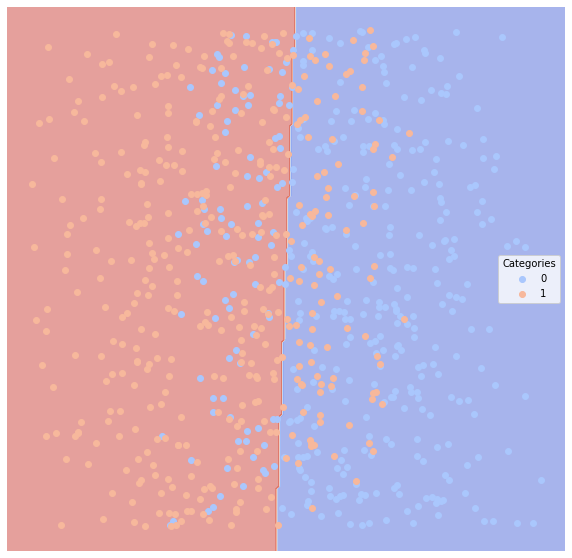

Decision Tree


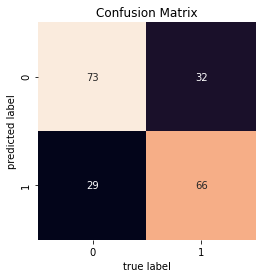

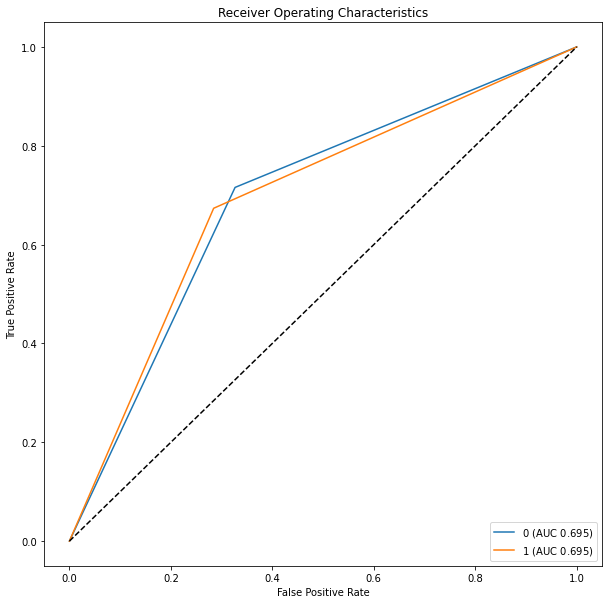

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


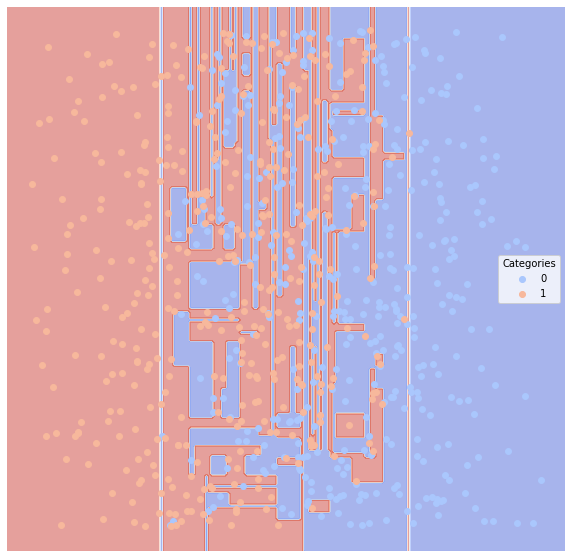

Random Forest


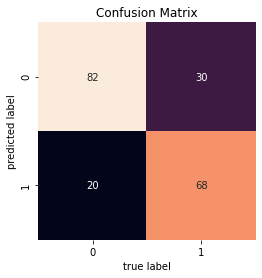

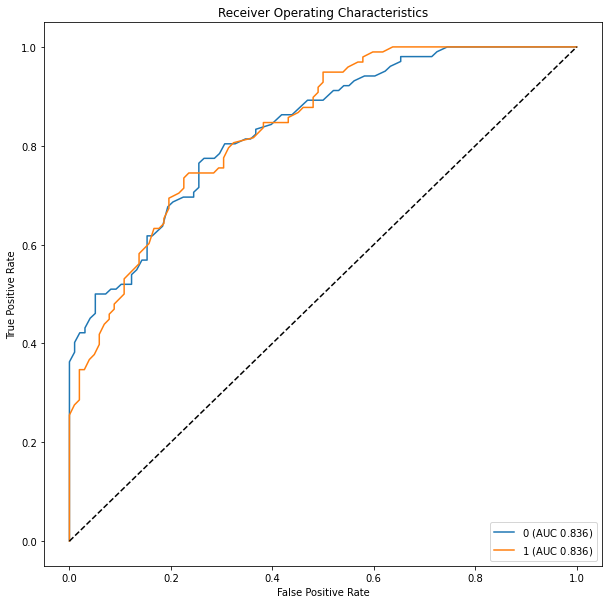

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


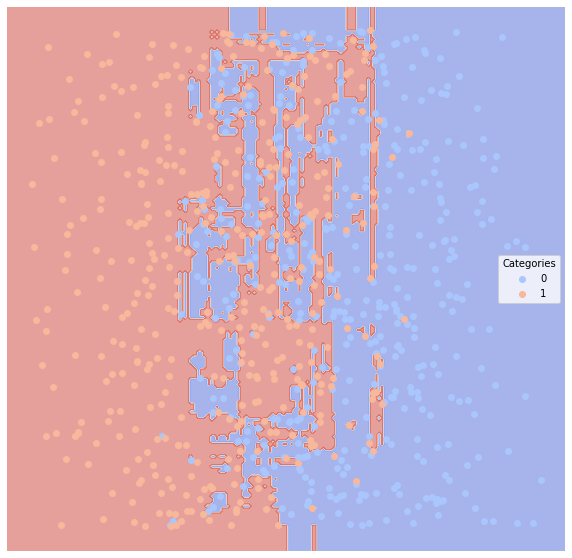

Neural Network


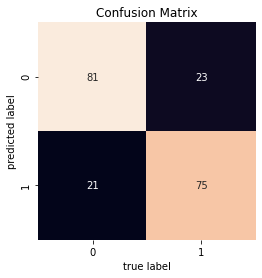

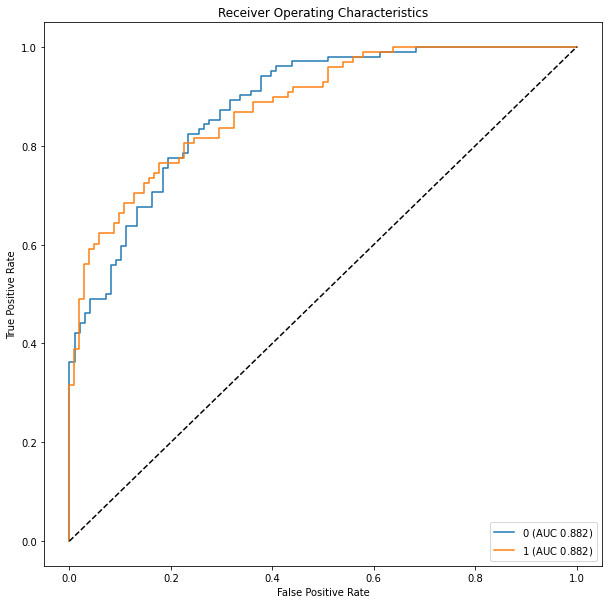

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


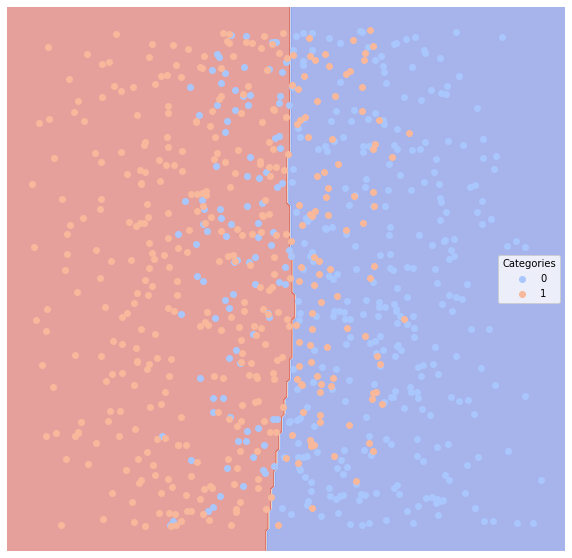

Gradient Boosting


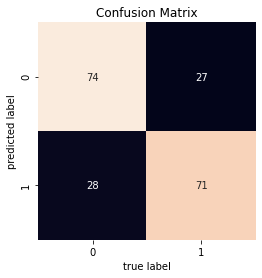

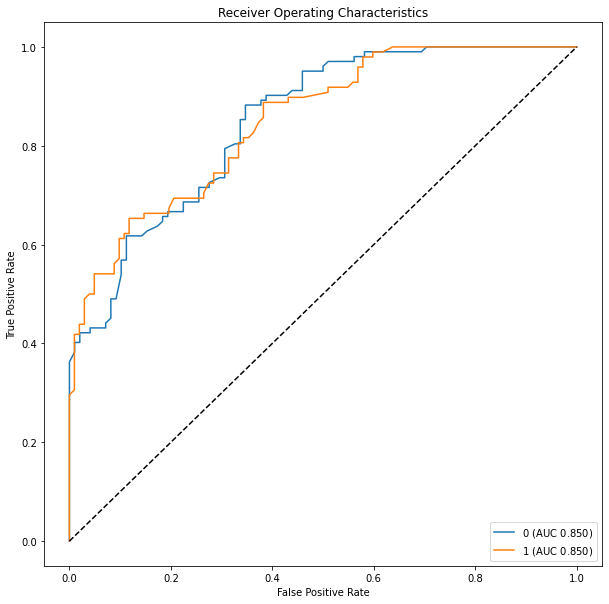

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


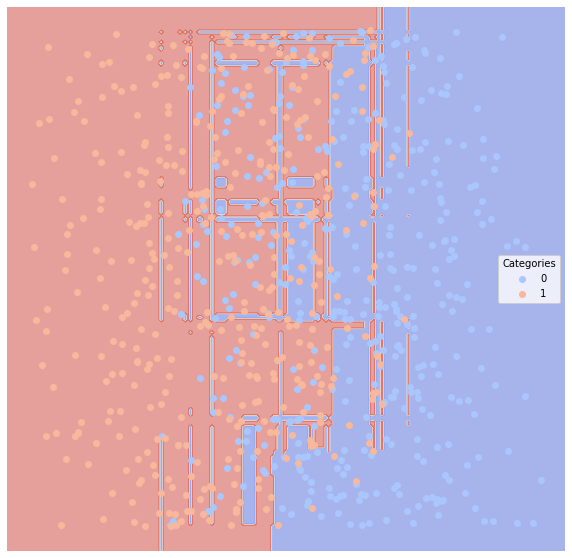

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.220,0.779712
1,clf2,SVM-linear,0.215,0.785014
2,clf3,SVM-poly,0.200,0.798920
3,clf4,KNN,0.275,0.723990
4,clf5,Linear Regression,0.220,0.779912
5,clf6,Decision Tree,0.305,0.694578
6,clf7,Random Forest,0.250,0.748900
7,clf8,Neural Network,0.220,0.779712
8,clf9,Gradient Boosting,0.275,0.724990


In [117]:
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

In this setting (linear boundary and relatively high noise), both linear and poly SVM performs well when predicting the testing set, even better than the linear regression, probably because the high noise level. We can try to increase the noise level even more.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


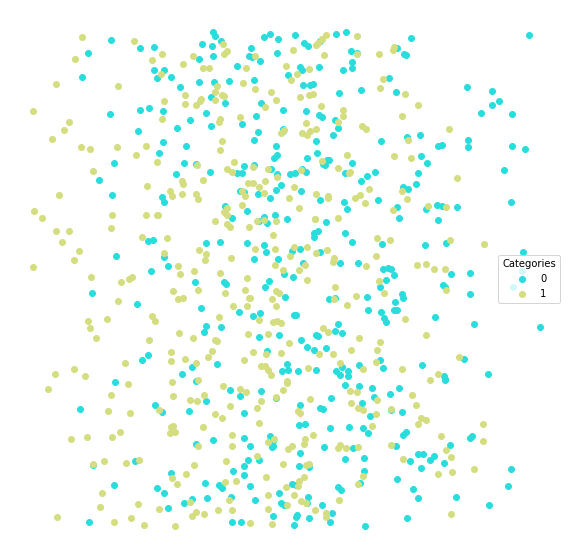

In [118]:
# 7th data set
noise = .8
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise)) 
lucem_illud.plotter(dfTrain)

Naive Bayes


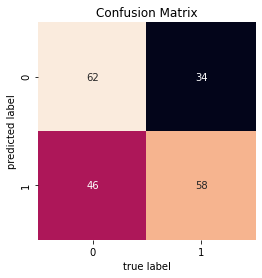

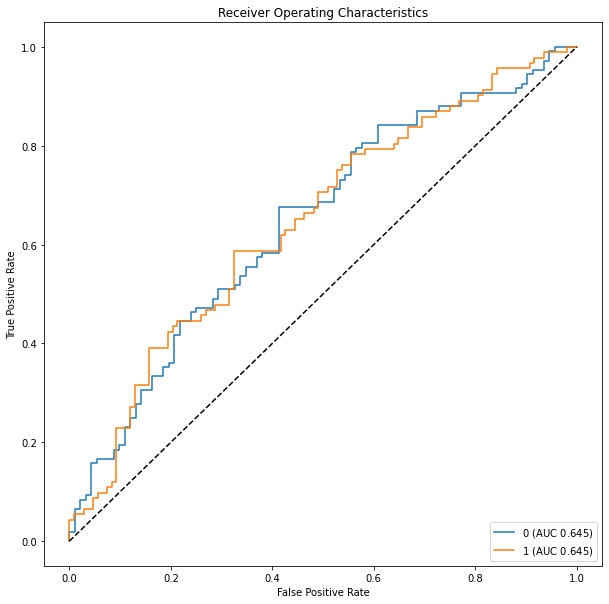

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


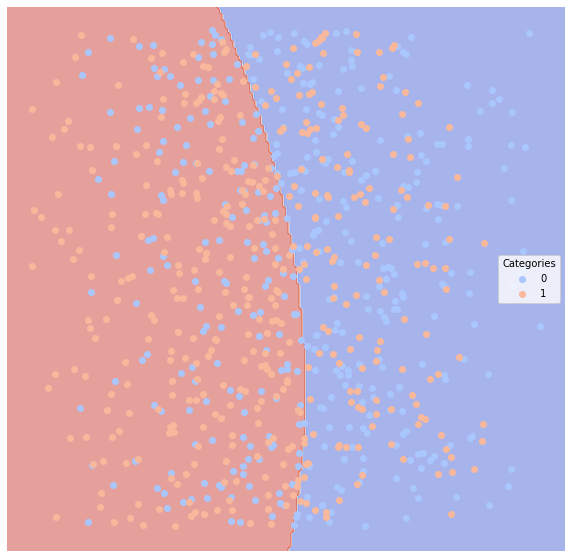

Support Vector Machine: linear


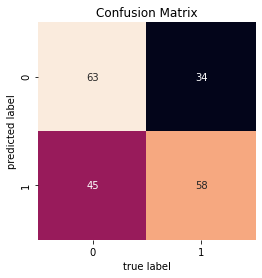

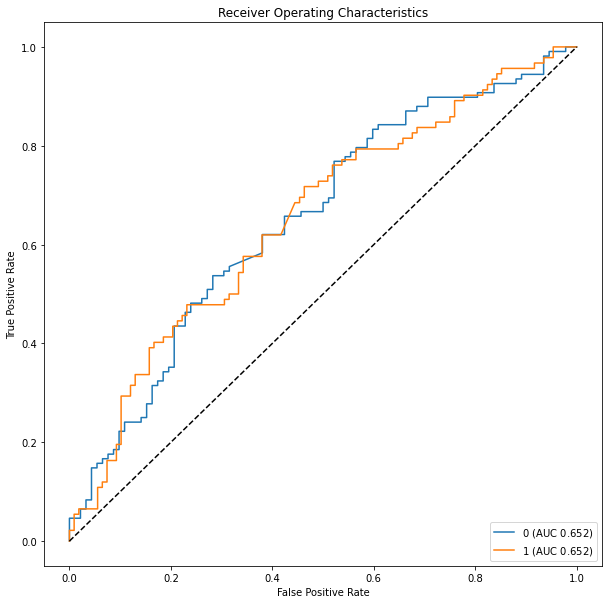

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


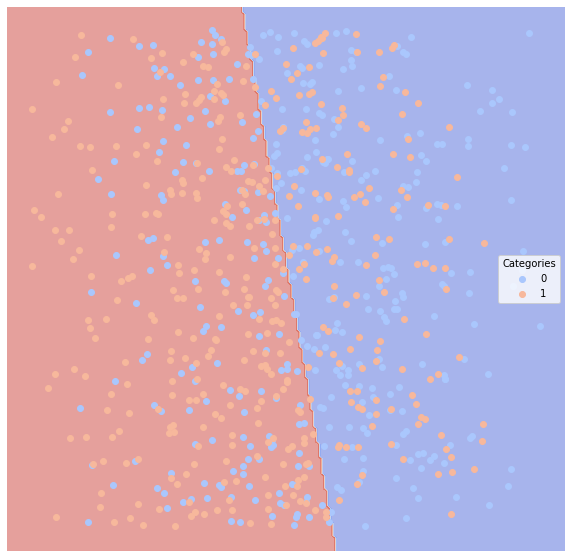

Support Vector Machine: poly


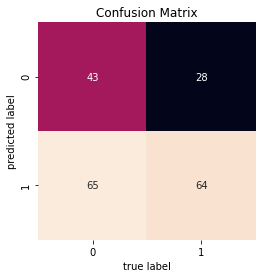

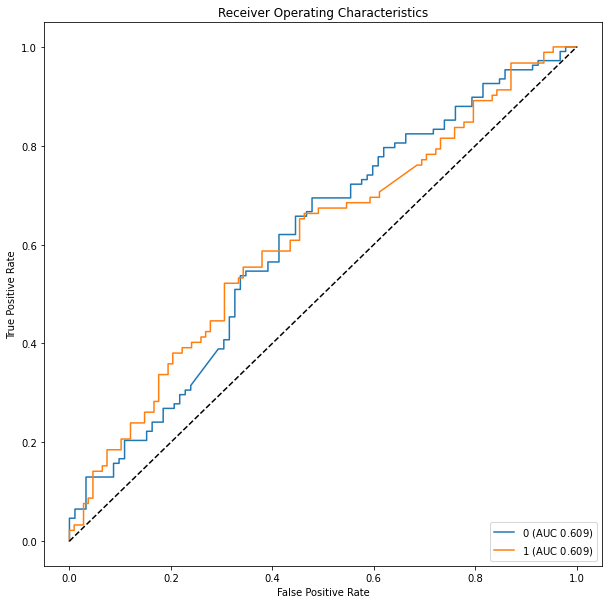

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


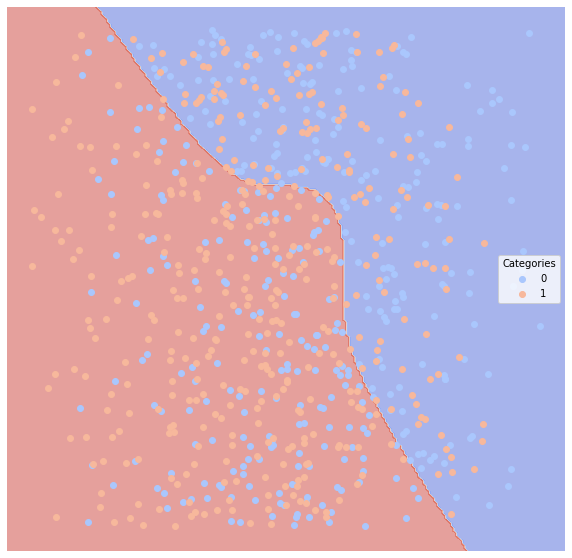

KNN


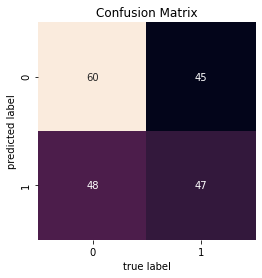

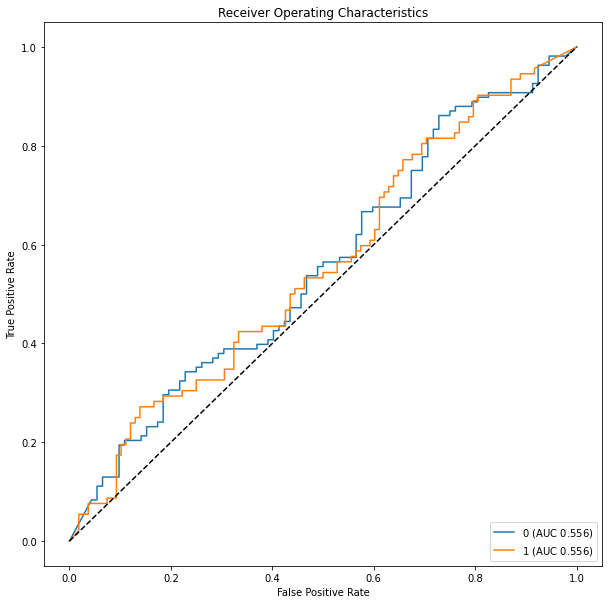

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


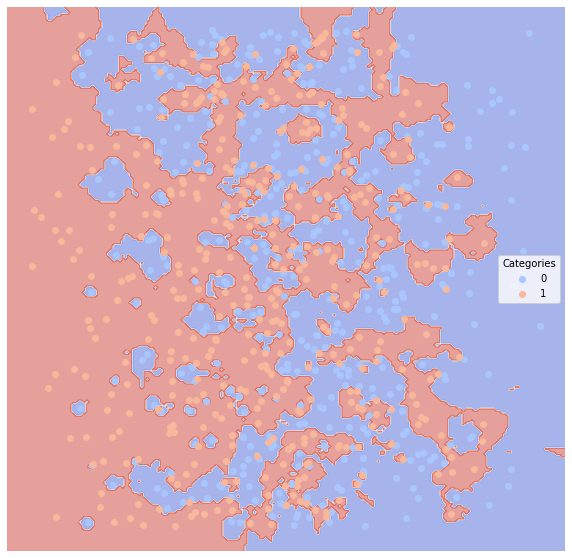

Classic Linear Regression


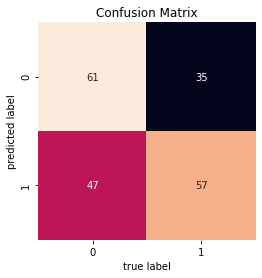

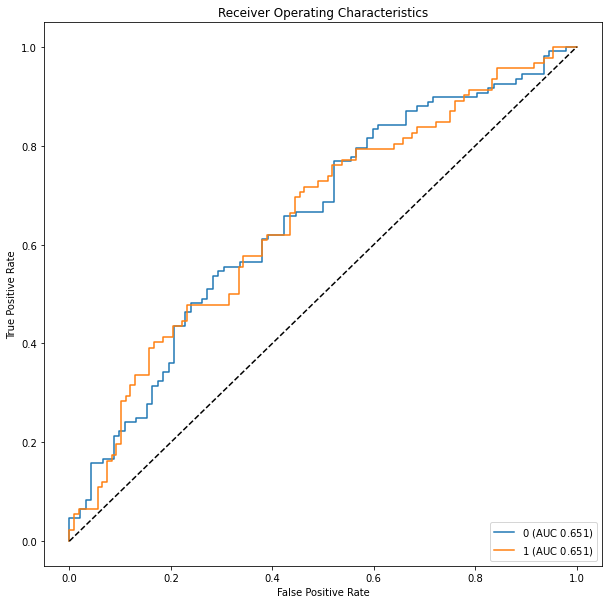

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


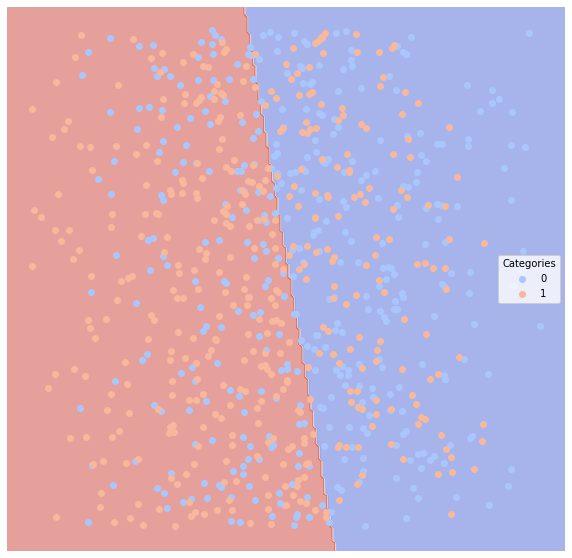

Decision Tree


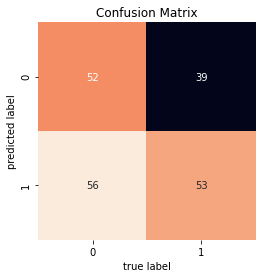

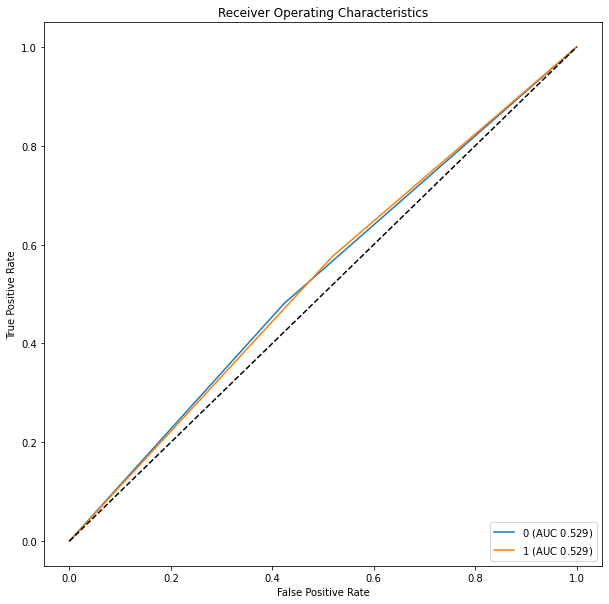

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


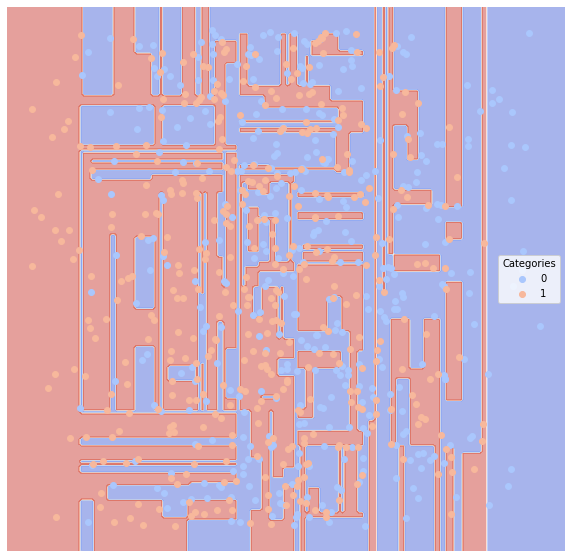

Random Forest


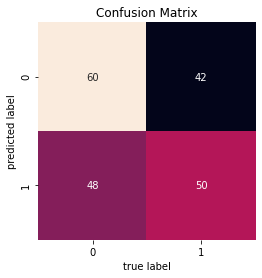

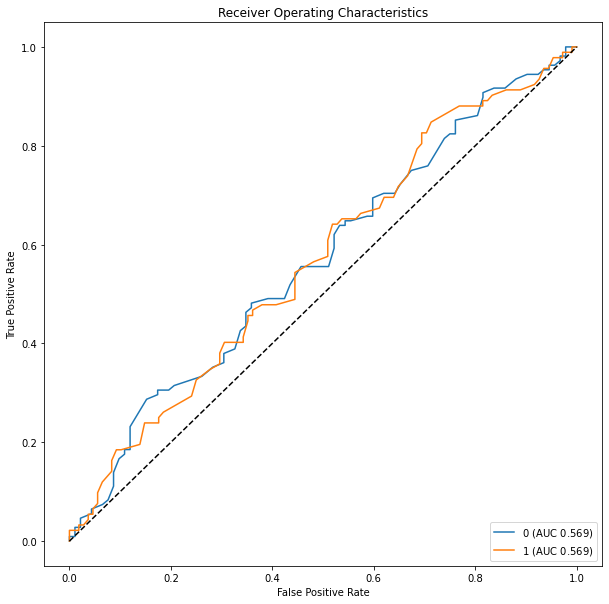

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


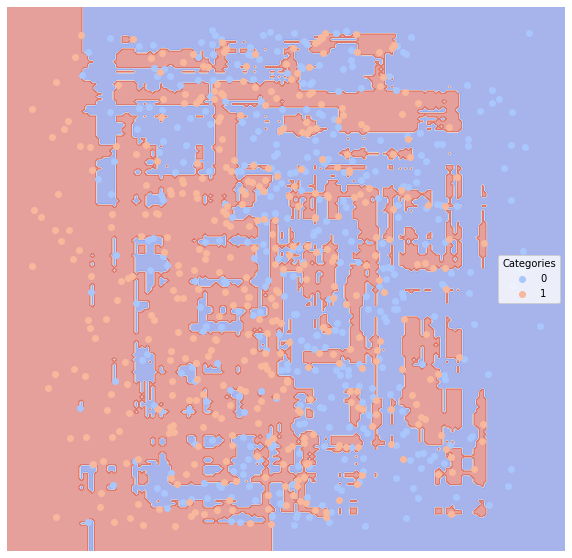

Neural Network


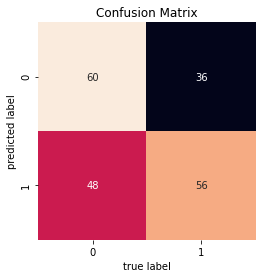

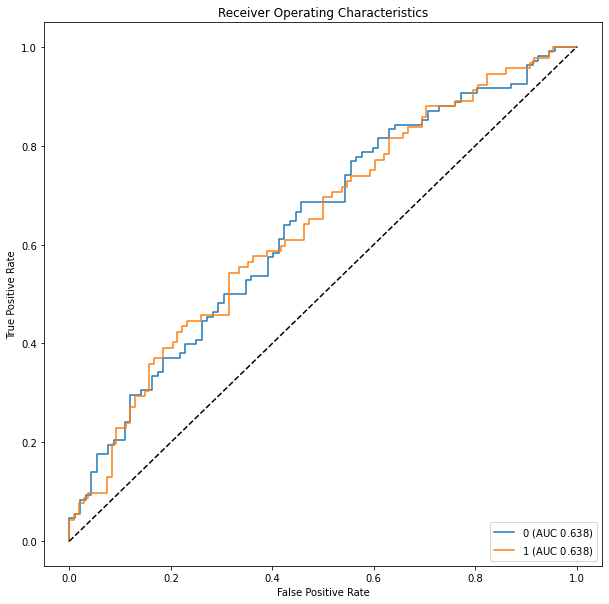

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


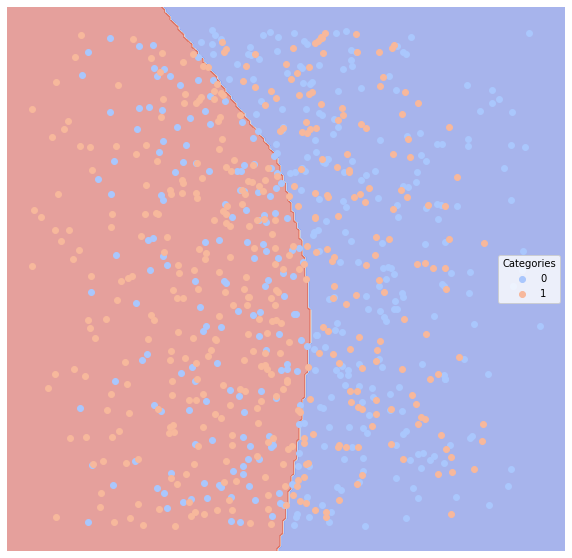

Gradient Boosting


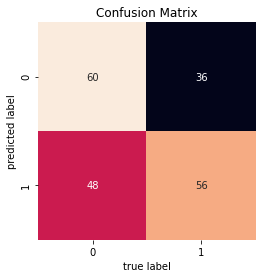

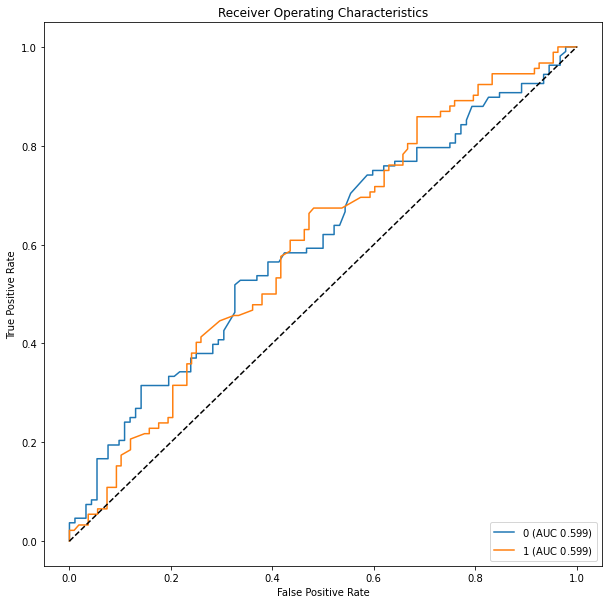

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


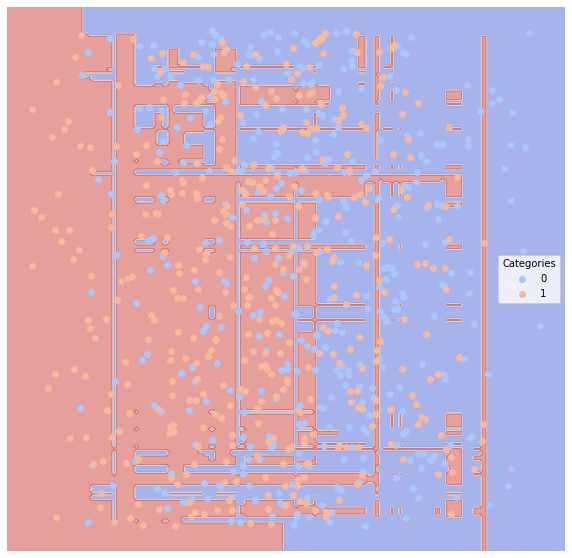

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.400,0.602254
1,clf2,SVM-linear,0.395,0.606884
2,clf3,SVM-poly,0.465,0.546900
3,clf4,KNN,0.465,0.533213
4,clf5,Linear Regression,0.410,0.592190
5,clf6,Decision Tree,0.475,0.528784
6,clf7,Random Forest,0.450,0.549517
7,clf8,Neural Network,0.420,0.582126
8,clf9,Gradient Boosting,0.420,0.582126


In [119]:
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

When the level of noise increase, the boundary becomes vague--the two linearly split classes look like they are generated randomly. So the AUC for all model all decrease. Among them, Linear support vector machine performs the best.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


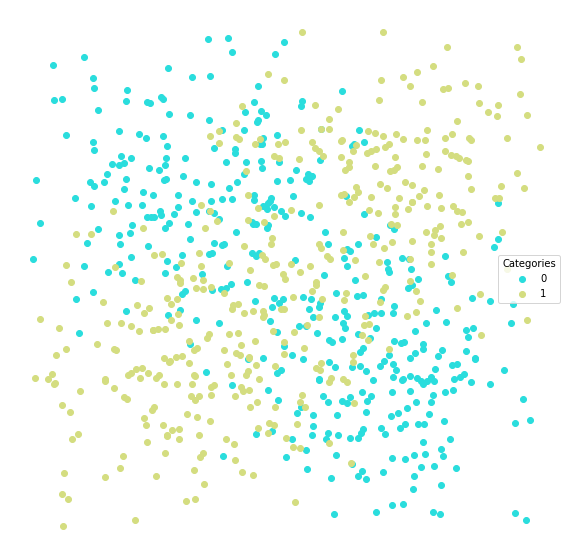

In [120]:
# 8th data set
noise = .5
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise)) 
lucem_illud.plotter(dfTrain)

Naive Bayes


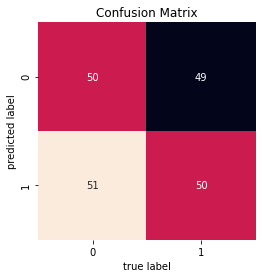

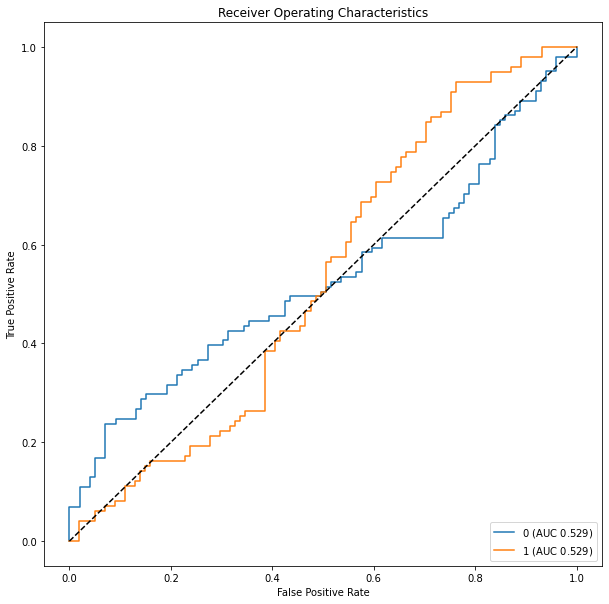

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


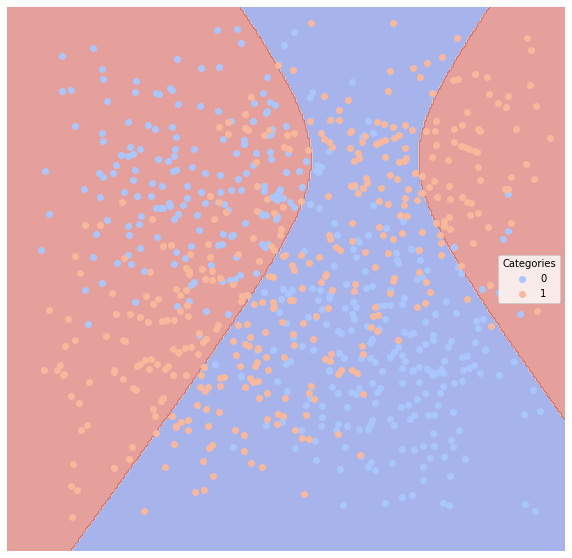

Support Vector Machine: linear


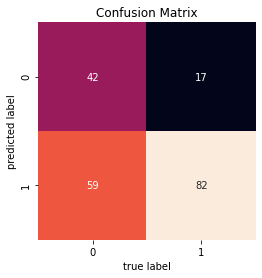

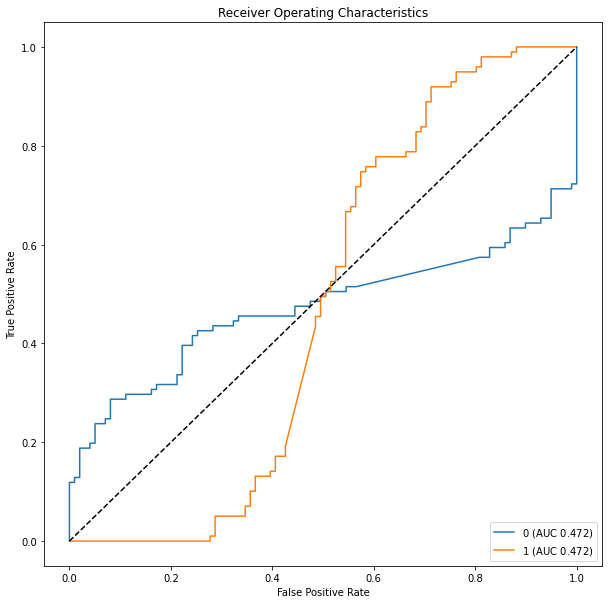

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


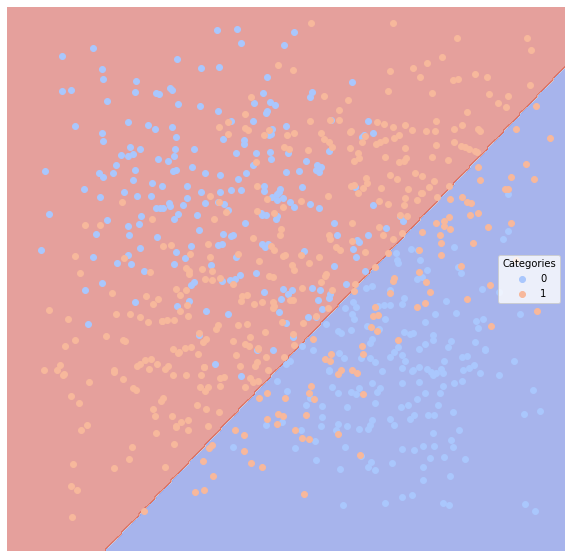

Support Vector Machine: poly


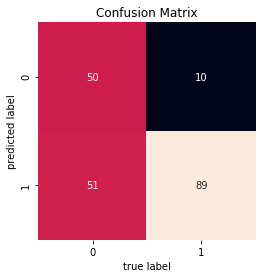

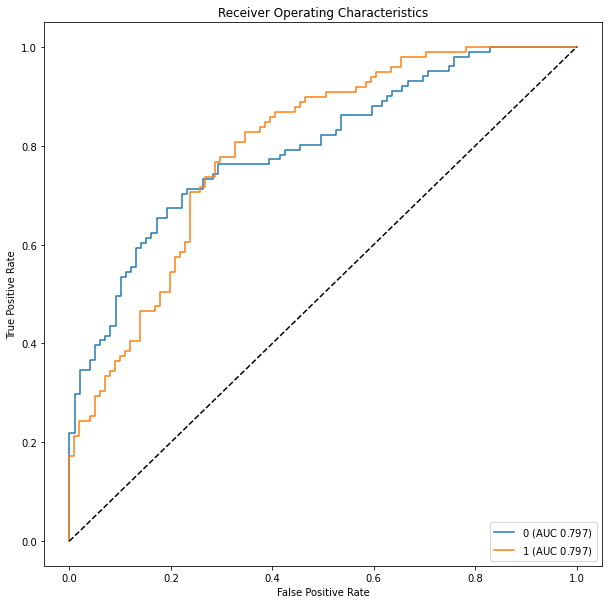

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


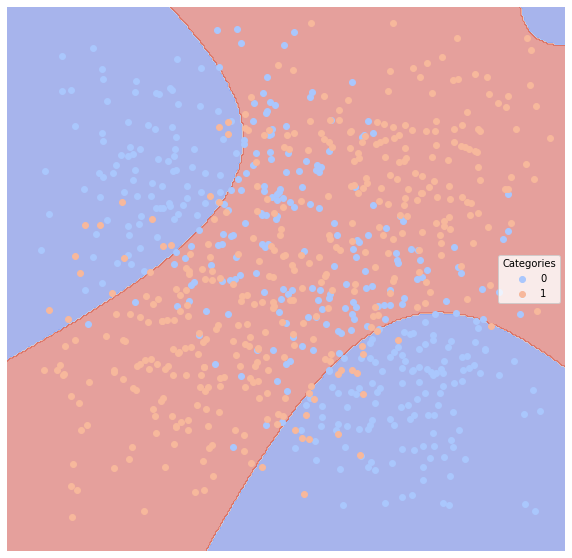

KNN


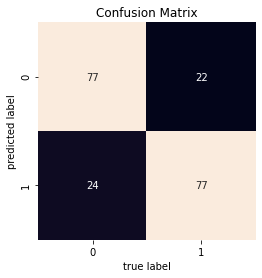

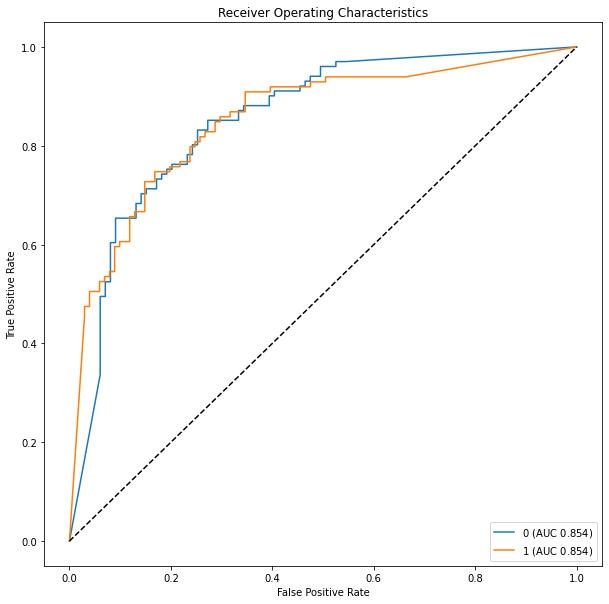

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


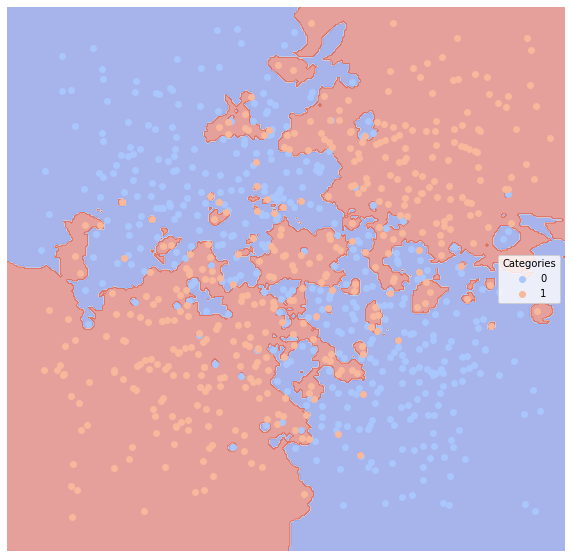

Classic Linear Regression


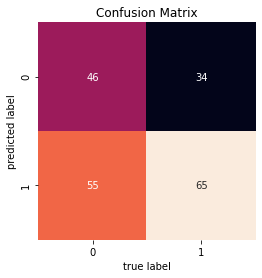

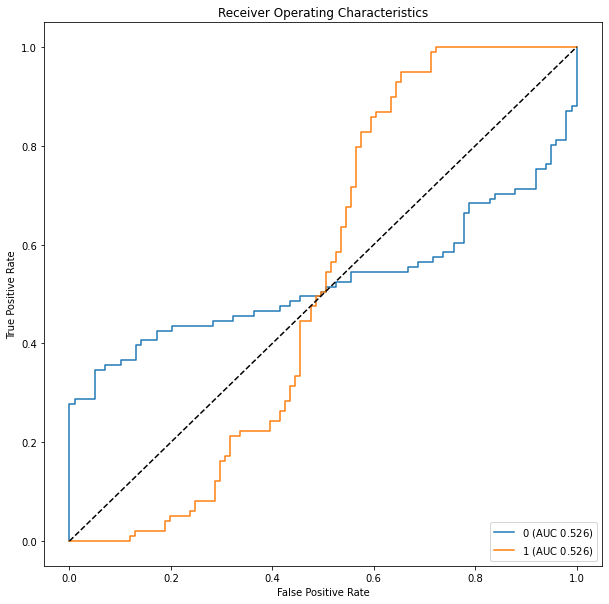

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


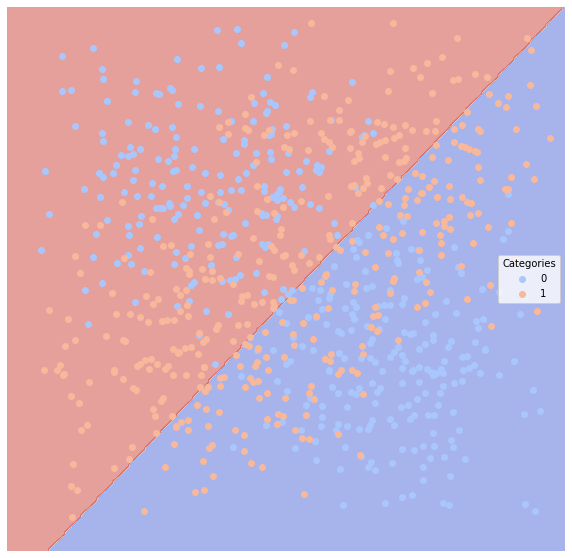

Decision Tree


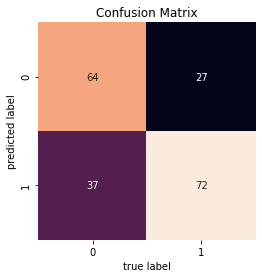

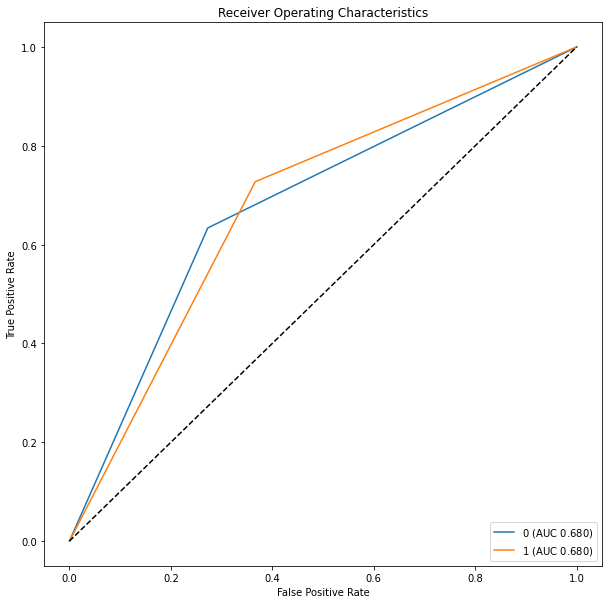

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


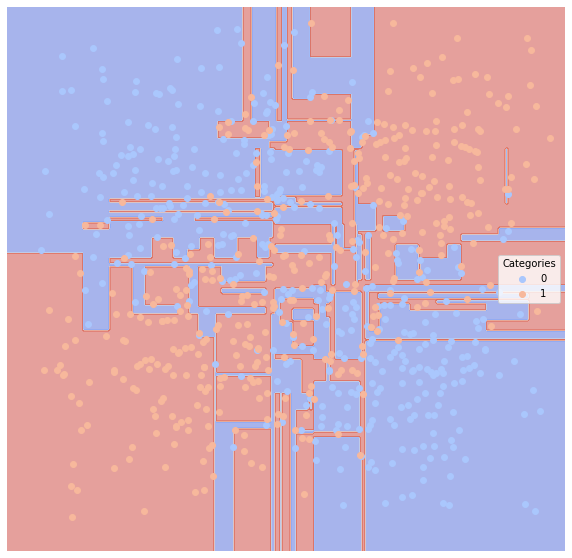

Random Forest


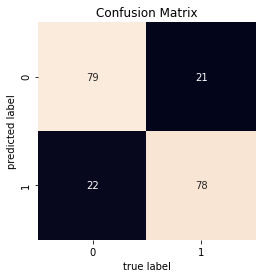

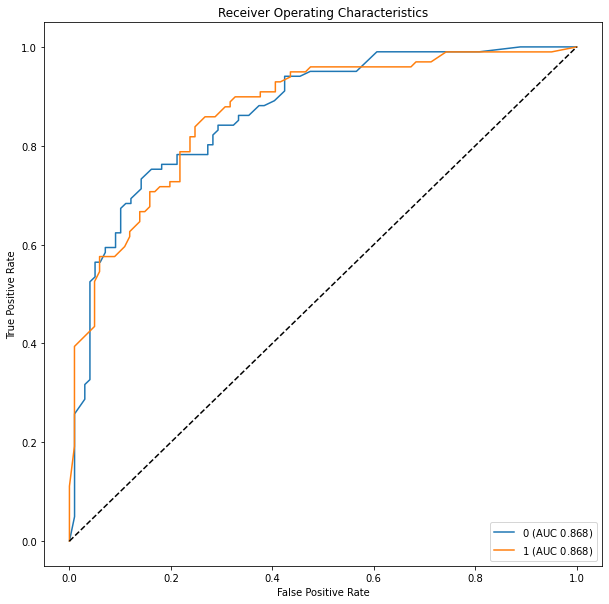

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


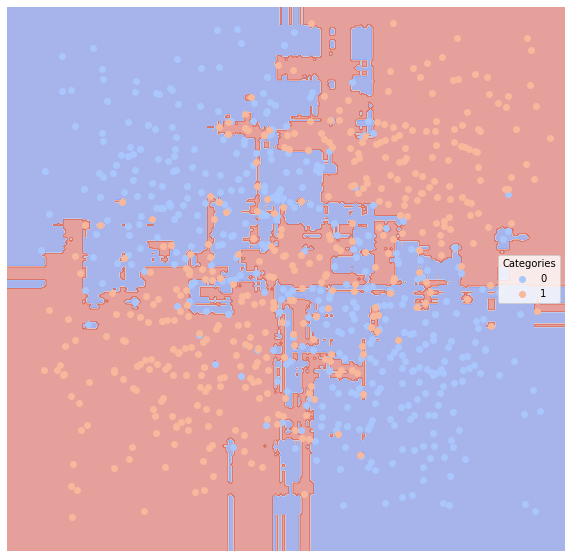

Neural Network


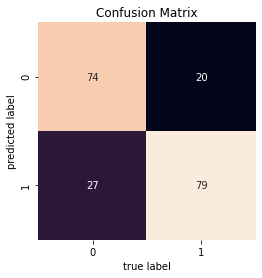

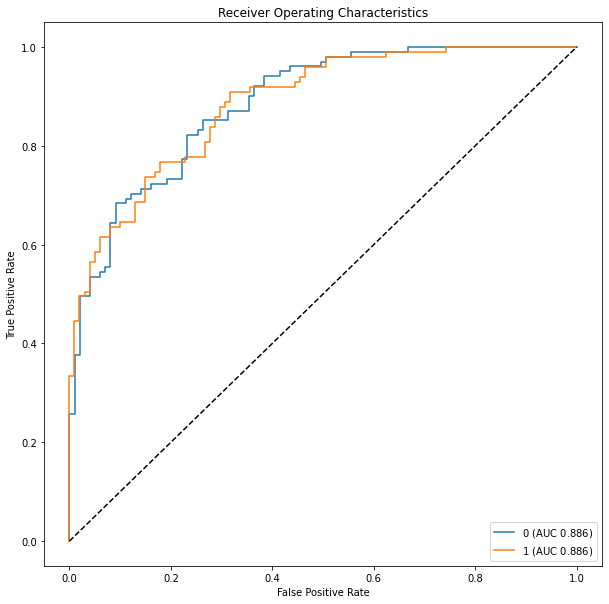

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


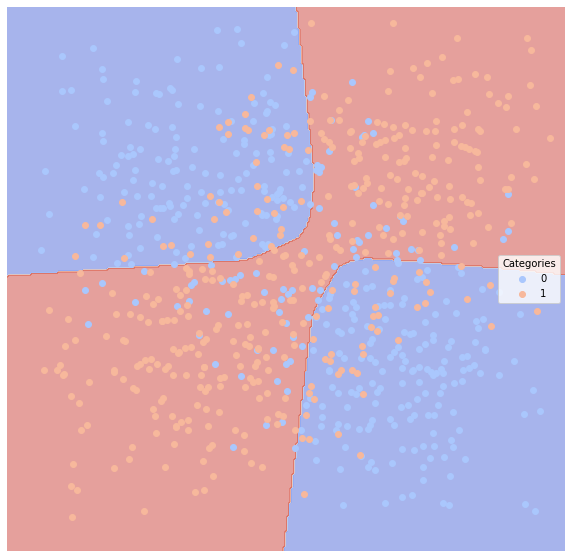

Gradient Boosting


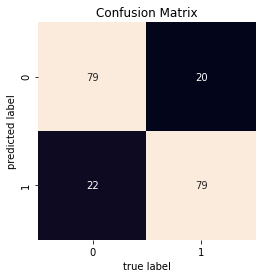

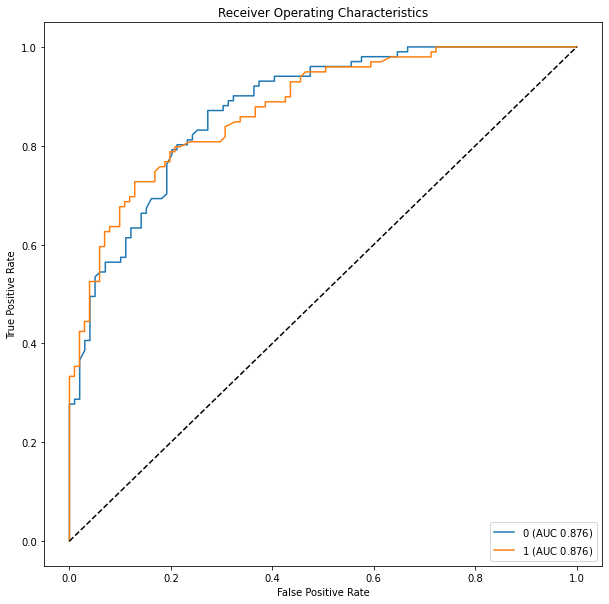

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


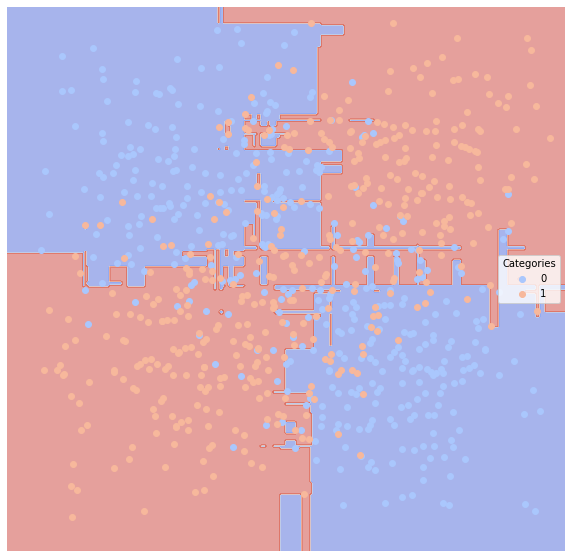

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.500,0.500050
1,clf2,SVM-linear,0.380,0.622062
2,clf3,SVM-poly,0.305,0.697020
3,clf4,KNN,0.230,0.770077
4,clf5,Linear Regression,0.445,0.556006
5,clf6,Decision Tree,0.320,0.680468
6,clf7,Random Forest,0.215,0.785029
7,clf8,Neural Network,0.235,0.765327
8,clf9,Gradient Boosting,0.210,0.790079


In [121]:
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

In this data, the two classes are split oppositely along each dimension. Among all models, random forest perform the best and niave bayes perform the worst.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


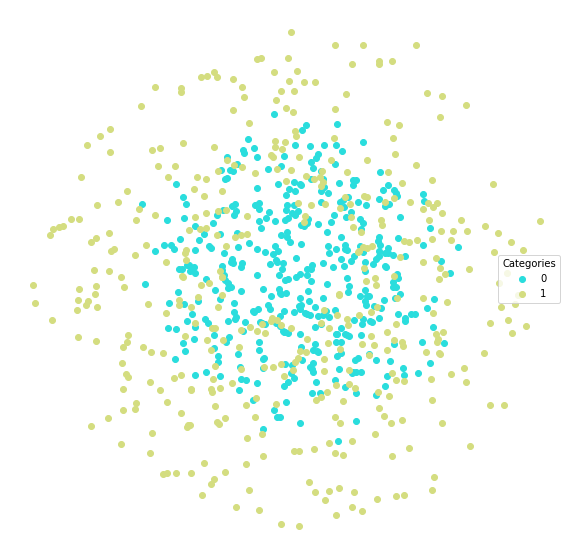

In [122]:
# 9th dataset
noise = .5
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise)) 
lucem_illud.plotter(dfTrain)

Naive Bayes


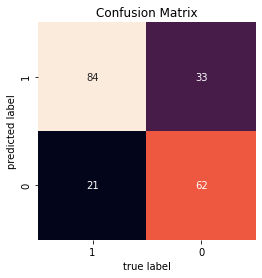

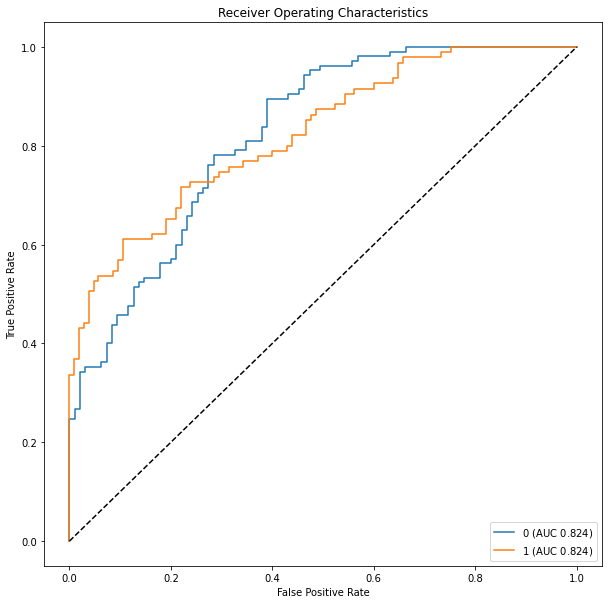

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


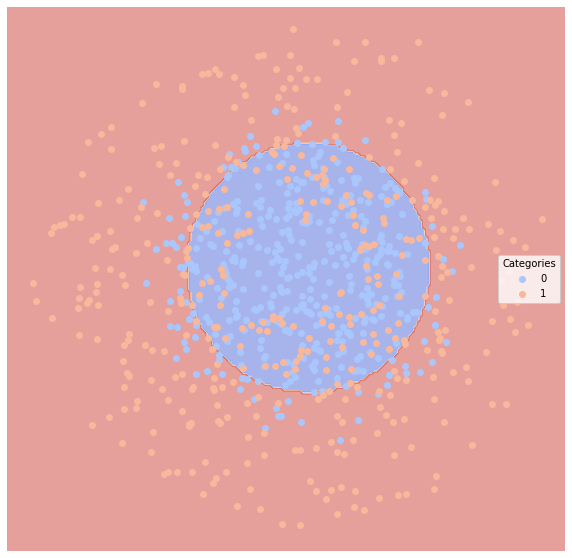

Support Vector Machine: linear


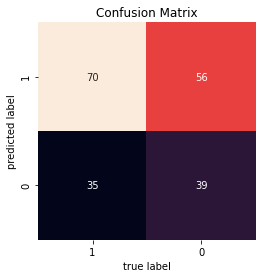

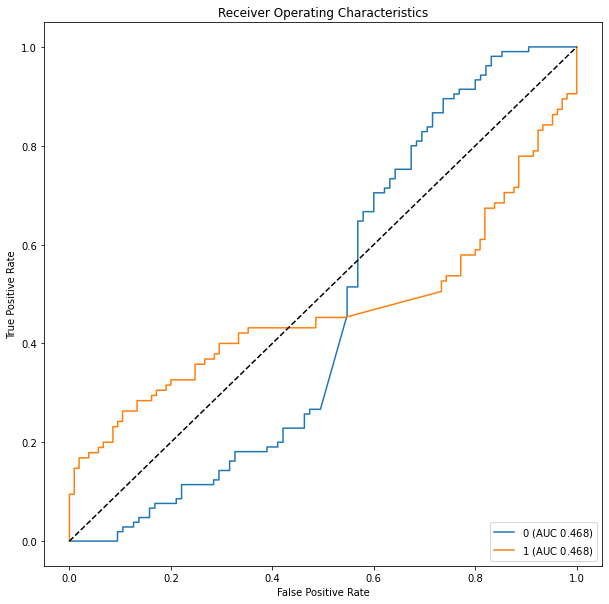

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


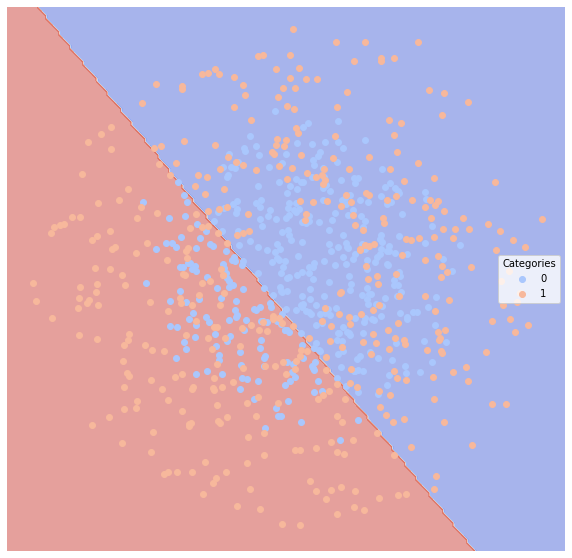

Support Vector Machine: poly


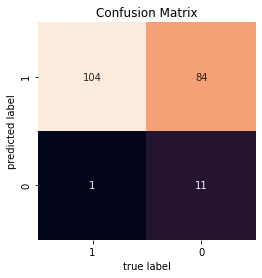

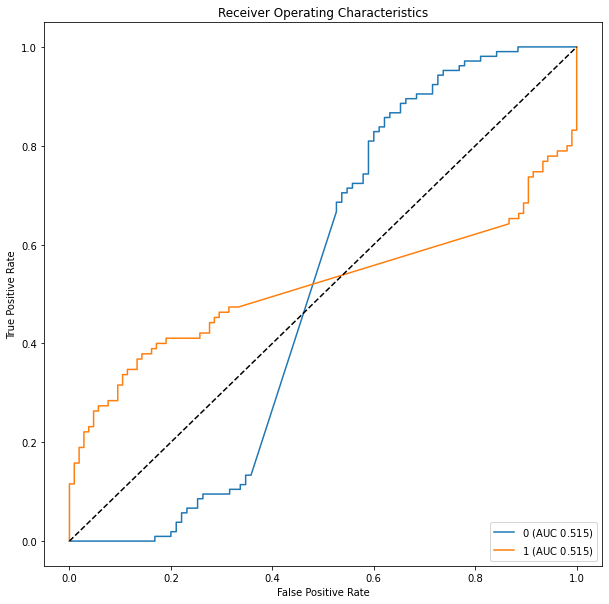

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


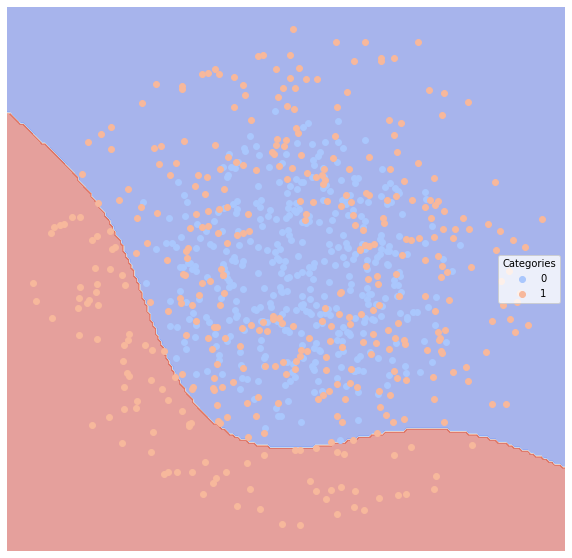

KNN


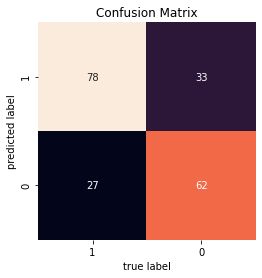

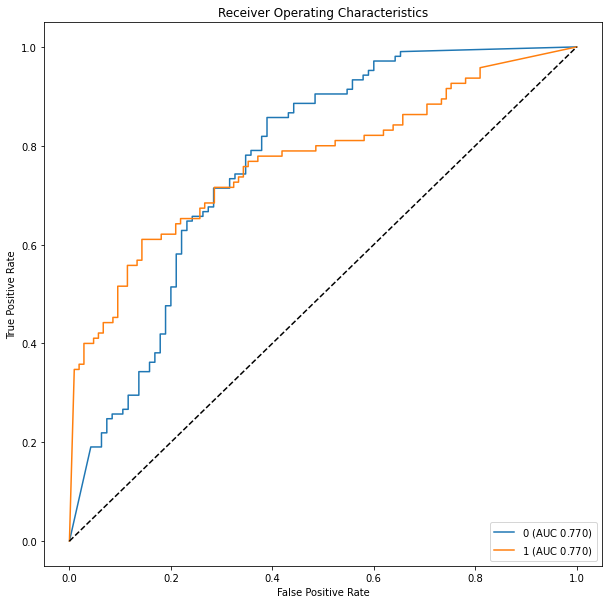

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


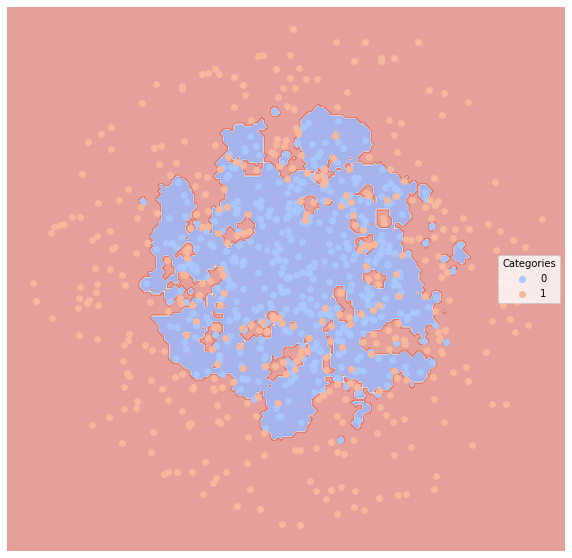

Classic Linear Regression


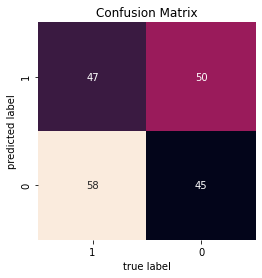

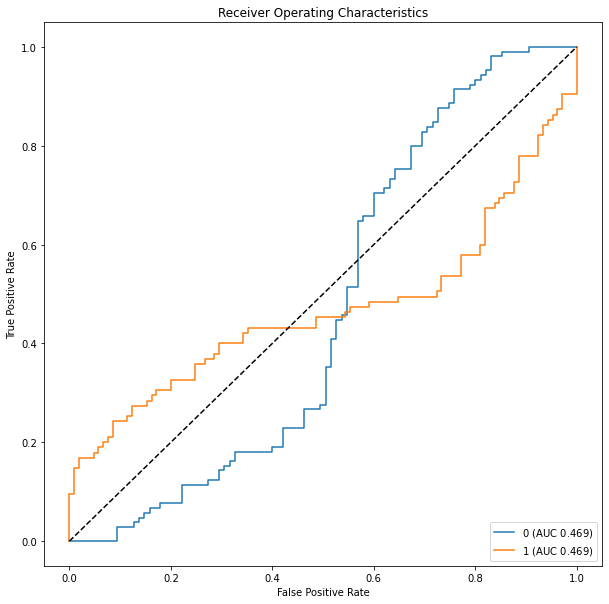

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


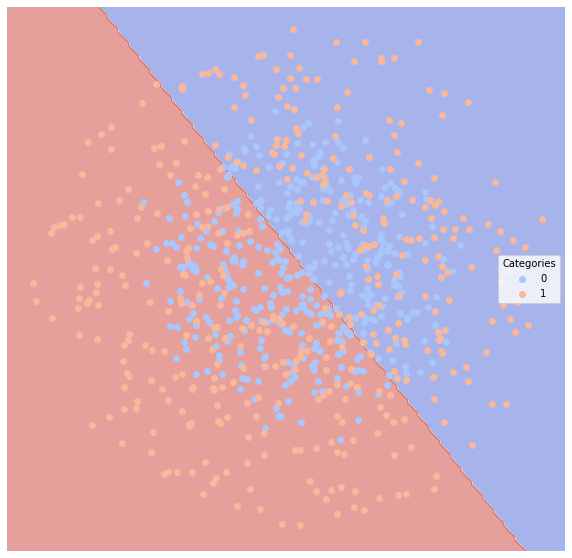

Decision Tree


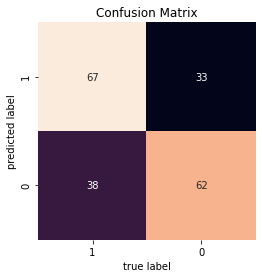

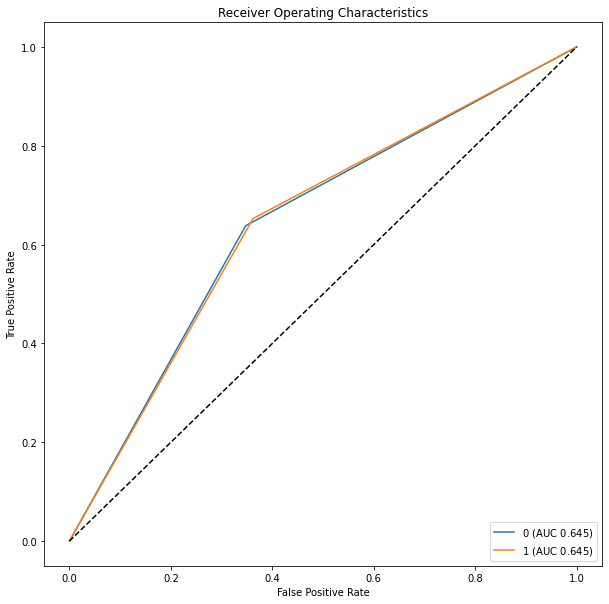

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


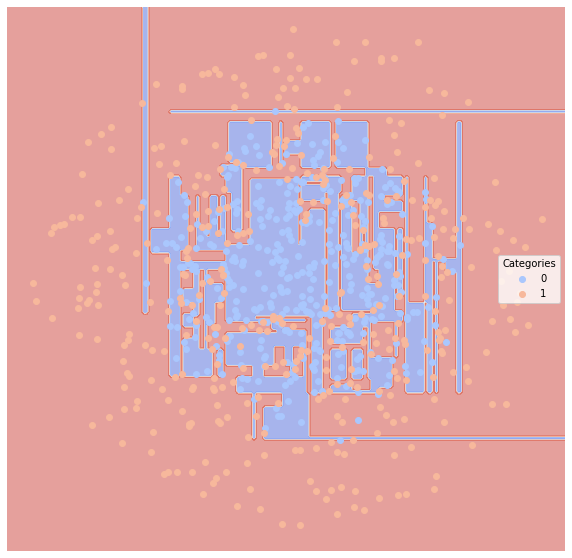

Random Forest


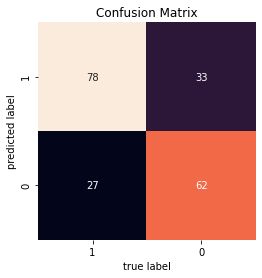

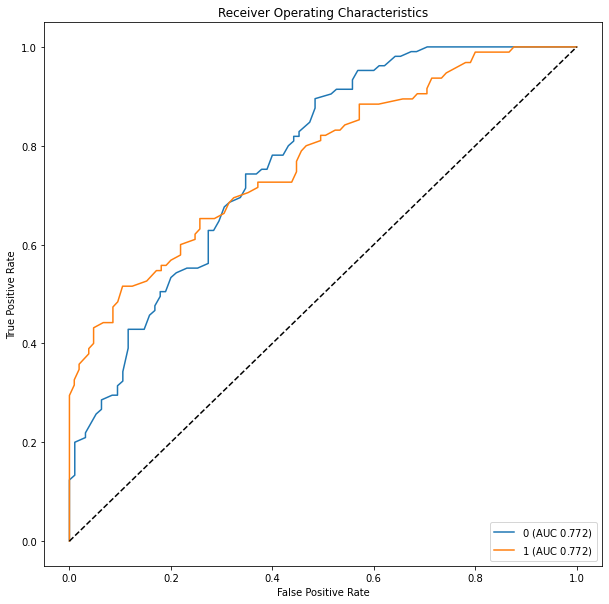

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


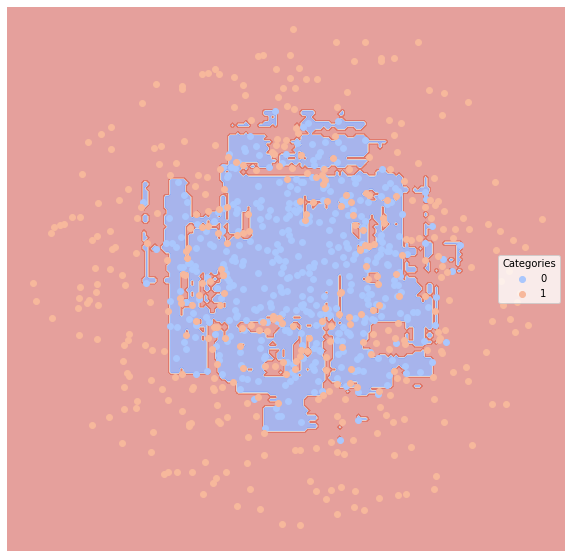

Neural Network


C:\Users\hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


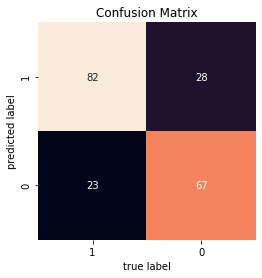

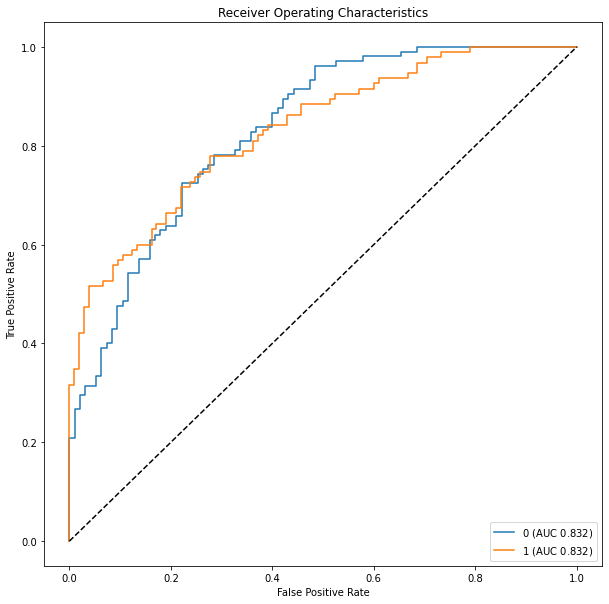

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


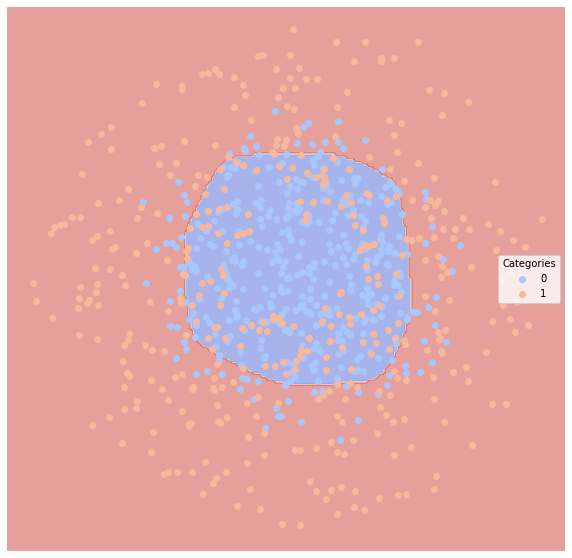

Gradient Boosting


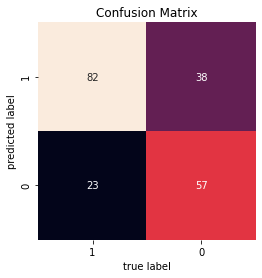

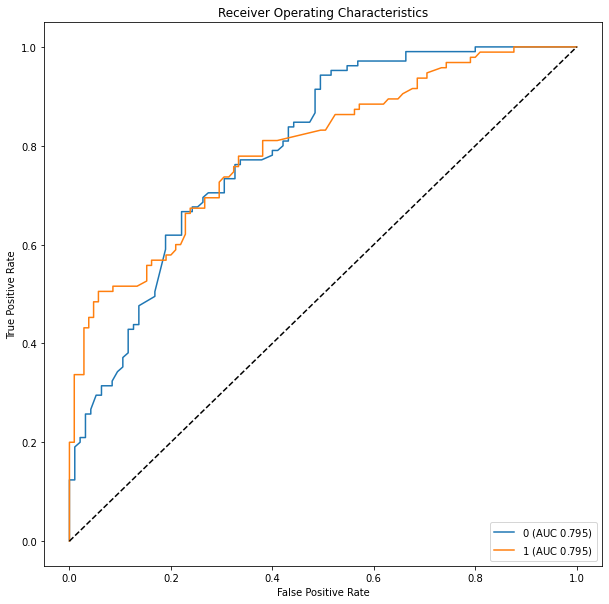

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


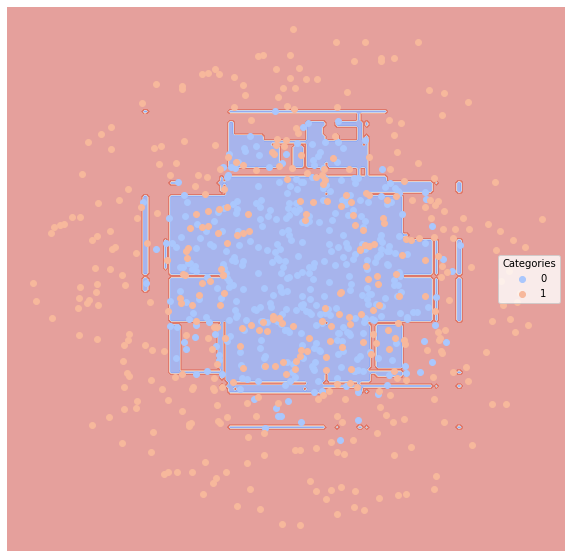

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.270,0.726316
1,clf2,SVM-linear,0.455,0.538596
2,clf3,SVM-poly,0.425,0.553133
3,clf4,KNN,0.300,0.697744
4,clf5,Linear Regression,0.540,0.460652
5,clf6,Decision Tree,0.355,0.645363
6,clf7,Random Forest,0.300,0.697744
7,clf8,Neural Network,0.255,0.743108
8,clf9,Gradient Boosting,0.305,0.690476


In [123]:
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

In this set, one class is nested within the other in two dimensions and the noise level is 0.5. We can find that neural network and naive bayes perform the best.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

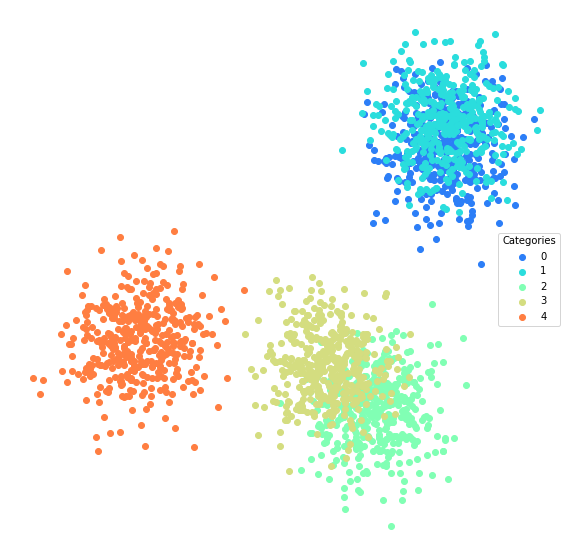

In [129]:
# 10th dataset
noise = .5
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise)) 
lucem_illud.plotter(dfTrain)

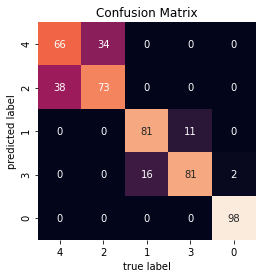

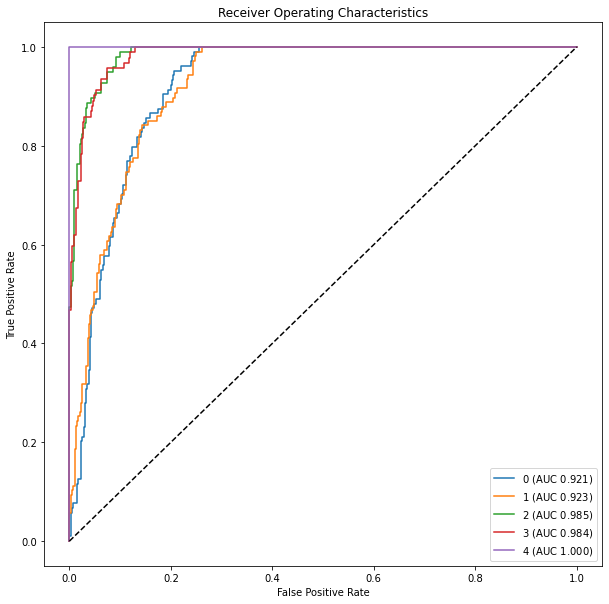

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

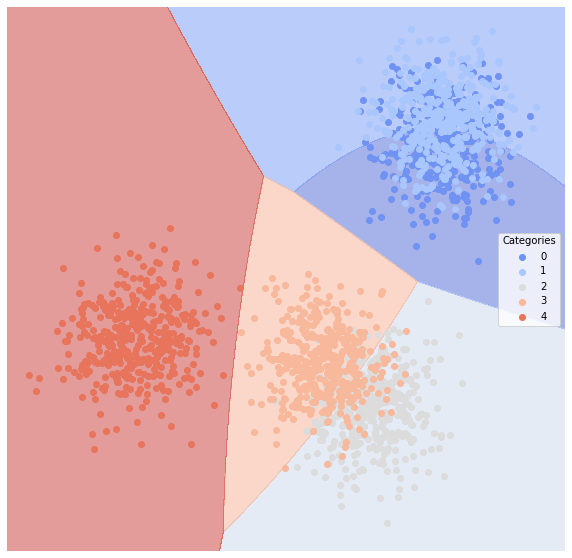

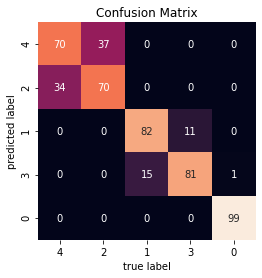

The <class 'sklearn.svm._classes.SVC'> classifier does not apear to support prediction probabilties, so an ROC curve can't be created. You can try adding `probability = True` to the model specification or use a different model.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

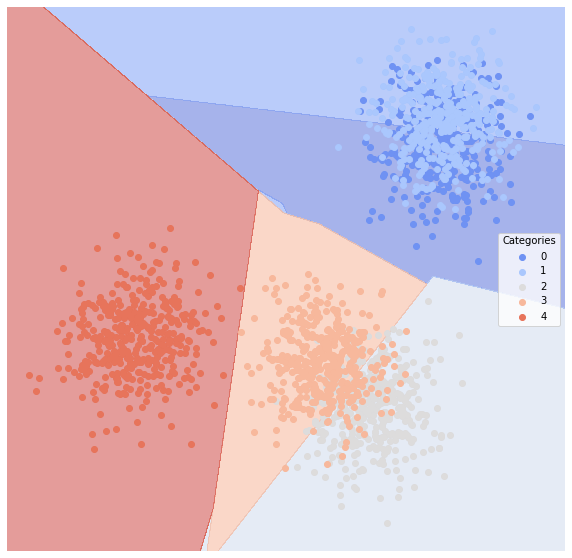

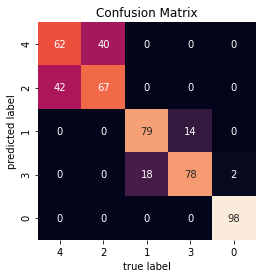

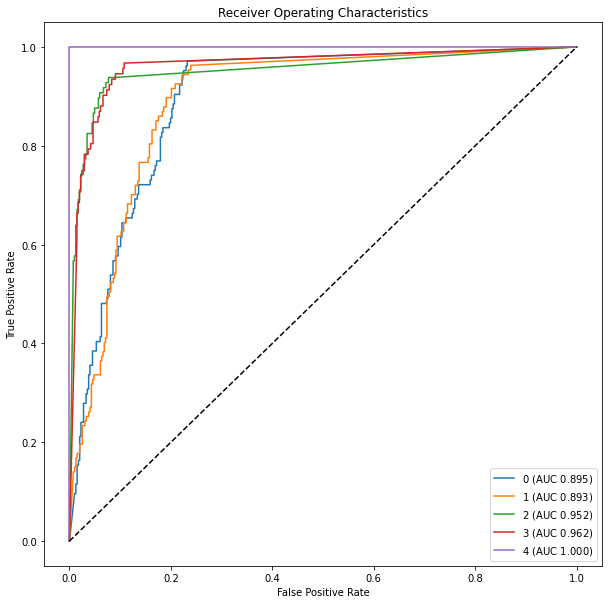

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

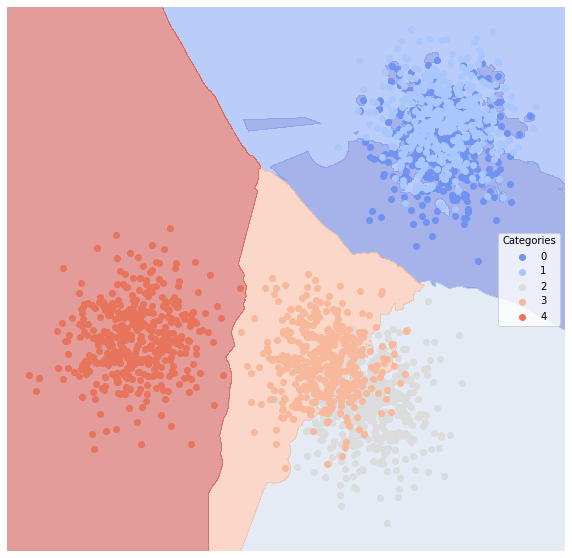

C:\Users\hp\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


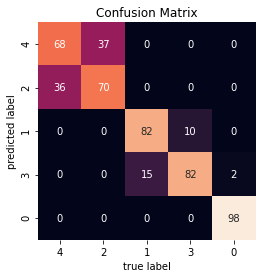

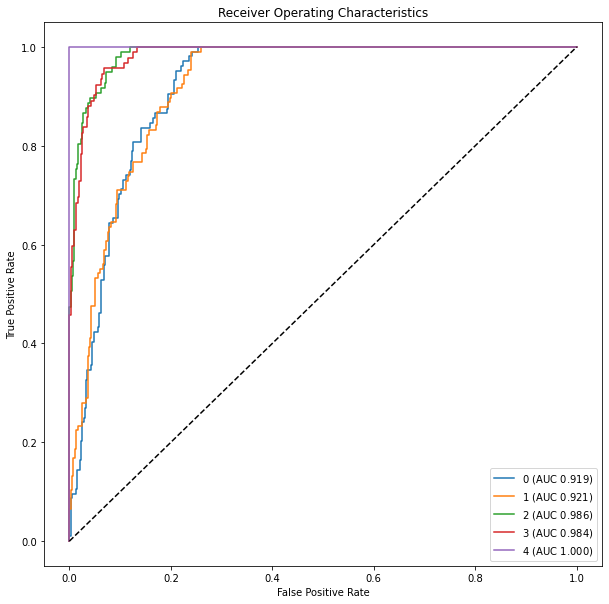

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

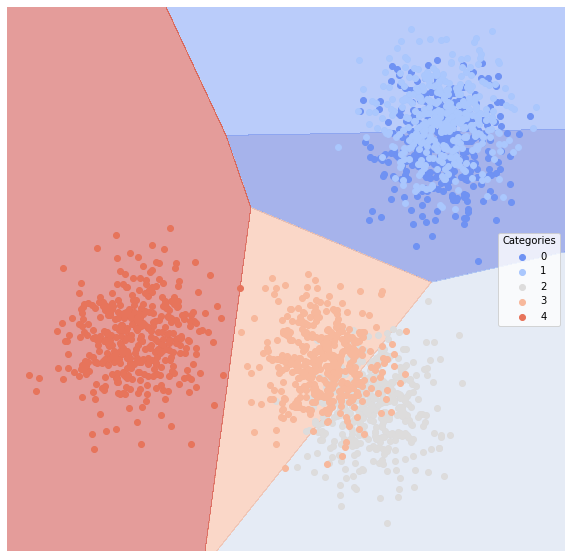

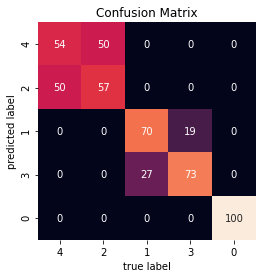

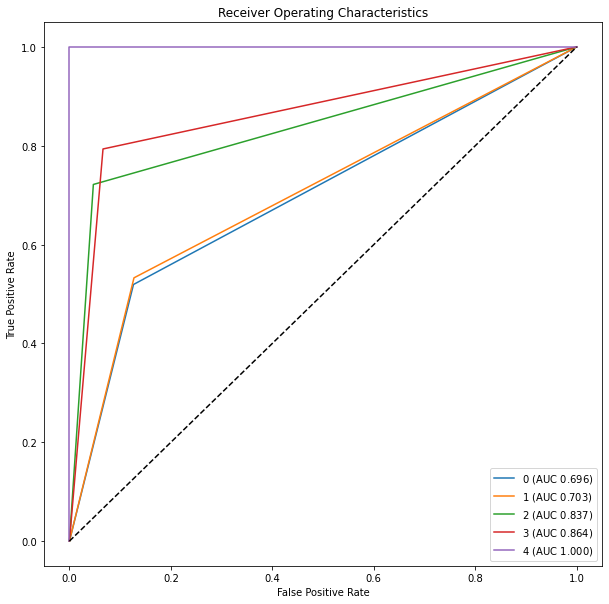

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

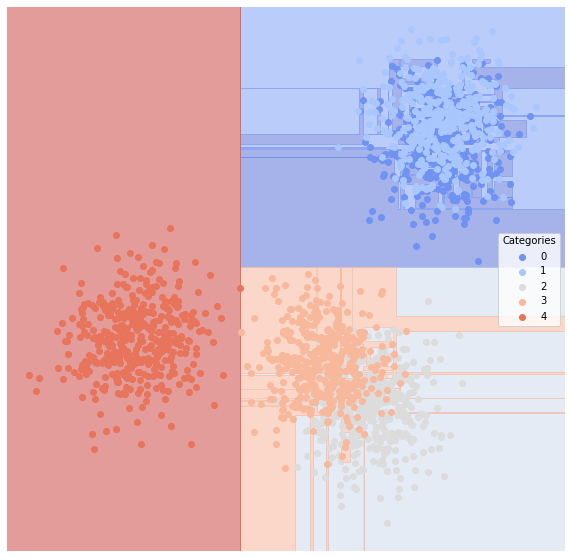

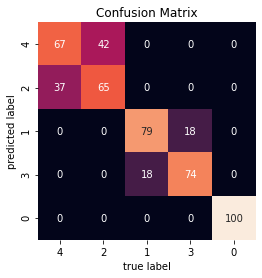

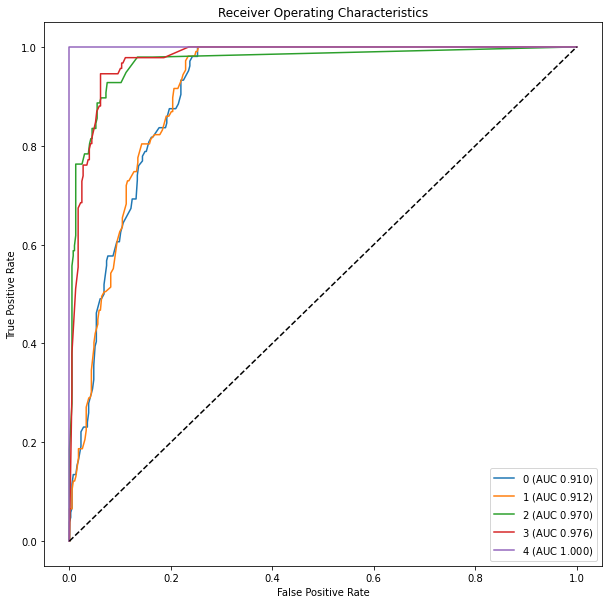

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

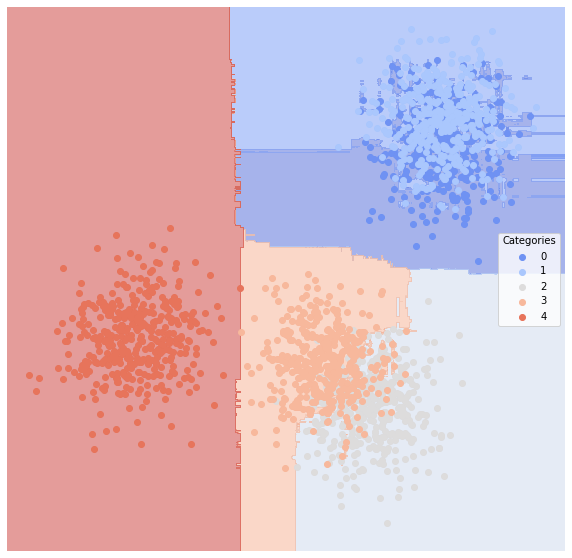

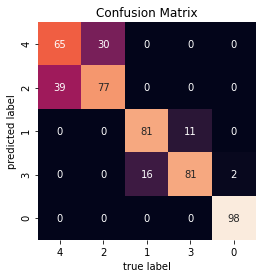

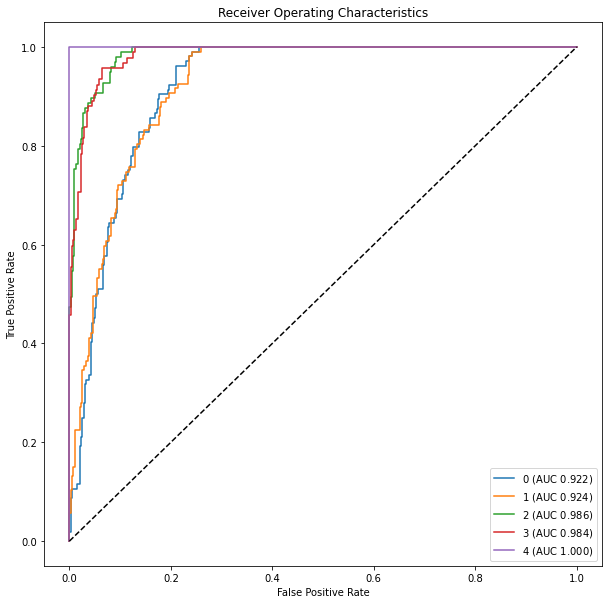

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

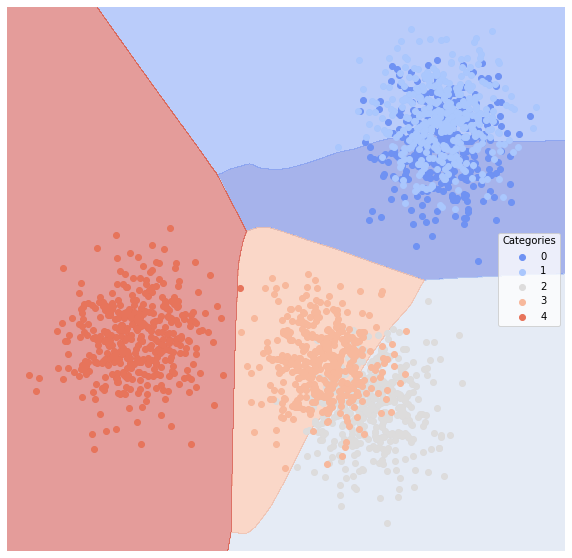

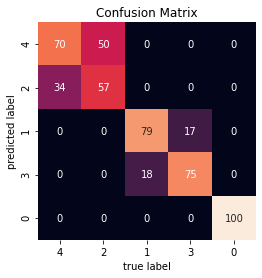

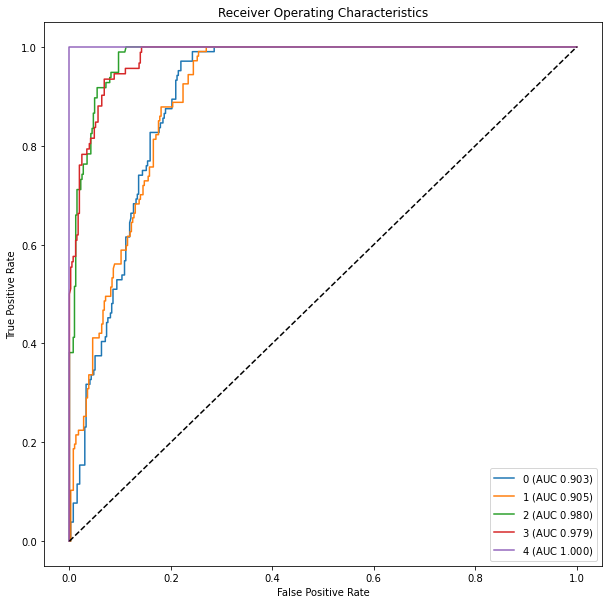

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

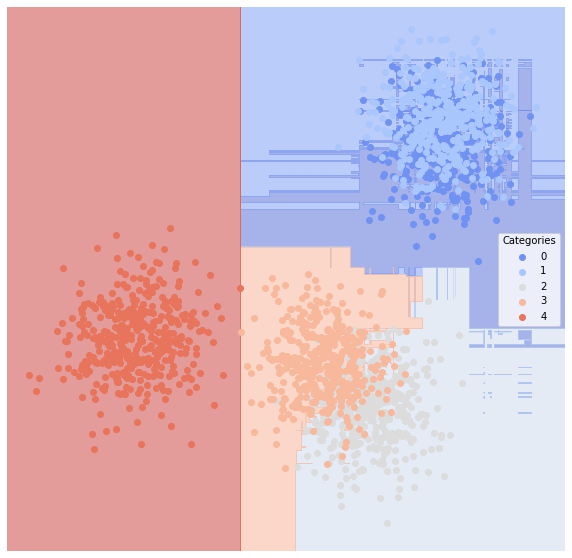

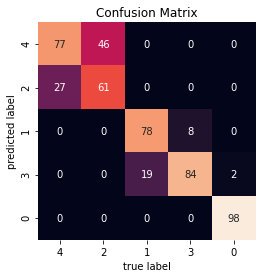

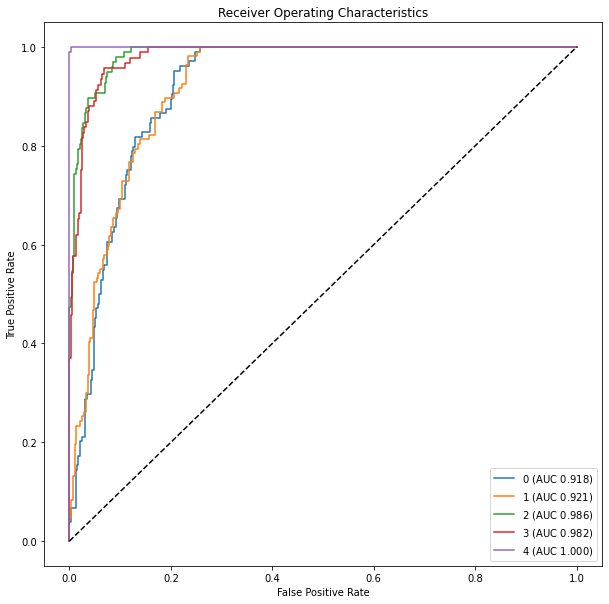

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

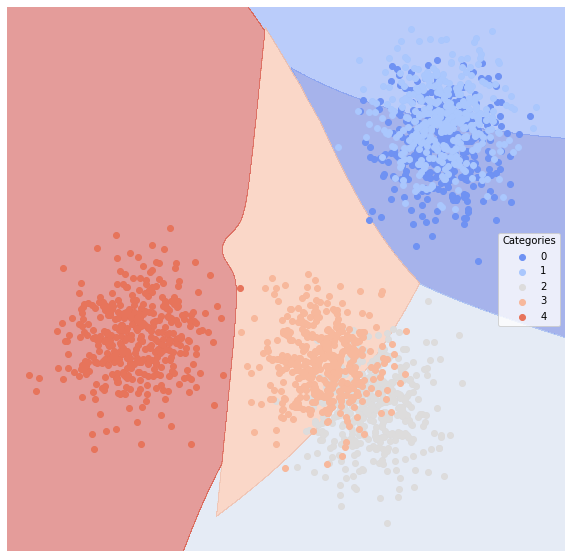

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.144,0.774378
1,clf2,SVM-linear,0.142,0.789821
2,clf3,SVM-poly,0.164,0.747572
3,clf4,KNN,0.146,0.780206
4,clf5,Linear Regression,0.200,0.696484
5,clf6,Decision Tree,0.158,0.769085
6,clf7,Random Forest,0.138,0.774621
7,clf8,Neural Network,0.168,0.773407
8,clf9,Gradient Boosting,0.146,0.812111


In [130]:
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = False) #slow, set probability = False to speed up

clf9 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf3 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf4 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf5 = sklearn.tree.DecisionTreeClassifier()

clf6 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf7 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf8 = sklearn.ensemble.GradientBoostingClassifier()

clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

In this last data set, 5 classess are placed as bivariate Gaussians at random locations. Gradient boosting performs the best.

### Empirical Dataset

#### Newsgroups

Loading data for: comp.sys.mac.hardware
Loading data for: comp.windows.x
Loading data for: misc.forsale
Loading data for: rec.autos
Converting to vectors
Naive Bayes


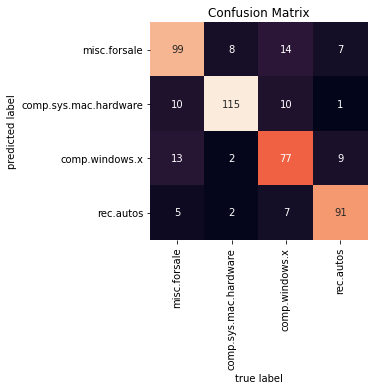

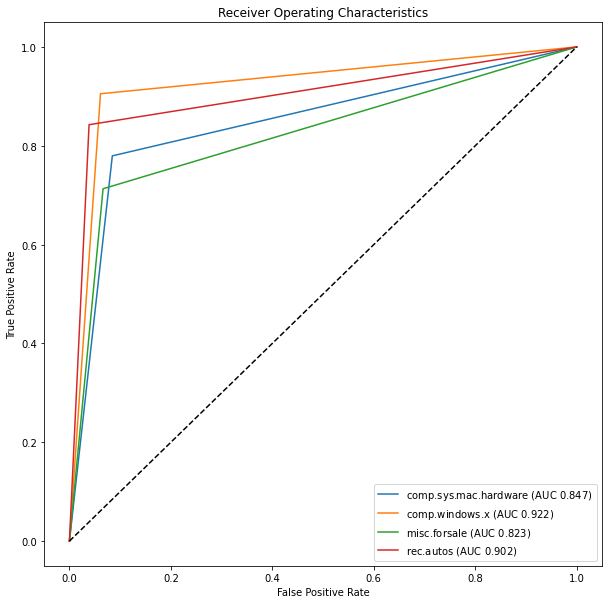

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

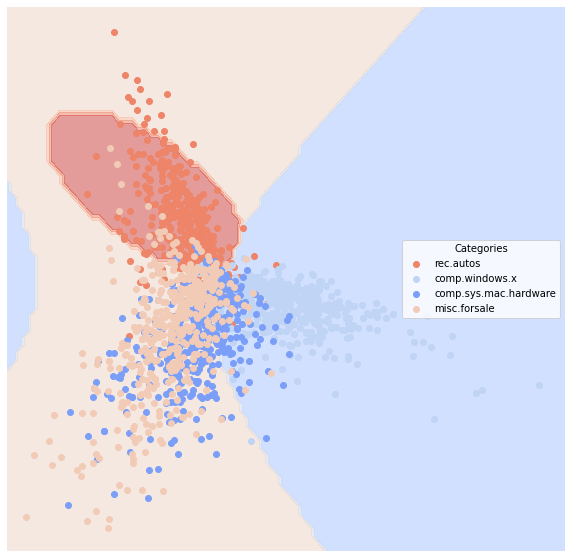

Support Vector Machine: linear


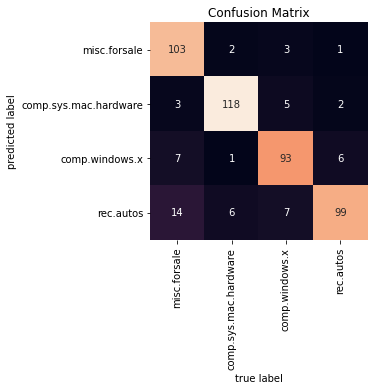

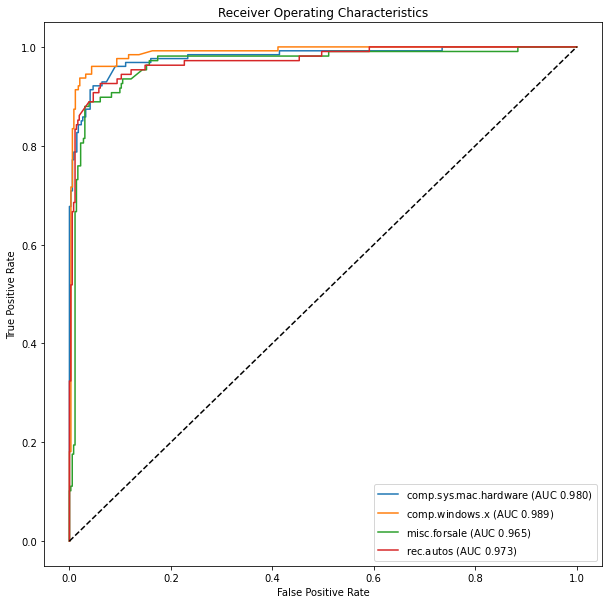

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

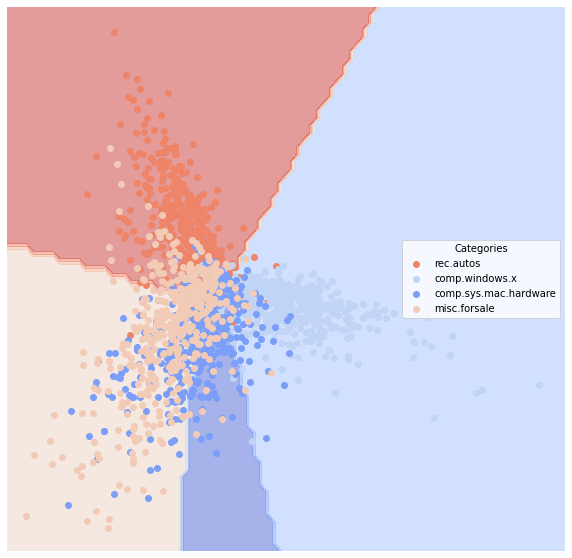

Support Vector Machine: poly


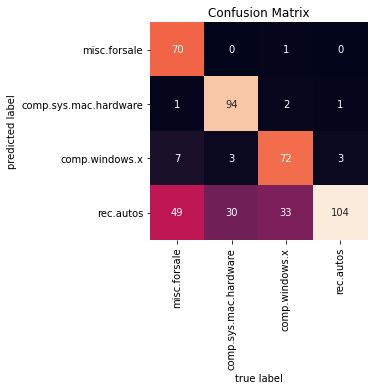

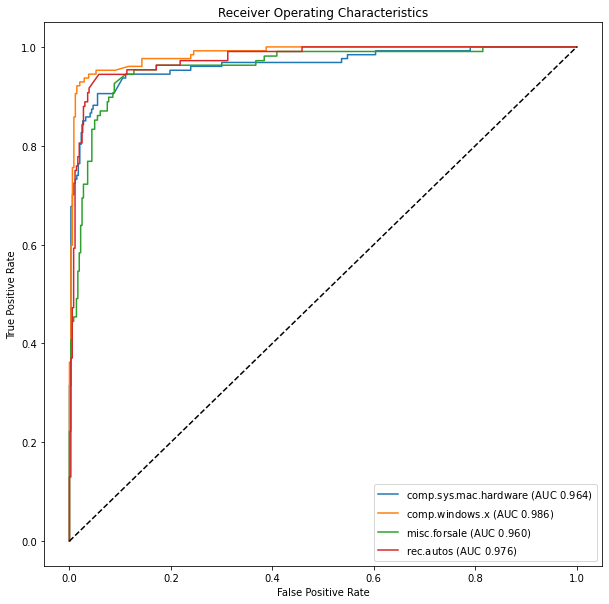

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

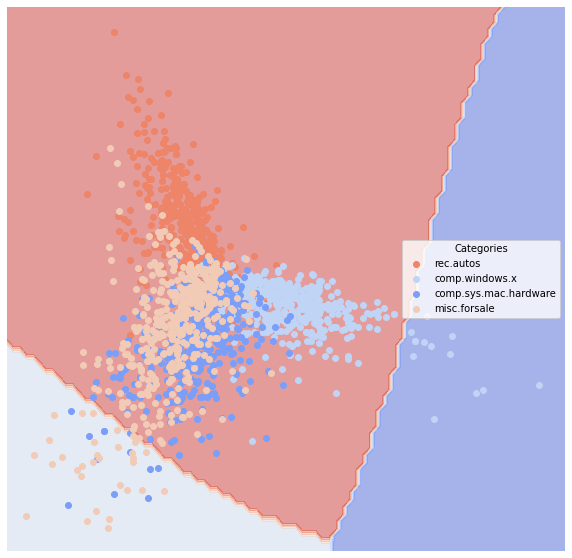

KNN


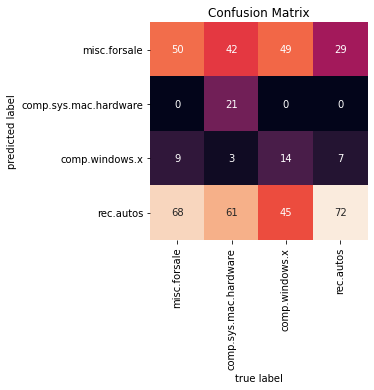

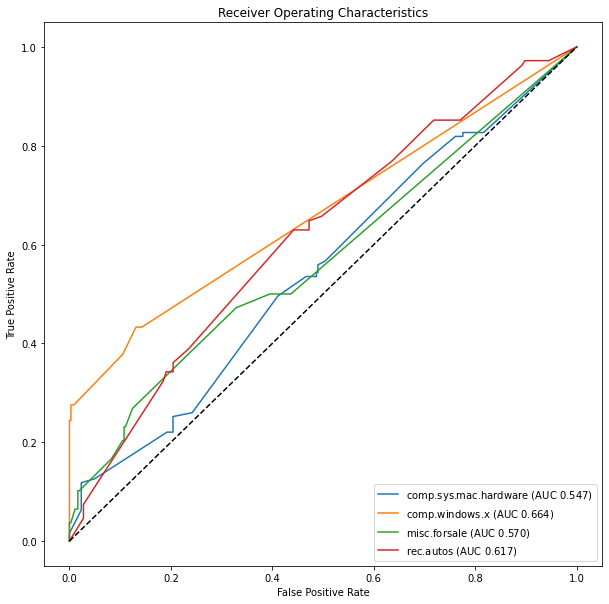

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

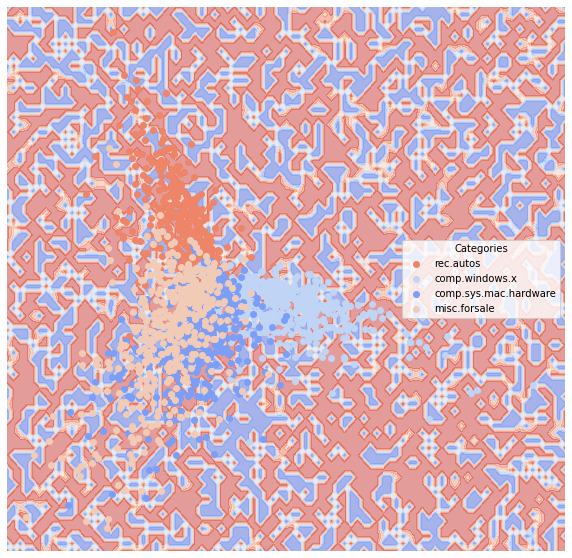

Classic Linear Regression


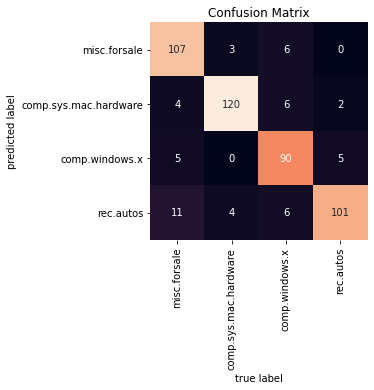

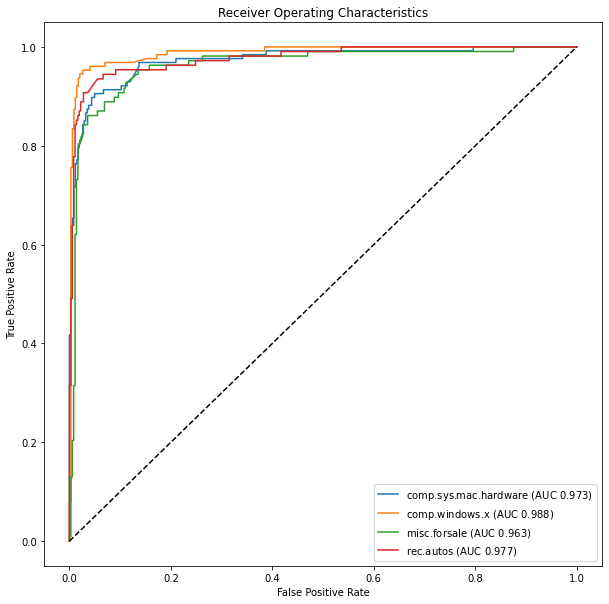

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

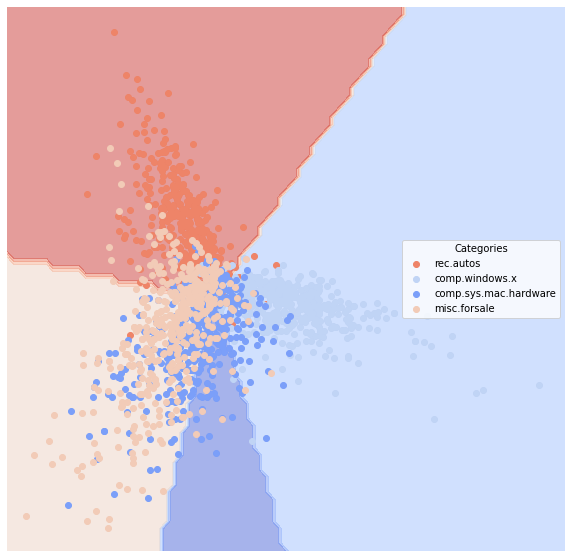

Decision Tree


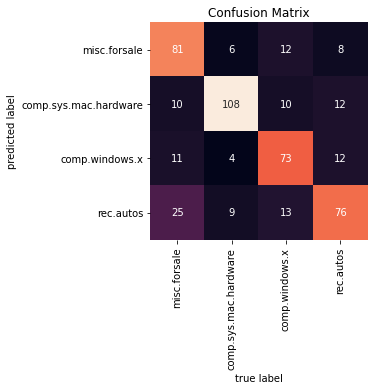

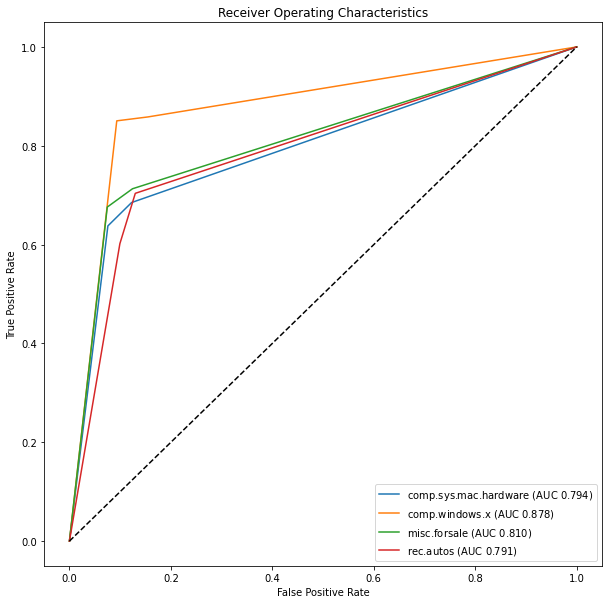

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

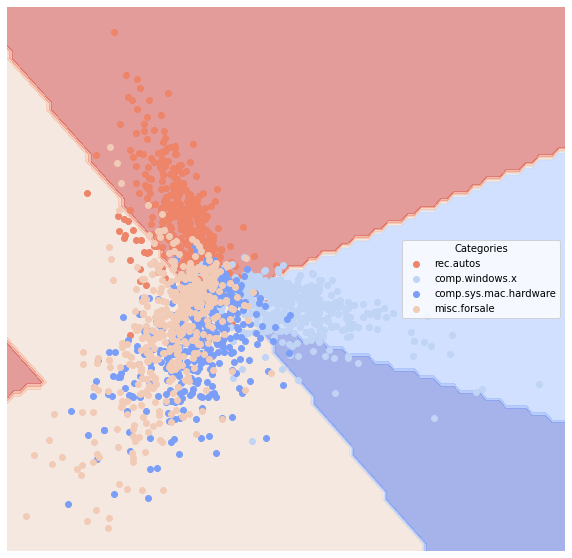

Random Forest


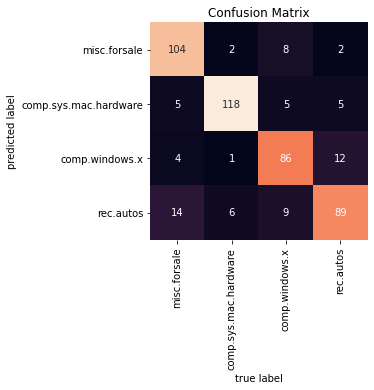

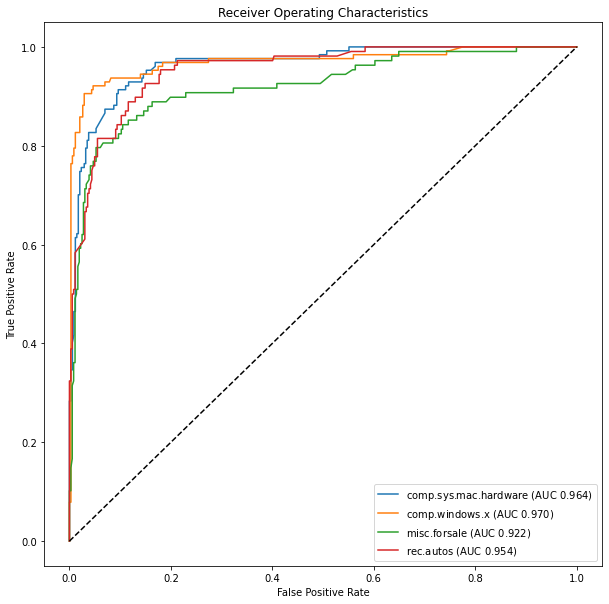

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

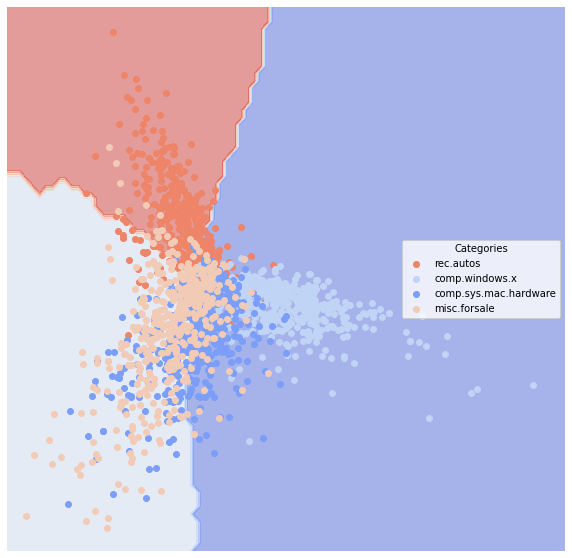

Neural Network


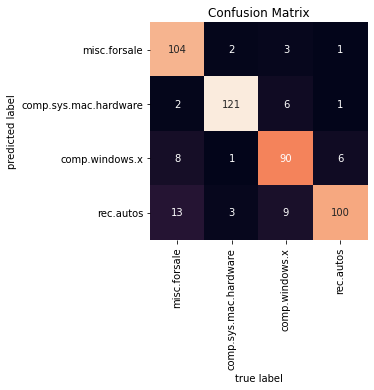

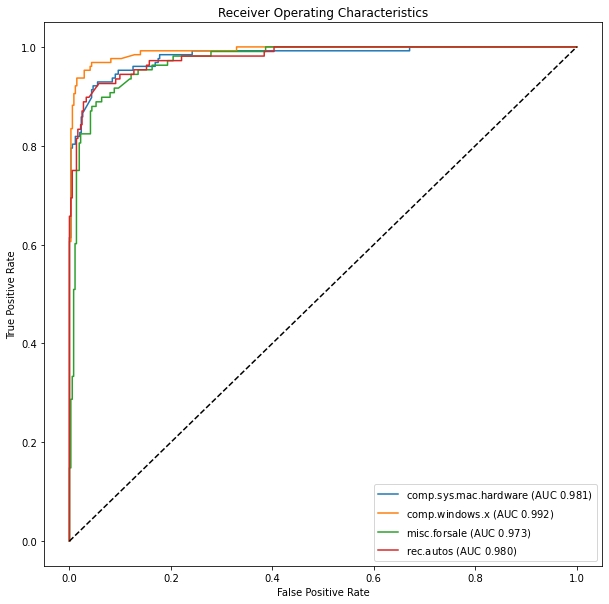

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

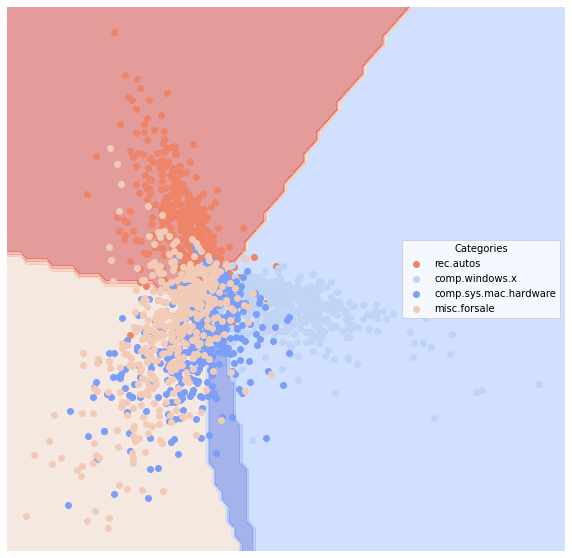

Gradient Boosting


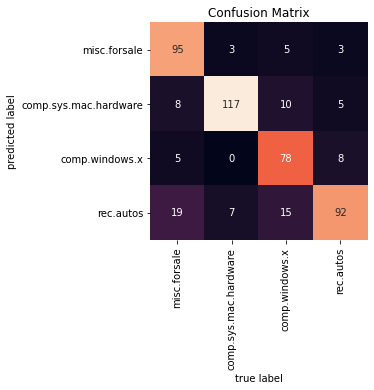

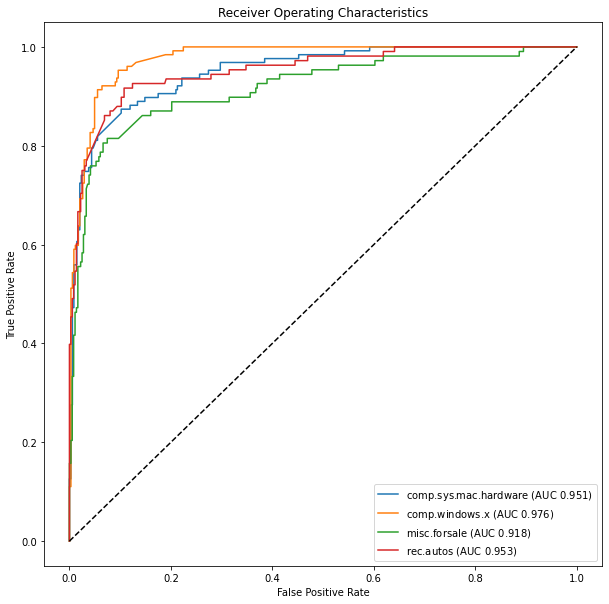

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

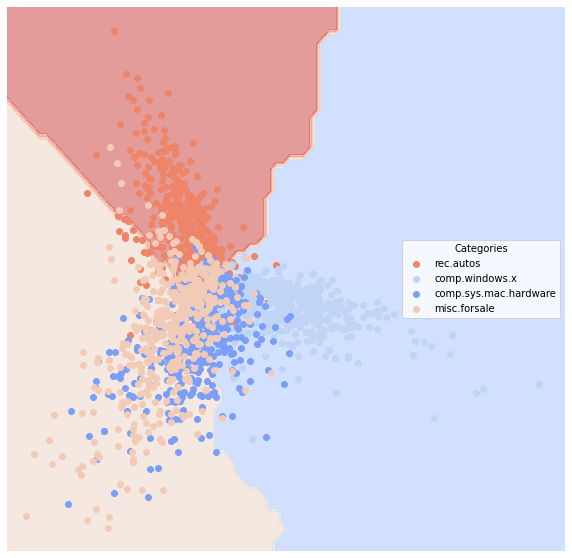

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.065957,0.901959
1,clf2,SVM-linear,0.076596,0.921041
2,clf3,SVM-poly,0.246809,0.826785
3,clf4,KNN,0.446809,0.593002
4,clf5,Linear Regression,0.059574,0.938587
5,clf6,Decision Tree,0.168085,0.786935
6,clf7,Random Forest,0.102128,0.871982
7,clf8,Neural Network,0.070213,0.928433
8,clf9,Gradient Boosting,0.121277,0.869296


In [131]:
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadNewsGroups())
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

For the news group data, we have 4 levels in the category variable, and vectorized text. Among all models, Linear regression (surprisingly!) performs the best and has the largest AUC.

#### Senate Small

Loading senate data
Converting to vectors
Naive Bayes


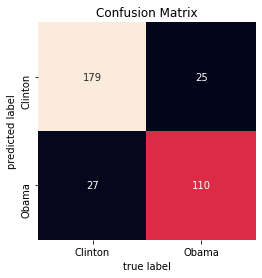

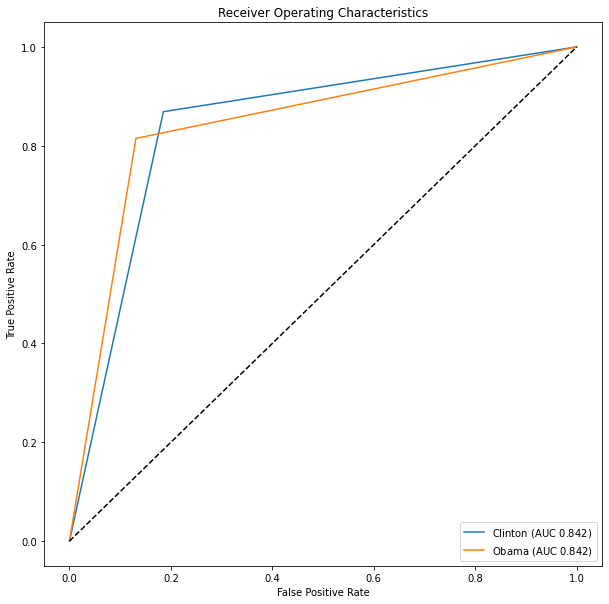

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


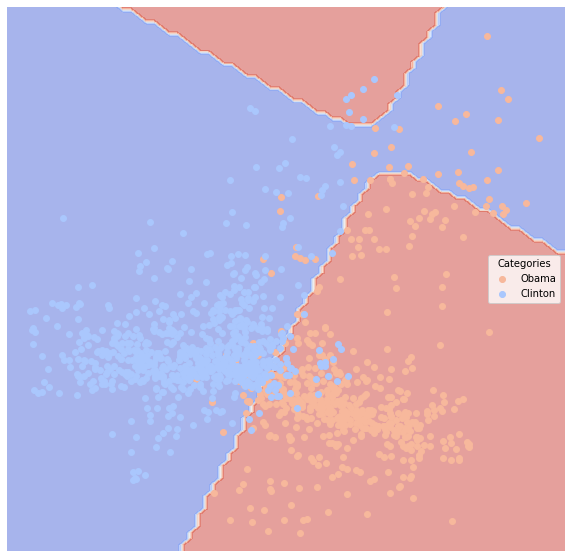

Support Vector Machine: linear


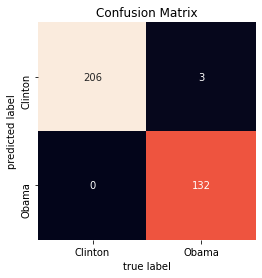

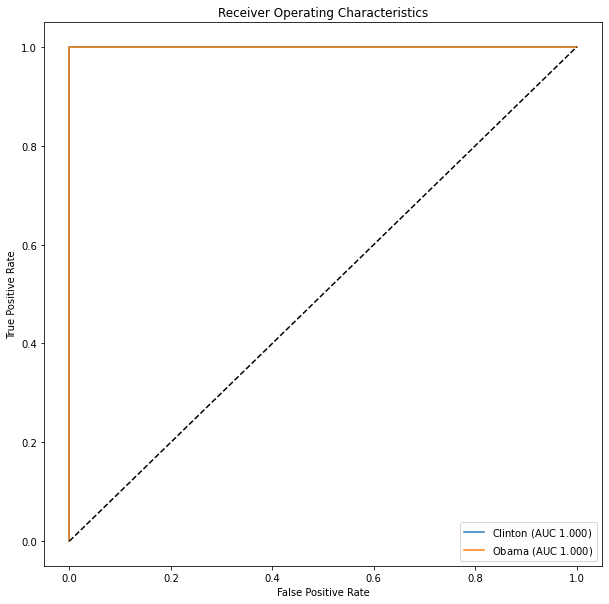

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


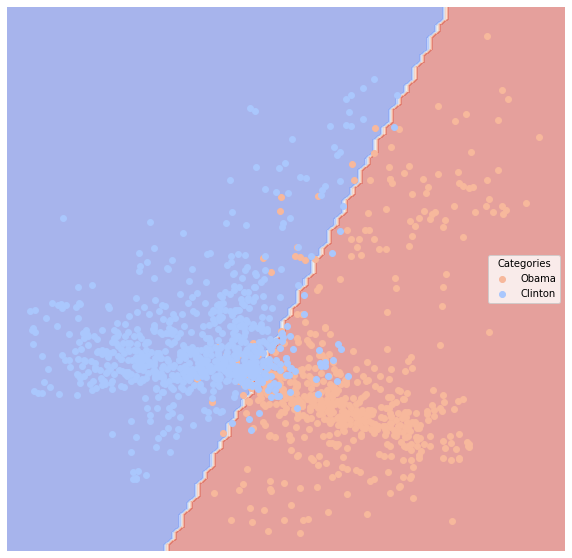

Support Vector Machine: poly


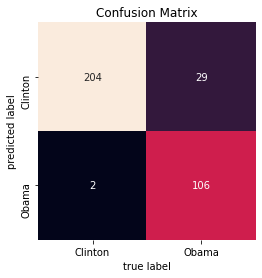

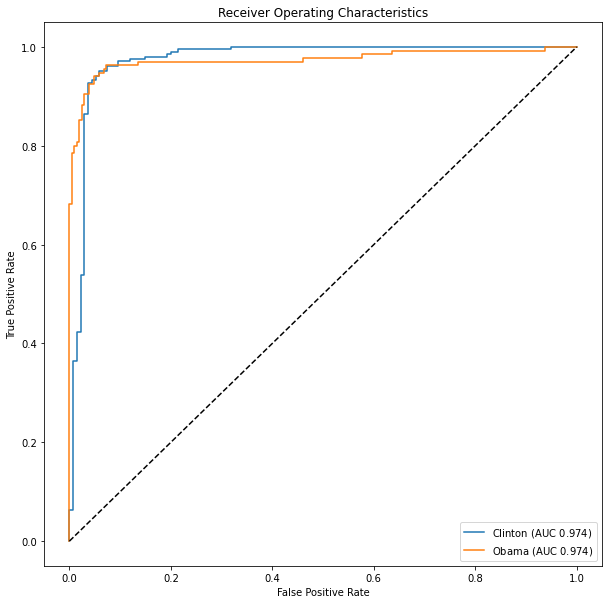

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


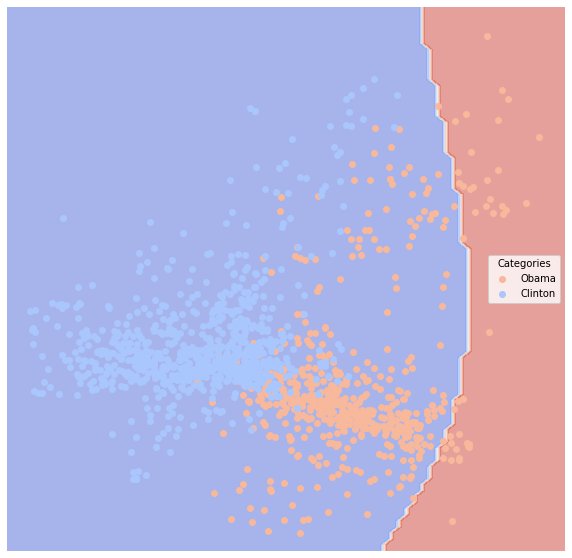

KNN


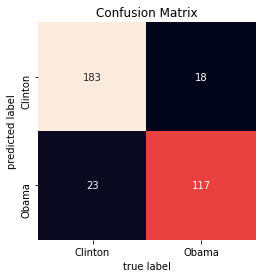

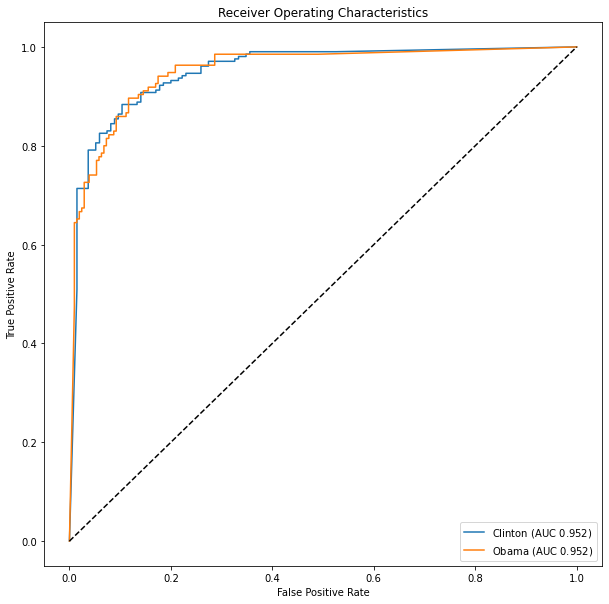

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


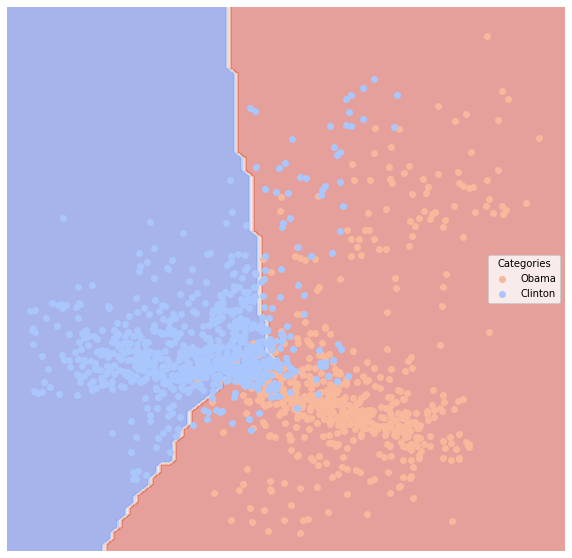

Classic Linear Regression


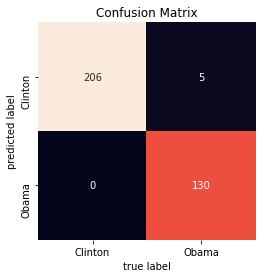

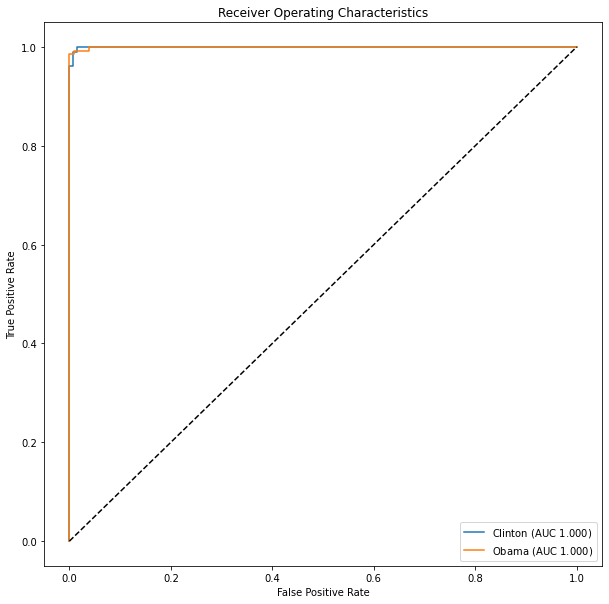

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


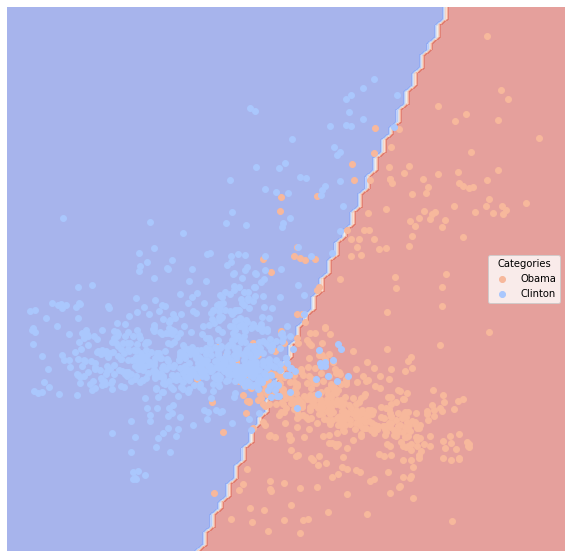

Decision Tree


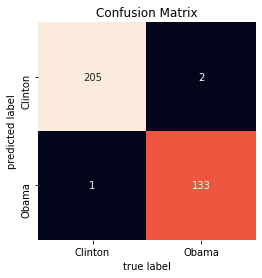

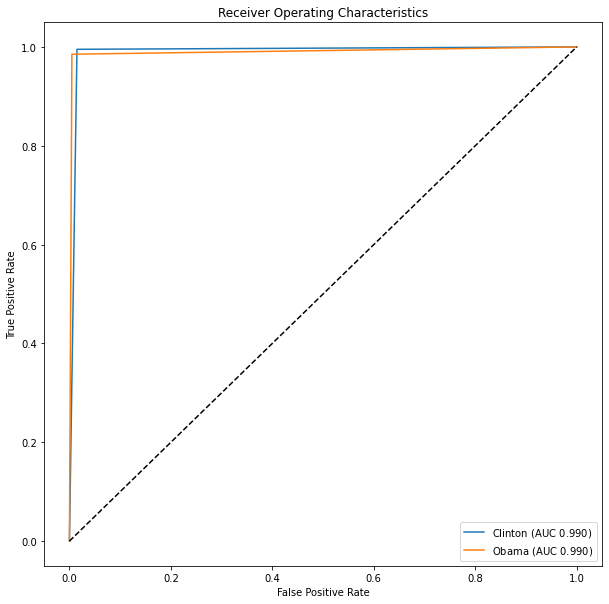

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


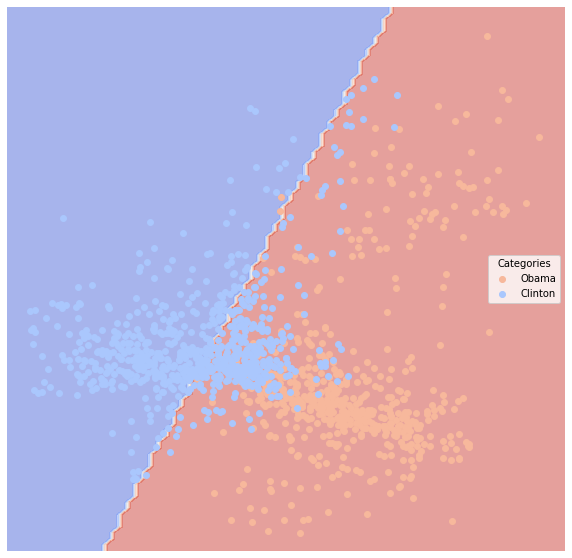

Random Forest


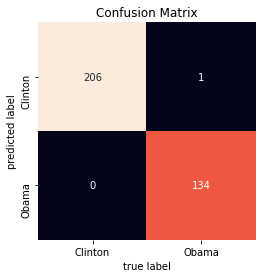

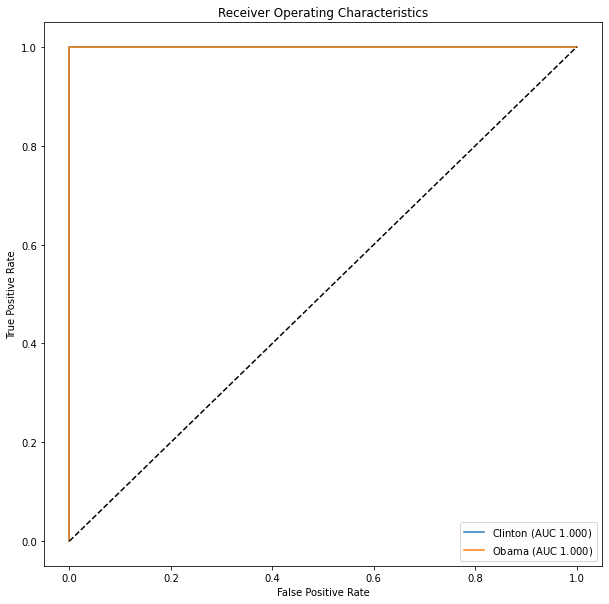

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


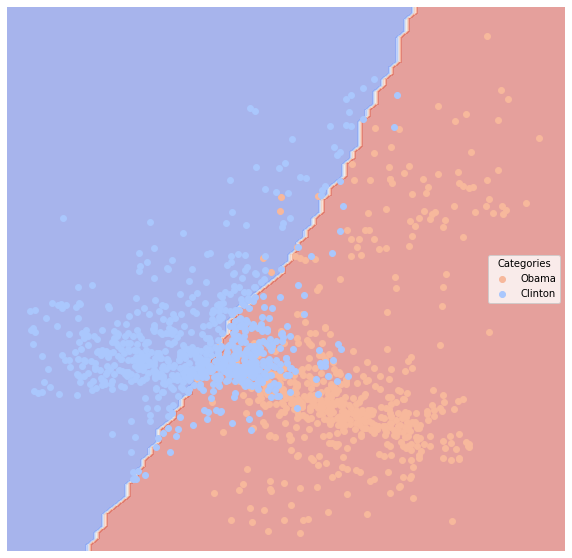

Neural Network


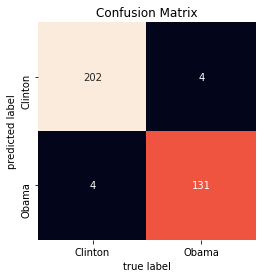

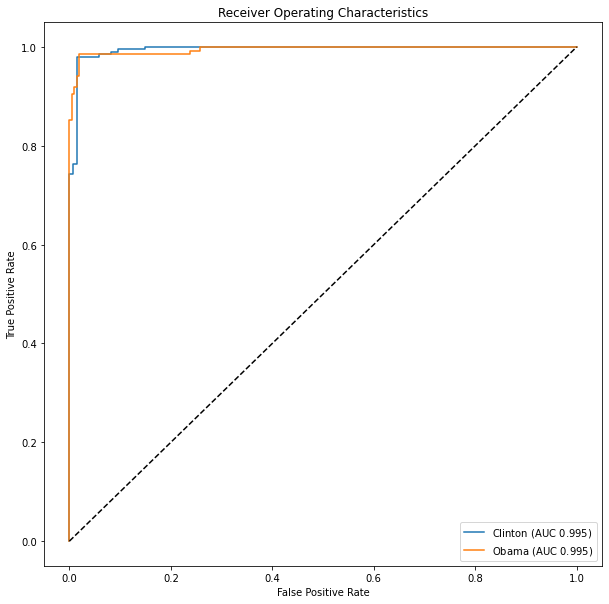

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


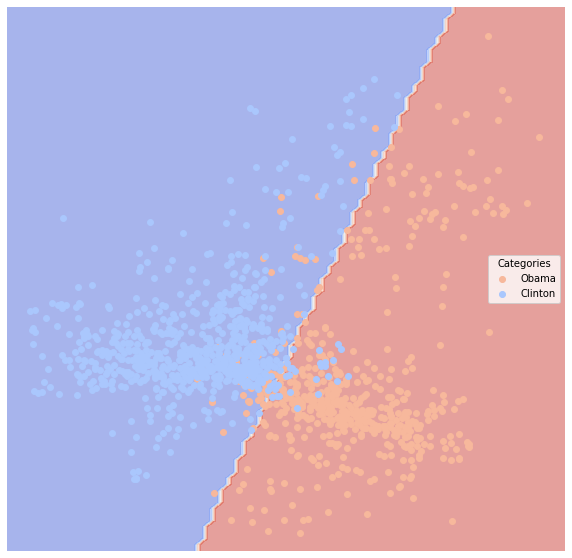

Gradient Boosting


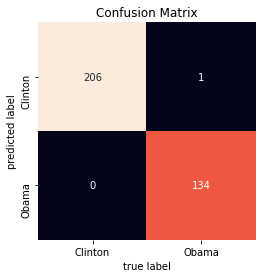

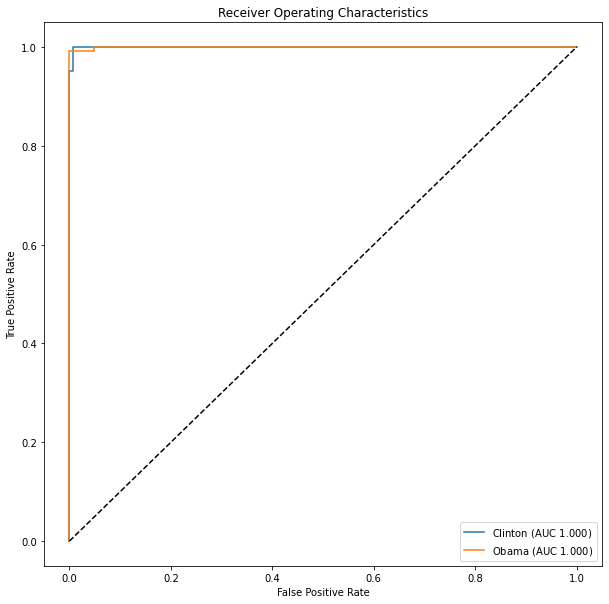

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


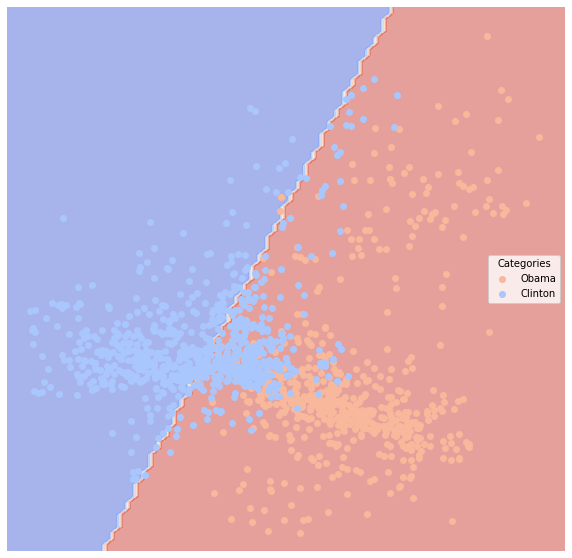

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.152493,0.841873
1,clf2,SVM-linear,0.008798,0.988889
2,clf3,SVM-poly,0.090909,0.887738
3,clf4,KNN,0.120235,0.877508
4,clf5,Linear Regression,0.014663,0.981481
5,clf6,Decision Tree,0.008798,0.990165
6,clf7,Random Forest,0.002933,0.996296
7,clf8,Neural Network,0.023460,0.975476
8,clf9,Gradient Boosting,0.002933,0.996296


In [134]:
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())

#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pd.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

All models perform very well. Among them, Decision tree, random forest and gradient boosting have excellent accuracy (over 0.99 AUC)

#### Senate Large

This model runs so slow (almost 1 hour!!!) So I have to change the parameter of SVM to `probability = False` and limit the line of data

Loading senator: Kennedy
Loading senator: Kerry
Loading senator: Klobuchar
Loading senator: Kohl
Loading senator: Kyl
Converting to vectors
Naive Bayes


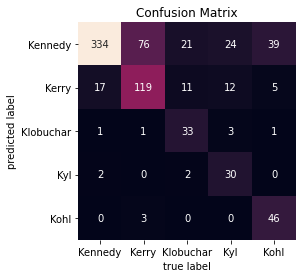

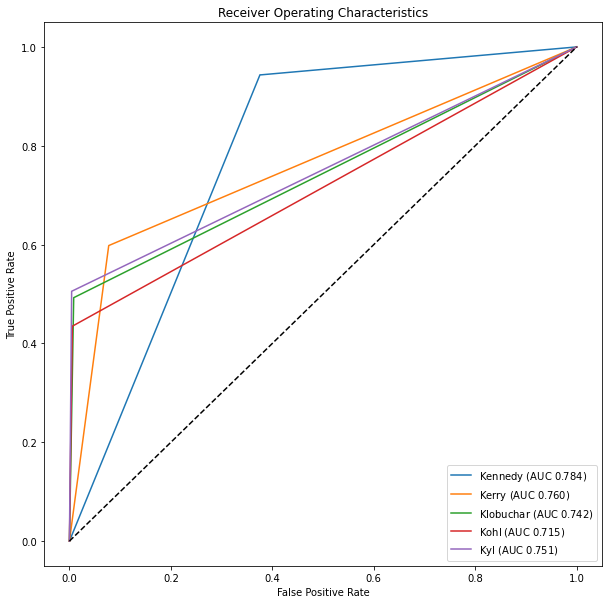

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

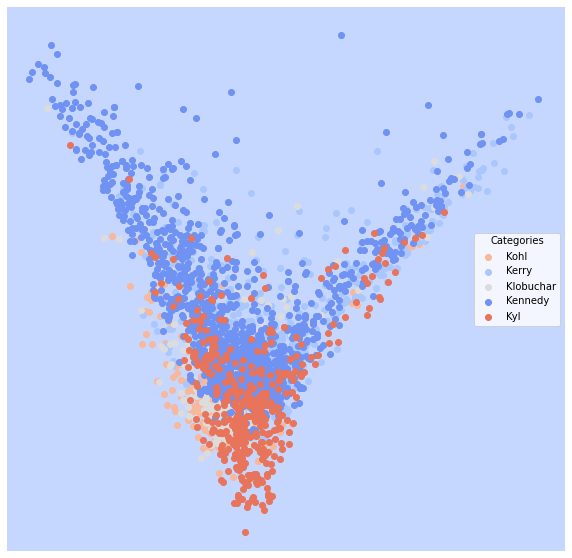

Support Vector Machine: linear


In [ ]:
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateLarge())
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = False) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = False) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pandas.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

Both the linear and poly support vector machine are really slow to run. I wrote the code but am unable to run it in my computer to see the answer...

#### Email Spam

Loading Spam
Loading Ham
Converting to vectors
Naive Bayes


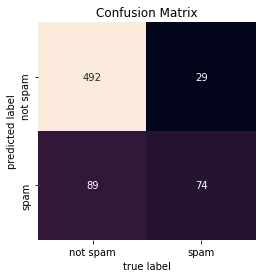

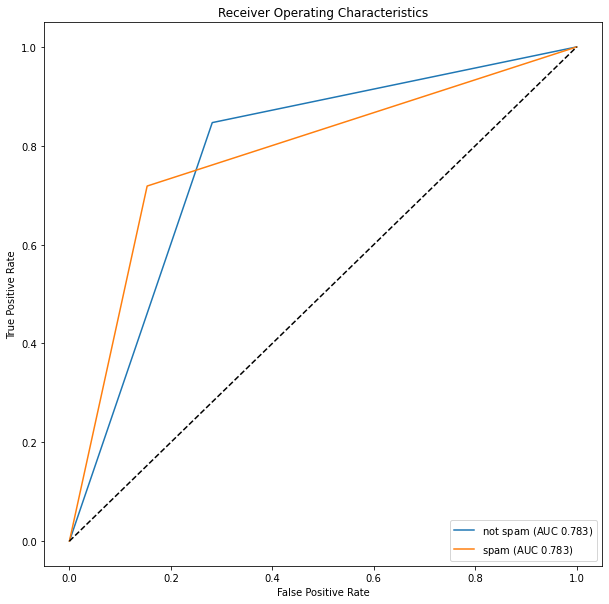

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


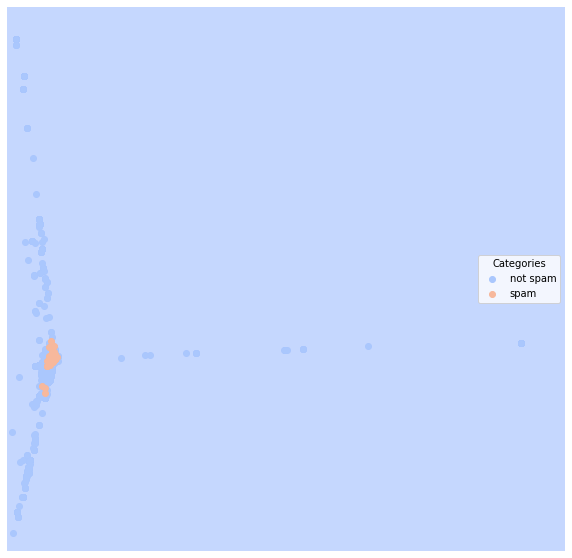

Support Vector Machine: linear


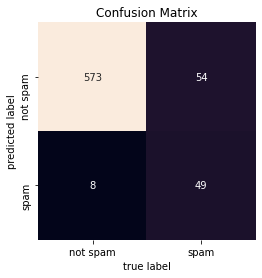

The <class 'sklearn.svm._classes.SVC'> classifier does not apear to support prediction probabilties, so an ROC curve can't be created. You can try adding `probability = True` to the model specification or use a different model.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


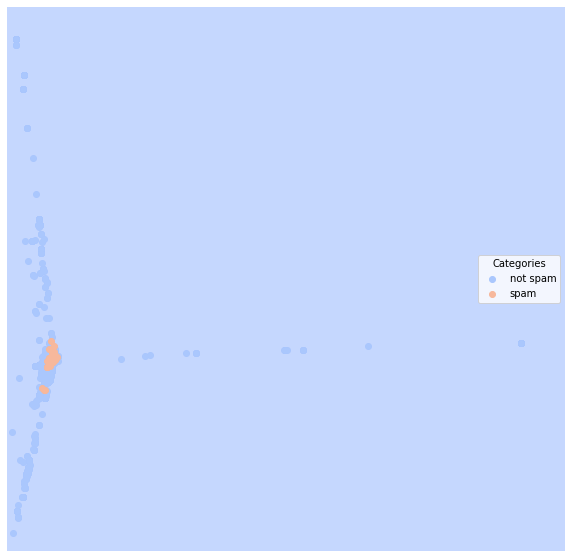

Support Vector Machine: poly


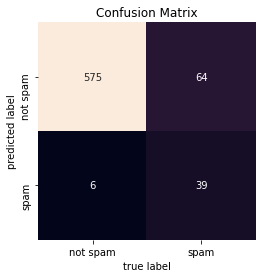

The <class 'sklearn.svm._classes.SVC'> classifier does not apear to support prediction probabilties, so an ROC curve can't be created. You can try adding `probability = True` to the model specification or use a different model.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


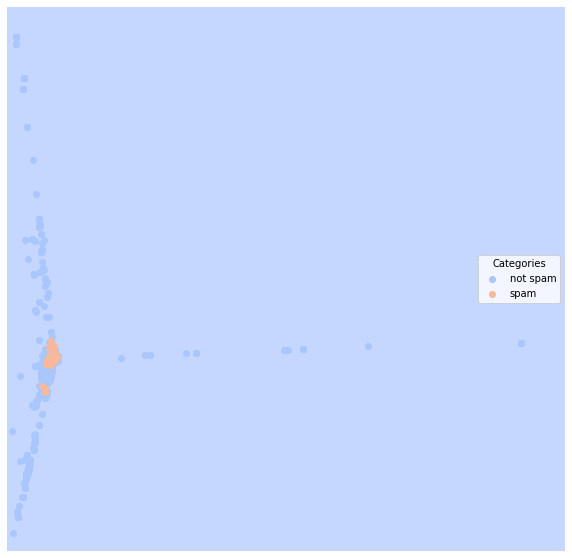

KNN


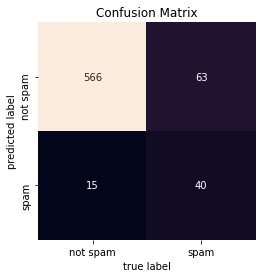

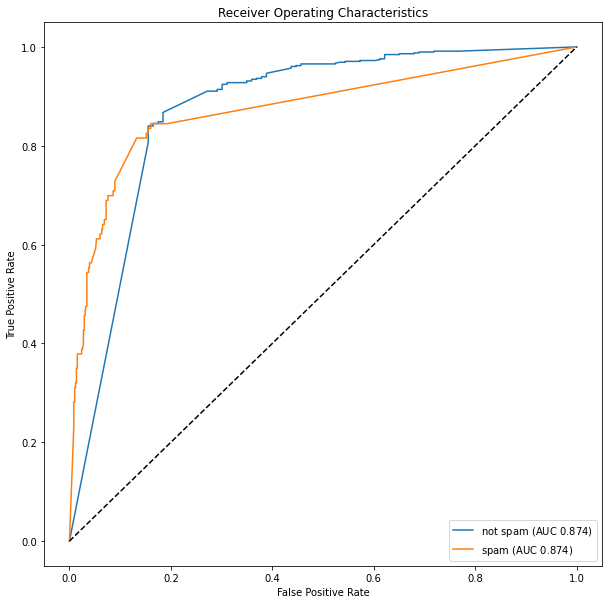

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


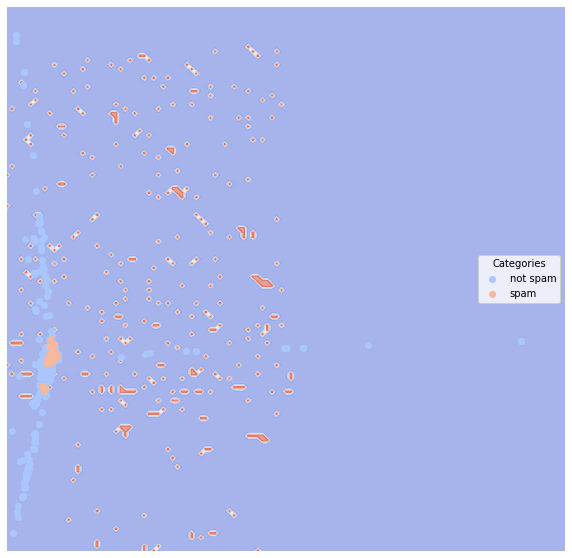

Classic Linear Regression


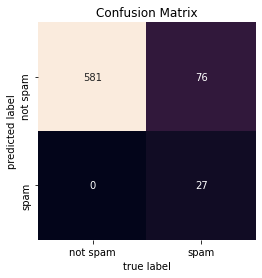

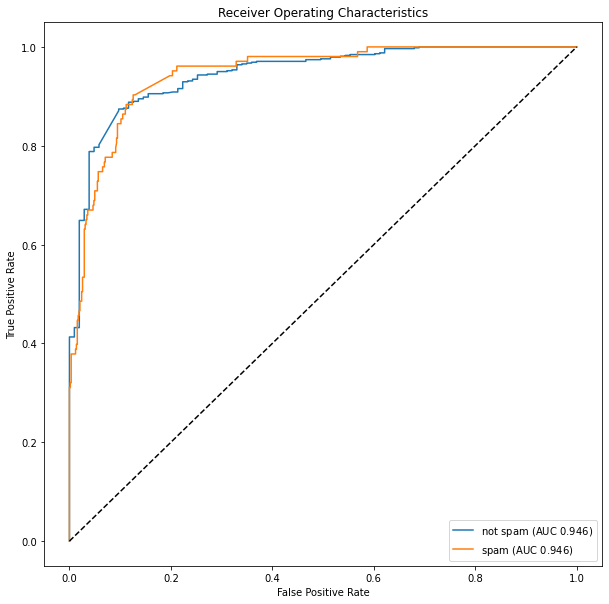

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


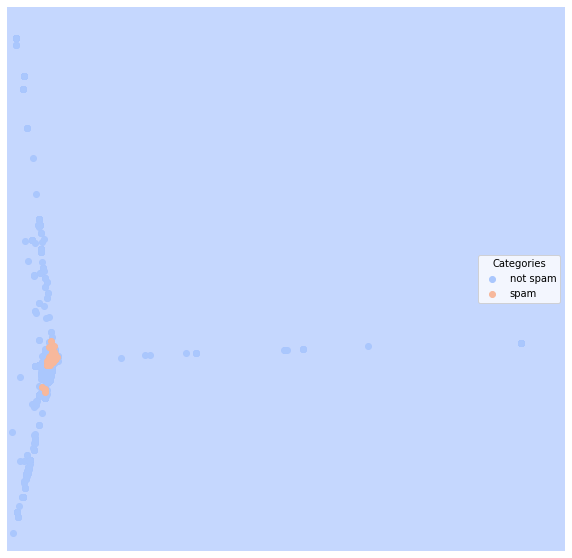

Decision Tree


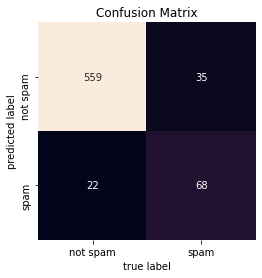

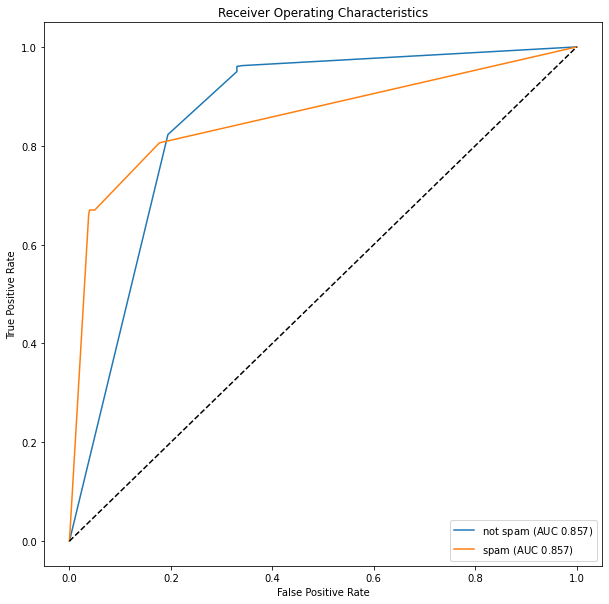

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


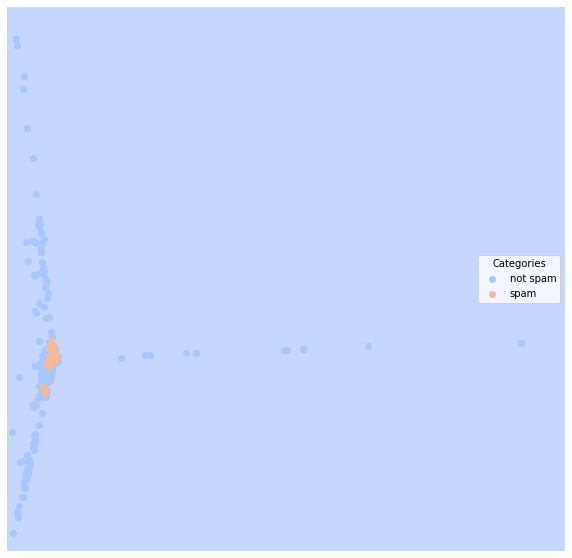

Random Forest


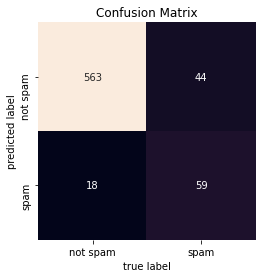

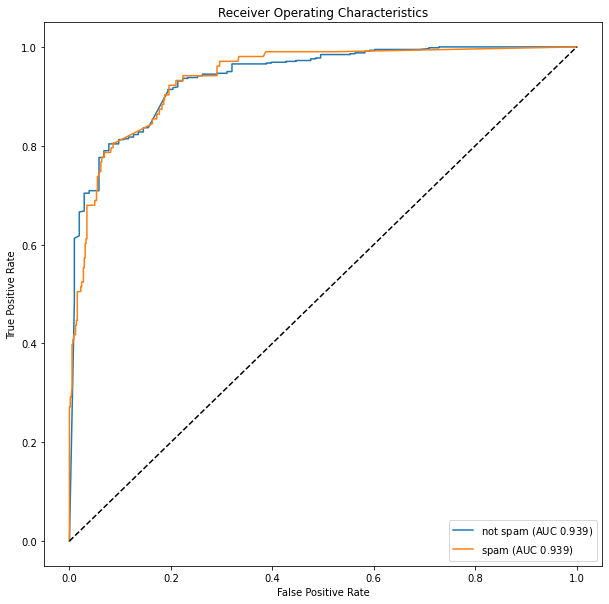

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


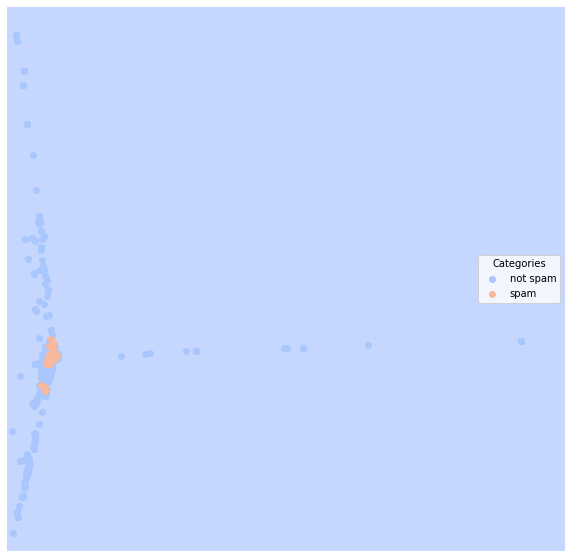

Neural Network


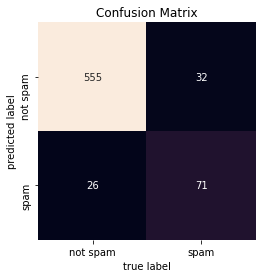

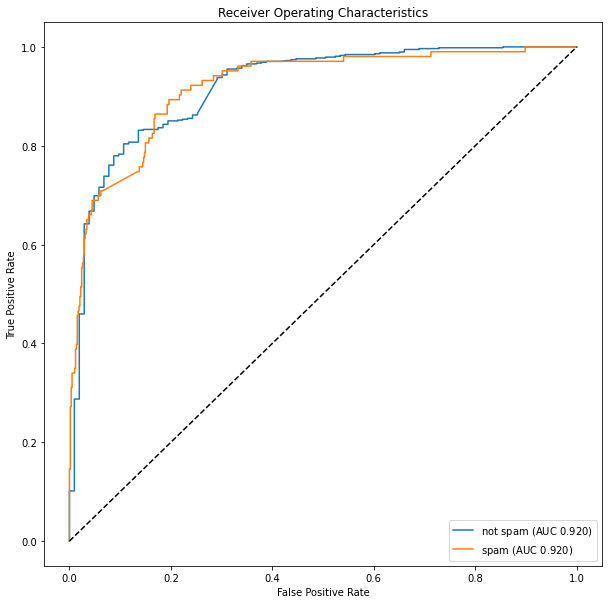

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


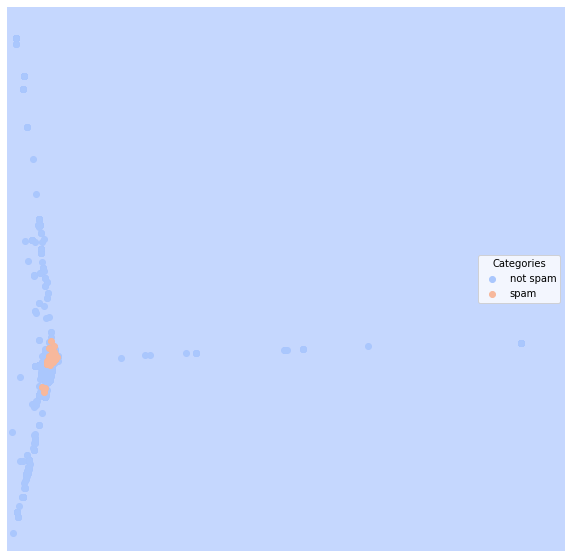

Gradient Boosting


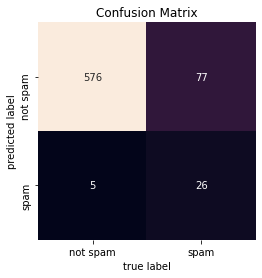

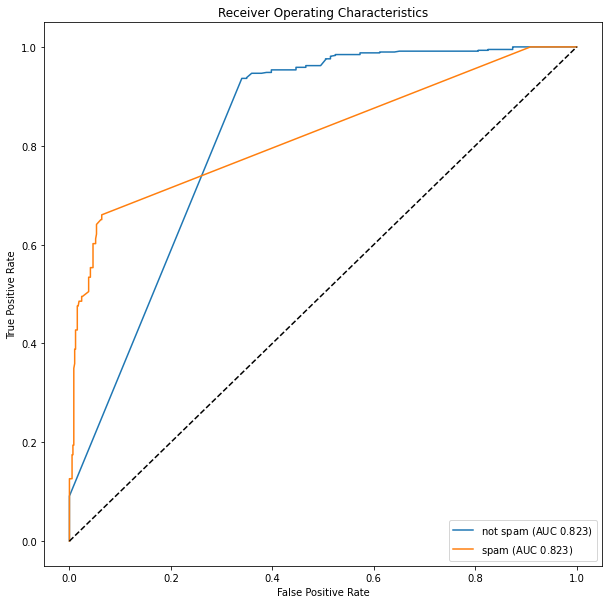

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


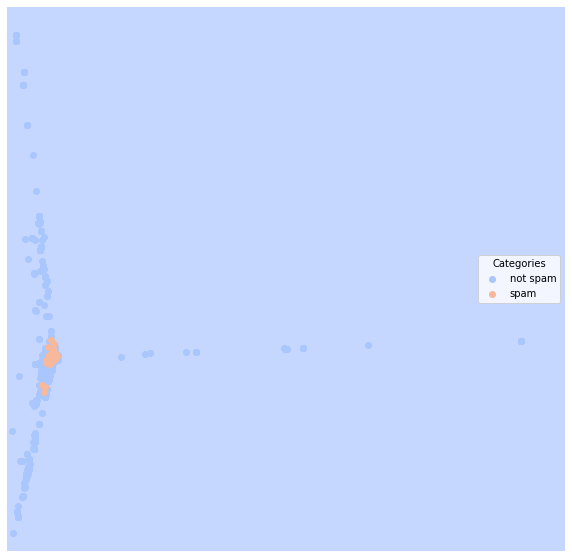

NameError: name 'pd' is not defined

In [21]:
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSpam())
#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = False) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = False) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])

In [22]:
# create a dataframe
pandas.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.172515,0.782631
1,clf2,SVM-linear,0.090643,0.730979
2,clf3,SVM-poly,0.102339,0.684157
3,clf4,KNN,0.114035,0.681266
4,clf5,Linear Regression,0.111111,0.631068
5,clf6,Decision Tree,0.083333,0.811164
6,clf7,Random Forest,0.090643,0.770917
7,clf8,Neural Network,0.084795,0.822285
8,clf9,Gradient Boosting,0.119883,0.621911


Neural network makes the most accurate prediction.

### Stretch

<span style="color:red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

There are so many different classifiers that SKLearn can help us do, so I will choose AdaBoost as the prompt suggests.

#### Artificial Dataset - Linear boundary

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


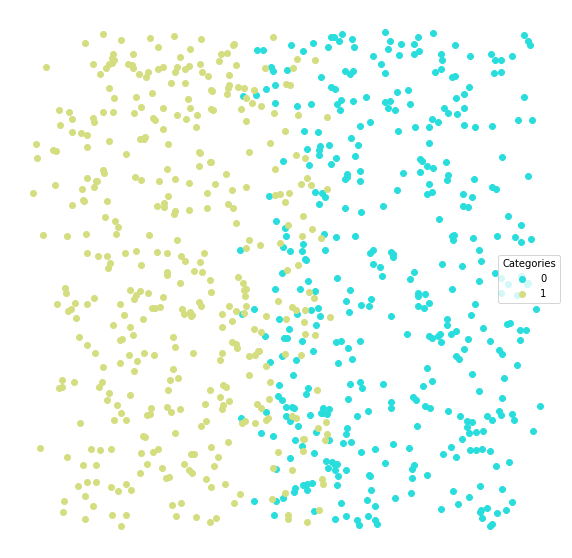

In [3]:
# Generate Artificial Data
noise = .2
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise))
lucem_illud.plotter(dfTrain)

In [6]:
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_iris
from sklearn.ensemble import AdaBoostClassifier

Naive Bayes


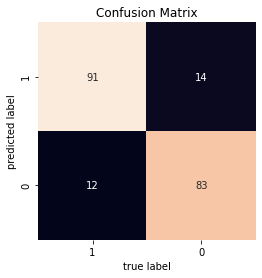

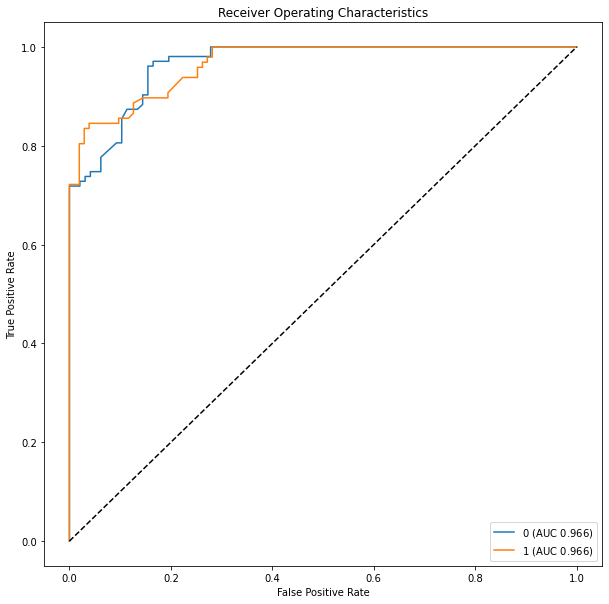

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


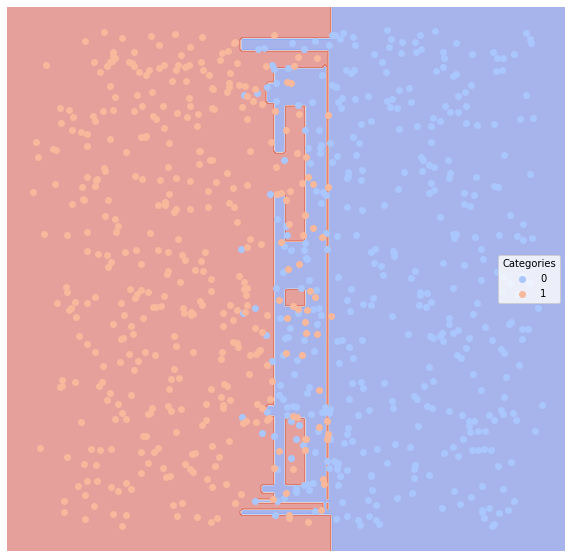

In [7]:
# AdaBoost
clf0 = AdaBoostClassifier()
print('Naive Bayes')
clf0.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.plotConfusionMatrix(clf0, dfTest)
lucem_illud.plotMultiROC(clf0, dfTest)
lucem_illud.plotregions(clf0, dfTrain)

In [8]:
# Evaluate
lucem_illud.evaluateClassifier(clf0, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.13,0.869583,0.866667,0.825696,0.883495
1,0.13,0.869583,0.873684,0.817585,0.855670


The Adaboost performs pretty well!

Naive Bayes


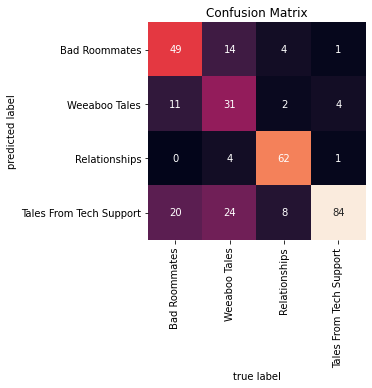

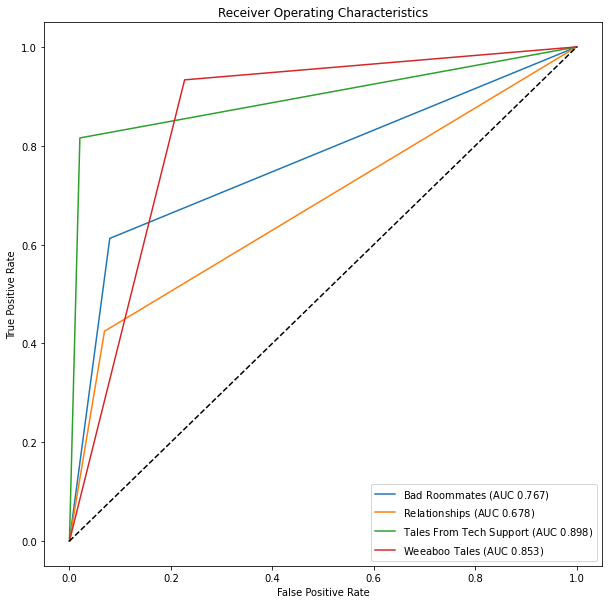

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

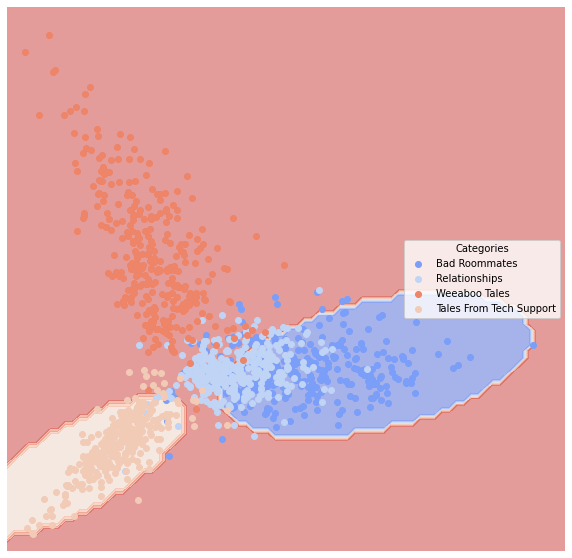

Support Vector Machine: linear


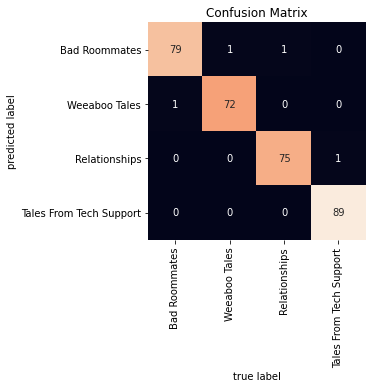

The <class 'sklearn.svm._classes.SVC'> classifier does not apear to support prediction probabilties, so an ROC curve can't be created. You can try adding `probability = True` to the model specification or use a different model.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

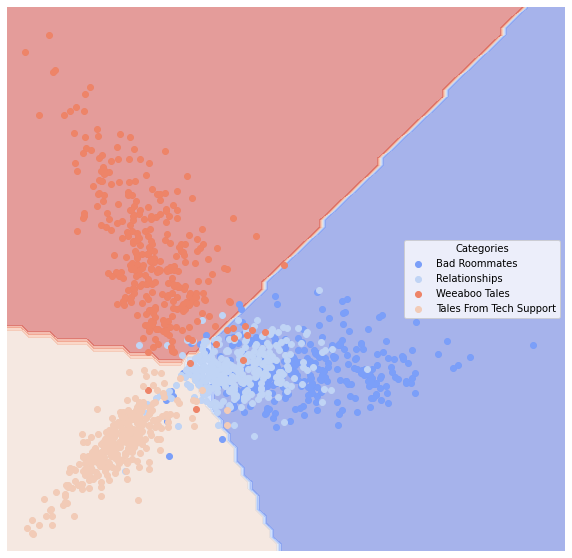

Support Vector Machine: poly


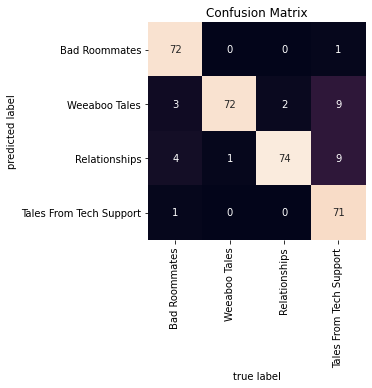

The <class 'sklearn.svm._classes.SVC'> classifier does not apear to support prediction probabilties, so an ROC curve can't be created. You can try adding `probability = True` to the model specification or use a different model.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

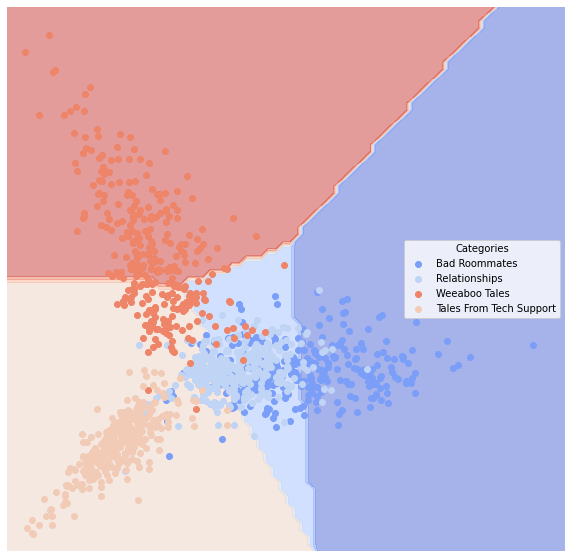

KNN


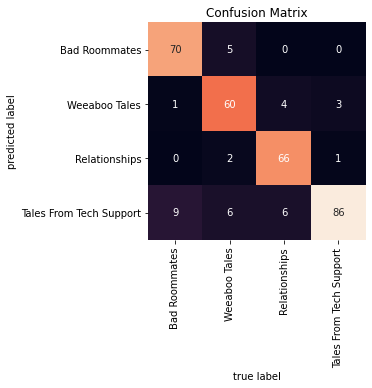

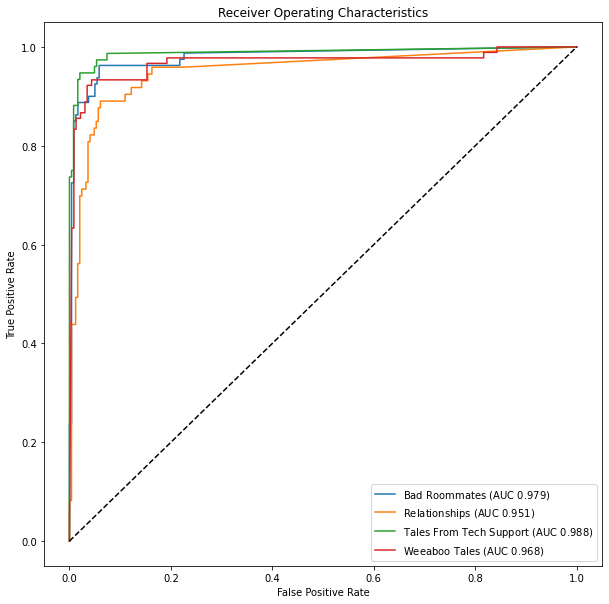

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

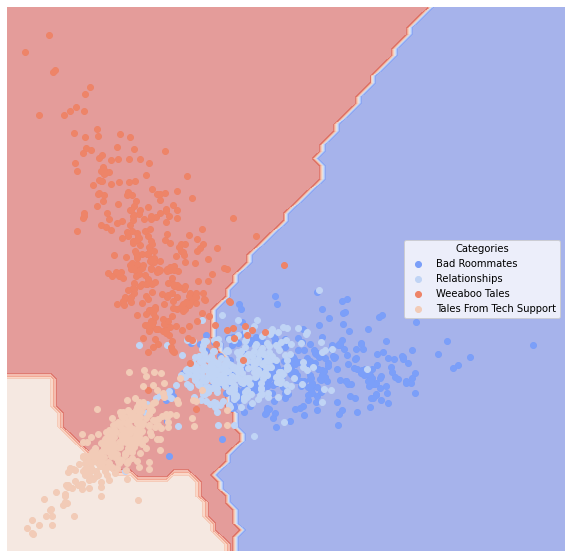

Classic Linear Regression


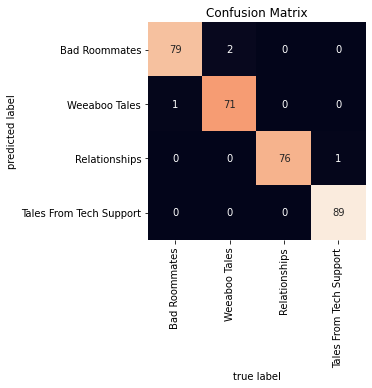

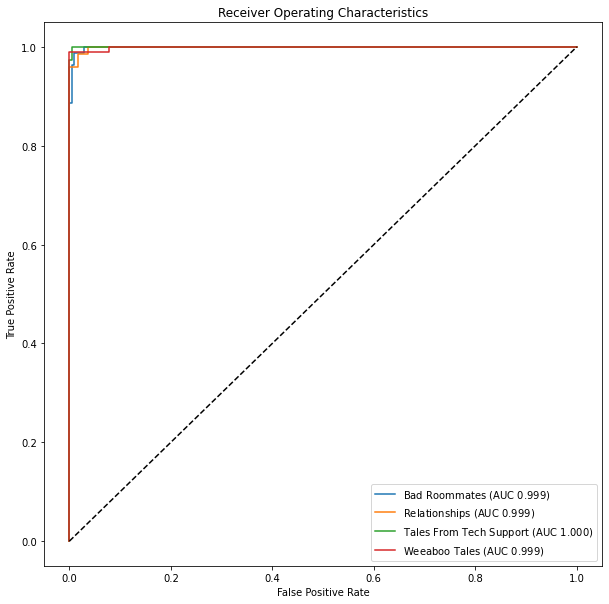

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

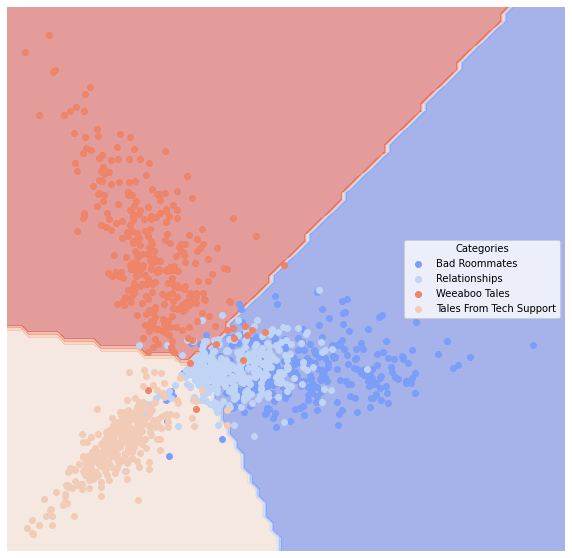

Decision Tree


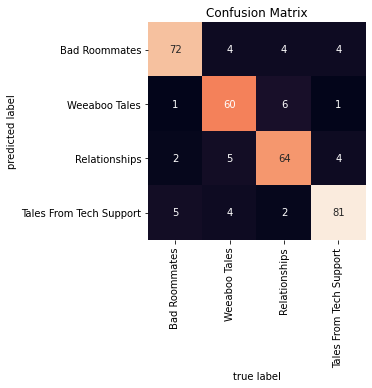

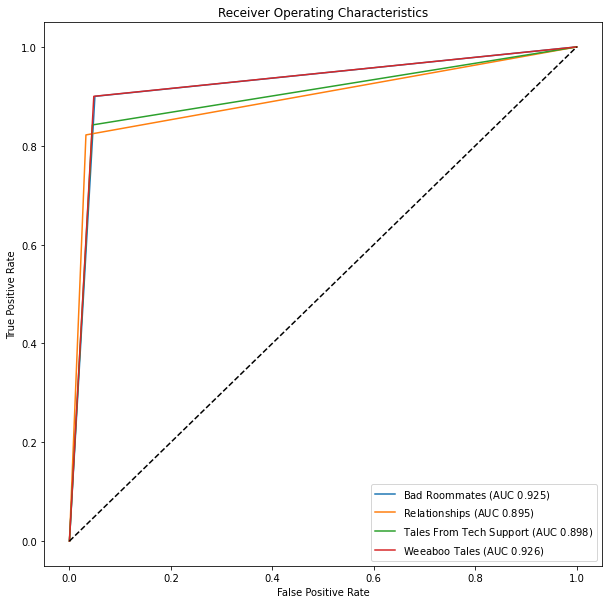

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

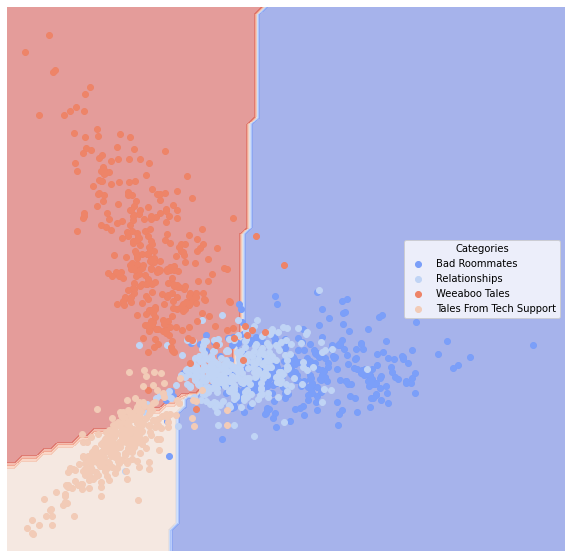

Random Forest


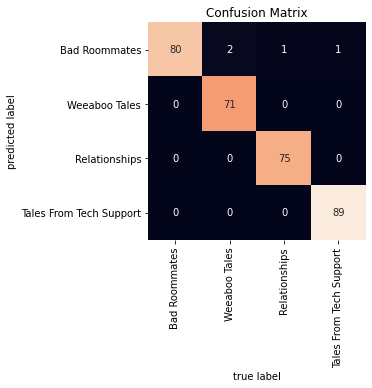

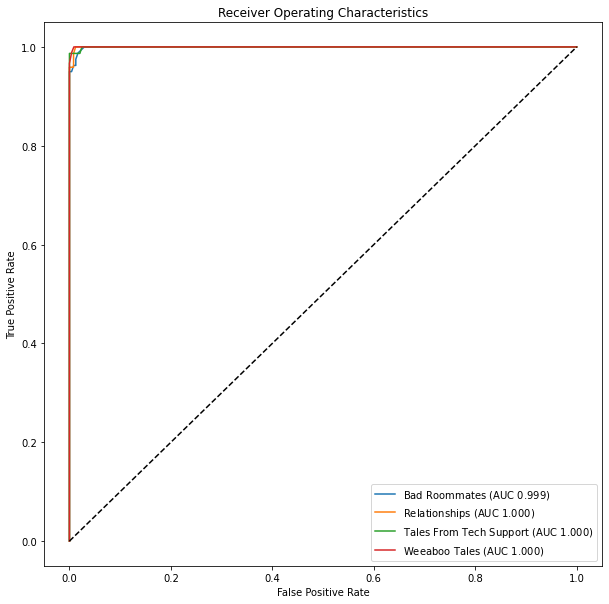

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

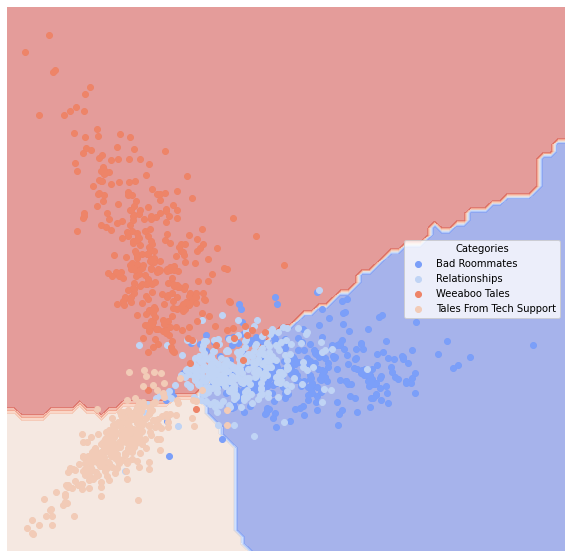

Neural Network


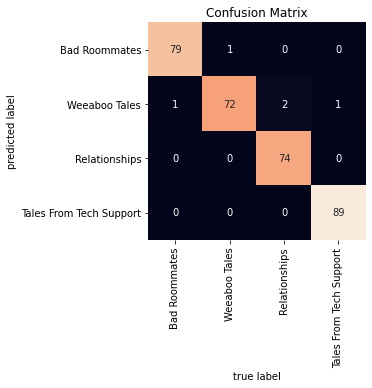

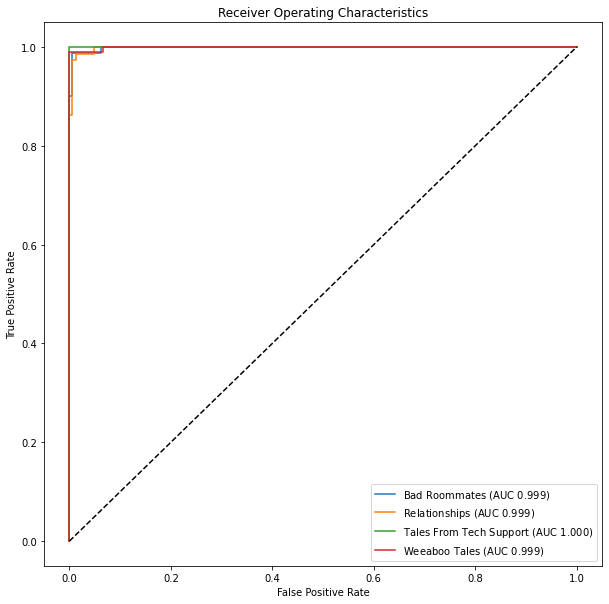

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

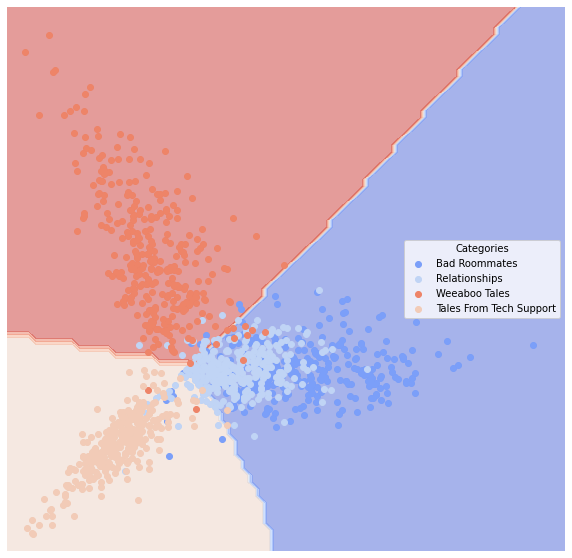

Gradient Boosting


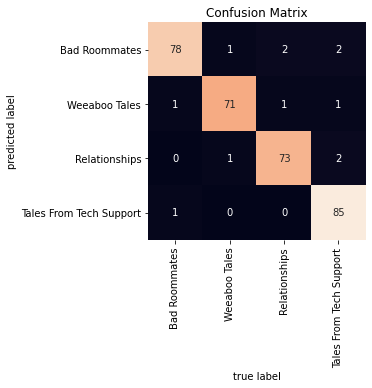

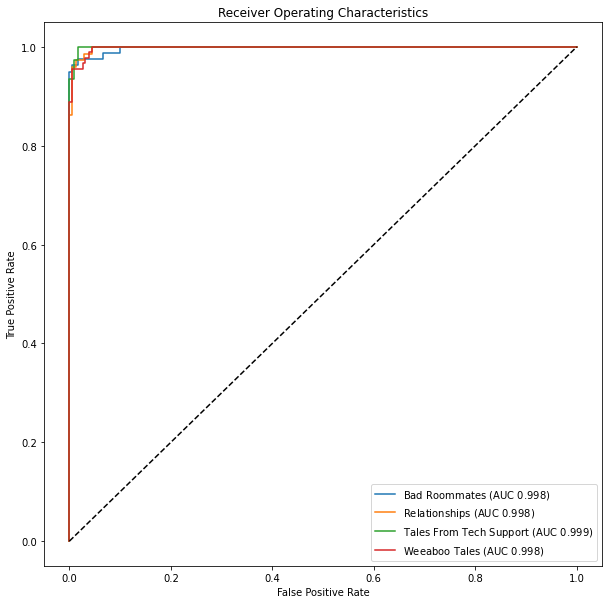

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

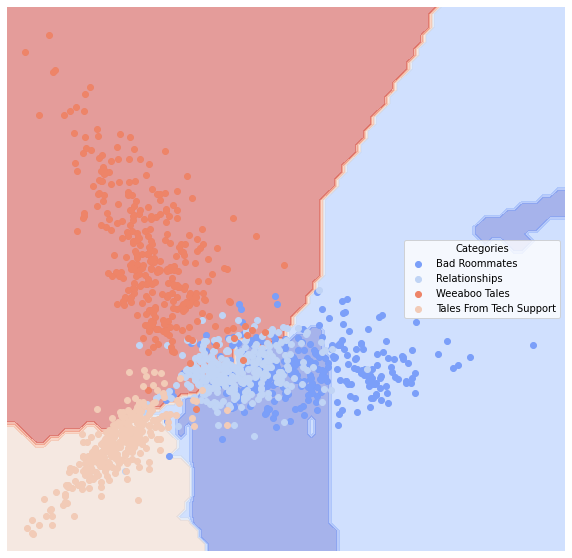

In [12]:
#Evaluate other models

#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = False) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = False) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

In [19]:
model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pandas.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.156740,0.766501
1,clf2,SVM-linear,0.009404,0.989566
2,clf3,SVM-poly,0.028213,0.947908
3,clf4,KNN,0.047022,0.927040
4,clf5,Linear Regression,0.009404,0.989566
5,clf6,Decision Tree,0.065831,0.922803
6,clf7,Random Forest,0.015674,0.989540
7,clf8,Neural Network,0.006270,0.991658
8,clf9,Gradient Boosting,0.018809,0.979132


Among all models, neural network performs the best (AUC = 0.99), AdaBoost performs relatively bad (only 0.87).

#### Real Dataset--Reddit data

In [9]:
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadReddit())

Loading Reddit data
Converting to vectors


Naive Bayes


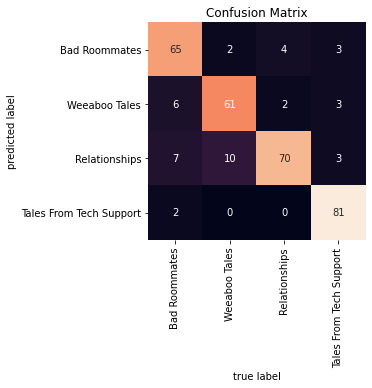

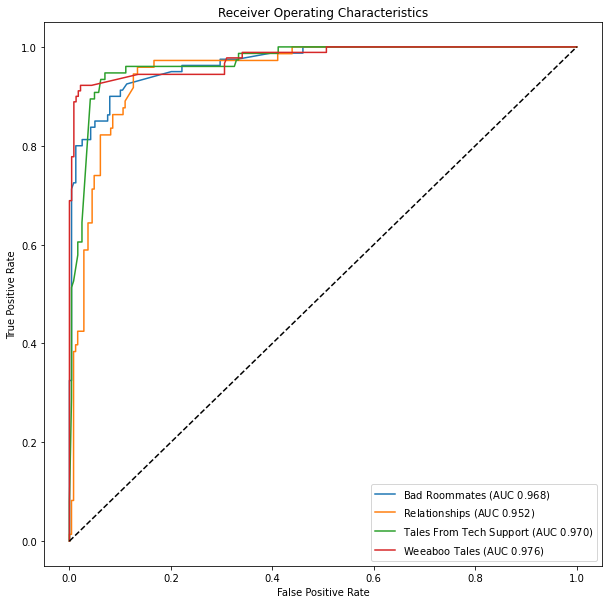

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

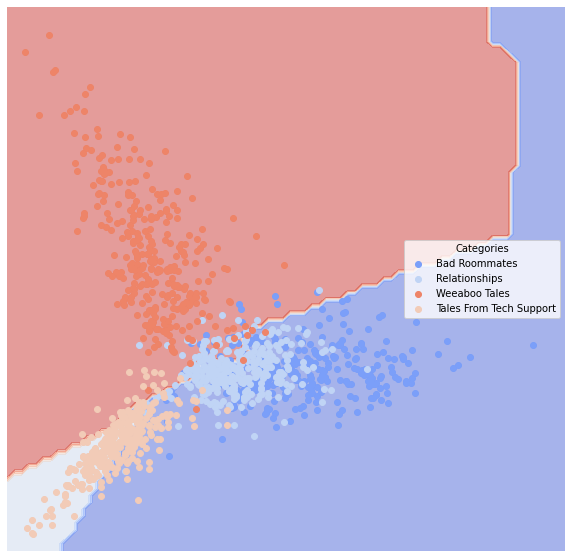

In [10]:
# AdaBoost
clf0 = AdaBoostClassifier()
print('Naive Bayes')
clf0.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.plotConfusionMatrix(clf0, dfTest)
lucem_illud.plotMultiROC(clf0, dfTest)
lucem_illud.plotregions(clf0, dfTrain)

In [11]:
# Evaluate
lucem_illud.evaluateClassifier(clf0, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Bad Roommates,0.075235,0.887422,0.878378,0.760704,0.812500
Relationships,0.072100,0.895450,0.847222,0.745570,0.835616
Weeaboo Tales,0.034483,0.945633,0.975904,0.906526,0.900000
Tales From Tech Support,0.081505,0.919374,0.777778,0.735183,0.921053


Naive Bayes


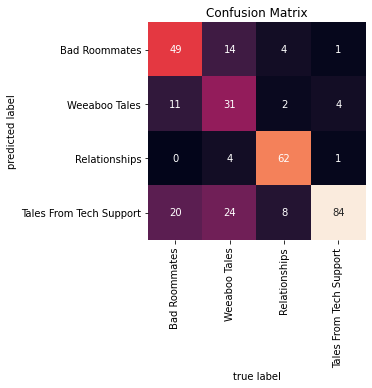

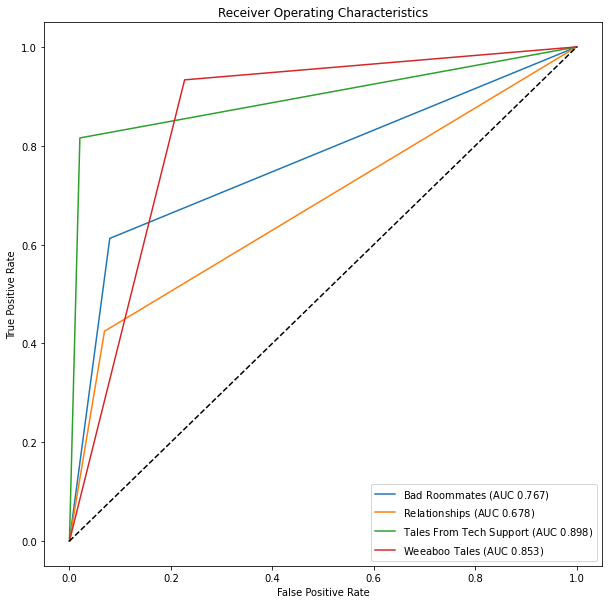

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

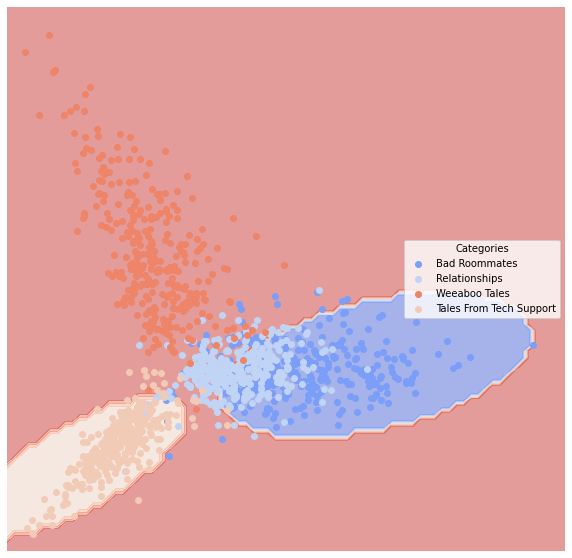

Support Vector Machine: linear


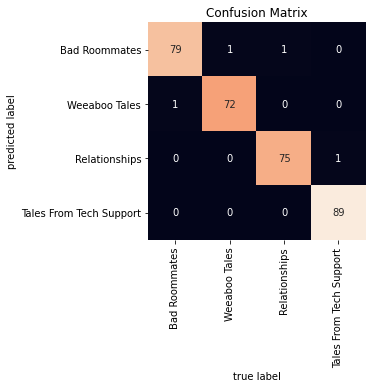

The <class 'sklearn.svm._classes.SVC'> classifier does not apear to support prediction probabilties, so an ROC curve can't be created. You can try adding `probability = True` to the model specification or use a different model.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

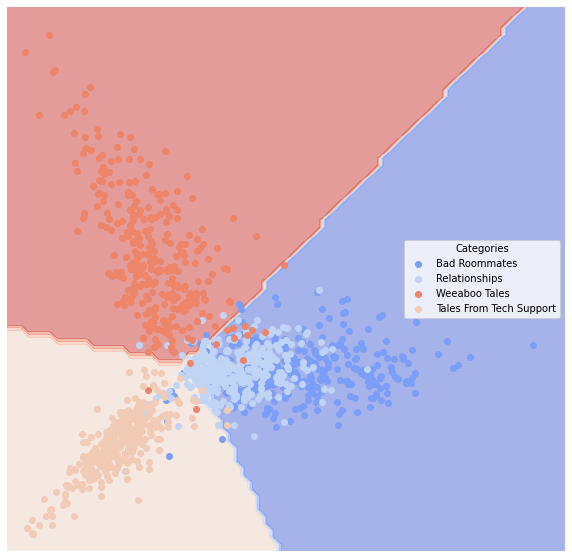

Support Vector Machine: poly


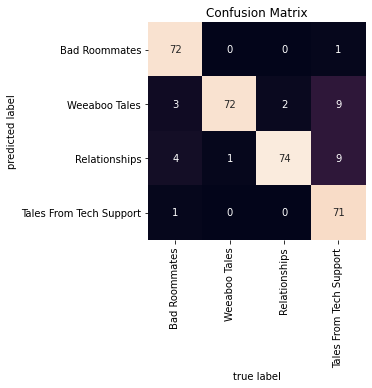

The <class 'sklearn.svm._classes.SVC'> classifier does not apear to support prediction probabilties, so an ROC curve can't be created. You can try adding `probability = True` to the model specification or use a different model.


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

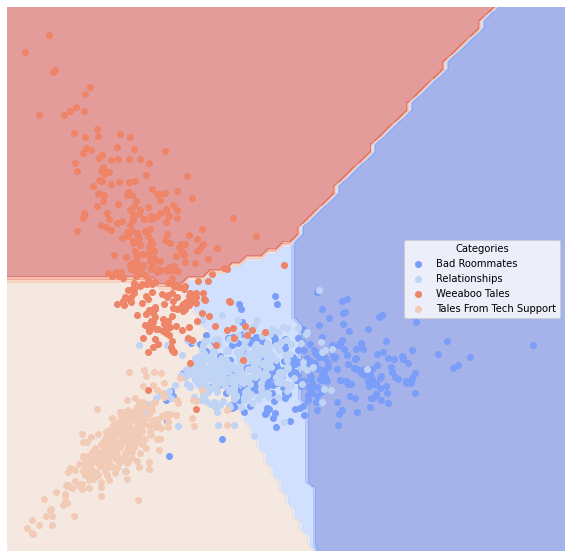

KNN


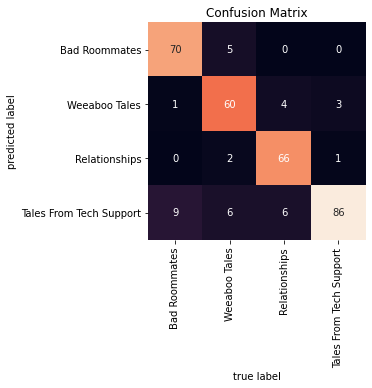

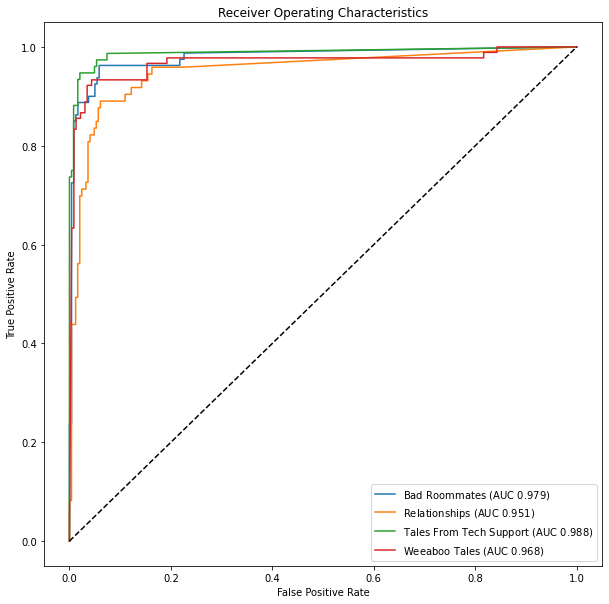

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

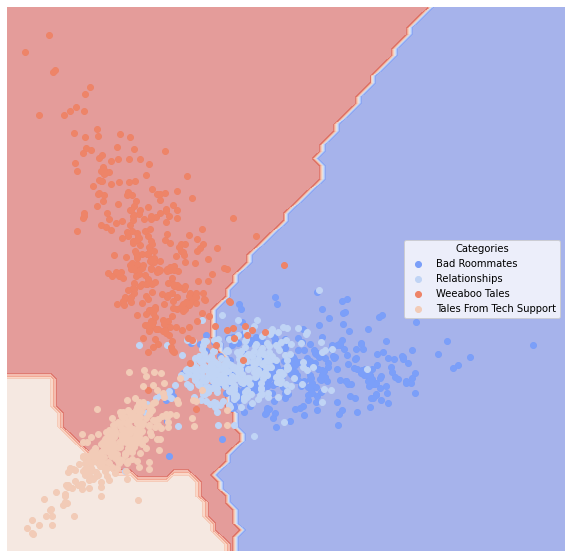

Classic Linear Regression


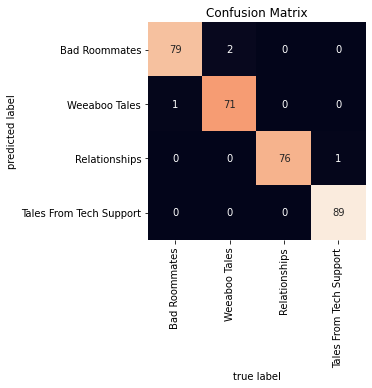

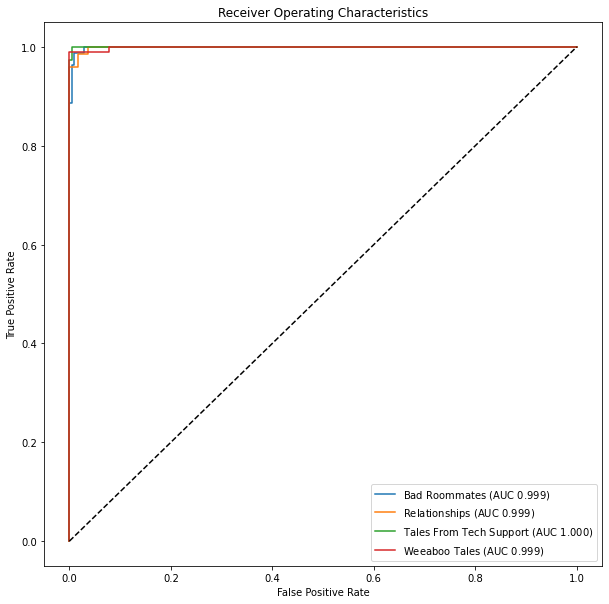

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

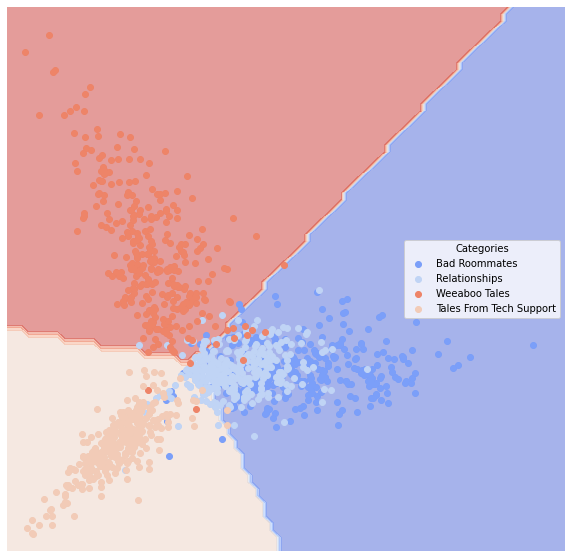

Decision Tree


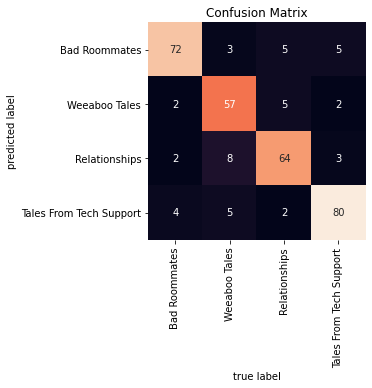

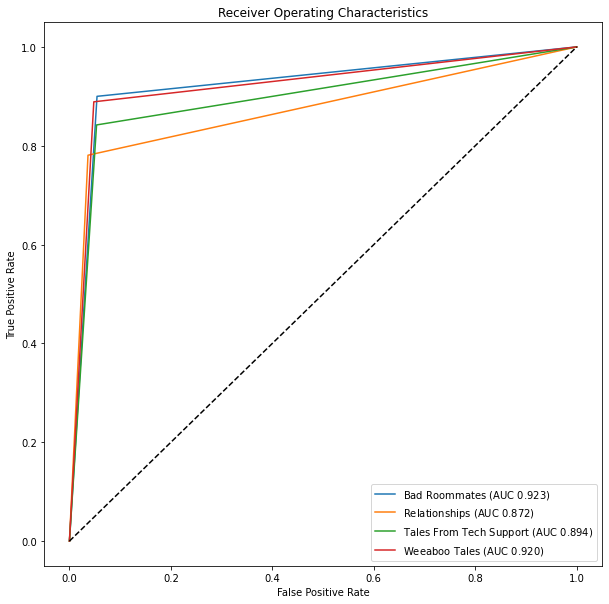

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

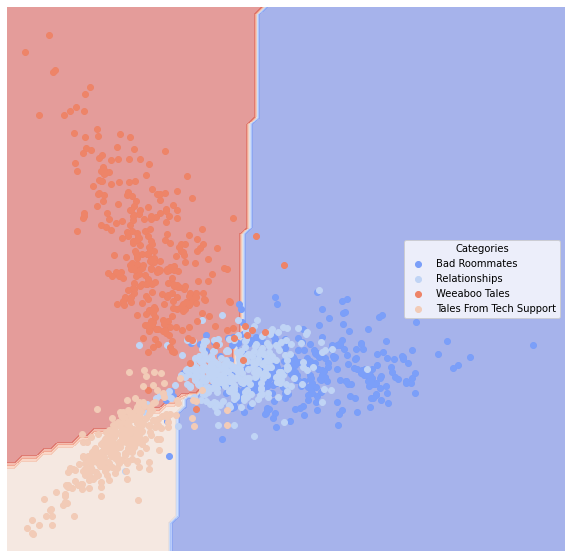

Random Forest


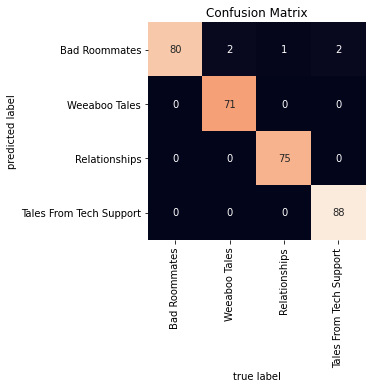

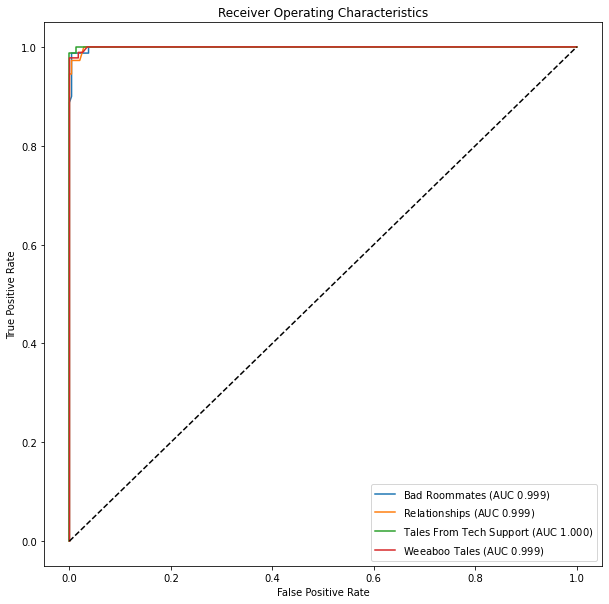

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

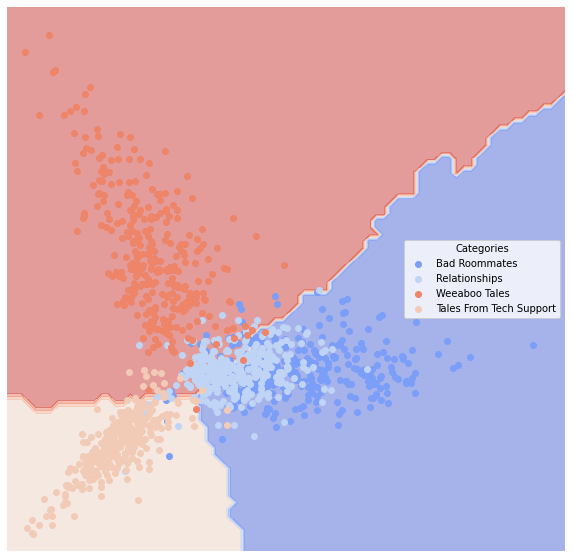

Neural Network


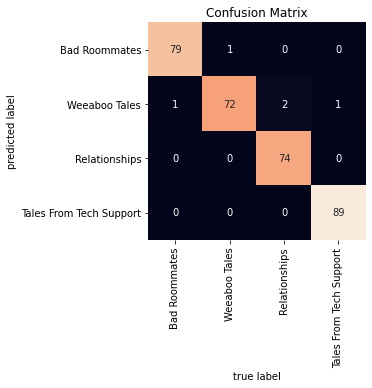

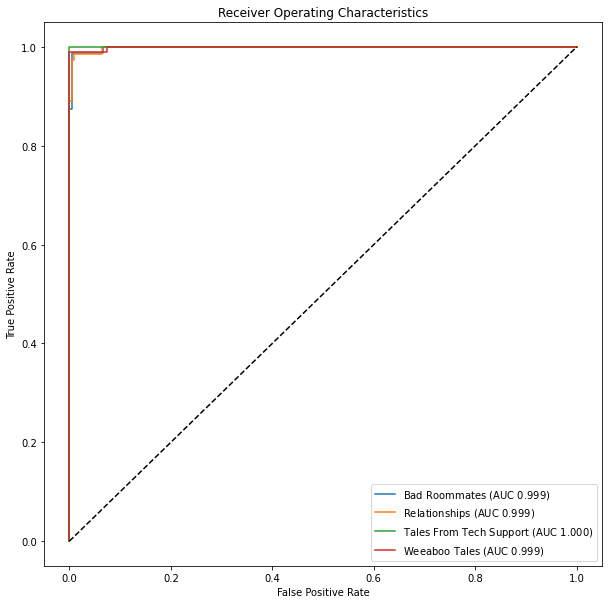

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

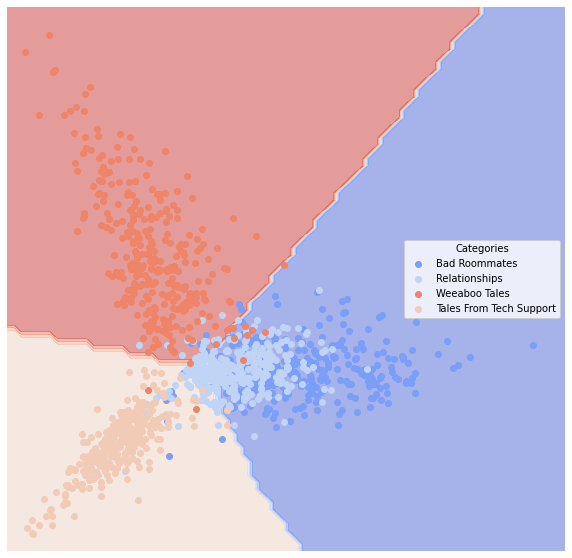

Gradient Boosting


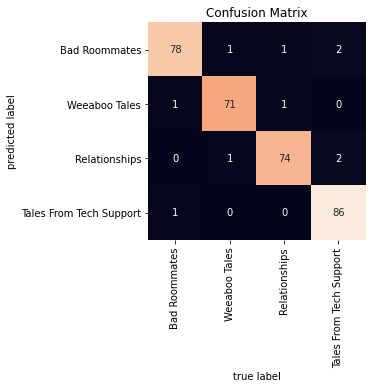

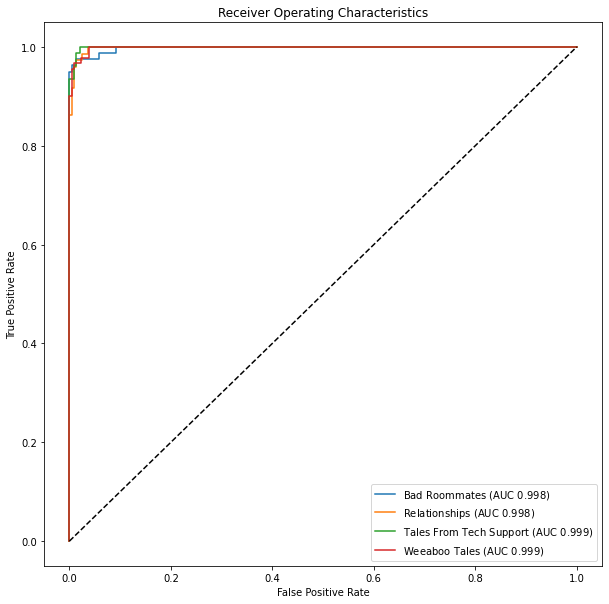

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

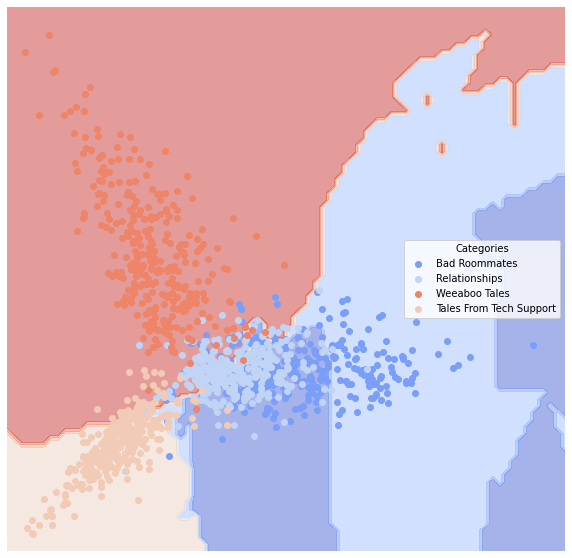

In [13]:
#Evaluate other models

#Bayes
clf1 = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf2 = sklearn.svm.SVC(kernel = 'linear', probability = False) #slow, set probability = False to speed up

clf3 = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = False) #slower

clf4 = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf5 = sklearn.linear_model.LogisticRegression()

#Symbolists
clf6 = sklearn.tree.DecisionTreeClassifier()

clf7 = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf8 = sklearn.neural_network.MLPClassifier()

#Ensemble
clf9 = sklearn.ensemble.GradientBoostingClassifier()

print('Naive Bayes')
clf1.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf1, dfTest)
lucem_illud.plotConfusionMatrix(clf1, dfTest)
lucem_illud.plotMultiROC(clf1, dfTest)
lucem_illud.plotregions(clf1, dfTrain)

print('Support Vector Machine: linear')
clf2.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf2, dfTest)
lucem_illud.plotConfusionMatrix(clf2, dfTest)
lucem_illud.plotMultiROC(clf2, dfTest)
lucem_illud.plotregions(clf2, dfTrain)

print('Support Vector Machine: poly')
clf3.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf3, dfTest)
lucem_illud.plotConfusionMatrix(clf3, dfTest)
lucem_illud.plotMultiROC(clf3, dfTest)
lucem_illud.plotregions(clf3, dfTrain)

print('KNN')
clf4.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf4, dfTest)
lucem_illud.plotConfusionMatrix(clf4, dfTest)
lucem_illud.plotMultiROC(clf4, dfTest)
lucem_illud.plotregions(clf4, dfTrain)

print('Classic Linear Regression')
clf5.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf5, dfTest)
lucem_illud.plotConfusionMatrix(clf5, dfTest)
lucem_illud.plotMultiROC(clf5, dfTest)
lucem_illud.plotregions(clf5, dfTrain)

print('Decision Tree')
clf6.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf6, dfTest)
lucem_illud.plotConfusionMatrix(clf6, dfTest)
lucem_illud.plotMultiROC(clf6, dfTest)
lucem_illud.plotregions(clf6, dfTrain)

print('Random Forest')
clf7.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf7, dfTest)
lucem_illud.plotConfusionMatrix(clf7, dfTest)
lucem_illud.plotMultiROC(clf7, dfTest)
lucem_illud.plotregions(clf7, dfTrain)

print('Neural Network')
clf8.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf8, dfTest)
lucem_illud.plotConfusionMatrix(clf8, dfTest)
lucem_illud.plotMultiROC(clf8, dfTest)
lucem_illud.plotregions(clf8, dfTrain)

print('Gradient Boosting')
clf9.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf9, dfTest)
lucem_illud.plotConfusionMatrix(clf9, dfTest)
lucem_illud.plotMultiROC(clf9, dfTest)
lucem_illud.plotregions(clf9, dfTrain)

In [20]:
model = ['clf1','clf2','clf3','clf4','clf5','clf6','clf7','clf8','clf9']
classifier = ['Naive Bayes', 'SVM-linear', 'SVM-poly','KNN', 'Linear Regression', 'Decision Tree', 'Random Forest','Neural Network', 'Gradient Boosting']
error_rate = []
AUC = []
error_rate.append(lucem_illud.evaluateClassifier(clf1, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf2, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf3, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf4, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf5, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf6, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf7, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf8, dfTest)['Error_Rate'][0])
error_rate.append(lucem_illud.evaluateClassifier(clf9, dfTest)['Error_Rate'][0])
AUC.append(lucem_illud.evaluateClassifier(clf1, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf2, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf3, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf4, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf5, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf6, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf7, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf8, dfTest)['AUC'][0])
AUC.append(lucem_illud.evaluateClassifier(clf9, dfTest)['AUC'][0])
# create a dataframe
pandas.DataFrame(list(zip(model, classifier, error_rate, AUC)), 
               columns =['model', 'classifier', 'error_rate','AUC']) 

,model,classifier,error_rate,AUC
0,clf1,Naive Bayes,0.156740,0.766501
1,clf2,SVM-linear,0.009404,0.989566
2,clf3,SVM-poly,0.028213,0.947908
3,clf4,KNN,0.047022,0.927040
4,clf5,Linear Regression,0.009404,0.989566
5,clf6,Decision Tree,0.065831,0.922803
6,clf7,Random Forest,0.015674,0.989540
7,clf8,Neural Network,0.006270,0.991658
8,clf9,Gradient Boosting,0.018809,0.979132


In this dataset, neural network performs the best (nearly 0.99) compared to Adaboost's performance (AUC for different categories: 0.88-0.94)

# Clinton / Obama Press Releases

We often will not have nicely prepared data, so we will work though the proccess of cleaning and structuring in more detail here:

While the Clinton and Obama Senatorial Press Releases are not hand-coded, we can imagine that we have been given a stack of such press releases, but lost the metadata associated with which senatorial office issued which. If we label a few of them, how well can our classifier do at recovering the rest? 

In [8]:
# ObamaClintonReleases = pandas.read_csv('../data/ObamaClintonReleases.csv', index_col=0)
ObamaClintonReleases = pandas.read_csv('ObamaClintonReleases.csv', index_col=0)

I'm pretty sure that you're all familiar with pandas, but, just to clarify: why do we use pandas here? pandas is a Python library which is widely used for analyzing and wrangling data. In particular, pandas loads data and creates data frame, a Python object that looks familiar to us (since it looks like a excel table) and easy to work with. So, using pandas.read_csv function, we take in the csv file and convert it into a data frame. 

In [9]:
type(ObamaClintonReleases)

pandas.core.frame.DataFrame

It's a DataFrame! and it looks like this:

In [16]:
ObamaClintonReleases.head()

,download_url,html_url,name,path,text,targetSenator,category,tokenized_text,normalized_text
0,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Apr2007Obama430.txt,raw/Obama/10Apr2007Obama430.txt,Obama Calls on IRS to Protect Taxpayers ...,Obama,True,"[Obama, Calls, on, IRS, to, Protect, Taxpayers...","[obama, call, irs, protect, taxpayer, privacy,..."
1,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Apr2008Obama108.txt,raw/Obama/10Apr2008Obama108.txt,Statement from Senator Barack Obama on the ...,Obama,True,"[Statement, from, Senator, Barack, Obama, on, ...","[statement, senator, barack, obama, dodd, shel..."
2,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2005Obama674.txt,raw/Obama/10Aug2005Obama674.txt,Obama Says Bill Will Help Cut Off Supply of...,Obama,True,"[Obama, Says, Bill, Will, Help, Cut, Off, Supp...","[obama, say, bill, help, cut, supply, dangerou..."
3,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2005Obama675.txt,raw/Obama/10Aug2005Obama675.txt,Obama Durbin Say Illinois Will Receive 33 ...,Obama,True,"[Obama, Durbin, Say, Illinois, Will, Receive, ...","[obama, durbin, illinois, receive, percent, fu..."
4,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2006Obama508.txt,raw/Obama/10Aug2006Obama508.txt,Obama Introduces Bill to Help Tap Power of ...,Obama,True,"[Obama, Introduces, Bill, to, Help, Tap, Power...","[obama, introduce, bill, help, tap, power, gen..."


Neat! Let's turn the 'targetSenator' column into a binary category variable.

In [12]:
ObamaClintonReleases['category'] = [s == 'Obama' for s in ObamaClintonReleases['targetSenator']]

Tokenize and normalize

In [13]:
ObamaClintonReleases['tokenized_text'] = ObamaClintonReleases['text'].apply(lambda x: lucem_illud.word_tokenize(x))
ObamaClintonReleases['normalized_text'] = ObamaClintonReleases['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

Let's split the data into training data and testing data.

In [14]:
holdBackFraction = .2
train_data_df, test_data_df = lucem_illud.trainTestSplit(ObamaClintonReleases, holdBackFraction=holdBackFraction)

In [15]:
print(len(train_data_df))
print(len(test_data_df))

1368
341


## Logistic Regression

First, let's try with a logistic regression, which may be familiar to you from statistical methods classes. First, we must turn the training dataset into a tf-idf matrix (`lucem_illud.generateVecs()` will help with this but for now we are doing it the long way):

In [17]:
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['text'])

The core function here is TfidfVectorizer, which takes a collection of raw documents and turn them to a tf-idf matrix. Just to recap: tf-idf means term frequency-inverse document frequency, a statistic (or, more precisely, a product of two statistics, term frequency and inverse document frequency) that shows the importance of a term vis-a-vis documents. TF, or, term frequency, counts how many times a term is used in a document; IDF, or, inverse-document-frequency, measures common or rare a term appears across documents. 

Let's look at three parameters of TfidfVectorizer: max_df = 100, min_df = 2, and norm='l2'. What do those parameters mean? 

(1) max_df = 100

Here, we specified a thredhold of 100, and the terms that have a document frequency higher than 100 would be ignored.

(2) min_df = 2

We specified a lower bound, 2, and the terms that have a document frequency lower than 2 will be ignored.

(3) norm = 'l2'

This parameter is about vector normalization. In machine learning, we commonly normalize vectors, i.e., change the length of vectors and turn them into a unit vector, before passing them into algorithms. There are various ways of normalizations, and this parameter specifies how we normalize vectors. Here, we set the norm to l2, in which case, we normalize the vectors such that squares of vector elements sums to 1. Alternatively, we can set it to l1, in which case the sum of absolute values of vector elements, not the square of vector elements, is 1. 

fit_transform() literally fits to data and then transform it. So, fit_transform() is just a combination of two steps--(1) fitting parameters to data; (2) then, using the vocabulary and document frequencies learned by fit(), transforming documents into document-term matrix. So, it's the same as fit followed by transform. 

Note that we can use the CountVectorizer instead, which simply produces a matrix of word counts.

In [22]:
type(TFVects.todense())

numpy.matrix

In [18]:
TFVects.shape

(1368, 11490)

We can save this in the dataframe to make things easier

In [20]:
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

Looks simple, but we need to know what todense() does here. todense() returns a dense matrix representation of the matrix. Why do we need this? As you can see above, the TFVects, a document-term matrix, has 11349 columns, and this matrix is sparse, in the sense that it is comprised mostly of zeros. Dense matrices, in contrast, are the matrices that are comprised of mostly non-zeros. Then why do we make sparse matrices into dense ones? Because zero values don't contain important information but take up so much memory.

In a regression, we cannot have more variables than cases. So, we need to first do a dimension reduction. First, we will approah this with PCA. You have previously seen this in week 3. Here we are not concerned about visualization, but rather classification and so all principal components are calculated. Watch out: we have to use `stack` not `sum` for combining the vectors. We note that you could also use topic loading and embedding dimensions as featured variables.

In [23]:
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))

We can store the PCA space vectors in the dataframe too:

In [24]:
train_data_df['pca'] = [r for r in reduced_data]

Visualization in 2D:

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


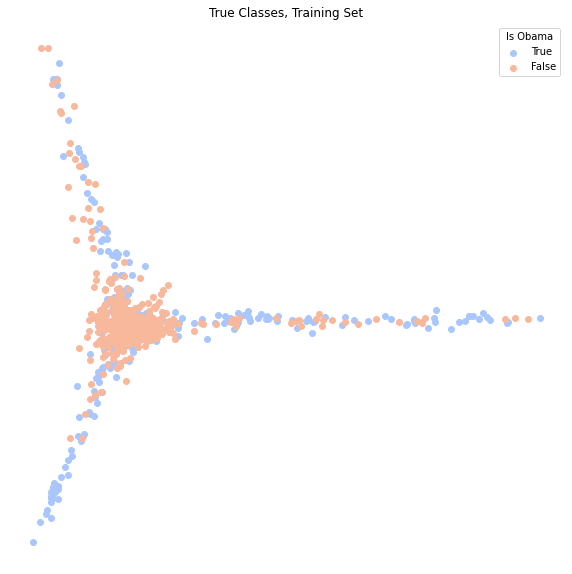

In [25]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot Obama
a = np.stack(train_data_df[train_data_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not Obama
a = np.stack(train_data_df[train_data_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'Is Obama')
plt.title('True Classes, Training Set')
plt.show()

PCA cannot distinguish Obama very well. Let's perform a screeplot to see how many Principal Components we need.

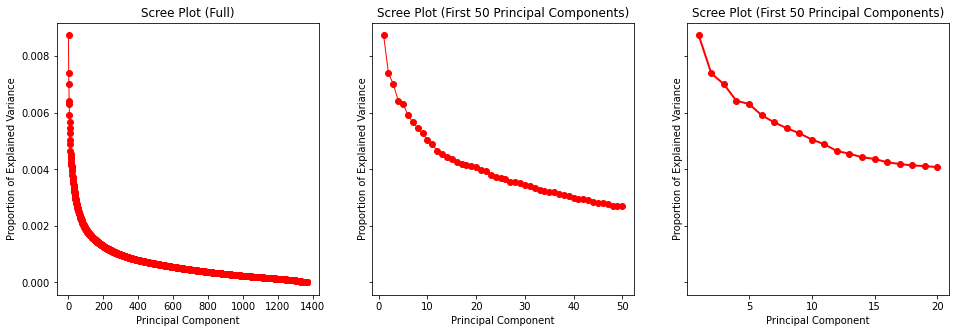

In [26]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 50 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 10 pricipal components as our covariates.

In [27]:
train_data_df['pca_reduced_10'] = train_data_df['pca'].apply(lambda x: x[:10])

Now we fit a logistic regression to our data.

In [28]:
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

LogisticRegression()

Let's see how the logistic regression performs on the training dataset from which we develop the model. Unfortunately, the mean accuracy is only about 64%.

In [29]:
logistic.score(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

0.6761695906432749

How does it perform on the testing dataset, which we "held out" and did not use for model training? We need to repeat all the steps on the testing data, but without retraining:

In [30]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_10'] = test_data_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_data_df['pca_reduced_10'], axis=0), test_data_df['category'])

0.6187683284457478

Slightly poorer. How about using more dimensions (40)?

In [31]:
train_data_df['pca_reduced_40'] = train_data_df['pca'].apply(lambda x: x[:40])
test_data_df['pca_reduced_40'] = test_data_df['pca'].apply(lambda x: x[:40])

logistic.fit(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_40'], axis=0), test_data_df['category']))

Training:
0.7353801169590644
Testing:
0.6803519061583577


Or still more (100)?

In [32]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
test_data_df['pca_reduced_100'] = test_data_df['pca'].apply(lambda x: x[:100])

logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_100'], axis=0), test_data_df['category']))

Training:
0.8296783625730995
Testing:
0.7683284457478006


Or even more (200)!

In [33]:
train_data_df['pca_reduced_200'] = train_data_df['pca'].apply(lambda x: x[:200])
test_data_df['pca_reduced_200'] = test_data_df['pca'].apply(lambda x: x[:200])

logistic.fit(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_200'], axis=0), test_data_df['category']))

Training:
0.8720760233918129
Testing:
0.782991202346041


This is becoming ridiculous (400)!

In [34]:
train_data_df['pca_reduced_400'] = train_data_df['pca'].apply(lambda x: x[:400])
test_data_df['pca_reduced_400'] = test_data_df['pca'].apply(lambda x: x[:400])

logistic.fit(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_400'], axis=0), test_data_df['category']))

Training:
0.9122807017543859
Testing:
0.8123167155425219


Increasing the number of covariates would overfit our data, and it seems that using a logistic regression, our prediction accuracy is at best about 65%. We can, however, try a logistic regression that uses the TF-IDF scores for each word, but with an L1 regularization or L1-norm loss function, which is also known as least absolute deviations (LAD), least absolute errors (LAE) or L1 penalty. It minimizes the sum of the absolute differences (S) between the target value ($Y_i$) and the estimated values ($f(x_i)$) and prunes all insignificant variables (i.e., word TF-IDF scores):

$S=\sum^n_{i=1}|y_i=f(x_i)|$

The result is a model retaining only the most individually significant features.

In [35]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))

0.9634502923976608


Train the model using training data, and then test it on the testing data.

In [36]:
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

0.8181818181818182


81% accuracy seems like the best we can get by using a logistic regression.

Now let's try with Naive Bayes. Classically, it is trained with word counts, but TF-IDF vectors are also quite good:

In [37]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
naiveBayes.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])

BernoulliNB()

In [38]:
print("Training:")
print(naiveBayes.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

Training:
0.9627192982456141
Testing:
0.8797653958944281


A bit better than the logit, but that's just looking at the accuracy. What about other measures? Let's first save the predictions in the dataframe to save use rerunning the model every time:

In [39]:
test_data_df['nb_predict'] = naiveBayes.predict(np.stack(test_data_df['vect'], axis=0))
test_data_df['nb_predict_prob_true'] = naiveBayes.predict_proba(np.stack(test_data_df['vect'], axis=0))[:,0] #other is prop false

Precision:

In [40]:
sklearn.metrics.precision_score(test_data_df['category'], test_data_df['nb_predict'])

0.8835616438356164

Recall:

In [41]:
sklearn.metrics.recall_score(test_data_df['category'], test_data_df['nb_predict'])

0.8431372549019608

F1-measure:

In [42]:
sklearn.metrics.f1_score(test_data_df['category'], test_data_df['nb_predict'])

0.8628762541806021

Let's take a look at how well our posterior distribution looks relative to the truth.

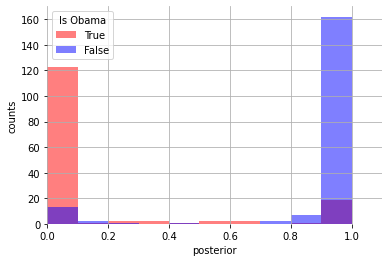

In [43]:
fig, ax = plt.subplots()
ax.grid(False)
ax.set_frame_on(False)
test_data_df[test_data_df['category'].eq(True)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'True', color = 'red')
test_data_df[test_data_df['category'].eq(False)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'False', color = 'blue')
ax.set_xlim((0,1.1))
ax.legend(title = "Is Obama")
ax.set_xlabel('posterior')
ax.set_ylabel('counts')
plt.show()

The classification is suprisingly accurate. We can even look at what words are most influential with a bit of simple math:

In [44]:
#Top indices
trueVals, falseVals = naiveBayes.feature_log_prob_

words_dict = {
    'Obama' : [],
    'Obama_log_prob' : [],
    'Clinton' : [],
    'Clinton_log_prob' : [],
}

for i, prob in sorted(enumerate(trueVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Obama'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Obama_log_prob'].append(prob)

for i, prob in sorted(enumerate(falseVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Clinton'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Clinton_log_prob'].append(prob)
    
pandas.DataFrame(words_dict)

,Obama,Obama_log_prob,Clinton,Clinton_log_prob
0,welcomed,-2.295241,labolt,-1.709238
1,awarded,-2.319934,amy,-1.760011
2,initiative,-2.332513,5566,-1.781064
3,growing,-2.384472,dick,-1.824549
4,urged,-2.411501,brundage,-1.835723
5,urging,-2.411501,chicago,-1.993626
6,urban,-2.425294,temporary,-2.181224
7,having,-2.453465,location,-2.197225
8,panel,-2.453465,reform,-2.197225
9,copy,-2.467854,va,-2.230014


## Multinomial Naive Bayes

What if we want to classify our text into one of *many* classes? The multinomial Naive Bayes generating model assumes that document features (e.g., words) are generated by draws from a multinomial distribution (recall this gives the probability to observe a particular pattern of counts across features). 

Let's use again the dataset we used in week 3, the 20 newsgroup dataset.

In [46]:
newsgroups = sklearn.datasets.fetch_20newsgroups(data_home = '../data') #Free data to play with: documents from a newsgroup corpus.
newsgroups.target_names #Possible categories, i.e., the newsgroups

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

We can pick specific categories, and pull the relevant training and testing sets. 

In [47]:
target_categories = ['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics'] #Can change these of course

newsgroupsDF = pandas.DataFrame(columns = ['text', 'category', 'source_file'])
for category in target_categories:
    print("Loading data for: {}".format(category))
    ng = sklearn.datasets.fetch_20newsgroups(categories = [category], remove=['headers', 'footers', 'quotes'], data_home = '../data')
    newsgroupsDF = newsgroupsDF.append(pandas.DataFrame({'text' : ng.data, 'category' : [category] * len(ng.data), 'source_file' : ng.filenames}), ignore_index=True)

Loading data for: talk.religion.misc
Loading data for: soc.religion.christian
Loading data for: sci.space
Loading data for: comp.graphics


In [48]:
newsgroupsDF

,text,category,source_file
0,\n\nParadise and salvation are not the same th...,talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...
1,\nYou're admitting a lot more than that. You ...,talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...
2,"\n\nJesus also recognized other holy days, lik...",talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...
3,In <lsjc8cINNmc1@saltillo.cs.utexas.edu> turpi...,talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...
4,"\nI'm sorry, but He does not! Ever read the F...",talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...
...,...,...,...
2148,This article was probably generated by a buggy...,comp.graphics,../data\20news_home\20news-bydate-train\comp.g...
2149,Hi all!\n\tI've just recently become seriously...,comp.graphics,../data\20news_home\20news-bydate-train\comp.g...
2150,Hi !!! This is the response for Wayne Michael....,comp.graphics,../data\20news_home\20news-bydate-train\comp.g...
2151,I was recently talking to a possible employer ...,comp.graphics,../data\20news_home\20news-bydate-train\comp.g...


Now we need to tokenize, and make a training and testing set:

In [49]:
newsgroupsDF['tokenized_text'] = newsgroupsDF['text'].apply(lambda x: lucem_illud.word_tokenize(x))
newsgroupsDF['normalized_text'] = newsgroupsDF['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

In [50]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

In [51]:
print(len(train_ng_df))
print(len(test_ng_df))

1723
430


We need to extract features from the text. We can use built-in feature extraction to do so. We will use a tf-idf vectorizer, which converts the document into a vector of words with tf-idf weights (term-frequency inverse-document frequency). This gives high weight to words that show up a lot in a given document, but rarely across documents in the corpus (more distinctive). 

In [52]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

Now we can train the model:

In [53]:
MultinomialNB_ng = sklearn.naive_bayes.MultinomialNB()
MultinomialNB_ng.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

MultinomialNB()

...and save predictions to the dataframe:

In [54]:
train_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(train_ng_df['vect'], axis=0))
print("Training score:")
print(MultinomialNB_ng.score(np.stack(train_ng_df['vect'], axis=0), train_ng_df['category']))

Training score:
0.8891468369123622


In [55]:
train_ng_df[['category', 'nb_predict']][:10]

,category,nb_predict
1074,sci.space,sci.space
1091,sci.space,sci.space
1611,comp.graphics,comp.graphics
1968,comp.graphics,comp.graphics
37,talk.religion.misc,soc.religion.christian
329,talk.religion.misc,talk.religion.misc
1734,comp.graphics,comp.graphics
1672,comp.graphics,comp.graphics
2050,comp.graphics,comp.graphics
1623,comp.graphics,comp.graphics


Looks pretty good, lets examine the testing dataset:

In [56]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(MultinomialNB_ng.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.8069767441860465


We can even use a confusion matrix, like we used last week for evaluating human coders relative to one another. Now we are evaluating our classifier relative to human coding. We'll just use the one in `lucem_illud_2020`, which requres a classifier and a dataframe with `'vect'` and `'category'` columns, like we have in the examples:

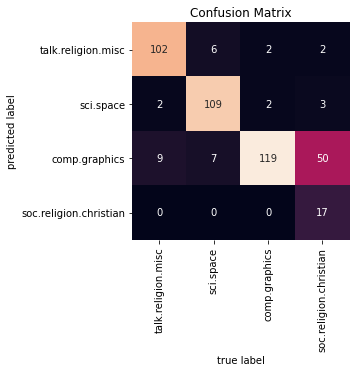

In [57]:
lucem_illud.plotConfusionMatrix(MultinomialNB_ng, test_ng_df)

Let's calculate the precision, recall, and F-measures.

In [59]:
print(sklearn.metrics.precision_score(test_ng_df['category'], test_ng_df['nb_predict'], average = 'weighted')) #precision
print(sklearn.metrics.recall_score(test_ng_df['category'], test_ng_df['nb_predict'], average = 'weighted')) #recall
print(sklearn.metrics.f1_score(test_ng_df['category'], test_ng_df['nb_predict'], average = 'weighted')) #F-1 measure

0.8573664284630603
0.8069767441860465
0.7831448953859995


We can evaluate these per catagory. This has the same requiments as `plotConfusionMatrix`:

In [60]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB_ng, test_ng_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
sci.space,0.046512,0.935358,0.939655,0.869761,0.893443
talk.religion.misc,0.127907,0.618056,1.000000,0.364018,0.236111
soc.religion.christian,0.162791,0.876248,0.643243,0.631627,0.967480
comp.graphics,0.048837,0.935555,0.910714,0.847642,0.902655


We can also plot the ROC curves. This has the same requiments as `plotConfusionMatrix`:

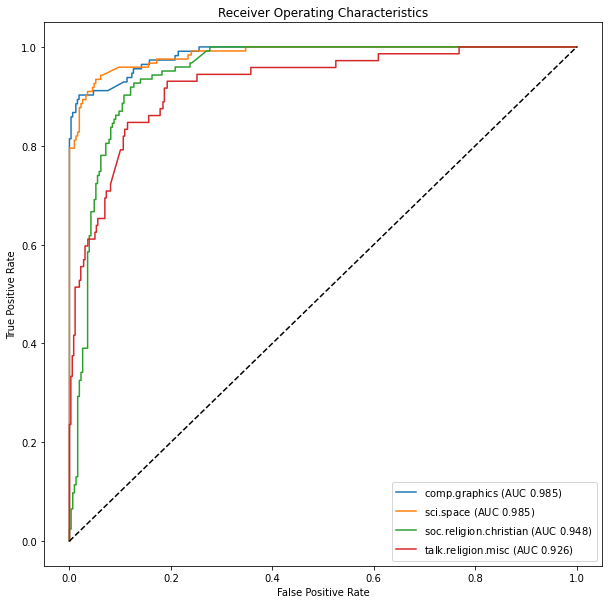

In [61]:
lucem_illud.plotMultiROC(MultinomialNB_ng, test_ng_df)

And we can plot the PCA space visualization:

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

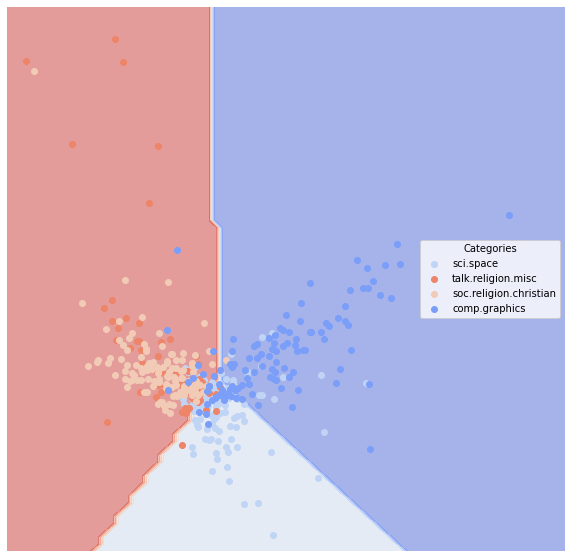

In [62]:
lucem_illud.plotregions(MultinomialNB_ng, test_ng_df)

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">In the cells immediately following, perform Logistic and Naïve Bayes classification (binary or multinomial) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project (e.g., these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week). Visualize the confusion matrix for training and testing sets. Calculate precision, recall, the F-measure, and AUC, then perform an ROC visualization. How do these classifiers perform? Exrapolate codes from these models to all uncoded data.


### Logistic classification

Datasource:

Personal Finance Reddit: https://www.reddit.com/r/wallstreetbets/

Wall Street Bets Reddit: https://www.reddit.com/r/personalfinance/

For the sake of speed (forgive me for my computer's poor performance--calready rashed several times today), only take 100 rows for each dataset.

In [100]:
pf_df = pandas.read_csv('personalfinance.csv').dropna()[:100]
wsb_df = pandas.read_csv('wsb_new.csv').dropna()[:100]

In [101]:
pf_df['category'] = 'Personal Finance'
wsb_df['category'] = 'Wall Street Bets'

In [127]:
reddit_df = pandas.DataFrame(columns = ['selftext','category'])
reddit_df = reddit_df.append(pf_df[['selftext','category']],ignore_index=True)
reddit_df = reddit_df.append(wsb_df[['selftext','category']],ignore_index=True)
reddit_df['category'] = [s == 'Personal Finance' for s in reddit_df['category']]

In [129]:
reddit_df['tokenized_text'] = reddit_df['selftext'].apply(lambda x: lucem_illud.word_tokenize(str(x)))
reddit_df['normalized_text'] = reddit_df['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(str(x)))

train_data_df, test_data_df = lucem_illud.trainTestSplit(reddit_df, holdBackFraction = .2)
print(len(train_data_df), len(test_data_df))

152 38


In [130]:
reddit_df

,selftext,category,tokenized_text,normalized_text
0,"# Overview\n\nLast March, we posted a [megathr...",True,"[Overview, Last, March, we, posted, a, megathr...","[overview, march, post, megathread](https://ww..."
1,"### If you need help, please check the [PF Wik...",True,"[If, you, need, help, please, check, the, PF, ...","[need, help, check, pf, wiki](https://www.redd..."
2,"I'll be honest, I'm a 23 year old who knows no...",True,"[I, 'll, be, honest, I, 'm, a, 23, year, old, ...","[honest, be, year, old, know, money, save, be,..."
3,I got an email about a $200 debt from a collec...,True,"[I, got, an, email, about, a, $, 200, debt, fr...","[get, email, $, debt, collection, company, cal..."
4,Not long ago someone dont know who or how stol...,True,"[Not, long, ago, someone, do, nt, know, who, o...","[long, ago, not, know, steal, personal, info, ..."
...,...,...,...,...
185,This is my last post on OPEN. This opportunity...,False,"[This, is, my, last, post, on, OPEN, This, opp...","[post, open, opportunity, significant, imo, te..."
186,What am I missing with $TAK?\n\nI'm relatively...,False,"[What, am, I, missing, with, $, TAK, I, 'm, re...","[miss, $, tak, be, relatively, new, trade, yea..."
187,**TLDR: Ammo sales/backorders are currently th...,False,"[TLDR, Ammo, sales, backorders, are, currently...","[tldr, ammo, sale, backorders, currently, high..."
188,Your daily trading discussion thread. Please k...,False,"[Your, daily, trading, discussion, thread, Ple...","[daily, trade, discussion, thread, shitposting..."


In [131]:
# logistic regression
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['selftext'])

TFVects.shape, train_data_df['selftext'].shape

((152, 2371), (152,))

In [132]:
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))
train_data_df['pca'] = [r for r in reduced_data]

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


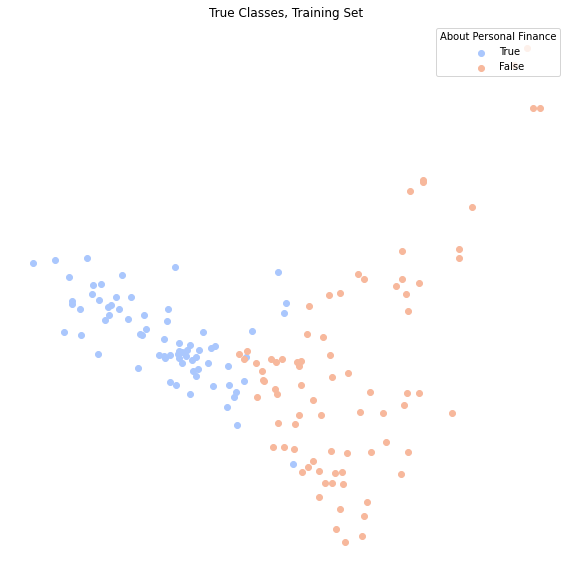

In [134]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot International
a = np.stack(train_data_df[train_data_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not International
a = np.stack(train_data_df[train_data_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'About Personal Finance')
plt.title('True Classes, Training Set')
plt.show()

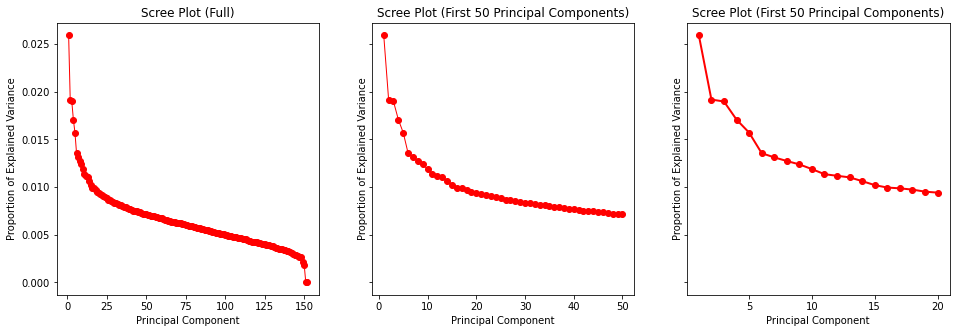

In [135]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 50 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

In [136]:
#training data
train_data_df['pca_reduced_10'] = train_data_df['pca'].apply(lambda x: x[:10])
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])
logistic.score(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

0.9539473684210527

In [143]:
#test data
#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['selftext'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_10'] = test_data_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_data_df['pca_reduced_10'], axis=0), test_data_df['category'])

0.9210526315789473

Cool! The model performs really well.

In [144]:
train_data_df['pca_reduced_50'] = train_data_df['pca'].apply(lambda x: x[:50])
test_data_df['pca_reduced_50'] = test_data_df['pca'].apply(lambda x: x[:50])

logistic.fit(np.stack(train_data_df['pca_reduced_50'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_50'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_50'], axis=0), test_data_df['category']))

Training:
0.9868421052631579
Testing:
0.9210526315789473


In [145]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
test_data_df['pca_reduced_100'] = test_data_df['pca'].apply(lambda x: x[:100])

logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_100'], axis=0), test_data_df['category']))

Training:
0.993421052631579
Testing:
0.9210526315789473


In [146]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l2')
lr = logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))

1.0


Because there are so much difference between two subreddit, the score is really really high.

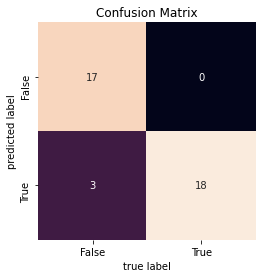

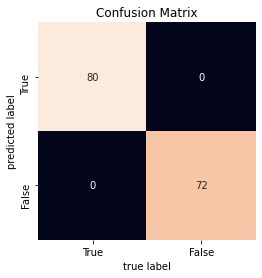

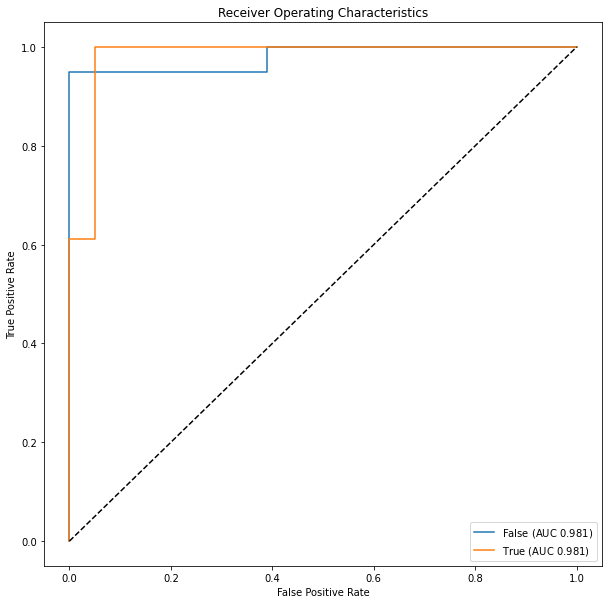

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


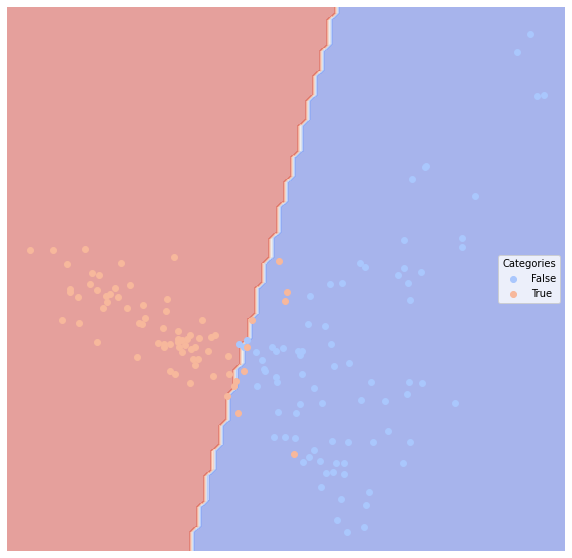

In [147]:
lucem_illud.evaluateClassifier(lr, test_data_df)
lucem_illud.plotConfusionMatrix(lr, test_data_df)
lucem_illud.plotConfusionMatrix(lr, train_data_df)
lucem_illud.plotMultiROC(lr, test_data_df)
lucem_illud.plotregions(lr, train_data_df)

In [148]:
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

0.9210526315789473


The AUC of logistic model is really high--0.981. The reason might be the true classification boundary is linear.

### Naive bayes model

In [149]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
nb = naiveBayes.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print("Training:")
print(naiveBayes.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

Training:
0.8486842105263158
Testing:
0.6052631578947368


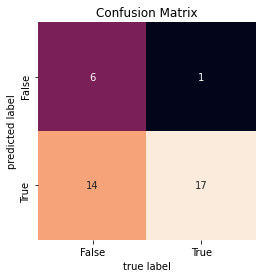

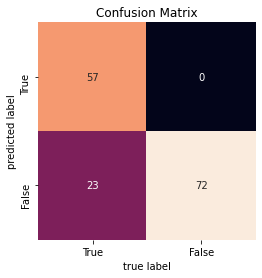

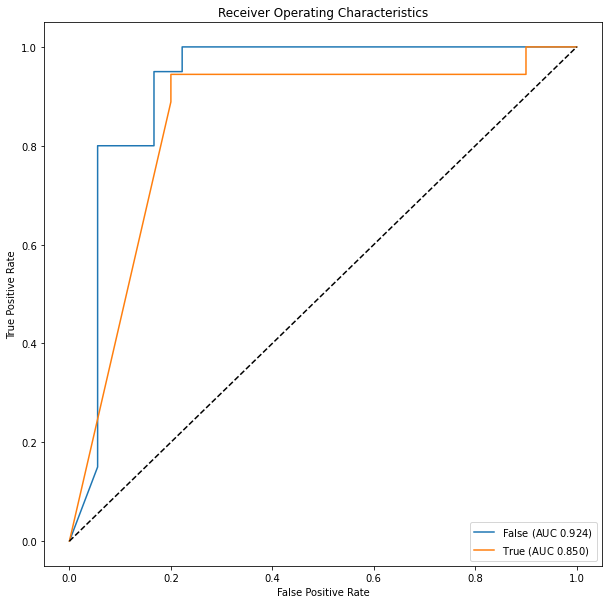

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


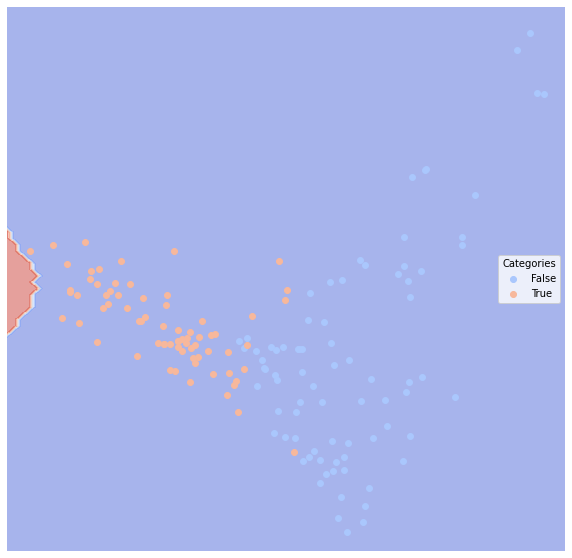

In [150]:
lucem_illud.evaluateClassifier(nb, test_data_df)
lucem_illud.plotConfusionMatrix(nb, test_data_df)
lucem_illud.plotConfusionMatrix(nb, train_data_df)
lucem_illud.plotMultiROC(nb, test_data_df)
lucem_illud.plotregions(nb, train_data_df)

In [151]:
test_data_df['nb_predict'] = naiveBayes.predict(np.stack(test_data_df['vect'], axis=0))
test_data_df['nb_predict_prob_true'] = naiveBayes.predict_proba(np.stack(test_data_df['vect'], axis=0))[:,0] #other is prop false

print("precision_score:")
print(sklearn.metrics.precision_score(test_data_df['category'], test_data_df['nb_predict']))
print("recall_score:")
print(sklearn.metrics.recall_score(test_data_df['category'], test_data_df['nb_predict']))
print("f1_score:")
print(sklearn.metrics.f1_score(test_data_df['category'], test_data_df['nb_predict']))

precision_score:
0.5483870967741935
recall_score:
0.9444444444444444
f1_score:
0.6938775510204082


The precision score is relatively low--only 0.54, but the recall score and F1 score are higher. In general, naive bayes model doesn't perform as good as logistic model.

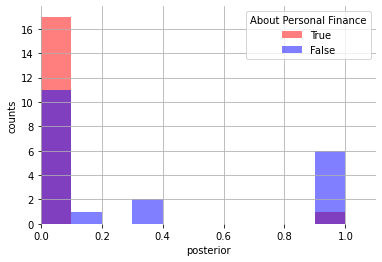

In [153]:
fig, ax = plt.subplots()
ax.grid(False)
ax.set_frame_on(False)
test_data_df[test_data_df['category'].eq(True)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'True', color = 'red')
test_data_df[test_data_df['category'].eq(False)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'False', color = 'blue')
ax.set_xlim((0,1.1))
ax.legend(title = "About Personal Finance")
ax.set_xlabel('posterior')
ax.set_ylabel('counts')
plt.show()

Naive Bayes model still does a decent job, but not as good as logistic model.

### Extrapolation (uncoded) data

Uncoded data don't have the column `category`

In [164]:
extr = pandas.read_csv('hot_reddit.csv')[:100][['text']]

In [165]:
TFVects_extr = TFVectorizer.fit_transform(extr['text'])
extr['vect'] = [np.array(v).flatten() for v in TFVects_extr.todense()]
reduced_data_extr = pca.fit_transform(np.stack(extr['vect'], axis=0))
extr['pca'] = [r for r in reduced_data_extr]
extr['pca_reduced_10'] = extr['pca'].apply(lambda x: x[:10])
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])
logistic.predict(np.stack(extr['pca_reduced_10'], axis=0))

array([False, False,  True, False, False, False,  True, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False,  True,  True, False,  True, False, False, False,
        True, False, False, False, False,  True, False,  True,  True,
        True,  True, False, False, False, False, False, False,  True,
       False, False,  True, False, False, False,  True,  True,  True,
       False,  True, False,  True,  True, False, False, False, False,
        True,  True,  True,  True, False,  True,  True, False,  True,
       False,  True, False,  True, False,  True,  True,  True,  True,
       False, False, False, False, False, False,  True,  True, False,
        True, False, False, False, False, False,  True,  True, False,
        True])

Above is the prediction for uncoded data.

# Decision Trees

Decision trees can be used to predict both categorical/class labels (i.e., classification) and continuous labels (i.e., regression).

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

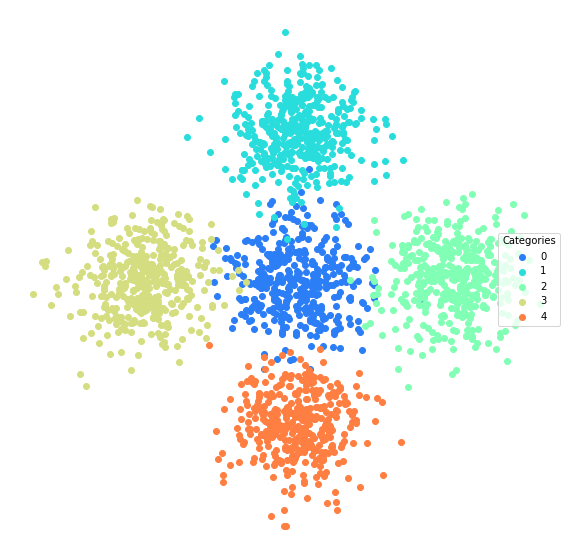

In [166]:
blobs_df = lucem_illud.multiBlobs(noise=.2, centers=[(0,0), (0,5), (5,0), (-5,0), (0,-5)])
df_exampleTree_train, df_exampleTree_test = lucem_illud.trainTestSplit(blobs_df)
lucem_illud.plotter(df_exampleTree_train)

Now we import our Decision Tree classifier from sklearn.tree (familiar syntax) and fit it using the fit method.

In [167]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])

DecisionTreeClassifier(max_depth=4, random_state=0)

To see what's going on visually with the classification: 

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

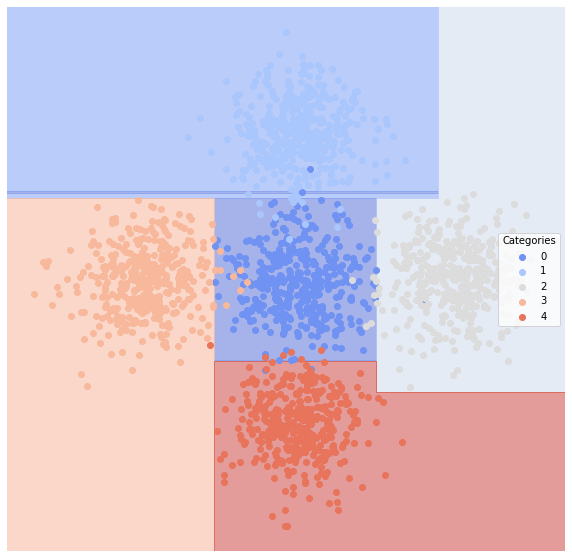

In [168]:
lucem_illud.plotregions(clf_tree, df_exampleTree_train)

In [170]:
lucem_illud.evaluateClassifier(clf_tree, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.020,0.980074,0.925234,0.910912,0.980198
1,0.010,0.980527,0.977011,0.949704,0.965909
2,0.010,0.974414,0.987342,0.947179,0.951220
3,0.004,0.993972,0.990476,0.983043,0.990476
4,0.008,0.986573,0.991803,0.973808,0.975806


Lets look at accuracy:

In [171]:
sklearn.metrics.accuracy_score(df_exampleTree_test['category'],clf_tree.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))

0.974

What happens if we trim the tree?

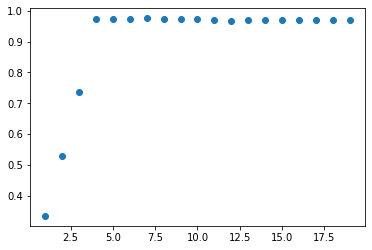

In [172]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])
    score = sklearn.metrics.accuracy_score(df_exampleTree_test['category'], tree2.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

We can select different layers of the decision tree or "prune" it. At approximately four layers down in the decision tree, the shape is somewhat odd, suggesting that our model is overfitting beyond those four layers.

Combining multiple overfitting estimators turns out to be a key idea in machine learning. This is called **bagging** and is a type of **ensemble** method. The idea is to make many randomized estimators--each can overfit, as decision trees are wont to do--but then to combine them, ultimately producing a better classification. A **random forest** is produced by bagging decision trees.

In [173]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [174]:
bag.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category']) #Fit the bagged classifier

BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                  max_samples=0.8, n_estimators=100, random_state=1)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

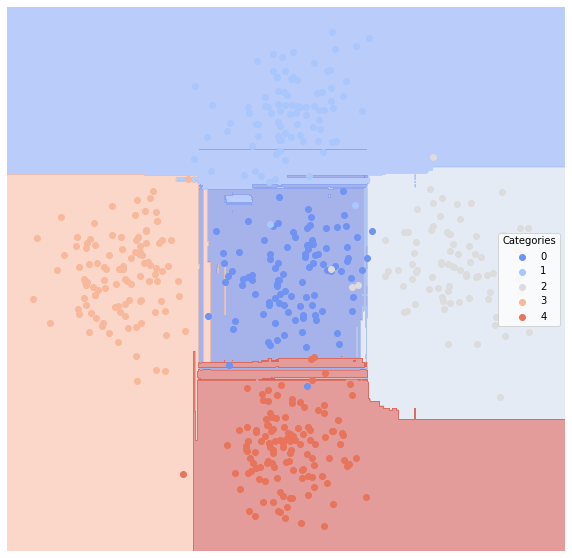

In [175]:
lucem_illud.plotregions(bag, df_exampleTree_test)

In [176]:
lucem_illud.evaluateClassifier(bag, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.024,0.966476,0.932039,0.895898,0.950495
1,0.010,0.980527,0.977011,0.949704,0.965909
2,0.010,0.974414,0.987342,0.947179,0.951220
3,0.008,0.991441,0.971963,0.964706,0.990476
4,0.008,0.989276,0.983871,0.972002,0.983871


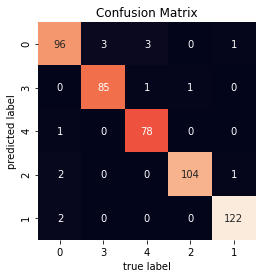

In [177]:
lucem_illud.plotConfusionMatrix(bag, df_exampleTree_test)

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">In the cells immediately following, perform decision tree and random forest classification (binary, multinomial or continuous) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. As with ***Exercise 2***, these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week. Visualize the classification of data points. Calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Now build an ensemble classifier by bagging trees into a random forest. Visualize the result. How do these classifiers perform? What does ensemble learning do?

In [178]:
# decision tree
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(train_data_df['vect'], axis =0), train_data_df['category'])

DecisionTreeClassifier(max_depth=4, random_state=0)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


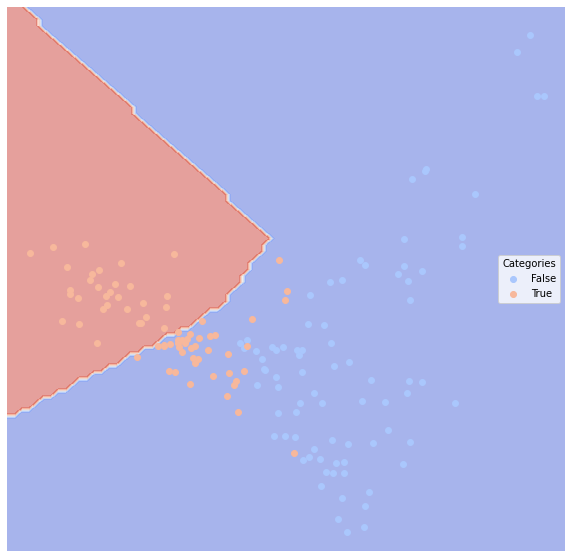

In [179]:
lucem_illud.plotregions(clf_tree, train_data_df)

In [181]:
lucem_illud.evaluateClassifier(clf_tree, test_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.263158,0.744444,0.857143,0.724812,0.600000
True,0.263158,0.744444,0.666667,0.645224,0.888889


In [183]:
sklearn.metrics.accuracy_score(test_data_df['category'],clf_tree.predict(np.stack(test_data_df['vect'], axis = 0)))

0.7368421052631579

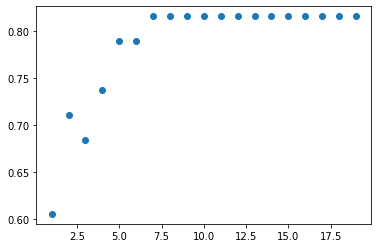

In [184]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(train_data_df['vect'], axis =0), train_data_df['category'])
    score = sklearn.metrics.accuracy_score(test_data_df['category'], tree2.predict(np.stack(test_data_df['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

In [185]:
# bagging
tree = sklearn.tree.DecisionTreeClassifier(max_depth=6) #Create an instance of our decision tree classifier.
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data
bag.fit(np.stack(train_data_df['vect'], axis =0), train_data_df['category'])

BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=6),
                  max_samples=0.8, n_estimators=100, random_state=1)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


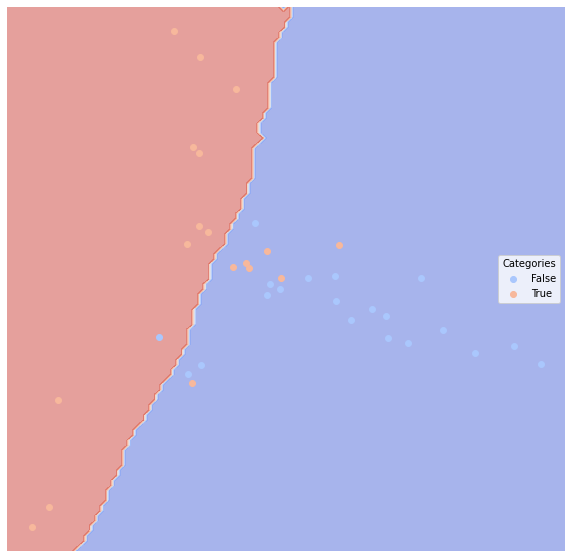

In [186]:
lucem_illud.plotregions(bag, test_data_df)

In [187]:
lucem_illud.evaluateClassifier(bag, test_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.236842,0.769444,0.866667,0.747544,0.650000
True,0.236842,0.769444,0.695652,0.670989,0.888889


In [188]:
sklearn.metrics.accuracy_score(test_data_df['category'],bag.predict(np.stack(test_data_df['vect'], axis = 0)))

0.7631578947368421

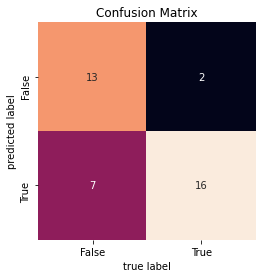

In [189]:
lucem_illud.plotConfusionMatrix(bag, test_data_df)

In [190]:
# random forest
clf_forest = sklearn.ensemble.RandomForestClassifier()
clf_forest.fit(np.stack(train_data_df['vect'], axis =0), train_data_df['category'])

RandomForestClassifier()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


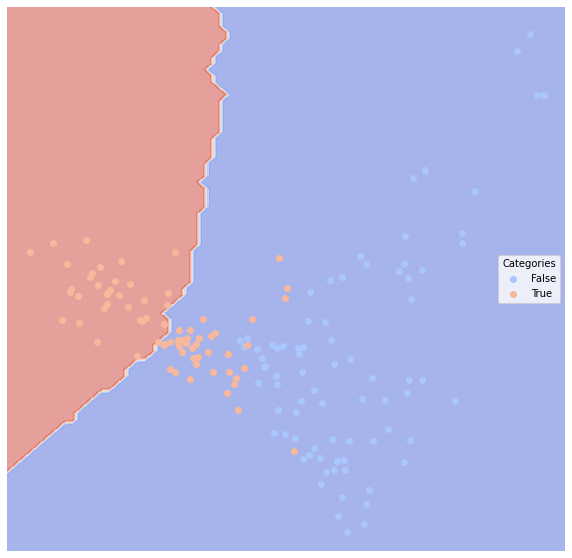

In [191]:
lucem_illud.plotregions(clf_forest, train_data_df)

In [193]:
sklearn.metrics.accuracy_score(test_data_df['category'],clf_forest.predict(np.stack(test_data_df['vect'], axis = 0)))

0.868421052631579

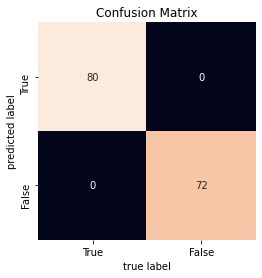

In [195]:
lucem_illud.plotConfusionMatrix(clf_forest, train_data_df)

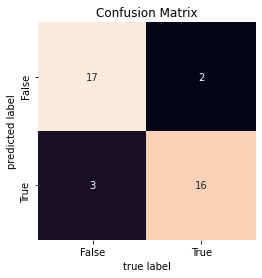

In [194]:
lucem_illud.plotConfusionMatrix(clf_forest, test_data_df)

In [200]:
lucem_illud.evaluateClassifier(clf_forest, train_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.0,1.0,1.0,1.0,1.0
True,0.0,1.0,1.0,1.0,1.0


In [201]:
lucem_illud.evaluateClassifier(clf_forest, test_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.131579,0.869444,0.894737,0.839474,0.850000
True,0.131579,0.869444,0.842105,0.801170,0.888889


In [197]:
lucem_illud.evaluateClassifier(clf_tree, train_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.078947,0.922917,0.959459,0.910731,0.887500
True,0.078947,0.922917,0.884615,0.867493,0.958333


In [196]:
lucem_illud.evaluateClassifier(clf_tree, test_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.263158,0.744444,0.857143,0.724812,0.600000
True,0.263158,0.744444,0.666667,0.645224,0.888889


In [198]:
lucem_illud.evaluateClassifier(bag, train_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.019737,0.98125,1.00,0.982237,0.9625
True,0.019737,0.98125,0.96,0.960000,1.0000


In [199]:
lucem_illud.evaluateClassifier(bag, test_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.236842,0.769444,0.866667,0.747544,0.650000
True,0.236842,0.769444,0.695652,0.670989,0.888889


Among all these models, random forest perform the best--with an AUC of rounded to 1. Then emsemble learning ranks the second, and decision tree performs the worst--the AUC is 0.76 and recall for False is only 0.60 for prediction on testing data.

In [220]:
extr.head(1)

,text,vect,pca,pca_reduced_10
0,"# Overview\n\nLast March, we posted a [megathr...","[0.0, 0.07402212275454959, 0.0, 0.009493007104...","[0.04689033723183114, -0.2830850506392036, 0.2...","[0.04689033723183114, -0.2830850506392036, 0.2..."


# K-Nearest Neighbors

The K-Nearest neighbors classifier takes a simpler premise than those before: Find the closest labeled datapoint in set and "borrow" its label.

Let's use newsgroup data again.

In [221]:
newsgroupsDF[:5]

,text,category,source_file,tokenized_text,normalized_text
0,\n\nParadise and salvation are not the same th...,talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...,"[Paradise, and, salvation, are, not, the, same...","[paradise, salvation, thing, salvation, well, ..."
1,\nYou're admitting a lot more than that. You ...,talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...,"[You, 're, admitting, a, lot, more, than, that...","[admit, lot, admit, moral, situational, admit,..."
2,"\n\nJesus also recognized other holy days, lik...",talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...,"[Jesus, also, recognized, other, holy, days, l...","[jesus, recognize, holy, day, like, passover, ..."
3,In <lsjc8cINNmc1@saltillo.cs.utexas.edu> turpi...,talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...,"[In, <, lsjc8cINNmc1@saltillo.cs.utexas.edu, >...","[<, lsjc8cinnmc1@saltillo.cs.utexas.edu, >, tu..."
4,"\nI'm sorry, but He does not! Ever read the F...",talk.religion.misc,../data\20news_home\20news-bydate-train\talk.r...,"[I, 'm, sorry, but, He, does, not, Ever, read,...","[be, sorry, read, commandment]"


Make a testing and training set:

In [203]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

Let's initialize our k-nearest neighbors classifier:

In [204]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

Let's try to classify using the TF-IDF vectors:

In [205]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

In [206]:
clf_knearest.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

KNeighborsClassifier(n_neighbors=15)

In [207]:
lucem_illud.evaluateClassifier(clf_knearest, train_ng_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
talk.religion.misc,0.352873,0.610311,0.254688,0.217234,0.554422
sci.space,0.279745,0.611167,0.494350,0.356842,0.366109
soc.religion.christian,0.290772,0.528294,0.412587,0.293160,0.123950
comp.graphics,0.327916,0.625636,0.423208,0.352706,0.522105


And lets look at the testing data

In [208]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = clf_knearest.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.23488372093023255


Let's produce another confusion matrix:

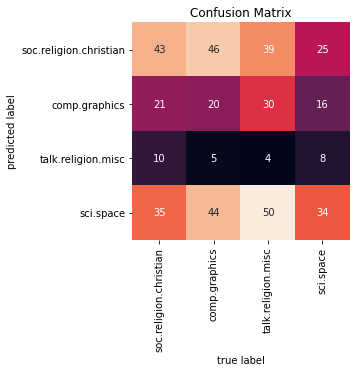

In [209]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_ng_df)

You can produce the PCA space visual if you want, altough it can take a very long time, so we'll leave it optionally commented out:

In [210]:
#lucem_illud.plotregions(clf_knearest, test_ng_df)

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">In the cells immediately following, perform and visualize k-nearest neighbor classification using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. Visualize the classification of data points and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Articulate how the *k*-nearest neighbor approach relates to *k*-means clustering explored in ***week 3***?

In [211]:
n_neighbors = 5
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

In [212]:
clf_knearest.fit(np.stack(train_data_df['vect'], axis = 0), train_data_df['category'])

KNeighborsClassifier()

In [213]:
lucem_illud.evaluateClassifier(clf_knearest, train_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.026316,0.972917,0.963415,0.957951,0.987500
True,0.026316,0.972917,0.985714,0.964380,0.958333


In [214]:
lucem_illud.evaluateClassifier(clf_knearest, test_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.078947,0.925,1.000000,0.928947,0.85
True,0.078947,0.925,0.857143,0.857143,1.00


In [215]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_data_df['knn_predict'] = clf_knearest.predict(np.stack(test_data_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

Testing score:
0.9210526315789473


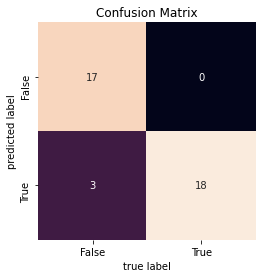

In [216]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_data_df)

k-Means Clustering is an unsupervised learning algorithm that is used for clustering whereas KNN is a supervised learning algorithm used for classification.

The k-means algorithm is an unsupervised clustering algorithm. It takes a bunch of unlabeled points and tries to group them into “k” number of clusters.

The k-nearest neighbors algorithm is a supervised classification algorithm. It takes a bunch of labeled points and uses them to learn how to label other points. 

# SVMs

Now we will examine Support Vector Machines, an approach that creates the partition that preserves the "maximum margin" between classes.

We will use a few sub forums from reddit--which tend to share text rather than memes--namely `talesfromtechsupport`, `badroommates`, `weeabootales` and `relationships`. The top 100 text posts from each have been saved to `data/reddit.csv`.

In [222]:
redditDf = pandas.read_csv('../data/reddit.csv', index_col = 0)

#Drop a couple missing values

redditDf = redditDf.dropna()

#Set category

redditDf['category'] = redditDf['subreddit']

#tokenize and normalize
redditDf['tokenized_text'] = redditDf['text'].apply(lambda x: lucem_illud.word_tokenize(x))
redditDf['normalized_text'] = redditDf['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

We will tf.idf the data to make our vectors:

In [223]:
redditTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
redditTFVects = redditTFVectorizer.fit_transform([' '.join(l) for l in redditDf['normalized_text']])
redditDf['vect'] = [np.array(v).flatten() for v in redditTFVects.todense()]

Initilize the model and make a train test split:

In [224]:
holdBackFraction = .2
train_redditDf, test_redditDf = lucem_illud.trainTestSplit(redditDf, holdBackFraction=holdBackFraction)

In [225]:
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
#probability = True is slower but  lets you call predict_proba()
clf_svm.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

SVC(kernel='linear')

...and consider the results:

In [226]:
lucem_illud.evaluateClassifier(clf_svm, test_redditDf)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Tales From Tech Support,0.012539,0.985271,0.979592,0.965870,0.979592
Relationships,0.018809,0.977682,0.944444,0.923730,0.971429
Bad Roommates: Tales of Irritation,0.009404,0.985553,0.987500,0.969387,0.975309
Weeaboo Tales: stories about the extreme fans of japanese culture,0.003135,0.992857,1.000000,0.988849,0.985714


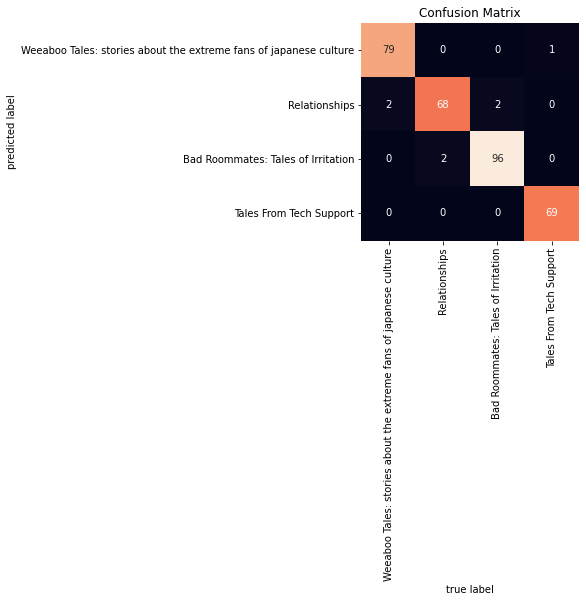

In [227]:
lucem_illud.plotConfusionMatrix(clf_svm, test_redditDf)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

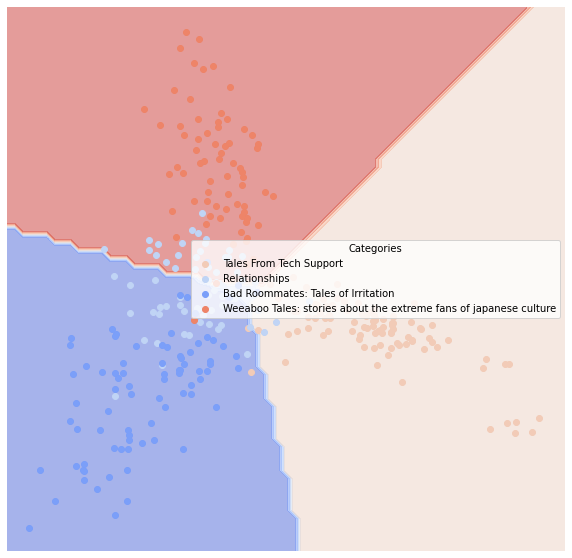

In [228]:
lucem_illud.plotregions(clf_svm, test_redditDf)

# Neural Nets

We include an example of a simple neural network, the Multi-layer Perceptron (MLP) that learns a function $f(\cdot): R^m \rightarrow R^o$ by training on a dataset, where $m$ is the number of dimensions for input and $o$ is the number of dimensions for output. Given a set of features $X = {x_1, x_2, ..., x_m}$ and a target $y$, it can learn a non-linear function approximator for either classification or regression. It is different from logistic regression, in that between the input and the output layer, there can be one or more non-linear layers, called hidden layers. The following figure shows a one hidden layer MLP with scalar output. ![title](../data/multilayerperceptron_network.png) The leftmost layer, known as the input layer, consists of a set of "neurons" $\{x_i | x_1, x_2, ..., x_m\}$ representing the input features (e.g., weighted words). Each neuron in the hidden layer transforms the values from the previous layer with a weighted linear summation $w_1x_1 + w_2x_2 + ... + w_mx_m$, followed by a non-linear activation function $g(\cdot):R \rightarrow R$ - like the logistic or hyperbolic tan function. The output layer receives the values from the last hidden layer and transforms them into output values.

In [229]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

MLPClassifier()

In [230]:
lucem_illud.evaluateClassifier(clf_nn, test_redditDf)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Tales From Tech Support,0.006270,0.992636,0.989796,0.982831,0.989796
Relationships,0.018809,0.982817,0.932432,0.922247,0.985714
Bad Roommates: Tales of Irritation,0.009404,0.981481,1.000000,0.972367,0.962963
Weeaboo Tales: stories about the extreme fans of japanese culture,0.009404,0.983706,0.985507,0.963619,0.971429


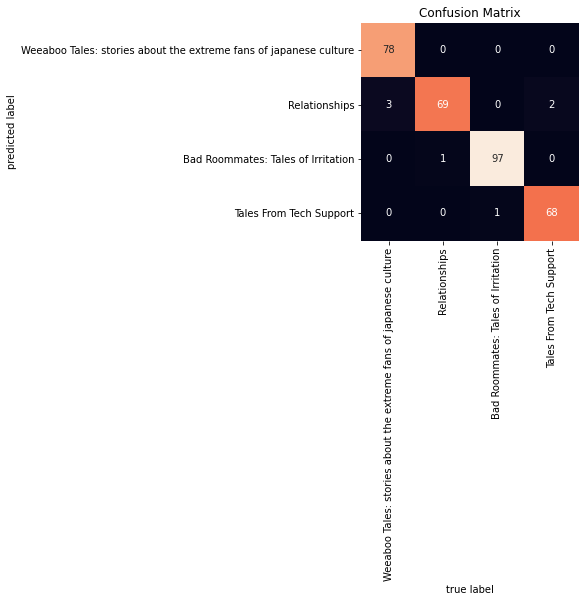

In [231]:
lucem_illud.plotConfusionMatrix(clf_nn, test_redditDf)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

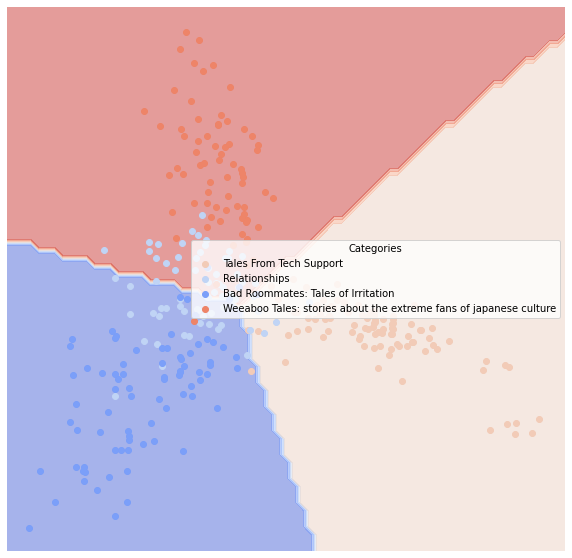

In [232]:
lucem_illud.plotregions(clf_nn, test_redditDf)

It performs very well.

## <span style="color:red">*Exercise 5*</span>

<span style="color:red">In the cells immediately following, perform a neural network classification and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). How does this classify relevant to *k*-nearest neighbor, Naive Bayes, logistic and decision-tree approaches?

In [234]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])

MLPClassifier()

In [235]:
lucem_illud.evaluateClassifier(clf_nn, test_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.078947,0.925,1.000000,0.928947,0.85
True,0.078947,0.925,0.857143,0.857143,1.00


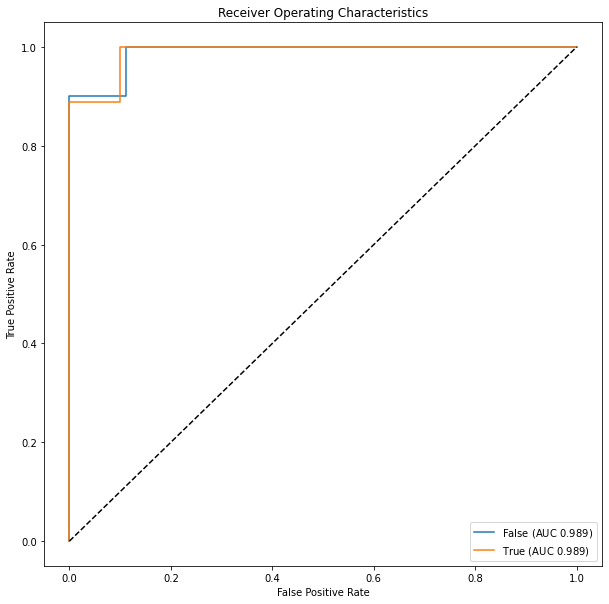

In [238]:
lucem_illud.plotMultiROC(clf_nn, test_data_df)

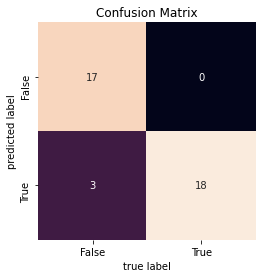

In [236]:
lucem_illud.plotConfusionMatrix(clf_nn, test_data_df)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


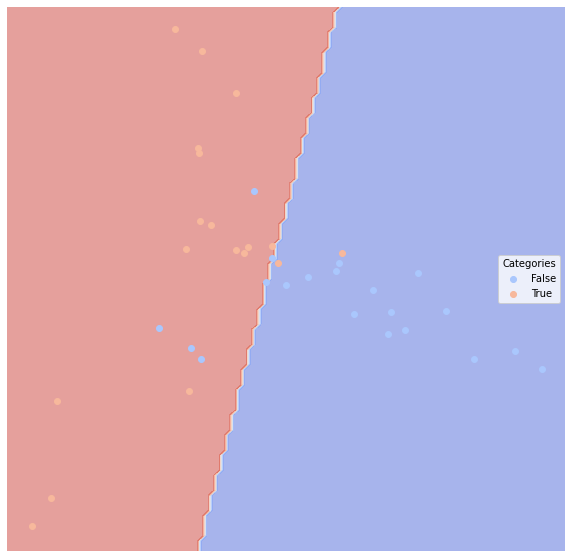

In [237]:
lucem_illud.plotregions(clf_nn, test_data_df)

Again, the neural network model perform really well, perhaps because the boundary in my data is so obvious (in different subreddit, people talks so differently and it's easy to be detected by the algorithms. In my case, the neural network performs almost equally well with other approaches. But overall, the decision tree is the best.